**AC-GAN (Used for generating the synthetic MRI images of Brain Tumor)**

In [ ]:
# python package used for showing the progress bar during the training so that proper tracking can be done regarding the
# training progress.

!pip install tqdm

In [ ]:
# The real dataset is zipped up in file called datasets_images which is extracted using this block of code for proper
# access of the datasets

import zipfile
import os

zip_file = '/content/dataset_images.zip' # Location of zip file within notebook directory

# Getting the directory where the ZIP file is located to extract the contents
extract_to_directory = os.path.dirname(zip_file)

# Opening the zip file and extracting all the contents of the ZIP file to the specified directory

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_to_directory)

In [ ]:
# Importing all the necessary packages that has been used in the code

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import tensorflow.keras.backend as K
from tensorflow.keras import layers, models
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose, Embedding, Concatenate, multiply
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16
from keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from keras.utils import to_categorical
from tensorflow.keras.callbacks import LearningRateScheduler
from google.colab import files
from skimage.transform import rotate
from skimage.util import montage
import matplotlib as mpl
from tensorflow import keras
from tensorflow.keras.callbacks import CSVLogger
from tensorflow.keras import backend as K

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers.legacy import Adam
except ImportError:
    from keras.optimizers import Adam

In [ ]:
# Defining all the hyperparameters

NOISE_DIM = 100  # Dimension of the noise vector which is the input to the generator
BATCH_SIZE = 64  # Number of samples processed each time before the model is updated
STEPS_PER_EPOCH = 3750  # Number of steps (batches of samples processed) per epoch
EPOCHS = 6  # Total number of times the entire dataset is passed through the model during training
SEED = 40  # Seed for random number generation to ensure reproducibility
WIDTH, HEIGHT, CHANNELS = 128, 128, 1  # Dimensions of the input images (width, height, and number of channels)

# Separate learning rates used for balancing the rate of learning between generator and discriminator

GEN_LR = 0.0002  # Learning rate for the generator
DISC_LR = 0.0001  # Learning rate for the discriminator
GEN_OPTIMIZER = Adam(lr=GEN_LR, beta_1=0.5)  # Optimizer for the generator using the Adam algorithm with a specified learning rate and beta_1 parameter
DISC_OPTIMIZER = Adam(lr=DISC_LR, beta_1=0.5)  # Optimizer for the discriminator using the Adam algorithm with a specified learning rate and beta_1 parameter

In [ ]:
def load_images_and_masks(main_folder, subfolders):
  # Lists to store the loaded images, masks and the labels for each image
    imgs = []
    masks = []
    labels = []
    label_mapping = {folder: idx for idx, folder in enumerate(subfolders)} # Mapping subfolder names to integer labels
    valid_extensions = ('.png', '.jpg', '.jpeg') # Defining a valid image extensions

    for folder in subfolders:
        folder_path = os.path.join(main_folder, folder)
        for img_name in os.listdir(folder_path):
            if "_mask" in img_name or not img_name.lower().endswith(valid_extensions):
                continue # Skip mask files that don't have a valid image extension
            img_path = os.path.join(folder_path, img_name)

            # Attempting to find the corresponding mask file
            mask_name = None
            for ext in valid_extensions:
                if img_name.lower().endswith(ext):
                    mask_name = img_name[:-(len(ext))] + '_mask.png' # Constructing the filename for the mask file
                    break

            mask_path = os.path.join(folder_path, mask_name)

            if not os.path.exists(mask_path):
                print(f"Mask file does not exist: {mask_path}")
                continue

            try:
                img = cv2.imread(img_path) # Reading the image file using openCV
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # converting image to grayscale
                img = cv2.resize(img, (128, 128)) # Resizing the image to 128x128 pixels

                # Reading the mask as grayscale iamge and resizing it to 128x128 pixels
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                mask = cv2.resize(mask, (128, 128))

                # Appending the images and masks to their respective lists
                imgs.append(img)
                masks.append(mask)
                labels.append(label_mapping[folder])
            except Exception as e:
                print(f"Error loading image or mask {img_path} / {mask_path}: {e}")
                continue

    # Converting the lists to numpy arrays for efficiency, Compatibility with ML Libraries, Vectorized Operations, Effective Batch Processing and Consistency
    imgs = np.array(imgs)
    masks = np.array(masks)
    labels = np.array(labels)

    return imgs, masks, labels

In [ ]:
main_folder = 'dataset_images' # Specifies the main directory where all the subfolders containing the images and masks are located
subfolders = ['healthy', 'glioma', 'meningioma', 'pituitary'] # Lists the names of the subfolders, each representing a different class or category
data, masks, labels = load_images_and_masks(main_folder, subfolders) # Loading the images, masks, and labels using the previously defined function
print(data.shape, masks.shape, labels.shape)

(5490, 128, 128) (5490, 128, 128) (5490,)


In [ ]:
# Split the data into training (80%) and temporary (20%) sets
X_train_org, X_temp_org, y_train_org, y_temp_org, z_train_org, z_temp_org = train_test_split(data, labels, masks, test_size=0.25, random_state=42)

# Split the temporary set equally into validation and test sets (10% each of the total dataset)
X_val_org, X_test_org, y_val_org, y_test_org, z_val_org, z_test_org = train_test_split(X_temp_org, y_temp_org, z_temp_org, test_size=0.5, random_state=42)

In [ ]:
# Printing the shapes of the data in training, validation and test sets
print("Training set shape:", X_train_org.shape, y_train_org.shape, z_train_org.shape)
print("Validation set shape:", X_val_org.shape, y_val_org.shape, z_val_org.shape)
print("Test set shape:", X_test_org.shape, y_test_org.shape, z_test_org.shape)

Training set shape: (4117, 128, 128) (4117,) (4117, 128, 128)
Validation set shape: (686, 128, 128) (686,) (686, 128, 128)
Test set shape: (687, 128, 128) (687,) (687, 128, 128)


In [ ]:
X_train = (X_train_org.astype(np.float32) - 127.5) / 127.5 # Normalizing the image to the range [-1,1]

# Reshaping the data to correct format. Th -1 allows numpy to automatically calculate the size of dimension based on
# total number of elements and provided dimensions (WIDTH, HEIGHT, CHANNELS)
X_train = X_train.reshape(-1, WIDTH, HEIGHT, CHANNELS)

print(X_train.shape)
print(y_train_org.shape)

(4117, 128, 128, 1)
(4117,)


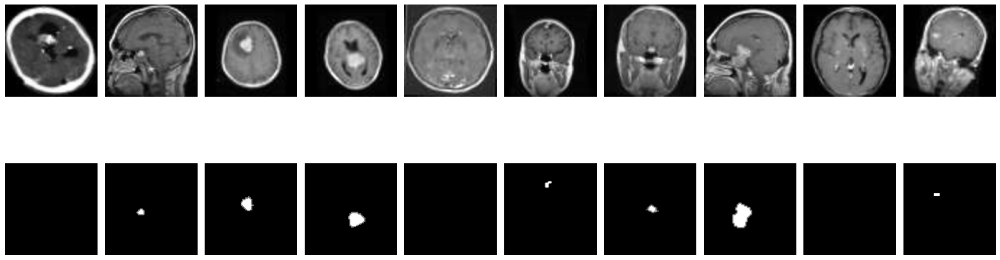

In [ ]:
plt.figure(figsize=(20, 8))  # Setting the size of the figure large enough to display the images and masks clearly

for i in range(10):  # Looping through the first 10 images and masks
    axs = plt.subplot(2, 10, i + 1)  # Create a subplot in a 2x10 grid for the images
    plt.imshow(X_train[i], cmap="gray")  # Display the image in grayscale
    plt.axis('off')  # Turn off the axis (no ticks or labels)
    axs.set_xticklabels([])  # Ensuring no x-tick labels are shown
    axs.set_yticklabels([])  # Ensuring no y-tick labels are shown

    # Plot corresponding mask
    axs = plt.subplot(2, 10, i + 11)  # Create a subplot in the next row of the grid for the masks
    plt.imshow(z_train_org[i], cmap="gray")  # Display the corresponding mask in grayscale
    plt.axis('off')  # Turn off the axis (no ticks or labels)
    axs.set_xticklabels([])  # Ensuring no x-tick labels are shown
    axs.set_yticklabels([])  # Ensuring no y-tick labels are shown

plt.subplots_adjust(wspace=0.05, hspace=0.05)  # Adjust the spacing between subplots for a good spacing layout
plt.tight_layout()  # Automatically adjust the subplot parameters to give specified padding
plt.show()  # Display the plot


In [ ]:
# code used and inspired from: (Generating Brain MRI Images with DC-GAN)
# https://www.kaggle.com/code/harshsingh2209/generating-brain-mri-images-with-dc-gan

# This function builds the generator model for a GAN
def build_generator():
    noise = Input(shape=(NOISE_DIM,))  # The noise vector which is the input for generator with dimension specified by NOISE_DIM
    label = Input(shape=(1,), dtype='int32')  # Input representing class label, which is a single integer representing four different subclasses

    # Embedding layer to convert the label into a dense vector of size NOISE_DIM along with flattening it into 1D vector for effective multiplication
    # and as well as for further processing through the model
    label_embedding = Flatten()(Embedding(len(subfolders), NOISE_DIM)(label))

    # Element-wise multiplication of the noise vector with the label embedding
    model_input = multiply([noise, label_embedding])

    # First dense layer, outputting a tensor with shape (32 * 32 * 256)
    x = Dense(32 * 32 * 256)(model_input)
    x = LeakyReLU(alpha=0.2)(x)  # LeakyReLU activation function is applied with a small negative slope (alpha=0.2)
    x = Reshape((32, 32, 256))(x)  # Reshape the output to 32x32x256, which will be the starting point for upsampling. Coverts the 1D array to
                                   # 3D tensor having the spatial dimensions as well

    # First transposed convolution (deconvolution) layer to upscale the image to 64x64x128 with leakyRelu activation
    x = Conv2DTranspose(128, (4, 4), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Second transposed convolution (deconvolution) layer to upscale the image to 128x128x128 with leakyRelu activation
    x = Conv2DTranspose(128, (4, 4), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Final transposed convolution layer to produce the output image with the specified number of channels i.e. (128x128)
    out = Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')(x)  # Tanh activation is used to map output values to the range [-1, 1]

    # Create the model with noise and label inputs, and the generated image as output
    model = Model([noise, label], out)
    model.summary()  # Print a summary of the model architecture
    return model  # Returns the generator model


In [ ]:
# code used and inspired from: (Generating Brain MRI Images with DC-GAN)
# https://www.kaggle.com/code/harshsingh2209/generating-brain-mri-images-with-dc-gan

# This function builds the Discriminator model for a GAN
def build_discriminator():
    img = Input(shape=(WIDTH, HEIGHT, CHANNELS))  # Input layer for the discriminator, accepting batches of real and fake images of specified dimensions

    # Conv2D represents the convolutional layers to extract the features from the provided input and also downsamples the spatial dimensions
    # of the feature maps in each convolutional step.

    # First convolutional layer with 64 filters, 3x3 kernel size, 'same' padding and LeakyReLU activation function with a small negative slope (alpha=0.2)
    x = Conv2D(64, (3, 3), padding='same')(img)
    x = LeakyReLU(alpha=0.2)(x)

    # Second convolutional layer with 128 filters for similar operation
    x = Conv2D(128, (3, 3), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Third convolutional layer with 128 filters for similar operation
    x = Conv2D(128, (3, 3), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Fourth convolutional layer with 256 filters for similar operation
    x = Conv2D(256, (3, 3), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Flatten()(x)  # Flatten the tensor into a 1D vector as expected by the dense layer
    x = Dropout(0.4)(x)  # Dropout set to a rate of 0.4 to prevent overfitting. Dropout inactivates the 40% of neurons during learning
                         # and training process thus preventing the overfitting.

    # Output layer with one neuron for validity (real or fake), using sigmoid activation
    validity = Dense(1, activation='sigmoid')(x)

    # Output layer with 4 neurons for label classification, using softmax activation to predict the class label
    label = Dense(len(subfolders), activation='softmax')(x)

    # Create the model with the input image and two outputs: validity and label
    model = Model(img, [validity, label])
    model.summary()
    return model

In [ ]:
# Instantiating the discriminator and generator models

discriminator = build_discriminator()  # Creates the discriminator model that will evaluate the authenticity of generated images
generator = build_generator()  # Creates the generator model that will generate images from noise and class label

# Compile the discriminator model
# The discriminator has two outputs, so it requires two loss functions:
# - 'binary_crossentropy' for determining if the image is real or fake (Adversial loss)
# - 'categorical_crossentropy' for predicting the class of the image (Classification loss)
discriminator.compile(loss=['binary_crossentropy', 'categorical_crossentropy'], optimizer=DISC_OPTIMIZER)

noise = Input(shape=(NOISE_DIM,))  # Noise input for the generator
label = Input(shape=(1,))  # Label input for the generator, which conditions the generated image on a specific class

# Generate an image using the generator model
img = generator([noise, label])  # The generator creates an image based on the noise vector and the class label

# Freeze the discriminator's weights to ensure that only the generator is trained during the combined model's training
discriminator.trainable = False

# The discriminator then evaluates the generated image
valid, target_label = discriminator(img)  # The discriminator returns the validity (real/fake) and predicted label of the generated image

# Create the combined model, linking the generator and discriminator
# The combined model takes noise and label as input and outputs the validity and predicted label
combined = Model([noise, label], [valid, target_label])

# Compile the combined model
# Similar to the discriminator, the combined model uses:
# - 'binary_crossentropy' to measure how well the generator is fooling the discriminator
# - 'categorical_crossentropy' to measure the accuracy of the predicted label
combined.compile(loss=['binary_crossentropy', 'categorical_crossentropy'], optimizer=GEN_OPTIMIZER)

print("The Combined Network:\n")
combined.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         640       ['input_1[0][0]']             
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 64, 64, 128)          73856     ['leaky_re_lu[0][0]']         
                                                                                              

In [ ]:
def sample_images(input_data, subplots, figsize=(22, 8), save=False):
    noise, sampled_labels = input_data  # Segregate the input data into noise vectors and sampled labels
    generated_images = generator.predict([noise, sampled_labels])      # Generate images using the generator model based on the noise and labels


    plt.figure(figsize=figsize) # Set up the figure with the specified size to hold the subplots

    for i, (image, label) in enumerate(zip(generated_images, sampled_labels)):
        plt.subplot(subplots[0], subplots[1], i + 1)
        plt.title(subfolders[label[0]])

        if CHANNELS == 1:  # If the image is grayscale (single channel), display it with a grayscale color map
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')
        else:  # If the image has multiple channels (like RGB), display it with default colors
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))

        if save:  # If save is True, save the image to a file with a generated name
            img_name = "gen" + str(i)  # Create a filename for the image
            plt.savefig(img_name)  # Save the image to disk

        plt.subplots_adjust(wspace=None, hspace=None)  # Adjust the space between subplots
        plt.axis('off')  # Turn off the axis for a cleaner display

    plt.tight_layout()
    plt.show()


  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 1/3750 [00:00<25:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 2/3750 [00:00<25:06,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 3/3750 [00:01<25:08,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<25:05,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<25:08,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<25:15,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 7/3750 [00:02<25:19,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 8/3750 [00:03<25:17,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<25:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<25:16,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 11/3750 [00:04<25:15,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 12/3750 [00:04<25:11,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 13/3750 [00:05<25:11,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 14/3750 [00:05<25:07,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<25:08,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:06<28:55,  2.15it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 17/3750 [00:07<27:45,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<26:59,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:07<26:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 20/3750 [00:08<25:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<25:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:09<25:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 23/3750 [00:09<25:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 24/3750 [00:09<25:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 25/3750 [00:10<25:07,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 26/3750 [00:10<25:05,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:02,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 28/3750 [00:11<25:02,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 29/3750 [00:11<24:58,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:01,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 31/3750 [00:12<24:56,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<24:55,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<25:03,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 34/3750 [00:13<25:01,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<24:56,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 36/3750 [00:14<24:56,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<24:55,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 38/3750 [00:15<24:57,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:15<24:58,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 40/3750 [00:16<24:59,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 41/3750 [00:16<24:54,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 42/3750 [00:17<24:59,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:17<24:55,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:17<24:53,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 45/3750 [00:18<24:50,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 46/3750 [00:18<24:50,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 47/3750 [00:19<24:53,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 48/3750 [00:19<24:52,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:19<24:46,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 50/3750 [00:20<24:52,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:20<24:58,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 52/3750 [00:21<25:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 53/3750 [00:21<25:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 54/3750 [00:22<25:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 55/3750 [00:22<25:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 56/3750 [00:22<25:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 57/3750 [00:23<24:56,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:23<24:52,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 59/3750 [00:24<24:57,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 60/3750 [00:24<24:53,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 61/3750 [00:24<24:50,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 62/3750 [00:25<24:51,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 63/3750 [00:25<24:49,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:26<24:49,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 65/3750 [00:26<24:44,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 66/3750 [00:26<24:42,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:27<24:48,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 68/3750 [00:27<24:49,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 69/3750 [00:28<24:51,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 70/3750 [00:28<24:48,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:28<24:42,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:29<24:41,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 73/3750 [00:29<24:40,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 74/3750 [00:30<24:40,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:30<24:36,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 76/3750 [00:30<24:43,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:31<24:43,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 78/3750 [00:31<24:45,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:32<24:41,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:32<24:39,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:32<24:35,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:33<24:36,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 83/3750 [00:33<24:31,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 84/3750 [00:34<24:31,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 85/3750 [00:34<24:38,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 86/3750 [00:34<24:42,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:35<24:41,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:35<24:42,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:36<24:40,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:36<24:39,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:36<24:35,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:37<24:33,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 93/3750 [00:37<24:27,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 94/3750 [00:38<24:37,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 95/3750 [00:38<24:33,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 96/3750 [00:39<25:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 97/3750 [00:39<25:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 98/3750 [00:39<25:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 99/3750 [00:40<24:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:40<24:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 101/3750 [00:41<24:30,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 102/3750 [00:41<24:27,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 103/3750 [00:41<24:32,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 104/3750 [00:42<24:34,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 105/3750 [00:42<24:29,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 106/3750 [00:43<24:29,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 107/3750 [00:43<24:24,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 108/3750 [00:43<24:26,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 109/3750 [00:44<24:25,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 110/3750 [00:44<24:28,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 111/3750 [00:45<24:23,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 112/3750 [00:45<24:30,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 113/3750 [00:45<24:25,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 114/3750 [00:46<24:28,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 115/3750 [00:46<24:22,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:47<24:24,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 117/3750 [00:47<24:24,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 118/3750 [00:47<24:24,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:48<24:19,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 120/3750 [00:48<24:19,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:49<24:18,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:49<24:27,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:49<24:29,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 124/3750 [00:50<24:25,  2.47it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 125/3750 [00:50<24:25,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:51<24:25,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 127/3750 [00:51<24:24,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 128/3750 [00:51<24:18,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 129/3750 [00:52<24:23,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 130/3750 [00:52<24:19,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:53<24:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:53<24:27,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:53<24:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 134/3750 [00:54<24:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:54<24:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 136/3750 [00:55<24:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 137/3750 [00:55<24:24,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 138/3750 [00:55<24:18,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 139/3750 [00:56<24:18,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 140/3750 [00:56<24:22,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:57<24:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:57<24:21,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 143/3750 [00:57<24:20,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 144/3750 [00:58<24:19,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [00:58<24:20,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [00:59<24:18,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 147/3750 [00:59<24:19,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:00<24:15,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:00<24:19,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:00<24:19,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 151/3750 [01:01<24:13,  2.48it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 152/3750 [01:01<24:17,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:02<24:12,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:02<24:15,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 155/3750 [01:02<24:12,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 156/3750 [01:03<24:12,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 157/3750 [01:03<24:05,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 158/3750 [01:04<24:14,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 159/3750 [01:04<24:14,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 160/3750 [01:04<24:11,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:05<24:06,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 162/3750 [01:05<24:04,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:06<24:00,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 164/3750 [01:06<24:01,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 165/3750 [01:06<23:56,  2.50it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:07<23:59,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 167/3750 [01:07<24:04,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:08<24:05,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 169/3750 [01:08<24:03,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 170/3750 [01:08<24:03,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 171/3750 [01:09<24:04,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:09<24:07,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:10<24:06,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 174/3750 [01:10<24:06,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:10<24:02,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 176/3750 [01:11<24:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:11<24:06,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:12<24:05,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 179/3750 [01:12<24:04,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 180/3750 [01:12<24:06,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 181/3750 [01:13<24:04,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 182/3750 [01:13<24:04,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 183/3750 [01:14<24:03,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:14<24:05,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 185/3750 [01:14<24:07,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 186/3750 [01:15<24:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 187/3750 [01:15<24:04,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 188/3750 [01:16<24:02,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:16<23:58,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 190/3750 [01:16<23:57,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 191/3750 [01:17<23:54,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 192/3750 [01:17<23:52,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:18<23:52,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:18<24:00,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 195/3750 [01:19<23:55,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 196/3750 [01:19<23:53,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:19<23:51,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 198/3750 [01:20<23:52,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 199/3750 [01:20<23:50,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 200/3750 [01:21<23:48,  2.48it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 201/3750 [01:21<23:47,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 202/3750 [01:21<23:47,  2.49it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 203/3750 [01:22<23:57,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:22<24:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 205/3750 [01:23<24:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 206/3750 [01:23<24:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:23<23:55,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 208/3750 [01:24<24:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 209/3750 [01:24<24:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 210/3750 [01:25<24:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 211/3750 [01:25<24:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 212/3750 [01:25<24:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 213/3750 [01:26<24:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:26<23:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:27<23:51,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 216/3750 [01:27<23:50,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 217/3750 [01:27<23:47,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [01:28<23:50,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:28<23:48,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:29<23:49,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 221/3750 [01:29<23:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 222/3750 [01:29<23:53,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 223/3750 [01:30<23:50,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 224/3750 [01:30<23:50,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [01:31<23:49,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [01:31<23:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 227/3750 [01:31<23:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:32<23:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 229/3750 [01:32<23:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 230/3750 [01:33<23:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 231/3750 [01:33<23:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:34<23:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:34<23:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 234/3750 [01:34<23:55,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 235/3750 [01:35<23:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:35<23:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:36<23:42,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 238/3750 [01:36<23:43,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 239/3750 [01:36<23:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 240/3750 [01:37<23:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 241/3750 [01:37<23:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:38<23:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 243/3750 [01:38<23:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:38<23:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 245/3750 [01:39<23:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 246/3750 [01:39<23:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:40<23:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 248/3750 [01:40<23:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:40<23:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:41<23:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:41<23:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 252/3750 [01:42<23:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:42<23:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:42<23:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 255/3750 [01:43<23:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 256/3750 [01:43<23:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 257/3750 [01:44<23:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 258/3750 [01:44<23:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [01:45<23:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 260/3750 [01:45<23:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:45<23:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 262/3750 [01:46<23:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 263/3750 [01:46<23:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:47<23:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 265/3750 [01:47<23:40,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 266/3750 [01:47<23:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 267/3750 [01:48<23:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 268/3750 [01:48<23:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 269/3750 [01:49<23:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:49<23:50,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 271/3750 [01:49<23:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [01:50<23:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 273/3750 [01:50<23:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 274/3750 [01:51<23:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:51<23:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 276/3750 [01:52<23:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:52<23:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 278/3750 [01:52<23:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:53<23:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 280/3750 [01:53<23:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 281/3750 [01:54<23:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 282/3750 [01:54<23:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 283/3750 [01:54<23:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:55<23:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:55<23:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 286/3750 [01:56<23:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 287/3750 [01:56<23:35,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 288/3750 [01:56<23:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [01:57<23:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 290/3750 [01:57<23:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [01:58<23:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 292/3750 [01:58<23:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [01:58<23:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [01:59<23:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 295/3750 [01:59<23:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 296/3750 [02:00<23:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 297/3750 [02:00<23:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 298/3750 [02:01<23:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 299/3750 [02:01<23:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [02:01<23:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [02:02<23:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:02<23:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 303/3750 [02:03<23:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 304/3750 [02:03<23:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 305/3750 [02:03<23:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 306/3750 [02:04<23:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 307/3750 [02:04<23:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:05<23:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 309/3750 [02:05<23:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:05<23:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:06<23:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:06<23:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:07<23:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 314/3750 [02:07<23:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:08<23:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 316/3750 [02:08<23:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:08<23:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:09<23:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:09<23:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:10<23:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:10<23:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 322/3750 [02:10<23:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:11<23:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 324/3750 [02:11<23:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 325/3750 [02:12<23:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 326/3750 [02:12<23:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 327/3750 [02:12<23:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 328/3750 [02:13<23:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:13<23:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 330/3750 [02:14<23:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 331/3750 [02:14<23:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 332/3750 [02:14<23:26,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 333/3750 [02:15<23:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:15<23:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:16<23:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 336/3750 [02:16<23:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 337/3750 [02:17<23:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:17<23:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 339/3750 [02:17<23:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:18<23:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:18<23:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 342/3750 [02:19<23:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:19<23:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 344/3750 [02:19<23:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 345/3750 [02:20<23:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 346/3750 [02:20<23:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 347/3750 [02:21<23:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 348/3750 [02:21<23:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 349/3750 [02:21<23:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 350/3750 [02:22<23:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 351/3750 [02:22<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:23<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 353/3750 [02:23<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 354/3750 [02:24<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 355/3750 [02:24<23:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 356/3750 [02:24<23:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 357/3750 [02:25<23:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 358/3750 [02:25<23:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 359/3750 [02:26<23:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 360/3750 [02:26<23:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 361/3750 [02:26<23:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 362/3750 [02:27<23:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 363/3750 [02:27<23:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:28<23:04,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 365/3750 [02:28<23:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 366/3750 [02:28<23:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:29<23:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 368/3750 [02:29<23:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:30<23:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:30<23:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 371/3750 [02:30<22:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:31<23:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:31<22:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 374/3750 [02:32<22:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:32<22:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 376/3750 [02:33<23:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 377/3750 [02:33<22:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 378/3750 [02:33<22:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 379/3750 [02:34<22:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:34<22:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 381/3750 [02:35<22:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 382/3750 [02:35<22:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 383/3750 [02:35<22:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:36<22:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:36<22:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 386/3750 [02:37<22:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 387/3750 [02:37<22:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 388/3750 [02:37<22:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 389/3750 [02:38<22:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 390/3750 [02:38<22:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [02:39<22:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [02:39<22:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 393/3750 [02:39<22:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 394/3750 [02:40<22:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:40<22:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 396/3750 [02:41<22:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 397/3750 [02:41<22:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 398/3750 [02:42<23:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:42<23:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 400/3750 [02:42<23:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:43<23:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 402/3750 [02:43<22:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 403/3750 [02:44<22:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 404/3750 [02:44<23:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 405/3750 [02:44<22:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:45<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:45<22:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 408/3750 [02:46<22:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 409/3750 [02:46<22:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 410/3750 [02:46<22:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:47<22:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:47<22:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:48<22:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 414/3750 [02:48<22:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 415/3750 [02:49<22:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:49<22:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 417/3750 [02:49<22:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 418/3750 [02:50<22:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 419/3750 [02:50<22:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 420/3750 [02:51<22:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:51<22:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 422/3750 [02:51<22:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 423/3750 [02:52<22:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:52<22:34,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 425/3750 [02:53<22:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 426/3750 [02:53<22:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:53<22:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:54<22:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 429/3750 [02:54<22:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 430/3750 [02:55<22:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 431/3750 [02:55<22:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [02:55<22:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [02:56<22:36,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 434/3750 [02:56<22:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [02:57<22:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [02:57<22:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [02:57<22:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 438/3750 [02:58<22:33,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 439/3750 [02:58<22:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 440/3750 [02:59<22:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [02:59<22:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 442/3750 [03:00<22:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 443/3750 [03:00<22:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 444/3750 [03:00<22:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:01<22:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:01<22:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:02<22:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 448/3750 [03:02<22:16,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 449/3750 [03:02<22:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 450/3750 [03:03<22:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:03<22:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:04<22:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:04<22:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 454/3750 [03:04<22:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:05<22:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 456/3750 [03:05<22:14,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:06<22:14,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 458/3750 [03:06<22:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:06<22:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:07<22:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 461/3750 [03:07<22:19,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 462/3750 [03:08<22:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 463/3750 [03:08<22:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 464/3750 [03:08<22:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 465/3750 [03:09<22:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 466/3750 [03:09<22:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 467/3750 [03:10<22:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:10<22:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:11<22:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:11<22:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 471/3750 [03:11<22:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 472/3750 [03:12<22:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:12<22:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:13<22:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 475/3750 [03:13<22:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 476/3750 [03:13<22:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:14<22:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 478/3750 [03:14<22:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:15<22:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 480/3750 [03:15<22:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:15<22:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:16<22:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 483/3750 [03:16<22:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:17<22:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 485/3750 [03:17<22:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 486/3750 [03:17<22:06,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 487/3750 [03:18<22:03,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 488/3750 [03:18<22:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:19<22:00,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 490/3750 [03:19<22:01,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 491/3750 [03:19<21:59,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 492/3750 [03:20<22:03,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 493/3750 [03:20<22:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 494/3750 [03:21<22:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 495/3750 [03:21<22:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 496/3750 [03:22<22:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 497/3750 [03:22<22:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 498/3750 [03:22<22:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:23<22:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:23<22:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:24<21:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:24<21:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:24<22:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 504/3750 [03:25<22:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:25<22:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 506/3750 [03:26<22:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:26<22:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:26<21:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:27<21:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:27<21:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 511/3750 [03:28<21:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:28<21:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 513/3750 [03:28<21:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 514/3750 [03:29<22:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:29<22:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 516/3750 [03:30<21:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:30<21:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:30<22:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 519/3750 [03:31<21:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 520/3750 [03:31<21:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:32<22:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 522/3750 [03:32<22:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 523/3750 [03:33<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 524/3750 [03:33<22:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 525/3750 [03:33<22:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:34<22:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 527/3750 [03:34<21:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 528/3750 [03:35<21:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:35<21:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 530/3750 [03:35<21:50,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 531/3750 [03:36<21:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 532/3750 [03:36<21:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:37<21:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 534/3750 [03:37<21:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 535/3750 [03:37<21:49,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 536/3750 [03:38<21:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:38<21:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 538/3750 [03:39<21:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:39<21:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 540/3750 [03:39<21:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:40<21:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 542/3750 [03:40<21:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 543/3750 [03:41<21:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:41<21:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:42<21:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 546/3750 [03:42<21:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:42<21:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 548/3750 [03:43<21:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 549/3750 [03:43<22:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:44<22:17,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 551/3750 [03:44<22:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:44<22:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 553/3750 [03:45<21:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 554/3750 [03:45<21:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:46<21:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:46<21:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 557/3750 [03:46<21:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 558/3750 [03:47<21:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 559/3750 [03:47<21:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 560/3750 [03:48<21:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:48<21:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 562/3750 [03:48<21:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:49<21:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:49<21:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:50<21:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:50<21:34,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 567/3750 [03:51<21:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:51<21:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 569/3750 [03:51<21:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:52<21:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:52<21:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 572/3750 [03:53<21:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:53<21:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 574/3750 [03:53<21:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [03:54<21:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [03:54<21:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [03:55<21:41,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 578/3750 [03:55<21:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 579/3750 [03:55<21:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [03:56<21:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [03:56<21:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 582/3750 [03:57<21:35,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 583/3750 [03:57<21:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 584/3750 [03:57<21:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 585/3750 [03:58<21:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 586/3750 [03:58<21:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 587/3750 [03:59<21:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 588/3750 [03:59<21:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 589/3750 [03:59<21:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 590/3750 [04:00<21:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 591/3750 [04:00<21:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 592/3750 [04:01<21:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:01<21:25,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 594/3750 [04:02<21:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 595/3750 [04:02<21:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:02<21:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [04:03<21:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 598/3750 [04:03<21:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 599/3750 [04:04<21:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 600/3750 [04:04<21:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 601/3750 [04:04<21:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:05<21:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 603/3750 [04:05<21:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 604/3750 [04:06<21:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:06<21:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 606/3750 [04:06<21:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:07<21:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 608/3750 [04:07<21:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 609/3750 [04:08<21:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 610/3750 [04:08<21:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 611/3750 [04:08<21:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 612/3750 [04:09<21:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 613/3750 [04:09<21:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [04:10<21:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:10<21:15,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 616/3750 [04:11<21:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:11<21:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 618/3750 [04:11<21:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:12<21:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 620/3750 [04:12<21:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:13<21:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:13<21:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:13<21:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:14<21:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 625/3750 [04:14<21:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:15<21:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:15<21:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 628/3750 [04:15<21:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:16<21:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:16<21:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:17<21:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 632/3750 [04:17<21:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:17<21:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 634/3750 [04:18<21:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 635/3750 [04:18<21:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 636/3750 [04:19<21:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 637/3750 [04:19<21:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 638/3750 [04:19<21:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 639/3750 [04:20<21:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 640/3750 [04:20<21:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 641/3750 [04:21<21:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 642/3750 [04:21<21:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 643/3750 [04:22<21:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 644/3750 [04:22<21:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:22<21:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 646/3750 [04:23<21:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 647/3750 [04:23<20:57,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:24<20:57,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 649/3750 [04:24<21:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 650/3750 [04:24<21:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 651/3750 [04:25<21:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 652/3750 [04:25<21:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 653/3750 [04:26<21:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 654/3750 [04:26<21:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 655/3750 [04:26<20:58,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:27<21:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 657/3750 [04:27<20:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 658/3750 [04:28<21:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:28<20:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 660/3750 [04:28<20:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 661/3750 [04:29<20:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 662/3750 [04:29<20:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 663/3750 [04:30<20:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:30<20:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 665/3750 [04:30<20:58,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 666/3750 [04:31<21:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:31<21:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:32<21:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:32<21:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 670/3750 [04:33<21:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 671/3750 [04:33<20:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 672/3750 [04:33<20:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 673/3750 [04:34<20:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 674/3750 [04:34<20:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [04:35<20:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 676/3750 [04:35<20:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:35<20:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 678/3750 [04:36<20:50,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:36<20:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 680/3750 [04:37<20:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 681/3750 [04:37<20:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 682/3750 [04:37<20:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 683/3750 [04:38<20:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:38<20:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 685/3750 [04:39<20:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 686/3750 [04:39<20:52,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 687/3750 [04:39<20:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:40<20:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:40<20:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 690/3750 [04:41<20:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 691/3750 [04:41<20:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 692/3750 [04:42<20:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 693/3750 [04:42<20:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 694/3750 [04:42<20:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:43<20:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:43<20:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 697/3750 [04:44<20:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 698/3750 [04:44<20:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 699/3750 [04:44<21:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:45<21:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 701/3750 [04:45<21:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 702/3750 [04:46<20:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 703/3750 [04:46<20:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 704/3750 [04:46<20:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 705/3750 [04:47<20:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:47<20:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:48<20:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 708/3750 [04:48<20:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 709/3750 [04:48<20:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 710/3750 [04:49<20:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:49<20:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 712/3750 [04:50<20:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 713/3750 [04:50<20:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 714/3750 [04:51<20:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 715/3750 [04:51<20:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:51<20:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 717/3750 [04:52<20:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 718/3750 [04:52<20:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [04:53<20:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 720/3750 [04:53<20:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 721/3750 [04:53<20:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 722/3750 [04:54<20:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [04:54<20:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 724/3750 [04:55<20:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [04:55<20:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [04:55<20:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 727/3750 [04:56<20:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 728/3750 [04:56<20:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 729/3750 [04:57<20:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 730/3750 [04:57<20:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 731/3750 [04:58<20:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 732/3750 [04:58<20:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 733/3750 [04:58<20:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [04:59<20:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 735/3750 [04:59<20:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:00<20:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [05:00<20:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 738/3750 [05:00<20:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 739/3750 [05:01<20:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 740/3750 [05:01<20:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:02<20:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 742/3750 [05:02<20:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:02<20:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 744/3750 [05:03<20:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:03<20:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 746/3750 [05:04<20:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 747/3750 [05:04<20:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 748/3750 [05:04<20:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 749/3750 [05:05<20:24,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 750/3750 [05:05<20:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 751/3750 [05:06<20:28,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 752/3750 [05:06<20:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 753/3750 [05:06<20:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 754/3750 [05:07<20:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [05:07<20:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 756/3750 [05:08<20:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 757/3750 [05:08<20:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:09<20:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 759/3750 [05:09<20:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 760/3750 [05:09<20:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 761/3750 [05:10<20:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:10<20:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 763/3750 [05:11<20:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 764/3750 [05:11<20:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 765/3750 [05:11<20:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:12<20:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 767/3750 [05:12<20:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 768/3750 [05:13<20:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 769/3750 [05:13<20:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:13<20:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 771/3750 [05:14<20:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 772/3750 [05:14<20:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 773/3750 [05:15<20:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 774/3750 [05:15<20:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 775/3750 [05:15<20:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 776/3750 [05:16<20:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 777/3750 [05:16<20:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:17<20:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:17<20:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:18<20:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 781/3750 [05:18<20:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 782/3750 [05:18<20:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 783/3750 [05:19<20:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 784/3750 [05:19<20:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 785/3750 [05:20<20:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:20<20:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:20<20:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 788/3750 [05:21<20:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 789/3750 [05:21<20:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:22<20:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 791/3750 [05:22<20:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 792/3750 [05:22<20:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 793/3750 [05:23<20:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 794/3750 [05:23<20:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 795/3750 [05:24<20:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:24<20:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:25<20:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:25<20:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 799/3750 [05:25<20:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 800/3750 [05:26<19:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:26<19:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 802/3750 [05:27<20:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:27<20:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:27<20:00,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 805/3750 [05:28<20:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 806/3750 [05:28<20:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:29<20:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:29<20:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 809/3750 [05:29<20:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 810/3750 [05:30<20:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:30<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:31<20:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 813/3750 [05:31<20:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 814/3750 [05:31<20:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [05:32<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 816/3750 [05:32<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 817/3750 [05:33<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 818/3750 [05:33<19:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 819/3750 [05:33<19:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 820/3750 [05:34<19:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 821/3750 [05:34<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:35<19:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 823/3750 [05:35<19:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 824/3750 [05:36<19:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:36<19:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:36<19:54,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 827/3750 [05:37<19:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 828/3750 [05:37<19:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 829/3750 [05:38<19:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 830/3750 [05:38<19:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:38<19:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:39<19:53,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 833/3750 [05:39<19:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 834/3750 [05:40<20:01,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 835/3750 [05:40<20:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:40<19:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 837/3750 [05:41<19:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:41<19:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:42<19:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 840/3750 [05:42<19:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:43<19:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 842/3750 [05:43<19:48,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 843/3750 [05:43<19:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:44<19:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 845/3750 [05:44<19:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 846/3750 [05:45<19:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 847/3750 [05:45<19:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 848/3750 [05:45<19:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 849/3750 [05:46<19:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 850/3750 [05:46<19:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 851/3750 [05:47<19:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 852/3750 [05:47<19:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 853/3750 [05:47<19:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 854/3750 [05:48<19:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:48<19:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 856/3750 [05:49<19:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 857/3750 [05:49<19:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:49<19:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [05:50<19:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 860/3750 [05:50<21:45,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 861/3750 [05:51<21:09,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 862/3750 [05:51<20:41,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 863/3750 [05:52<20:28,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [05:52<20:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [05:52<20:04,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 866/3750 [05:53<20:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [05:53<19:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [05:54<19:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 869/3750 [05:54<19:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [05:55<19:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 871/3750 [05:55<19:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 872/3750 [05:55<19:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 873/3750 [05:56<19:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [05:56<19:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 875/3750 [05:57<19:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [05:57<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 877/3750 [05:57<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 878/3750 [05:58<19:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [05:58<19:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [05:59<19:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [05:59<19:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [05:59<19:27,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 883/3750 [06:00<19:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 884/3750 [06:00<19:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 885/3750 [06:01<19:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:01<19:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 887/3750 [06:01<19:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:02<19:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:02<19:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 890/3750 [06:03<19:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 891/3750 [06:03<19:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 892/3750 [06:04<19:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:04<19:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 894/3750 [06:04<19:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:05<19:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 896/3750 [06:05<19:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:06<19:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:06<19:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:06<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [06:07<19:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 901/3750 [06:07<19:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 902/3750 [06:08<19:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 903/3750 [06:08<19:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 904/3750 [06:08<19:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 905/3750 [06:09<19:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:09<19:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 907/3750 [06:10<19:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 908/3750 [06:10<19:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:10<19:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 910/3750 [06:11<19:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 911/3750 [06:11<19:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:12<19:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 913/3750 [06:12<19:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 914/3750 [06:13<19:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:13<19:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:13<19:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:14<19:16,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 918/3750 [06:14<19:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 919/3750 [06:15<19:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:15<19:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 921/3750 [06:15<19:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:16<19:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 923/3750 [06:16<19:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:17<19:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:17<19:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:17<19:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 927/3750 [06:18<19:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [06:18<19:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 929/3750 [06:19<19:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [06:19<19:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:19<19:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 932/3750 [06:20<19:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:20<19:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 934/3750 [06:21<19:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 935/3750 [06:21<19:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 936/3750 [06:22<19:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 937/3750 [06:22<19:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 938/3750 [06:22<19:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 939/3750 [06:23<19:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 940/3750 [06:23<19:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:24<19:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:24<19:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:24<19:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 944/3750 [06:25<19:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 945/3750 [06:25<19:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 946/3750 [06:26<19:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 947/3750 [06:26<19:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 948/3750 [06:26<19:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 949/3750 [06:27<19:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 950/3750 [06:27<19:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:28<19:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:28<19:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:28<19:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 954/3750 [06:29<19:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:29<19:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:30<19:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:30<19:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 958/3750 [06:31<19:01,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 959/3750 [06:31<18:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:31<18:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:32<18:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 962/3750 [06:32<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 963/3750 [06:33<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 964/3750 [06:33<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:33<18:54,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 966/3750 [06:34<19:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 967/3750 [06:34<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 968/3750 [06:35<18:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 969/3750 [06:35<18:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:35<18:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 971/3750 [06:36<18:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 972/3750 [06:36<18:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 973/3750 [06:37<18:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 974/3750 [06:37<18:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 975/3750 [06:37<18:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 976/3750 [06:38<18:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 977/3750 [06:38<18:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 978/3750 [06:39<18:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 979/3750 [06:39<18:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 980/3750 [06:40<18:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:40<18:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:40<18:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:41<18:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 984/3750 [06:41<18:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:42<18:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 986/3750 [06:42<18:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 987/3750 [06:42<18:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 988/3750 [06:43<18:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 989/3750 [06:43<18:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:44<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:44<18:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 992/3750 [06:44<18:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:45<18:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 994/3750 [06:45<18:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 995/3750 [06:46<18:46,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 996/3750 [06:46<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:46<18:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 998/3750 [06:47<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:47<19:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:48<19:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1001/3750 [06:48<18:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1002/3750 [06:49<18:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1003/3750 [06:49<18:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [06:49<18:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [06:50<18:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [06:50<18:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [06:51<18:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1008/3750 [06:51<18:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [06:51<18:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [06:52<18:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1011/3750 [06:52<18:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [06:53<18:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1013/3750 [06:53<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [06:53<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [06:54<18:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [06:54<18:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [06:55<18:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [06:55<18:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [06:55<18:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1020/3750 [06:56<18:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [06:56<18:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [06:57<18:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1023/3750 [06:57<18:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [06:58<18:27,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1025/3750 [06:58<18:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [06:58<18:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1027/3750 [06:59<18:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1028/3750 [06:59<18:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:00<18:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:00<18:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1031/3750 [07:00<18:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:01<18:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1033/3750 [07:01<18:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:02<18:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1035/3750 [07:02<18:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1036/3750 [07:02<18:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:03<18:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:03<18:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:04<18:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1040/3750 [07:04<18:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:04<18:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1042/3750 [07:05<18:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:05<18:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1044/3750 [07:06<18:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1045/3750 [07:06<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1046/3750 [07:07<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1047/3750 [07:07<18:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1048/3750 [07:07<18:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:08<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:08<18:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1051/3750 [07:09<18:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1052/3750 [07:09<18:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1053/3750 [07:09<18:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:10<18:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:10<18:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:11<18:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1057/3750 [07:11<18:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1058/3750 [07:12<22:38,  1.98it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:12<21:22,  2.10it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:13<20:31,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1061/3750 [07:13<19:54,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:13<19:27,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1063/3750 [07:14<19:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:14<18:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:15<18:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1066/3750 [07:15<18:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:15<18:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:16<18:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [07:16<18:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:17<18:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1071/3750 [07:17<18:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1072/3750 [07:17<18:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1073/3750 [07:18<18:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1074/3750 [07:18<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1075/3750 [07:19<18:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1076/3750 [07:19<18:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1077/3750 [07:20<18:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:20<18:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1079/3750 [07:20<18:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1080/3750 [07:21<18:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1081/3750 [07:21<18:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:22<18:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1083/3750 [07:22<18:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:22<18:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:23<18:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:23<18:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:24<18:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1088/3750 [07:24<18:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1089/3750 [07:24<18:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1090/3750 [07:25<18:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1091/3750 [07:25<18:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:26<18:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1093/3750 [07:26<18:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1094/3750 [07:27<18:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:27<18:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:27<18:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [07:28<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:28<18:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1099/3750 [07:29<18:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1100/3750 [07:29<18:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1101/3750 [07:29<18:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:30<18:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1103/3750 [07:30<18:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:31<18:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:31<18:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:31<18:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1107/3750 [07:32<18:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:32<18:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:33<18:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1110/3750 [07:33<18:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:33<18:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:34<18:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:34<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1114/3750 [07:35<18:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1115/3750 [07:35<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:36<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:36<18:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1118/3750 [07:36<18:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1119/3750 [07:37<18:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:37<18:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:38<18:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1122/3750 [07:38<18:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1123/3750 [07:38<17:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:39<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:39<17:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:40<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1127/3750 [07:40<17:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1128/3750 [07:40<17:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:41<17:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1130/3750 [07:41<17:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:42<17:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:42<17:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:43<17:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1134/3750 [07:43<17:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1135/3750 [07:43<17:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:44<17:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1137/3750 [07:44<17:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1138/3750 [07:45<17:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:45<17:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:45<17:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1141/3750 [07:46<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1142/3750 [07:46<17:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:47<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:47<17:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1145/3750 [07:47<17:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1146/3750 [07:48<17:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1147/3750 [07:48<17:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1148/3750 [07:49<18:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [07:49<18:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1150/3750 [07:50<18:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1151/3750 [07:50<17:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [07:50<17:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [07:51<17:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1154/3750 [07:51<17:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [07:52<17:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1156/3750 [07:52<17:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1157/3750 [07:52<17:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1158/3750 [07:53<17:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1159/3750 [07:53<17:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [07:54<17:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [07:54<17:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1162/3750 [07:54<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [07:55<17:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1164/3750 [07:55<17:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1165/3750 [07:56<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1166/3750 [07:56<17:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1167/3750 [07:57<17:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1168/3750 [07:57<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [07:57<17:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1170/3750 [07:58<17:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1171/3750 [07:58<17:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [07:59<17:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [07:59<17:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [07:59<17:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1175/3750 [08:00<17:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1176/3750 [08:00<17:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1177/3750 [08:01<17:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1178/3750 [08:01<17:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1179/3750 [08:01<17:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1180/3750 [08:02<17:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1181/3750 [08:02<17:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:03<17:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1183/3750 [08:03<17:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1184/3750 [08:04<17:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:04<17:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1186/3750 [08:04<17:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1187/3750 [08:05<17:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1188/3750 [08:05<17:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1189/3750 [08:06<17:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:06<17:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:06<17:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:07<17:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1193/3750 [08:07<17:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1194/3750 [08:08<17:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1195/3750 [08:08<17:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1196/3750 [08:08<17:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:09<17:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:09<17:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1199/3750 [08:10<17:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:10<17:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1201/3750 [08:10<17:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1202/3750 [08:11<17:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:11<17:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:12<17:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1205/3750 [08:12<17:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:13<17:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:13<17:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:13<17:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:14<17:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1210/3750 [08:14<17:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1211/3750 [08:15<17:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:15<17:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:15<17:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:16<17:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1215/3750 [08:16<17:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:17<17:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1217/3750 [08:17<17:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:17<17:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:18<17:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1220/3750 [08:18<17:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:19<17:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1222/3750 [08:19<17:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:19<17:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1224/3750 [08:20<17:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1225/3750 [08:20<17:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1226/3750 [08:21<17:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:21<17:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:22<17:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1229/3750 [08:22<17:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:22<17:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1231/3750 [08:23<17:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1232/3750 [08:23<17:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:24<17:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1234/3750 [08:24<17:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:24<17:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1236/3750 [08:25<17:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1237/3750 [08:25<17:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:26<17:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:26<17:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:26<17:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1241/3750 [08:27<17:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:27<17:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:28<17:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1244/3750 [08:28<17:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:28<17:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1246/3750 [08:29<17:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:29<17:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:30<17:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:30<17:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1250/3750 [08:31<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1251/3750 [08:31<16:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1252/3750 [08:31<17:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1253/3750 [08:32<16:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:32<17:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:33<17:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:33<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:33<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1258/3750 [08:34<17:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1259/3750 [08:34<17:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1260/3750 [08:35<17:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:35<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1262/3750 [08:35<16:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1263/3750 [08:36<17:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:36<17:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1265/3750 [08:37<16:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1266/3750 [08:37<16:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:38<16:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:38<16:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:38<16:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1270/3750 [08:39<16:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:39<16:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1272/3750 [08:40<16:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:40<16:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:40<16:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1275/3750 [08:41<16:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1276/3750 [08:41<16:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1277/3750 [08:42<16:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:42<16:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:42<16:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:43<16:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1281/3750 [08:43<16:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1282/3750 [08:44<16:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:44<16:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1284/3750 [08:44<16:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1285/3750 [08:45<16:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:45<16:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1287/3750 [08:46<16:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1288/3750 [08:46<16:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1289/3750 [08:47<16:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:47<16:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [08:47<16:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [08:48<16:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1293/3750 [08:48<16:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1294/3750 [08:49<16:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [08:49<16:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [08:49<16:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [08:50<16:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [08:50<17:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1299/3750 [08:51<17:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [08:51<17:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1301/3750 [08:51<16:54,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1302/3750 [08:52<16:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [08:52<16:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [08:53<16:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1305/3750 [08:53<16:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [08:54<16:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1307/3750 [08:54<16:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1308/3750 [08:54<16:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [08:55<16:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [08:55<16:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1311/3750 [08:56<16:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [08:56<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1313/3750 [08:56<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1314/3750 [08:57<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1315/3750 [08:57<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1316/3750 [08:58<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [08:58<16:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [08:58<16:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [08:59<16:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [08:59<16:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1321/3750 [09:00<16:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:00<16:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1323/3750 [09:00<16:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1324/3750 [09:01<16:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:01<16:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:02<16:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:02<16:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [09:03<16:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1329/3750 [09:03<16:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1330/3750 [09:03<16:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1331/3750 [09:04<16:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1332/3750 [09:04<16:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:05<16:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:05<16:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1335/3750 [09:05<16:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1336/3750 [09:06<16:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1337/3750 [09:06<16:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:07<16:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1339/3750 [09:07<16:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:07<16:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:08<16:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:08<16:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1343/3750 [09:09<16:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [09:09<16:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1345/3750 [09:10<16:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:10<16:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:10<16:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1348/3750 [09:11<16:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1349/3750 [09:11<16:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1350/3750 [09:12<16:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:12<16:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:12<16:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:13<16:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1354/3750 [09:13<16:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1355/3750 [09:14<16:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:14<16:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1357/3750 [09:14<16:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1358/3750 [09:15<16:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:15<16:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:16<16:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:16<16:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1362/3750 [09:16<16:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:17<16:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:17<16:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1365/3750 [09:18<16:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:18<16:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:19<16:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1368/3750 [09:19<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:19<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:20<16:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1371/3750 [09:20<16:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1372/3750 [09:21<16:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1373/3750 [09:21<16:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1374/3750 [09:21<16:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1375/3750 [09:22<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1376/3750 [09:22<16:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1377/3750 [09:23<16:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1378/3750 [09:23<16:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1379/3750 [09:23<16:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:24<16:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1381/3750 [09:24<16:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1382/3750 [09:25<16:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1383/3750 [09:25<16:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1384/3750 [09:26<16:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1385/3750 [09:26<16:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1386/3750 [09:26<16:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1387/3750 [09:27<16:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1388/3750 [09:27<16:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:28<16:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:28<16:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1391/3750 [09:28<16:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1392/3750 [09:29<16:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1393/3750 [09:29<16:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1394/3750 [09:30<16:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1395/3750 [09:30<16:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1396/3750 [09:30<15:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1397/3750 [09:31<15:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1398/3750 [09:31<16:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1399/3750 [09:32<16:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1400/3750 [09:32<16:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:32<16:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:33<16:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1403/3750 [09:33<16:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:34<16:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [09:34<15:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:35<15:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:35<16:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1408/3750 [09:35<16:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1409/3750 [09:36<15:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:36<15:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1411/3750 [09:37<15:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:37<16:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1413/3750 [09:37<15:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1414/3750 [09:38<16:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:38<15:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1416/3750 [09:39<16:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:39<15:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1418/3750 [09:39<15:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1419/3750 [09:40<15:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1420/3750 [09:40<15:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:41<15:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [09:41<15:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:41<15:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1424/3750 [09:42<15:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1425/3750 [09:42<15:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1426/3750 [09:43<15:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:43<15:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1428/3750 [09:44<16:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:44<15:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1430/3750 [09:44<15:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:45<15:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:45<15:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:46<15:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1434/3750 [09:46<15:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [09:46<15:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1436/3750 [09:47<15:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1437/3750 [09:47<15:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1438/3750 [09:48<15:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1439/3750 [09:48<15:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [09:48<15:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1441/3750 [09:49<15:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [09:49<15:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [09:50<15:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1444/3750 [09:50<15:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [09:51<15:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [09:51<15:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [09:51<15:44,  2.44it/s]

2/2 [==============================] - 0s 53ms/step


 39%|███▊      | 1448/3750 [09:52<16:06,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1449/3750 [09:52<15:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1450/3750 [09:53<15:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1451/3750 [09:53<15:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1452/3750 [09:53<15:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1453/3750 [09:54<15:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1454/3750 [09:54<15:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1455/3750 [09:55<15:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [09:55<15:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [09:55<15:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [09:56<15:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1459/3750 [09:56<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [09:57<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1461/3750 [09:57<15:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1462/3750 [09:58<15:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [09:58<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1464/3750 [09:58<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [09:59<15:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1466/3750 [09:59<15:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:00<15:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1468/3750 [10:00<15:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:00<15:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1470/3750 [10:01<15:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1471/3750 [10:01<15:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:02<15:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:02<15:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1474/3750 [10:02<15:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1475/3750 [10:03<15:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1476/3750 [10:03<15:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1477/3750 [10:04<15:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1478/3750 [10:04<15:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1479/3750 [10:05<15:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:05<15:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:05<15:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1482/3750 [10:06<15:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:06<15:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [10:07<15:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:07<15:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1486/3750 [10:07<15:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:08<15:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1488/3750 [10:08<15:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1489/3750 [10:09<15:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1490/3750 [10:09<15:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:09<15:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1492/3750 [10:10<15:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1493/3750 [10:10<15:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1494/3750 [10:11<15:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1495/3750 [10:11<15:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1496/3750 [10:11<15:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:12<15:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1498/3750 [10:12<15:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:13<15:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1500/3750 [10:13<15:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1501/3750 [10:14<15:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1502/3750 [10:14<15:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:14<15:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1504/3750 [10:15<15:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:15<15:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:16<15:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1507/3750 [10:16<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [10:16<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:17<15:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:17<15:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1511/3750 [10:18<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1512/3750 [10:18<15:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:18<15:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:19<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1515/3750 [10:19<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1516/3750 [10:20<15:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1517/3750 [10:20<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:20<15:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:21<15:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1520/3750 [10:21<15:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1521/3750 [10:22<15:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1522/3750 [10:22<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:23<15:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:23<15:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:23<15:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:24<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:24<15:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1528/3750 [10:25<15:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:25<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:25<15:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:26<15:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1532/3750 [10:26<15:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1533/3750 [10:27<15:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1534/3750 [10:27<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1535/3750 [10:27<15:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:28<15:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1537/3750 [10:28<15:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:29<15:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [10:29<15:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:30<15:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1541/3750 [10:30<15:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1542/3750 [10:30<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:31<15:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:31<15:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:32<15:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:32<15:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:32<15:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1548/3750 [10:33<15:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:33<15:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1550/3750 [10:34<15:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:34<15:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:34<15:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1553/3750 [10:35<15:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1554/3750 [10:35<15:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:36<15:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1556/3750 [10:36<15:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:37<15:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:37<15:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1559/3750 [10:37<14:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1560/3750 [10:38<14:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:38<14:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:39<14:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:39<14:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1564/3750 [10:39<14:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:40<14:49,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1566/3750 [10:40<14:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1567/3750 [10:41<14:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1568/3750 [10:41<14:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1569/3750 [10:41<14:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1570/3750 [10:42<15:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:42<14:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1572/3750 [10:43<14:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1573/3750 [10:43<14:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:43<14:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:44<14:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:44<14:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1577/3750 [10:45<14:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [10:45<14:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1579/3750 [10:46<14:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [10:46<14:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1581/3750 [10:46<14:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [10:47<14:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1583/3750 [10:47<14:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [10:48<14:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1585/3750 [10:48<14:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1586/3750 [10:48<14:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [10:49<14:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1588/3750 [10:49<14:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [10:50<14:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1590/3750 [10:50<14:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1591/3750 [10:50<14:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1592/3750 [10:51<14:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1593/3750 [10:51<14:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1594/3750 [10:52<14:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [10:52<14:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1596/3750 [10:52<14:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [10:53<14:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [10:53<14:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [10:54<14:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1600/3750 [10:54<14:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [10:55<14:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [10:55<14:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1603/3750 [10:55<14:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [10:56<14:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [10:56<14:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [10:57<14:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1607/3750 [10:57<14:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1608/3750 [10:57<14:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1609/3750 [10:58<14:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1610/3750 [10:58<14:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1611/3750 [10:59<14:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1612/3750 [10:59<14:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1613/3750 [10:59<14:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1614/3750 [11:00<14:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1615/3750 [11:00<14:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:01<14:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1617/3750 [11:01<14:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1618/3750 [11:01<14:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:02<14:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:02<14:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:03<14:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [11:03<14:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:04<14:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1624/3750 [11:04<14:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1625/3750 [11:04<14:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:05<14:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1627/3750 [11:05<14:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1628/3750 [11:06<14:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:06<14:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1630/3750 [11:06<14:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1631/3750 [11:07<14:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:07<14:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:08<14:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1634/3750 [11:08<14:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1635/3750 [11:08<14:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1636/3750 [11:09<14:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:09<14:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1638/3750 [11:10<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1639/3750 [11:10<14:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1640/3750 [11:11<14:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1641/3750 [11:11<14:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:11<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:12<14:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1644/3750 [11:12<14:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:13<14:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:13<14:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:13<14:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1648/3750 [11:14<14:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:14<14:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:15<14:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:15<14:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1652/3750 [11:15<14:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:16<14:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1654/3750 [11:16<14:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1655/3750 [11:17<14:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1656/3750 [11:17<14:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:17<14:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:18<14:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:18<14:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1660/3750 [11:19<14:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:19<14:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:20<14:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:20<14:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1664/3750 [11:20<14:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:21<14:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1666/3750 [11:21<14:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1667/3750 [11:22<14:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1668/3750 [11:22<14:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1669/3750 [11:22<14:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1670/3750 [11:23<14:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1671/3750 [11:23<14:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1672/3750 [11:24<14:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1673/3750 [11:24<14:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1674/3750 [11:24<14:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:25<14:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:25<14:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:26<14:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:26<14:06,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1679/3750 [11:26<14:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1680/3750 [11:27<14:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:27<14:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1682/3750 [11:28<14:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1683/3750 [11:28<14:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:29<14:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1685/3750 [11:29<14:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1686/3750 [11:29<14:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:30<14:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1688/3750 [11:30<14:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1689/3750 [11:31<14:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1690/3750 [11:31<14:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1691/3750 [11:31<14:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:32<14:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1693/3750 [11:32<13:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1694/3750 [11:33<14:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1695/3750 [11:33<13:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:33<13:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:34<14:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:34<14:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1699/3750 [11:35<13:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1700/3750 [11:35<13:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [11:35<13:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1702/3750 [11:36<13:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:36<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:37<13:53,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1705/3750 [11:37<13:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1706/3750 [11:38<13:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1707/3750 [11:38<13:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:38<13:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1709/3750 [11:39<13:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:39<13:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:40<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1712/3750 [11:40<13:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:40<13:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:41<13:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1715/3750 [11:41<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1716/3750 [11:42<13:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:42<13:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:42<13:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:43<13:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [11:43<13:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [11:44<13:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [11:44<13:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1723/3750 [11:44<13:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [11:45<13:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [11:45<13:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [11:46<13:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [11:46<13:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [11:47<13:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1729/3750 [11:47<13:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1730/3750 [11:47<13:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [11:48<13:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [11:48<13:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1733/3750 [11:49<13:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [11:49<13:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▋     | 1735/3750 [11:49<13:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [11:50<13:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1737/3750 [11:50<13:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1738/3750 [11:51<13:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [11:51<13:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1740/3750 [11:51<13:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [11:52<13:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [11:52<13:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [11:53<13:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [11:53<13:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [11:53<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [11:54<13:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [11:54<14:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1748/3750 [11:55<13:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1749/3750 [11:55<13:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1750/3750 [11:56<13:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [11:56<13:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1752/3750 [11:56<13:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [11:57<13:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1754/3750 [11:57<13:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1755/3750 [11:58<13:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1756/3750 [11:58<13:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1757/3750 [11:58<13:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [11:59<13:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1759/3750 [11:59<13:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:00<13:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1761/3750 [12:00<13:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1762/3750 [12:00<13:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:01<13:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1764/3750 [12:01<13:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1765/3750 [12:02<13:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:02<13:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1767/3750 [12:03<13:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1768/3750 [12:03<13:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1769/3750 [12:03<13:41,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1770/3750 [12:04<13:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1771/3750 [12:04<13:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1772/3750 [12:05<13:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1773/3750 [12:05<13:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:05<13:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1775/3750 [12:06<13:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:06<13:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1777/3750 [12:07<13:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1778/3750 [12:07<13:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1779/3750 [12:07<13:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:08<13:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1781/3750 [12:08<13:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:09<13:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1783/3750 [12:09<13:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:09<13:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [12:10<13:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1786/3750 [12:10<13:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:11<13:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:11<13:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:12<13:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1790/3750 [12:12<13:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1791/3750 [12:12<13:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:13<13:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1793/3750 [12:13<13:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:14<13:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1795/3750 [12:14<13:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:14<13:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1797/3750 [12:15<13:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:15<13:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1799/3750 [12:16<13:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:16<13:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1801/3750 [12:16<13:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1802/3750 [12:17<13:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:17<13:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1804/3750 [12:18<13:15,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1805/3750 [12:18<13:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:19<13:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:19<13:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1808/3750 [12:19<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1809/3750 [12:20<13:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:20<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1811/3750 [12:21<13:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:21<13:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1813/3750 [12:21<13:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1814/3750 [12:22<13:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1815/3750 [12:22<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:23<13:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:23<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1818/3750 [12:23<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:24<13:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1820/3750 [12:24<13:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:25<13:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:25<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:25<13:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:26<13:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1825/3750 [12:26<13:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:27<13:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:27<13:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1828/3750 [12:28<13:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1829/3750 [12:28<13:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1830/3750 [12:28<13:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:29<13:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1832/3750 [12:29<13:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1833/3750 [12:30<13:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:30<13:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:30<13:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:31<13:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:31<13:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1838/3750 [12:32<13:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1839/3750 [12:32<13:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:32<13:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:33<12:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1842/3750 [12:33<13:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1843/3750 [12:34<13:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1844/3750 [12:34<13:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:34<13:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1846/3750 [12:35<13:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1847/3750 [12:35<12:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:36<12:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1849/3750 [12:36<12:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1850/3750 [12:37<12:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:37<13:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1852/3750 [12:37<13:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [12:38<13:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:38<12:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1855/3750 [12:39<12:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [12:39<12:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1857/3750 [12:39<12:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:40<12:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:40<12:50,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:41<12:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:41<12:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:41<12:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [12:42<12:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [12:42<12:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [12:43<12:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [12:43<12:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1867/3750 [12:43<12:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1868/3750 [12:44<12:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1869/3750 [12:44<12:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [12:45<12:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [12:45<12:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1872/3750 [12:46<12:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1873/3750 [12:46<12:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [12:46<12:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1875/3750 [12:47<12:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1876/3750 [12:47<12:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [12:48<12:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [12:48<12:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [12:48<12:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1880/3750 [12:49<12:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1881/3750 [12:49<12:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1882/3750 [12:50<12:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1883/3750 [12:50<12:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1884/3750 [12:50<12:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [12:51<12:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [12:51<12:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1887/3750 [12:52<12:37,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1888/3750 [12:52<12:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [12:52<12:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1890/3750 [12:53<12:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [12:53<12:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [12:54<12:37,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1893/3750 [12:54<12:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1894/3750 [12:55<12:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1895/3750 [12:55<12:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [12:55<12:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [12:56<12:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1898/3750 [12:56<13:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1899/3750 [12:57<12:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1900/3750 [12:57<12:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1901/3750 [12:57<12:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1902/3750 [12:58<12:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [12:58<12:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [12:59<12:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [12:59<12:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [12:59<12:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:00<12:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:00<12:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:01<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:01<12:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1911/3750 [13:02<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:02<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1913/3750 [13:02<12:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:03<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1915/3750 [13:03<12:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1916/3750 [13:04<12:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1917/3750 [13:04<12:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1918/3750 [13:04<12:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:05<12:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:05<12:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:06<12:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [13:06<12:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:06<12:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:07<12:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1925/3750 [13:07<12:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:08<12:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:08<12:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1928/3750 [13:08<12:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:09<12:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:09<12:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:10<12:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:10<12:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:10<12:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:11<12:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1935/3750 [13:11<12:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:12<12:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:12<12:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1938/3750 [13:13<12:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:13<12:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1940/3750 [13:13<12:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:14<12:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:14<12:16,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1943/3750 [13:15<12:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:15<12:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:15<12:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1946/3750 [13:16<12:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:16<12:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:17<12:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:17<12:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:17<12:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:18<12:09,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:18<12:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1953/3750 [13:19<12:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1954/3750 [13:19<12:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:19<12:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:20<12:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1957/3750 [13:20<12:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:21<12:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:21<12:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:22<12:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1961/3750 [13:22<12:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:22<12:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:23<12:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1964/3750 [13:23<12:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:24<12:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1966/3750 [13:24<12:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1967/3750 [13:24<12:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:25<12:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1969/3750 [13:25<12:01,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:26<12:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1971/3750 [13:26<12:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:26<12:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:27<12:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:27<12:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1975/3750 [13:28<12:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1976/3750 [13:28<12:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1977/3750 [13:28<12:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1978/3750 [13:29<12:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:29<12:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:30<12:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1981/3750 [13:30<12:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:30<12:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:31<12:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:31<12:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:32<12:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1986/3750 [13:32<12:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:33<11:57,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1988/3750 [13:33<12:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1989/3750 [13:33<11:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1990/3750 [13:34<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1991/3750 [13:34<11:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:35<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1993/3750 [13:35<11:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1994/3750 [13:35<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:36<11:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:36<11:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1997/3750 [13:37<11:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1998/3750 [13:37<12:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:37<11:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:38<11:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2001/3750 [13:38<11:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:39<11:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [13:39<11:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2004/3750 [13:39<11:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:40<11:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [13:40<11:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [13:41<11:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [13:41<11:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [13:42<11:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [13:42<11:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [13:42<11:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [13:43<11:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [13:43<11:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [13:44<11:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [13:44<11:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [13:44<11:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2017/3750 [13:45<11:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2018/3750 [13:45<11:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [13:46<11:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [13:46<11:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [13:46<11:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [13:47<11:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [13:47<11:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2024/3750 [13:48<11:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [13:48<11:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [13:48<11:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [13:49<11:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [13:49<11:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2029/3750 [13:50<11:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2030/3750 [13:50<11:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [13:51<11:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [13:51<11:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2033/3750 [13:51<11:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [13:52<11:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [13:52<11:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2036/3750 [13:53<11:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2037/3750 [13:53<11:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [13:53<11:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [13:54<11:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2040/3750 [13:54<11:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2041/3750 [13:55<11:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2042/3750 [13:55<11:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [13:55<11:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [13:56<11:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [13:56<11:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2046/3750 [13:57<11:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2047/3750 [13:57<11:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [13:58<11:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [13:58<11:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [13:58<11:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2051/3750 [13:59<11:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [13:59<11:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2053/3750 [14:00<11:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:00<11:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2055/3750 [14:00<11:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2056/3750 [14:01<11:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2057/3750 [14:01<11:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2058/3750 [14:02<11:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2059/3750 [14:02<11:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2060/3750 [14:02<11:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:03<11:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:03<11:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2063/3750 [14:04<11:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:04<11:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:04<11:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2066/3750 [14:05<11:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:05<11:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [14:06<11:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:06<11:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:07<11:26,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2071/3750 [14:07<11:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:07<11:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:08<11:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:08<11:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:09<11:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:09<11:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:09<11:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:10<11:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:10<11:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [14:11<11:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:11<11:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:11<11:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2083/3750 [14:12<11:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:12<11:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [14:13<11:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2086/3750 [14:13<11:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2087/3750 [14:13<11:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:14<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:14<11:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:15<11:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2091/3750 [14:15<11:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2092/3750 [14:16<11:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [14:16<11:14,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2094/3750 [14:16<11:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:17<11:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [14:17<11:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:18<11:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:18<11:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:18<11:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2100/3750 [14:19<11:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:19<11:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:20<11:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:20<11:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:20<11:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2105/3750 [14:21<11:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:21<11:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:22<14:01,  1.95it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [14:22<13:11,  2.07it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:23<12:35,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [14:23<12:09,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:24<11:51,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:24<11:39,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:24<11:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2114/3750 [14:25<11:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2115/3750 [14:25<11:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:26<11:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [14:26<11:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2118/3750 [14:27<11:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2119/3750 [14:27<11:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2120/3750 [14:27<11:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:28<11:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2122/3750 [14:28<11:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2123/3750 [14:29<11:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2124/3750 [14:29<11:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2125/3750 [14:29<11:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:30<11:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:30<11:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2128/3750 [14:31<11:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:31<11:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2130/3750 [14:31<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:32<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2132/3750 [14:32<11:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:33<11:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2134/3750 [14:33<11:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2135/3750 [14:34<11:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2136/3750 [14:34<11:11,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2137/3750 [14:34<11:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2138/3750 [14:35<11:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:35<11:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:36<11:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:36<11:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2142/3750 [14:36<11:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:37<11:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2144/3750 [14:37<11:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:38<10:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:38<10:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:38<10:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [14:39<10:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:39<10:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [14:40<11:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2151/3750 [14:40<10:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2152/3750 [14:41<10:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [14:41<10:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [14:41<10:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [14:42<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [14:42<10:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2157/3750 [14:43<10:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [14:43<10:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [14:43<10:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2160/3750 [14:44<10:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2161/3750 [14:44<10:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [14:45<11:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [14:45<10:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [14:45<10:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [14:46<10:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [14:46<10:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [14:47<10:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [14:47<10:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [14:48<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [14:48<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [14:48<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [14:49<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [14:49<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [14:50<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2175/3750 [14:50<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [14:50<10:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [14:51<10:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [14:51<10:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2179/3750 [14:52<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2180/3750 [14:52<10:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [14:52<10:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [14:53<10:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [14:53<10:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [14:54<10:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2185/3750 [14:54<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2186/3750 [14:55<10:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2187/3750 [14:55<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [14:55<10:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [14:56<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [14:56<10:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [14:57<10:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2192/3750 [14:57<10:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2193/3750 [14:57<10:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [14:58<10:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2195/3750 [14:58<10:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [14:59<10:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [14:59<10:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2198/3750 [14:59<10:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:00<10:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [15:00<10:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:01<10:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [15:01<10:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:02<10:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:02<10:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2205/3750 [15:02<10:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2206/3750 [15:03<10:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2207/3750 [15:03<10:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2208/3750 [15:04<10:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:04<10:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2210/3750 [15:04<10:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:05<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2212/3750 [15:05<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2213/3750 [15:06<10:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2214/3750 [15:06<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2215/3750 [15:06<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:07<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:07<10:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2218/3750 [15:08<10:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2219/3750 [15:08<10:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2220/3750 [15:09<10:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2221/3750 [15:09<10:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2222/3750 [15:09<10:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:10<10:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:10<10:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2225/3750 [15:11<10:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2226/3750 [15:11<10:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2227/3750 [15:11<10:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2228/3750 [15:12<10:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2229/3750 [15:12<10:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2230/3750 [15:13<10:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:13<10:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2232/3750 [15:13<10:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2233/3750 [15:14<10:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:14<10:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [15:15<10:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2236/3750 [15:15<10:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2237/3750 [15:15<10:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2238/3750 [15:16<10:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:16<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:17<10:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2241/3750 [15:17<10:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:18<10:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:18<10:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [15:18<10:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [15:19<10:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:19<10:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:20<10:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:20<10:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2249/3750 [15:20<10:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2250/3750 [15:21<10:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [15:21<10:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:22<10:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:22<10:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:22<10:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2255/3750 [15:23<10:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:23<10:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2257/3750 [15:24<10:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:24<10:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2259/3750 [15:25<10:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2260/3750 [15:25<10:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2261/3750 [15:25<10:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2262/3750 [15:26<10:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:26<10:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2264/3750 [15:27<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:27<10:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:27<10:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2267/3750 [15:28<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2268/3750 [15:28<10:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:29<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:29<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2271/3750 [15:29<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [15:30<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2273/3750 [15:30<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:31<10:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2275/3750 [15:31<10:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2276/3750 [15:32<10:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2277/3750 [15:32<10:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2278/3750 [15:32<10:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2279/3750 [15:33<10:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [15:33<10:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2281/3750 [15:34<10:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:34<10:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:34<10:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2284/3750 [15:35<10:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:35<10:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2286/3750 [15:36<10:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:36<09:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:36<09:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2289/3750 [15:37<10:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2290/3750 [15:37<09:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:38<09:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2292/3750 [15:38<09:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:38<09:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2294/3750 [15:39<09:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2295/3750 [15:39<09:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2296/3750 [15:40<09:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2297/3750 [15:40<09:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2298/3750 [15:41<09:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2299/3750 [15:41<09:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2300/3750 [15:41<09:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2301/3750 [15:42<09:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [15:42<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2303/3750 [15:43<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [15:43<09:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2305/3750 [15:43<10:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [15:44<09:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2307/3750 [15:44<09:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [15:45<09:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2309/3750 [15:45<09:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2310/3750 [15:45<09:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [15:46<09:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [15:46<09:47,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2313/3750 [15:47<09:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [15:47<09:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2315/3750 [15:48<09:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2316/3750 [15:48<09:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [15:48<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [15:49<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [15:49<09:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [15:50<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2321/3750 [15:50<09:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2322/3750 [15:50<09:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2323/3750 [15:51<09:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [15:51<09:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2325/3750 [15:52<09:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [15:52<09:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2327/3750 [15:52<09:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [15:53<09:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [15:53<09:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2330/3750 [15:54<09:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [15:54<09:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2332/3750 [15:55<09:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2333/3750 [15:55<09:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [15:55<09:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2335/3750 [15:56<09:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2336/3750 [15:56<09:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2337/3750 [15:57<09:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2338/3750 [15:57<09:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2339/3750 [15:57<09:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [15:58<09:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2341/3750 [15:58<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [15:59<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [15:59<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [15:59<09:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:00<09:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:00<09:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:01<09:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2348/3750 [16:01<09:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2349/3750 [16:01<09:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:02<09:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2351/3750 [16:02<09:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2352/3750 [16:03<09:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2353/3750 [16:03<09:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2354/3750 [16:04<09:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2355/3750 [16:04<09:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:04<09:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2357/3750 [16:05<09:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:05<09:36,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2359/3750 [16:06<09:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:06<09:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2361/3750 [16:06<09:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2362/3750 [16:07<09:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2363/3750 [16:07<09:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2364/3750 [16:08<09:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2365/3750 [16:08<09:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2366/3750 [16:08<09:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2367/3750 [16:09<09:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:09<09:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:10<09:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2370/3750 [16:10<09:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:11<09:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:11<09:23,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2373/3750 [16:11<09:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2374/3750 [16:12<09:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2375/3750 [16:12<09:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2376/3750 [16:13<09:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2377/3750 [16:13<09:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2378/3750 [16:13<09:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2379/3750 [16:14<09:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:14<09:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2381/3750 [16:15<09:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:15<09:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2383/3750 [16:15<09:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:16<09:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2385/3750 [16:16<09:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2386/3750 [16:17<09:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2387/3750 [16:17<09:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2388/3750 [16:18<09:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2389/3750 [16:18<09:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2390/3750 [16:18<09:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2391/3750 [16:19<09:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:19<09:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2393/3750 [16:20<09:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2394/3750 [16:20<09:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:20<09:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2396/3750 [16:21<09:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2397/3750 [16:21<09:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:22<09:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2399/3750 [16:22<09:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2400/3750 [16:22<09:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:23<09:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2402/3750 [16:23<09:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2403/3750 [16:24<09:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2404/3750 [16:24<09:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:24<09:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2406/3750 [16:25<09:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:25<09:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:26<09:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2409/3750 [16:26<09:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2410/3750 [16:27<09:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2411/3750 [16:27<09:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:27<09:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2413/3750 [16:28<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:28<09:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:29<09:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2416/3750 [16:29<09:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2417/3750 [16:29<09:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:30<09:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:30<09:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2420/3750 [16:31<09:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2421/3750 [16:31<09:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2422/3750 [16:31<09:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:32<09:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:32<09:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2425/3750 [16:33<09:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:33<09:01,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2427/3750 [16:33<08:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2428/3750 [16:34<08:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:34<08:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2430/3750 [16:35<09:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:35<08:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2432/3750 [16:36<08:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2433/3750 [16:36<08:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:36<08:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2435/3750 [16:37<08:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:37<08:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2437/3750 [16:38<08:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:38<08:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:38<08:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [16:39<08:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2441/3750 [16:39<08:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2442/3750 [16:40<08:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2443/3750 [16:40<08:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [16:40<08:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2445/3750 [16:41<08:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2446/3750 [16:41<08:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2447/3750 [16:42<08:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2448/3750 [16:42<08:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2449/3750 [16:43<08:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2450/3750 [16:43<08:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2451/3750 [16:43<08:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2452/3750 [16:44<08:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2453/3750 [16:44<08:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2454/3750 [16:45<08:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [16:45<08:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2456/3750 [16:45<08:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2457/3750 [16:46<08:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [16:46<08:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [16:47<08:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [16:47<08:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2461/3750 [16:47<08:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2462/3750 [16:48<08:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2463/3750 [16:48<08:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [16:49<08:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2465/3750 [16:49<08:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2466/3750 [16:49<08:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2467/3750 [16:50<08:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [16:50<08:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [16:51<08:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [16:51<08:42,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2471/3750 [16:52<08:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [16:52<08:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [16:52<08:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2474/3750 [16:53<08:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2475/3750 [16:53<08:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [16:54<08:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [16:54<08:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2478/3750 [16:54<08:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2479/3750 [16:55<08:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2480/3750 [16:55<08:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2481/3750 [16:56<08:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [16:56<08:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [16:56<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [16:57<08:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [16:57<08:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [16:58<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [16:58<08:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [16:58<08:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2489/3750 [16:59<08:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2490/3750 [16:59<08:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2491/3750 [17:00<08:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:00<08:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2493/3750 [17:01<08:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2494/3750 [17:01<08:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2495/3750 [17:01<08:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2496/3750 [17:02<08:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2497/3750 [17:02<08:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:03<08:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:03<08:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2500/3750 [17:03<08:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2501/3750 [17:04<08:32,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2502/3750 [17:04<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2503/3750 [17:05<08:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2504/3750 [17:05<08:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:05<08:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2506/3750 [17:06<08:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:06<08:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2508/3750 [17:07<08:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:07<08:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2510/3750 [17:08<08:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2511/3750 [17:08<08:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2512/3750 [17:08<08:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:09<08:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:09<08:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2515/3750 [17:10<08:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:10<08:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:10<08:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2518/3750 [17:11<08:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:11<08:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2520/3750 [17:12<08:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2521/3750 [17:12<08:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:12<08:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2523/3750 [17:13<08:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:13<08:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2525/3750 [17:14<09:14,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2526/3750 [17:14<08:59,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:15<08:48,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2528/3750 [17:15<08:39,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2529/3750 [17:15<08:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:16<08:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2531/3750 [17:16<09:20,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2532/3750 [17:17<09:03,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2533/3750 [17:17<08:51,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2534/3750 [17:18<08:42,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2535/3750 [17:18<08:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:18<08:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2537/3750 [17:19<08:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:19<08:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2539/3750 [17:20<08:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:20<08:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:21<08:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2542/3750 [17:21<08:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:21<08:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2544/3750 [17:22<08:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2545/3750 [17:22<08:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:23<08:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2547/3750 [17:23<08:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2548/3750 [17:23<08:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:24<08:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2550/3750 [17:24<08:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2551/3750 [17:25<08:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2552/3750 [17:25<08:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2553/3750 [17:25<08:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:26<08:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2555/3750 [17:26<08:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:27<08:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2557/3750 [17:27<08:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2558/3750 [17:28<08:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2559/3750 [17:28<08:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2560/3750 [17:28<08:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2561/3750 [17:29<08:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2562/3750 [17:29<08:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2563/3750 [17:30<08:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:30<08:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2565/3750 [17:30<08:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:31<08:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:31<08:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2568/3750 [17:32<08:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2569/3750 [17:32<08:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:32<08:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2571/3750 [17:33<08:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:33<08:00,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2573/3750 [17:34<08:00,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2574/3750 [17:34<08:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2575/3750 [17:34<08:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2576/3750 [17:35<08:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:35<08:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2578/3750 [17:36<08:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:36<07:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:37<07:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2581/3750 [17:37<07:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:37<07:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2583/3750 [17:38<07:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:38<08:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2585/3750 [17:39<08:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [17:39<07:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2587/3750 [17:39<07:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [17:40<07:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2589/3750 [17:40<07:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [17:41<07:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [17:41<07:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [17:41<07:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [17:42<07:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2594/3750 [17:42<07:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [17:43<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [17:43<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [17:43<07:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2598/3750 [17:44<07:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2599/3750 [17:44<07:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [17:45<07:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2601/3750 [17:45<07:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [17:46<07:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2603/3750 [17:46<07:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [17:46<07:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2605/3750 [17:47<07:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [17:47<07:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2607/3750 [17:48<07:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [17:48<07:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [17:48<07:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2610/3750 [17:49<07:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [17:49<07:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [17:50<07:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2613/3750 [17:50<07:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2614/3750 [17:50<07:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2615/3750 [17:51<07:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2616/3750 [17:51<07:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2617/3750 [17:52<07:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2618/3750 [17:52<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2619/3750 [17:53<07:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2620/3750 [17:53<07:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2621/3750 [17:53<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2622/3750 [17:54<07:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [17:54<07:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [17:55<07:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2625/3750 [17:55<07:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [17:55<07:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2627/3750 [17:56<07:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [17:56<07:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [17:57<07:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [17:57<07:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2631/3750 [17:57<07:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [17:58<07:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [17:58<07:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [17:59<07:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2635/3750 [17:59<07:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2636/3750 [17:59<07:35,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2637/3750 [18:00<07:33,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2638/3750 [18:00<07:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2639/3750 [18:01<07:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2640/3750 [18:01<07:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2641/3750 [18:02<07:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2642/3750 [18:02<07:36,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2643/3750 [18:02<07:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2644/3750 [18:03<07:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2645/3750 [18:03<07:46,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2646/3750 [18:04<07:41,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2647/3750 [18:04<07:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:04<07:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:05<07:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2650/3750 [18:05<07:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:06<07:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:06<07:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2653/3750 [18:06<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2654/3750 [18:07<07:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2655/3750 [18:07<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:08<07:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:08<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:09<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2659/3750 [18:09<07:25,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2660/3750 [18:09<07:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:10<07:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2662/3750 [18:10<07:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2663/3750 [18:11<07:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:11<07:23,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2665/3750 [18:11<07:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:12<07:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2667/3750 [18:12<07:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:13<07:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:13<07:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2670/3750 [18:13<07:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2671/3750 [18:14<07:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2672/3750 [18:14<07:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2673/3750 [18:15<07:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2674/3750 [18:15<07:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2675/3750 [18:15<07:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2676/3750 [18:16<07:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:16<07:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:17<07:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2679/3750 [18:17<07:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2680/3750 [18:18<07:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2681/3750 [18:18<07:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2682/3750 [18:18<07:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:19<07:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:19<07:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:20<07:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2686/3750 [18:20<07:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2687/3750 [18:20<07:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2688/3750 [18:21<07:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:21<07:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2690/3750 [18:22<07:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2691/3750 [18:22<07:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2692/3750 [18:22<07:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:23<07:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2694/3750 [18:23<07:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2695/3750 [18:24<07:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2696/3750 [18:24<07:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2697/3750 [18:25<07:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2698/3750 [18:25<07:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2699/3750 [18:25<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2700/3750 [18:26<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:26<07:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2702/3750 [18:27<07:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:27<07:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2704/3750 [18:27<07:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2705/3750 [18:28<07:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:28<07:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2707/3750 [18:29<07:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2708/3750 [18:29<07:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:29<07:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:30<07:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:30<07:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2712/3750 [18:31<07:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2713/3750 [18:31<07:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2714/3750 [18:31<07:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2715/3750 [18:32<07:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2716/3750 [18:32<07:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:33<07:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2718/3750 [18:33<07:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2719/3750 [18:34<06:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:34<07:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:34<07:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:35<07:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:35<07:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2724/3750 [18:36<07:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2725/3750 [18:36<06:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:36<07:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2727/3750 [18:37<07:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [18:37<07:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2729/3750 [18:38<07:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2730/3750 [18:38<06:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2731/3750 [18:38<06:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2732/3750 [18:39<06:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [18:39<06:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2734/3750 [18:40<06:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2735/3750 [18:40<06:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2736/3750 [18:40<06:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [18:41<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [18:41<06:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [18:42<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2740/3750 [18:42<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2741/3750 [18:43<06:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [18:43<06:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [18:43<06:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2744/3750 [18:44<06:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2745/3750 [18:44<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [18:45<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [18:45<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2748/3750 [18:45<06:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [18:46<06:49,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2750/3750 [18:46<06:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [18:47<06:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [18:47<06:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [18:47<06:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [18:48<06:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2755/3750 [18:48<06:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [18:49<06:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [18:49<06:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [18:50<06:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▎  | 2759/3750 [18:50<06:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2760/3750 [18:50<06:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [18:51<06:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [18:51<06:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [18:52<06:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [18:52<06:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2765/3750 [18:52<06:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [18:53<06:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [18:53<06:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2768/3750 [18:54<06:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [18:54<06:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [18:54<06:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2771/3750 [18:55<06:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2772/3750 [18:55<06:39,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2773/3750 [18:56<06:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2774/3750 [18:56<06:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2775/3750 [18:56<06:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [18:57<06:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2777/3750 [18:57<06:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2778/3750 [18:58<06:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2779/3750 [18:58<06:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2780/3750 [18:59<06:35,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2781/3750 [18:59<06:36,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2782/3750 [18:59<06:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:00<06:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2784/3750 [19:00<06:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:01<06:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:01<06:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2787/3750 [19:01<06:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:02<06:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2789/3750 [19:02<06:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2790/3750 [19:03<06:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2791/3750 [19:03<06:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:03<06:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2793/3750 [19:04<06:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:04<06:32,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2795/3750 [19:05<06:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:05<06:41,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2797/3750 [19:06<06:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:06<06:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:06<06:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:07<06:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:07<06:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:08<06:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2803/3750 [19:08<06:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:08<06:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2805/3750 [19:09<06:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2806/3750 [19:09<06:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:10<06:24,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2808/3750 [19:10<06:24,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2809/3750 [19:10<06:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [19:11<06:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:11<06:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2812/3750 [19:12<06:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2813/3750 [19:12<06:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:13<06:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [19:13<06:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2816/3750 [19:13<06:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:14<06:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2818/3750 [19:14<06:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:15<06:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2820/3750 [19:15<06:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2821/3750 [19:15<06:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2822/3750 [19:16<06:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2823/3750 [19:16<06:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:17<06:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2825/3750 [19:17<06:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:17<06:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2827/3750 [19:18<06:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:18<06:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:19<06:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:19<06:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2831/3750 [19:19<06:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2832/3750 [19:20<06:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:20<06:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:21<06:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2835/3750 [19:21<06:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:22<06:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:22<06:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2838/3750 [19:22<06:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2839/3750 [19:23<06:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2840/3750 [19:23<06:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:24<06:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2842/3750 [19:24<06:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:24<06:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:25<06:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2845/3750 [19:25<06:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2846/3750 [19:26<06:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2847/3750 [19:26<06:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2848/3750 [19:26<06:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2849/3750 [19:27<06:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2850/3750 [19:27<06:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:28<06:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:28<06:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2853/3750 [19:29<06:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:29<06:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2855/3750 [19:29<06:10,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2856/3750 [19:30<06:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:30<06:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:31<06:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:31<06:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2860/3750 [19:31<06:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2861/3750 [19:32<06:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:32<06:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:33<06:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2864/3750 [19:33<06:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2865/3750 [19:33<06:01,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2866/3750 [19:34<06:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2867/3750 [19:34<06:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:35<06:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [19:35<06:06,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2870/3750 [19:36<06:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2871/3750 [19:36<06:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [19:36<06:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [19:37<05:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2874/3750 [19:37<06:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2875/3750 [19:38<06:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2876/3750 [19:38<05:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [19:38<05:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [19:39<05:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2879/3750 [19:39<05:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2880/3750 [19:40<05:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [19:40<05:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2882/3750 [19:40<05:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [19:41<05:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [19:41<05:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [19:42<05:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [19:42<05:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [19:42<05:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [19:43<05:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2889/3750 [19:43<05:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2890/3750 [19:44<05:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2891/3750 [19:44<05:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2892/3750 [19:45<05:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2893/3750 [19:45<05:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [19:45<05:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2895/3750 [19:46<05:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2896/3750 [19:46<05:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [19:47<05:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [19:47<05:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [19:47<05:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2900/3750 [19:48<05:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2901/3750 [19:48<05:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2902/3750 [19:49<05:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [19:49<05:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [19:49<05:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2905/3750 [19:50<05:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2906/3750 [19:50<05:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2907/3750 [19:51<05:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [19:51<05:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2909/3750 [19:52<05:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2910/3750 [19:52<05:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2911/3750 [19:52<05:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2912/3750 [19:53<05:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2913/3750 [19:53<05:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2914/3750 [19:54<05:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2915/3750 [19:54<05:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [19:54<05:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2917/3750 [19:55<05:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2918/3750 [19:55<05:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [19:56<05:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2920/3750 [19:56<05:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2921/3750 [19:56<05:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2922/3750 [19:57<05:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [19:57<05:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2924/3750 [19:58<05:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [19:58<05:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [19:58<05:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [19:59<05:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2928/3750 [19:59<05:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2929/3750 [20:00<05:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2930/3750 [20:00<05:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2931/3750 [20:01<05:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:01<05:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2933/3750 [20:01<05:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2934/3750 [20:02<05:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2935/3750 [20:02<05:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:03<05:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:03<05:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:03<05:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2939/3750 [20:04<05:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2940/3750 [20:04<05:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2941/3750 [20:05<05:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2942/3750 [20:05<05:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2943/3750 [20:05<05:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2944/3750 [20:06<05:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2945/3750 [20:06<05:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:07<05:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2947/3750 [20:07<05:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:08<05:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2949/3750 [20:08<05:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:08<05:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2951/3750 [20:09<05:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2952/3750 [20:09<05:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2953/3750 [20:10<05:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2954/3750 [20:10<05:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2955/3750 [20:10<05:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2956/3750 [20:11<05:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [20:11<05:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:12<05:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2959/3750 [20:12<05:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:12<05:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:13<05:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:13<05:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:14<05:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2964/3750 [20:14<05:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:14<05:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2966/3750 [20:15<05:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2967/3750 [20:15<05:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:16<05:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:16<05:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:17<05:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:17<05:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:17<05:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:18<05:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2974/3750 [20:18<05:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2975/3750 [20:19<05:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2976/3750 [20:19<05:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:19<05:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2978/3750 [20:20<05:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2979/3750 [20:20<05:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:21<05:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:21<05:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2982/3750 [20:21<05:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:22<05:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:22<05:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:23<05:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2986/3750 [20:23<05:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2987/3750 [20:23<05:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2988/3750 [20:24<05:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [20:24<05:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2990/3750 [20:25<05:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:25<05:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2992/3750 [20:26<05:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:26<05:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2994/3750 [20:26<05:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2995/3750 [20:27<05:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2996/3750 [20:27<05:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2997/3750 [20:28<05:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2998/3750 [20:28<05:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2999/3750 [20:28<05:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:29<05:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3001/3750 [20:29<05:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:30<05:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:30<05:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3004/3750 [20:30<05:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3005/3750 [20:31<05:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3006/3750 [20:31<05:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3007/3750 [20:32<05:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3008/3750 [20:32<05:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3009/3750 [20:33<05:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3010/3750 [20:33<05:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3011/3750 [20:33<05:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3012/3750 [20:34<05:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [20:34<05:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3014/3750 [20:35<05:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [20:35<05:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3016/3750 [20:35<04:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3017/3750 [20:36<04:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3018/3750 [20:36<04:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [20:37<05:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3020/3750 [20:37<04:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3021/3750 [20:37<04:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3022/3750 [20:38<04:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3023/3750 [20:38<04:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3024/3750 [20:39<04:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [20:39<04:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3026/3750 [20:39<04:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [20:40<04:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3028/3750 [20:40<04:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [20:41<04:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3030/3750 [20:41<04:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [20:42<04:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3032/3750 [20:42<04:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3033/3750 [20:42<04:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3034/3750 [20:43<04:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3035/3750 [20:43<04:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [20:44<04:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [20:44<04:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3038/3750 [20:44<04:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [20:45<04:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [20:45<04:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3041/3750 [20:46<04:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [20:46<04:52,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3043/3750 [20:46<04:50,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3044/3750 [20:47<04:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3045/3750 [20:47<04:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [20:48<04:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [20:48<04:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [20:49<04:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3049/3750 [20:49<04:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3050/3750 [20:49<04:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3051/3750 [20:50<04:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [20:50<04:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3053/3750 [20:51<04:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3054/3750 [20:51<04:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3055/3750 [20:51<04:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [20:52<04:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3057/3750 [20:52<04:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3058/3750 [20:53<04:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [20:53<04:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3060/3750 [20:53<04:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3061/3750 [20:54<04:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3062/3750 [20:54<04:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3063/3750 [20:55<04:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3064/3750 [20:55<04:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [20:56<04:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3066/3750 [20:56<04:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3067/3750 [20:56<04:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [20:57<04:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [20:57<04:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3070/3750 [20:58<04:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3071/3750 [20:58<04:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [20:58<04:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [20:59<04:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3074/3750 [20:59<04:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3075/3750 [21:00<04:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3076/3750 [21:00<04:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3077/3750 [21:00<04:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:01<04:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:01<04:34,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3080/3750 [21:02<04:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3081/3750 [21:02<04:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:02<04:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3083/3750 [21:03<04:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3084/3750 [21:03<04:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3085/3750 [21:04<04:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:04<04:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3087/3750 [21:05<04:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:05<04:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3089/3750 [21:05<04:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3090/3750 [21:06<04:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:06<04:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3092/3750 [21:07<04:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3093/3750 [21:07<04:29,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3094/3750 [21:07<04:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:08<04:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3096/3750 [21:08<04:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:09<04:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3098/3750 [21:09<04:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3099/3750 [21:09<04:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3100/3750 [21:10<04:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3101/3750 [21:10<04:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3102/3750 [21:11<04:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:11<04:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:11<04:23,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3105/3750 [21:12<04:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3106/3750 [21:12<04:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3107/3750 [21:13<04:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:13<04:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3109/3750 [21:14<04:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [21:14<04:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:14<04:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3112/3750 [21:15<04:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:15<04:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [21:16<04:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3115/3750 [21:16<04:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3116/3750 [21:16<04:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:17<04:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3118/3750 [21:17<04:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [21:18<04:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3120/3750 [21:18<04:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3121/3750 [21:18<04:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:19<04:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3123/3750 [21:19<04:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3124/3750 [21:20<04:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:20<04:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3126/3750 [21:21<04:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3127/3750 [21:21<04:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:21<04:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:22<04:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3130/3750 [21:22<04:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:23<04:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:23<04:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [21:23<04:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:24<04:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:24<04:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3136/3750 [21:25<04:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3137/3750 [21:25<04:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:25<04:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▎ | 3139/3750 [21:26<04:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:26<04:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3141/3750 [21:27<04:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:27<04:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [21:27<04:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3144/3750 [21:28<04:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [21:28<04:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:29<04:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:29<04:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3148/3750 [21:30<04:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3149/3750 [21:30<04:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:30<04:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:31<04:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3152/3750 [21:31<04:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3153/3750 [21:32<04:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [21:32<04:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [21:33<05:04,  1.95it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3156/3750 [21:33<04:45,  2.08it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3157/3750 [21:34<04:33,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3158/3750 [21:34<04:24,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [21:34<04:18,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [21:35<04:14,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3161/3750 [21:35<04:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [21:36<04:07,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3163/3750 [21:36<04:07,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3164/3750 [21:36<04:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [21:37<04:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3166/3750 [21:37<04:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3167/3750 [21:38<04:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [21:38<04:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [21:39<04:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3170/3750 [21:39<04:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [21:39<04:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [21:40<04:00,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3173/3750 [21:40<03:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [21:41<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [21:41<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [21:41<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3177/3750 [21:42<03:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [21:42<03:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [21:43<03:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [21:43<03:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3181/3750 [21:44<03:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [21:44<03:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3183/3750 [21:44<03:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [21:45<03:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3185/3750 [21:45<03:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [21:46<03:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3187/3750 [21:46<03:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [21:46<03:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [21:47<03:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3190/3750 [21:47<03:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [21:48<03:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [21:48<03:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [21:49<03:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [21:49<03:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [21:49<03:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [21:50<03:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [21:50<03:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3198/3750 [21:51<03:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [21:51<03:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [21:51<03:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3201/3750 [21:52<03:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3202/3750 [21:52<03:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [21:53<03:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [21:53<03:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [21:54<04:11,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3206/3750 [21:54<04:03,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [21:55<03:57,  2.28it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3208/3750 [21:55<03:52,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [21:55<03:49,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3210/3750 [21:56<03:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3211/3750 [21:56<03:45,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3212/3750 [21:57<03:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3213/3750 [21:57<03:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3214/3750 [21:57<03:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [21:58<03:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3216/3750 [21:58<03:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3217/3750 [21:59<03:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [21:59<03:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3219/3750 [21:59<03:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3220/3750 [22:00<03:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3221/3750 [22:00<03:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3222/3750 [22:01<03:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3223/3750 [22:01<03:40,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3224/3750 [22:02<03:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3225/3750 [22:02<03:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3226/3750 [22:02<03:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:03<03:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3228/3750 [22:03<03:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3229/3750 [22:04<03:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3230/3750 [22:04<03:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3231/3750 [22:04<03:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3232/3750 [22:05<03:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:05<03:36,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3234/3750 [22:06<03:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3235/3750 [22:06<03:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:07<03:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3237/3750 [22:07<03:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3238/3750 [22:07<03:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3239/3750 [22:08<03:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3240/3750 [22:08<03:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:09<03:30,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3242/3750 [22:09<03:35,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [22:09<03:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3244/3750 [22:10<03:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3245/3750 [22:10<03:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:11<03:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [22:11<03:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:11<03:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3249/3750 [22:12<03:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3250/3750 [22:12<03:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3251/3750 [22:13<03:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3252/3750 [22:13<03:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3253/3750 [22:14<03:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:14<03:25,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3255/3750 [22:14<03:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3256/3750 [22:15<03:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3257/3750 [22:15<03:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3258/3750 [22:16<03:23,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3259/3750 [22:16<03:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:16<03:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [22:17<03:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:17<03:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3263/3750 [22:18<03:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3264/3750 [22:18<03:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3265/3750 [22:19<03:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:19<03:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3267/3750 [22:19<03:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:20<03:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [22:20<03:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:21<03:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:21<03:17,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3272/3750 [22:21<03:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [22:22<03:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3274/3750 [22:22<03:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:23<03:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3276/3750 [22:23<03:15,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3277/3750 [22:24<03:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3278/3750 [22:24<03:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3279/3750 [22:24<03:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3280/3750 [22:25<03:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:25<03:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:26<03:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:26<03:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:26<03:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3285/3750 [22:27<03:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [22:27<03:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3287/3750 [22:28<03:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:28<03:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3289/3750 [22:28<03:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3290/3750 [22:29<03:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3291/3750 [22:29<03:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3292/3750 [22:30<03:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3293/3750 [22:30<03:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3294/3750 [22:31<03:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:31<03:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3296/3750 [22:31<03:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:32<03:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [22:32<03:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3299/3750 [22:33<03:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3300/3750 [22:33<03:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [22:33<03:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3302/3750 [22:34<03:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3303/3750 [22:34<03:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3304/3750 [22:35<03:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3305/3750 [22:35<03:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3306/3750 [22:36<03:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3307/3750 [22:36<03:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3308/3750 [22:36<03:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [22:37<03:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [22:37<03:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3311/3750 [22:38<03:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [22:38<03:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3313/3750 [22:38<03:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [22:39<02:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [22:39<03:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3316/3750 [22:40<03:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3317/3750 [22:40<03:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [22:40<02:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3319/3750 [22:41<02:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3320/3750 [22:41<02:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [22:42<02:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3322/3750 [22:42<02:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3323/3750 [22:43<02:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3324/3750 [22:43<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [22:43<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3326/3750 [22:44<02:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3327/3750 [22:44<02:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [22:45<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3329/3750 [22:45<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3330/3750 [22:45<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [22:46<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [22:46<02:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3333/3750 [22:47<02:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3334/3750 [22:47<02:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3335/3750 [22:47<02:51,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3336/3750 [22:48<02:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [22:48<02:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3338/3750 [22:49<02:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3339/3750 [22:49<02:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3340/3750 [22:50<02:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3341/3750 [22:50<02:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [22:50<02:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3343/3750 [22:51<02:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [22:51<02:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3345/3750 [22:52<02:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [22:52<02:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3347/3750 [22:52<02:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [22:53<02:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3349/3750 [22:53<02:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [22:54<02:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [22:54<02:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3352/3750 [22:54<02:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [22:55<02:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [22:55<02:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3355/3750 [22:56<02:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [22:56<02:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3357/3750 [22:57<02:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [22:57<02:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [22:57<02:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [22:58<02:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [22:58<02:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3362/3750 [22:59<02:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3363/3750 [22:59<02:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [22:59<02:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:00<02:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:00<02:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3367/3750 [23:01<02:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:01<02:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:01<02:36,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3370/3750 [23:02<02:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:02<02:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:03<02:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3373/3750 [23:03<02:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3374/3750 [23:04<02:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3375/3750 [23:04<02:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:04<02:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:05<02:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3378/3750 [23:05<02:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:06<02:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3380/3750 [23:06<02:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3381/3750 [23:06<02:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3382/3750 [23:07<02:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3383/3750 [23:07<02:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3384/3750 [23:08<02:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [23:08<02:29,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3386/3750 [23:08<02:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:09<02:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [23:09<02:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:10<02:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:10<02:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3391/3750 [23:11<02:32,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:11<02:30,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3393/3750 [23:11<02:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [23:12<02:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3395/3750 [23:12<02:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3396/3750 [23:13<02:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [23:13<02:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3398/3750 [23:13<02:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3399/3750 [23:14<02:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3400/3750 [23:14<02:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3401/3750 [23:15<02:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3402/3750 [23:15<02:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3403/3750 [23:15<02:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:16<02:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3405/3750 [23:16<02:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:17<02:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3407/3750 [23:17<02:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:18<02:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:18<02:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3410/3750 [23:18<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:19<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:19<02:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:20<02:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:20<02:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3415/3750 [23:20<02:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3416/3750 [23:21<02:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:21<02:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3418/3750 [23:22<02:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3419/3750 [23:22<02:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:22<02:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:23<02:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:23<02:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [23:24<02:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3424/3750 [23:24<02:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:25<02:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3426/3750 [23:25<02:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:25<02:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3428/3750 [23:26<02:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3429/3750 [23:26<02:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3430/3750 [23:27<02:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3431/3750 [23:27<02:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3432/3750 [23:27<02:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:28<02:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:28<02:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3435/3750 [23:29<02:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3436/3750 [23:29<02:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:29<02:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:30<02:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:30<02:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:31<02:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:31<02:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3442/3750 [23:32<02:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3443/3750 [23:32<02:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3444/3750 [23:32<02:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3445/3750 [23:33<02:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3446/3750 [23:33<02:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [23:34<02:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3448/3750 [23:34<02:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [23:34<02:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [23:35<02:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3451/3750 [23:35<02:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3452/3750 [23:36<02:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3453/3750 [23:36<02:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3454/3750 [23:36<02:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [23:37<02:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [23:37<02:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3457/3750 [23:38<02:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [23:38<02:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3459/3750 [23:39<02:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3460/3750 [23:39<01:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3461/3750 [23:39<01:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [23:40<01:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3463/3750 [23:40<01:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3464/3750 [23:41<01:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3465/3750 [23:41<01:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3466/3750 [23:41<01:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3467/3750 [23:42<01:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [23:42<01:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3469/3750 [23:43<01:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3470/3750 [23:43<01:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [23:43<01:54,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3472/3750 [23:44<01:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3473/3750 [23:44<01:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3474/3750 [23:45<01:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3475/3750 [23:45<01:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3476/3750 [23:46<01:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [23:46<01:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [23:46<01:52,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3479/3750 [23:47<01:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3480/3750 [23:47<01:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3481/3750 [23:48<01:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3482/3750 [23:48<01:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [23:48<01:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3484/3750 [23:49<01:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3485/3750 [23:49<01:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3486/3750 [23:50<01:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [23:50<01:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [23:50<01:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3489/3750 [23:51<01:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3490/3750 [23:51<01:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3491/3750 [23:52<01:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [23:52<01:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3493/3750 [23:53<01:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3494/3750 [23:53<01:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3495/3750 [23:53<01:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [23:54<01:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3497/3750 [23:54<01:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [23:55<01:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [23:55<01:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [23:55<01:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [23:56<01:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [23:56<01:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3503/3750 [23:57<01:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3504/3750 [23:57<01:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3505/3750 [23:57<01:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [23:58<01:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3507/3750 [23:58<01:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [23:59<01:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [23:59<01:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3510/3750 [23:59<01:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3511/3750 [24:00<01:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3512/3750 [24:00<01:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3513/3750 [24:01<01:37,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3514/3750 [24:01<01:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:02<01:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:02<01:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:02<01:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3518/3750 [24:03<01:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:03<01:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:04<01:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3521/3750 [24:04<01:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3522/3750 [24:04<01:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3523/3750 [24:05<01:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3524/3750 [24:05<01:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3525/3750 [24:06<01:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:06<01:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3527/3750 [24:06<01:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3528/3750 [24:07<01:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3529/3750 [24:07<01:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3530/3750 [24:08<01:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3531/3750 [24:08<01:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3532/3750 [24:09<01:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3533/3750 [24:09<01:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:09<01:28,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3535/3750 [24:10<01:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:10<01:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:11<01:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:11<01:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3539/3750 [24:11<01:26,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3540/3750 [24:12<01:28,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3541/3750 [24:12<01:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3542/3750 [24:13<01:26,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3543/3750 [24:13<01:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [24:14<01:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:14<01:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3546/3750 [24:14<01:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:15<01:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3548/3750 [24:15<01:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:16<01:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3550/3750 [24:16<01:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:16<01:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:17<01:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3553/3750 [24:17<01:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3554/3750 [24:18<01:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3555/3750 [24:18<01:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [24:18<01:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:19<01:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3558/3750 [24:19<01:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3559/3750 [24:20<01:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:20<01:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3561/3750 [24:20<01:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3562/3750 [24:21<01:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3563/3750 [24:21<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:22<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:22<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:23<01:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3567/3750 [24:23<01:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:23<01:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [24:24<01:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:24<01:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3571/3750 [24:25<01:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3572/3750 [24:25<01:13,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3573/3750 [24:25<01:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3574/3750 [24:26<01:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:26<01:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3576/3750 [24:27<01:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3577/3750 [24:27<01:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:27<01:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3579/3750 [24:28<01:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:28<01:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:29<01:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3582/3750 [24:29<01:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3583/3750 [24:30<01:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3584/3750 [24:30<01:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3585/3750 [24:30<01:08,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3586/3750 [24:31<01:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [24:31<01:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3588/3750 [24:32<01:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3589/3750 [24:32<01:06,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3590/3750 [24:32<01:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [24:33<01:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3592/3750 [24:33<01:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3593/3750 [24:34<01:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3594/3750 [24:34<01:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [24:35<01:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3596/3750 [24:35<01:03,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3597/3750 [24:35<01:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [24:36<01:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3599/3750 [24:36<01:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3600/3750 [24:37<01:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [24:37<01:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3602/3750 [24:37<01:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [24:38<01:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3604/3750 [24:38<01:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3605/3750 [24:39<01:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [24:39<00:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3607/3750 [24:39<00:59,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3608/3750 [24:40<00:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [24:40<00:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3610/3750 [24:41<00:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3611/3750 [24:41<00:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [24:42<00:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [24:42<00:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3614/3750 [24:42<00:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3615/3750 [24:43<00:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3616/3750 [24:43<00:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3617/3750 [24:44<00:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3618/3750 [24:44<00:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [24:44<00:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3620/3750 [24:45<00:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3621/3750 [24:45<00:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3622/3750 [24:46<00:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3623/3750 [24:46<00:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3624/3750 [24:46<00:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3625/3750 [24:47<00:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3626/3750 [24:47<00:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3627/3750 [24:48<00:50,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3628/3750 [24:48<00:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3629/3750 [24:49<00:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [24:49<00:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3631/3750 [24:49<00:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [24:50<00:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3633/3750 [24:50<00:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3634/3750 [24:51<00:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [24:51<00:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3636/3750 [24:51<00:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3637/3750 [24:52<00:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [24:52<00:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3639/3750 [24:53<00:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [24:53<00:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [24:53<00:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3642/3750 [24:54<00:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3643/3750 [24:54<00:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [24:55<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [24:55<00:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [24:56<00:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3647/3750 [24:56<00:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [24:56<00:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3649/3750 [24:57<00:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [24:57<00:41,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3651/3750 [24:58<00:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [24:58<00:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3653/3750 [24:58<00:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3654/3750 [24:59<00:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3655/3750 [24:59<00:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:00<00:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3657/3750 [25:00<00:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:00<00:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3659/3750 [25:01<00:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3660/3750 [25:01<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:02<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3662/3750 [25:02<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:03<00:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3664/3750 [25:03<00:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3665/3750 [25:03<00:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3666/3750 [25:04<00:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3667/3750 [25:04<00:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:05<00:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3669/3750 [25:05<00:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3670/3750 [25:05<00:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3671/3750 [25:06<00:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:06<00:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3673/3750 [25:07<00:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:07<00:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [25:07<00:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3676/3750 [25:08<00:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3677/3750 [25:08<00:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:09<00:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3679/3750 [25:09<00:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3680/3750 [25:10<00:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:10<00:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:10<00:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3683/3750 [25:11<00:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3684/3750 [25:11<00:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3685/3750 [25:12<00:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3686/3750 [25:12<00:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:12<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:13<00:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [25:13<00:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:14<00:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3691/3750 [25:14<00:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3692/3750 [25:15<00:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3693/3750 [25:15<00:23,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3694/3750 [25:15<00:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3695/3750 [25:16<00:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3696/3750 [25:16<00:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:17<00:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3698/3750 [25:17<00:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3699/3750 [25:17<00:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3700/3750 [25:18<00:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [25:18<00:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3702/3750 [25:19<00:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:19<00:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:19<00:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3705/3750 [25:20<00:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3706/3750 [25:20<00:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3707/3750 [25:21<00:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3708/3750 [25:21<00:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3709/3750 [25:21<00:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3710/3750 [25:22<00:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3711/3750 [25:22<00:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3712/3750 [25:23<00:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3713/3750 [25:23<00:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3714/3750 [25:24<00:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3715/3750 [25:24<00:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3716/3750 [25:24<00:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:25<00:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3718/3750 [25:25<00:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3719/3750 [25:26<00:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3720/3750 [25:26<00:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:26<00:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3722/3750 [25:27<00:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3723/3750 [25:27<00:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:28<00:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:28<00:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3726/3750 [25:28<00:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3727/3750 [25:29<00:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3728/3750 [25:29<00:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:30<00:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3730/3750 [25:30<00:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3731/3750 [25:31<00:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3732/3750 [25:31<00:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3733/3750 [25:31<00:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3734/3750 [25:32<00:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3735/3750 [25:32<00:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3736/3750 [25:33<00:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3737/3750 [25:33<00:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3738/3750 [25:33<00:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [25:34<00:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [25:34<00:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3741/3750 [25:35<00:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [25:35<00:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3743/3750 [25:35<00:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3744/3750 [25:36<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [25:36<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3746/3750 [25:37<00:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3747/3750 [25:37<00:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3748/3750 [25:38<00:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [25:38<00:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [25:38<00:00,  2.44it/s]


EPOCH: 1 Generator Loss: 0.7611 Discriminator Loss: 0.7490
1/1 [==============================] - 1s 827ms/step


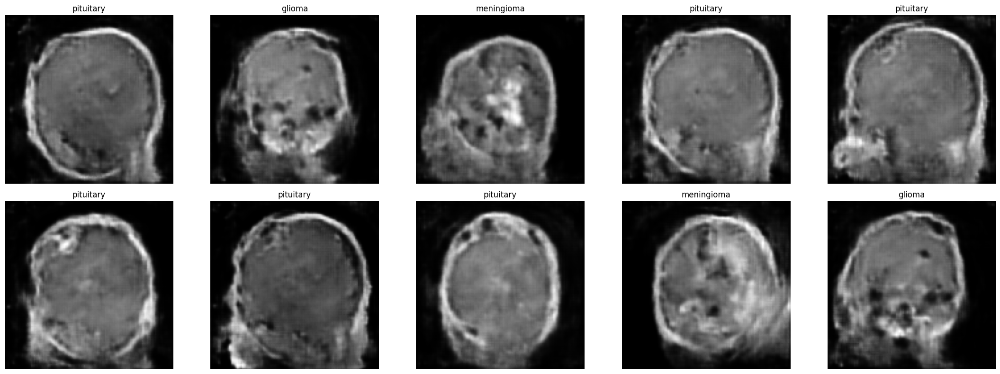

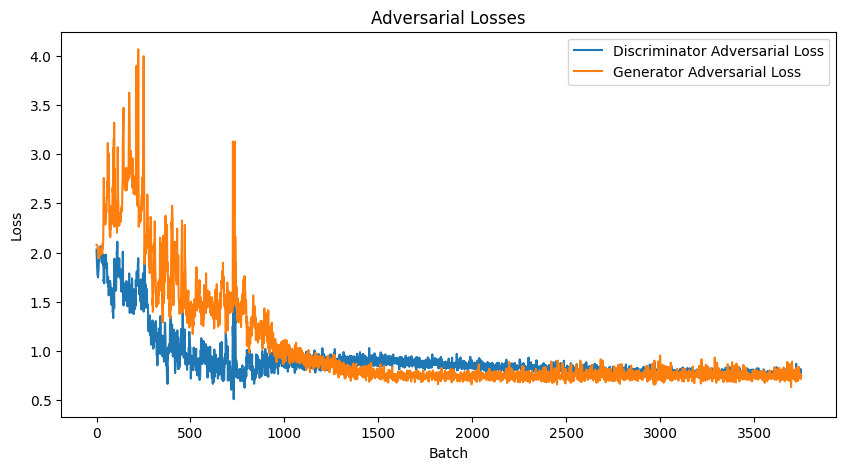

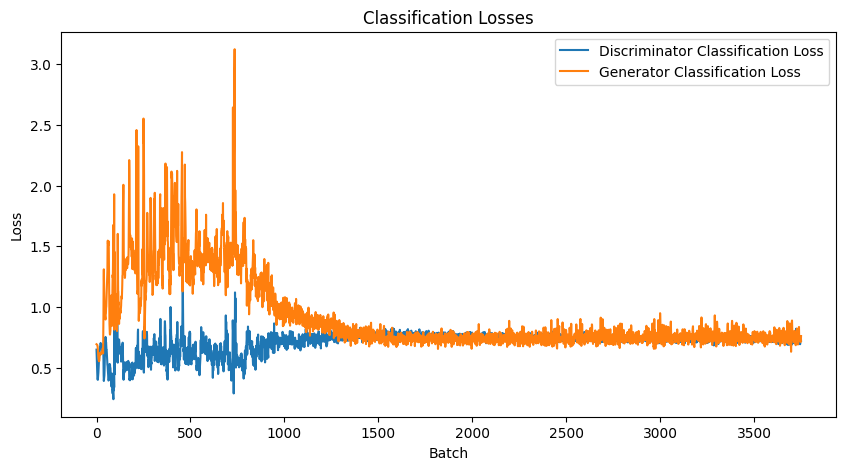

  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 1/3750 [00:00<25:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 2/3750 [00:00<25:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 3/3750 [00:01<25:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<25:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<25:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<25:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 7/3750 [00:02<25:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 8/3750 [00:03<25:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<25:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<25:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 11/3750 [00:04<25:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 12/3750 [00:04<25:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 13/3750 [00:05<25:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 14/3750 [00:05<25:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<25:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:06<25:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 17/3750 [00:06<25:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<25:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:07<25:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 20/3750 [00:08<25:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<25:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:08<25:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 23/3750 [00:09<25:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 24/3750 [00:09<25:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 25/3750 [00:10<25:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 26/3750 [00:10<25:15,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 28/3750 [00:11<25:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 29/3750 [00:11<25:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 31/3750 [00:12<25:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<25:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<25:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 34/3750 [00:13<25:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<25:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 36/3750 [00:14<25:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<25:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 38/3750 [00:15<25:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:15<25:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 40/3750 [00:16<25:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 41/3750 [00:16<25:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 42/3750 [00:17<25:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:17<25:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:17<25:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 45/3750 [00:18<25:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 46/3750 [00:18<25:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 47/3750 [00:19<25:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 48/3750 [00:19<25:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:20<25:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 50/3750 [00:20<25:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:20<25:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 52/3750 [00:21<25:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 53/3750 [00:21<25:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 54/3750 [00:22<25:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 55/3750 [00:22<25:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 56/3750 [00:22<25:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 57/3750 [00:23<25:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 58/3750 [00:23<25:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 59/3750 [00:24<25:06,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 60/3750 [00:24<25:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 61/3750 [00:24<25:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 62/3750 [00:25<25:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 63/3750 [00:25<25:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:26<25:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 65/3750 [00:26<25:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 66/3750 [00:27<25:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:27<25:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 68/3750 [00:27<25:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 69/3750 [00:28<25:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 70/3750 [00:28<25:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:29<25:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:29<25:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 73/3750 [00:29<25:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 74/3750 [00:30<25:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:30<25:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 76/3750 [00:31<25:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 77/3750 [00:31<25:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 78/3750 [00:31<25:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:32<24:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:32<25:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:33<25:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:33<25:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 83/3750 [00:34<25:53,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 84/3750 [00:34<25:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 85/3750 [00:34<25:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 86/3750 [00:35<25:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:35<25:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:36<24:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:36<25:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 90/3750 [00:36<24:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:37<24:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:37<24:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 93/3750 [00:38<24:51,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 94/3750 [00:38<24:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 95/3750 [00:38<24:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 96/3750 [00:39<24:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 97/3750 [00:39<24:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 98/3750 [00:40<25:03,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 99/3750 [00:40<24:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:41<24:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 101/3750 [00:41<24:50,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 102/3750 [00:41<24:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 103/3750 [00:42<24:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 104/3750 [00:42<24:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 105/3750 [00:43<24:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 106/3750 [00:43<24:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 107/3750 [00:43<24:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 108/3750 [00:44<24:48,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 109/3750 [00:44<24:46,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 110/3750 [00:45<24:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 111/3750 [00:45<24:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 112/3750 [00:45<24:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 113/3750 [00:46<24:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 114/3750 [00:46<24:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 115/3750 [00:47<24:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:47<24:44,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 117/3750 [00:47<24:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 118/3750 [00:48<24:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:48<24:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 120/3750 [00:49<24:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:49<24:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:49<24:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:50<24:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 124/3750 [00:50<24:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 125/3750 [00:51<25:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:51<25:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 127/3750 [00:52<24:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 128/3750 [00:52<24:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 129/3750 [00:52<24:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 130/3750 [00:53<24:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:53<24:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:54<24:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:54<24:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 134/3750 [00:54<24:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:55<24:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 136/3750 [00:55<24:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 137/3750 [00:56<24:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 138/3750 [00:56<24:36,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 139/3750 [00:56<24:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 140/3750 [00:57<24:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:57<24:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:58<24:27,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 143/3750 [00:58<24:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 144/3750 [00:59<24:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [00:59<24:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [00:59<24:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 147/3750 [01:00<24:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:00<24:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:01<24:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:01<24:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 151/3750 [01:01<24:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 152/3750 [01:02<24:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:02<24:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:03<24:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 155/3750 [01:03<24:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 156/3750 [01:03<24:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 157/3750 [01:04<24:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 158/3750 [01:04<24:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 159/3750 [01:05<24:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 160/3750 [01:05<24:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:05<24:26,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 162/3750 [01:06<24:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:06<24:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 164/3750 [01:07<24:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 165/3750 [01:07<24:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:08<24:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 167/3750 [01:08<24:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:08<24:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 169/3750 [01:09<24:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 170/3750 [01:09<24:15,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 171/3750 [01:10<24:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:10<24:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:10<24:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 174/3750 [01:11<24:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:11<24:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 176/3750 [01:12<24:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:12<24:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:12<24:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 179/3750 [01:13<24:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 180/3750 [01:13<24:35,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 181/3750 [01:14<24:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 182/3750 [01:14<24:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 183/3750 [01:14<24:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:15<24:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 185/3750 [01:15<24:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 186/3750 [01:16<24:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 187/3750 [01:16<24:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 188/3750 [01:17<24:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:17<24:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 190/3750 [01:17<24:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 191/3750 [01:18<24:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 192/3750 [01:18<24:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:19<24:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:19<24:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 195/3750 [01:19<24:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 196/3750 [01:20<24:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:20<24:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 198/3750 [01:21<24:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 199/3750 [01:21<24:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 200/3750 [01:21<24:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 201/3750 [01:22<24:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 202/3750 [01:22<24:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 203/3750 [01:23<24:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:23<24:06,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 205/3750 [01:23<24:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 206/3750 [01:24<24:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:24<24:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 208/3750 [01:25<24:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 209/3750 [01:25<24:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 210/3750 [01:26<24:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 211/3750 [01:26<24:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 212/3750 [01:26<24:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 213/3750 [01:27<26:57,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:27<26:02,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:28<25:26,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 216/3750 [01:28<24:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 217/3750 [01:29<28:26,  2.07it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 218/3750 [01:29<28:05,  2.10it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:30<26:57,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:30<26:10,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 221/3750 [01:30<25:37,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 222/3750 [01:31<25:10,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 223/3750 [01:31<24:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 224/3750 [01:32<24:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [01:32<24:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [01:33<24:32,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 227/3750 [01:33<24:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:33<24:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 229/3750 [01:34<24:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 230/3750 [01:34<24:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 231/3750 [01:35<24:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:35<24:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:35<24:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 234/3750 [01:36<24:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 235/3750 [01:36<24:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:37<24:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:37<24:22,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 238/3750 [01:38<24:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 239/3750 [01:38<24:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 240/3750 [01:38<24:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 241/3750 [01:39<24:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:39<24:23,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 243/3750 [01:40<24:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:40<24:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 245/3750 [01:40<24:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 246/3750 [01:41<24:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:41<24:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 248/3750 [01:42<24:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:42<24:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:43<24:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:43<24:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 252/3750 [01:43<24:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:44<24:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:44<24:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 255/3750 [01:45<24:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 256/3750 [01:45<24:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 257/3750 [01:45<24:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 258/3750 [01:46<24:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [01:46<24:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 260/3750 [01:47<23:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:47<24:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 262/3750 [01:47<24:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 263/3750 [01:48<24:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:48<24:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 265/3750 [01:49<24:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 266/3750 [01:49<24:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 267/3750 [01:50<24:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 268/3750 [01:50<24:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 269/3750 [01:50<24:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:51<24:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 271/3750 [01:51<24:03,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 272/3750 [01:52<24:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 273/3750 [01:52<24:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 274/3750 [01:52<24:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:53<23:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 276/3750 [01:53<24:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:54<24:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 278/3750 [01:54<24:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:55<24:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 280/3750 [01:55<23:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 281/3750 [01:55<23:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 282/3750 [01:56<23:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 283/3750 [01:56<23:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:57<23:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:57<23:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 286/3750 [01:57<23:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 287/3750 [01:58<23:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 288/3750 [01:58<23:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [01:59<23:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 290/3750 [01:59<23:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [02:00<23:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 292/3750 [02:00<23:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [02:00<24:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [02:01<24:00,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 295/3750 [02:01<23:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 296/3750 [02:02<24:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 297/3750 [02:02<23:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 298/3750 [02:02<23:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 299/3750 [02:03<23:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [02:03<23:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [02:04<26:17,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:04<25:40,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 303/3750 [02:05<25:01,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 304/3750 [02:05<24:36,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 305/3750 [02:05<24:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 306/3750 [02:06<24:13,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 307/3750 [02:06<24:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:07<23:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 309/3750 [02:07<23:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:08<23:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:08<23:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:08<23:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:09<23:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 314/3750 [02:09<23:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:10<23:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 316/3750 [02:10<23:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:10<23:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:11<23:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:11<23:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:12<23:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:12<23:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 322/3750 [02:12<23:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:13<23:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 324/3750 [02:13<23:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 325/3750 [02:14<23:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 326/3750 [02:14<23:35,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 327/3750 [02:15<23:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 328/3750 [02:15<23:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:15<23:26,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 330/3750 [02:16<23:24,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 331/3750 [02:16<23:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 332/3750 [02:17<23:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 333/3750 [02:17<23:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:17<23:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:18<23:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 336/3750 [02:18<23:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 337/3750 [02:19<23:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:19<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 339/3750 [02:20<23:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:20<23:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:20<23:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 342/3750 [02:21<23:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:21<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 344/3750 [02:22<23:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 345/3750 [02:22<23:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 346/3750 [02:22<23:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 347/3750 [02:23<23:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 348/3750 [02:23<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 349/3750 [02:24<23:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 350/3750 [02:24<23:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 351/3750 [02:25<23:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:25<23:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 353/3750 [02:25<23:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 354/3750 [02:26<23:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 355/3750 [02:26<23:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 356/3750 [02:27<23:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 357/3750 [02:27<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 358/3750 [02:27<23:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 359/3750 [02:28<23:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 360/3750 [02:28<23:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 361/3750 [02:29<23:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 362/3750 [02:29<23:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 363/3750 [02:29<23:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:30<23:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 365/3750 [02:30<23:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 366/3750 [02:31<23:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:31<23:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 368/3750 [02:32<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:32<23:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:32<23:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 371/3750 [02:33<23:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:33<23:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:34<23:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 374/3750 [02:34<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:34<23:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 376/3750 [02:35<23:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 377/3750 [02:35<23:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 378/3750 [02:36<23:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 379/3750 [02:36<23:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:36<23:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 381/3750 [02:37<23:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 382/3750 [02:37<23:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 383/3750 [02:38<23:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:38<23:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:39<23:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 386/3750 [02:39<23:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 387/3750 [02:39<23:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 388/3750 [02:40<23:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 389/3750 [02:40<23:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 390/3750 [02:41<23:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [02:41<23:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [02:41<23:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 393/3750 [02:42<23:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 394/3750 [02:42<23:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:43<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 396/3750 [02:43<23:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 397/3750 [02:44<23:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 398/3750 [02:44<23:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:44<23:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 400/3750 [02:45<22:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:45<22:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 402/3750 [02:46<22:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 403/3750 [02:46<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 404/3750 [02:46<22:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 405/3750 [02:47<23:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:47<23:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:48<23:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 408/3750 [02:48<23:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 409/3750 [02:48<23:04,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 410/3750 [02:49<23:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:49<22:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:50<22:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:50<22:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 414/3750 [02:51<23:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 415/3750 [02:51<22:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:51<22:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 417/3750 [02:52<22:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 418/3750 [02:52<22:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 419/3750 [02:53<22:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 420/3750 [02:53<22:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:53<22:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 422/3750 [02:54<22:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 423/3750 [02:54<22:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:55<22:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 425/3750 [02:55<23:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 426/3750 [02:55<22:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:56<22:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:56<22:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 429/3750 [02:57<22:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 430/3750 [02:57<22:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 431/3750 [02:58<22:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [02:58<22:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [02:58<22:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 434/3750 [02:59<22:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [02:59<23:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [03:00<22:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [03:00<22:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 438/3750 [03:00<23:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 439/3750 [03:01<22:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 440/3750 [03:01<22:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [03:02<22:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 442/3750 [03:02<22:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 443/3750 [03:03<22:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 444/3750 [03:03<22:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:03<22:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:04<22:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:04<22:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 448/3750 [03:05<22:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 449/3750 [03:05<22:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 450/3750 [03:05<22:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:06<22:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:06<22:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:07<22:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 454/3750 [03:07<22:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:07<22:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 456/3750 [03:08<22:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:08<22:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 458/3750 [03:09<22:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:09<22:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:10<22:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 461/3750 [03:10<22:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 462/3750 [03:10<22:36,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 463/3750 [03:11<22:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 464/3750 [03:11<22:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 465/3750 [03:12<22:28,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 466/3750 [03:12<22:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 467/3750 [03:12<22:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:13<24:47,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:13<24:10,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:14<23:35,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 471/3750 [03:14<23:12,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 472/3750 [03:15<22:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:15<22:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:15<22:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 475/3750 [03:16<22:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 476/3750 [03:16<22:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:17<22:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 478/3750 [03:17<22:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:17<22:26,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 480/3750 [03:18<22:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:18<22:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:19<22:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 483/3750 [03:19<22:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:19<22:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 485/3750 [03:20<22:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 486/3750 [03:20<22:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 487/3750 [03:21<22:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 488/3750 [03:21<22:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:22<22:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 490/3750 [03:22<22:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 491/3750 [03:22<22:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 492/3750 [03:23<22:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 493/3750 [03:23<22:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 494/3750 [03:24<22:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 495/3750 [03:24<22:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 496/3750 [03:24<22:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 497/3750 [03:25<22:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 498/3750 [03:25<22:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:26<22:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:26<22:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:26<22:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:27<22:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:27<22:07,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 504/3750 [03:28<22:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:28<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 506/3750 [03:29<22:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:29<22:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:29<22:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:30<22:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:30<22:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 511/3750 [03:31<22:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:31<22:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▎        | 513/3750 [03:31<22:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▎        | 514/3750 [03:32<22:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:32<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 516/3750 [03:33<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:33<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:33<22:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 519/3750 [03:34<22:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 520/3750 [03:34<22:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:35<22:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 522/3750 [03:35<22:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 523/3750 [03:36<22:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 524/3750 [03:36<22:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 525/3750 [03:36<22:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:37<22:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 527/3750 [03:37<22:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 528/3750 [03:38<22:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:38<22:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 530/3750 [03:38<22:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 531/3750 [03:39<21:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 532/3750 [03:39<21:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:40<22:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 534/3750 [03:40<22:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 535/3750 [03:40<22:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 536/3750 [03:41<21:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:41<21:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 538/3750 [03:42<21:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:42<21:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 540/3750 [03:42<21:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:43<21:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 542/3750 [03:43<21:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 543/3750 [03:44<21:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:44<21:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:45<22:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 546/3750 [03:45<22:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:45<22:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 548/3750 [03:46<21:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 549/3750 [03:46<22:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:47<22:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 551/3750 [03:47<22:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:47<22:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 553/3750 [03:48<22:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 554/3750 [03:48<21:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:49<21:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:49<21:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 557/3750 [03:49<21:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 558/3750 [03:50<21:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 559/3750 [03:50<21:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 560/3750 [03:51<21:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:51<21:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 562/3750 [03:52<21:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:52<21:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:52<21:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:53<21:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:53<21:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 567/3750 [03:54<21:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:54<21:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 569/3750 [03:54<21:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:55<21:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:55<21:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 572/3750 [03:56<21:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:56<21:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 574/3750 [03:56<21:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [03:57<21:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [03:57<21:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [03:58<21:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 578/3750 [03:58<21:50,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 579/3750 [03:59<21:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [03:59<21:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [03:59<21:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 582/3750 [04:00<21:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 583/3750 [04:00<21:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 584/3750 [04:01<21:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 585/3750 [04:01<21:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 586/3750 [04:01<21:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 587/3750 [04:02<21:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 588/3750 [04:02<21:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 589/3750 [04:03<21:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 590/3750 [04:03<21:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 591/3750 [04:03<21:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 592/3750 [04:04<21:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:04<21:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 594/3750 [04:05<21:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 595/3750 [04:05<21:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:05<21:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [04:06<21:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 598/3750 [04:06<21:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 599/3750 [04:07<21:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 600/3750 [04:07<21:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 601/3750 [04:08<21:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:08<21:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 603/3750 [04:08<21:32,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 604/3750 [04:09<21:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:09<21:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 606/3750 [04:10<21:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:10<21:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 608/3750 [04:10<21:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 609/3750 [04:11<21:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 610/3750 [04:11<21:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 611/3750 [04:12<21:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 612/3750 [04:12<21:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 613/3750 [04:12<21:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 614/3750 [04:13<21:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:13<21:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 616/3750 [04:14<21:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:14<21:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 618/3750 [04:15<21:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:15<21:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 620/3750 [04:15<21:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:16<21:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:16<21:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:17<21:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:17<21:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 625/3750 [04:17<21:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:18<21:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:18<21:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 628/3750 [04:19<21:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:19<21:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:19<21:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:20<21:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 632/3750 [04:20<21:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:21<21:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 634/3750 [04:21<21:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 635/3750 [04:22<21:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 636/3750 [04:22<21:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 637/3750 [04:22<21:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 638/3750 [04:23<21:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 639/3750 [04:23<21:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 640/3750 [04:24<21:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 641/3750 [04:24<21:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 642/3750 [04:24<21:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 643/3750 [04:25<21:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 644/3750 [04:25<21:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:26<21:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 646/3750 [04:26<21:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 647/3750 [04:26<21:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:27<21:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 649/3750 [04:27<21:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 650/3750 [04:28<21:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 651/3750 [04:28<21:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 652/3750 [04:29<21:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 653/3750 [04:29<21:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 654/3750 [04:29<21:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 655/3750 [04:30<21:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:30<21:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 657/3750 [04:31<21:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 658/3750 [04:31<21:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:31<21:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 660/3750 [04:32<21:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 661/3750 [04:32<21:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 662/3750 [04:33<21:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 663/3750 [04:33<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:33<21:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 665/3750 [04:34<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 666/3750 [04:34<21:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:35<21:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:35<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:36<21:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 670/3750 [04:36<21:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 671/3750 [04:36<21:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 672/3750 [04:37<21:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 673/3750 [04:37<20:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 674/3750 [04:38<20:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [04:38<20:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 676/3750 [04:38<20:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:39<21:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 678/3750 [04:39<21:39,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:40<21:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 680/3750 [04:40<21:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 681/3750 [04:40<21:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 682/3750 [04:41<21:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 683/3750 [04:41<21:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:42<21:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 685/3750 [04:42<21:03,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 686/3750 [04:43<21:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 687/3750 [04:43<21:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:43<21:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:44<21:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 690/3750 [04:44<20:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 691/3750 [04:45<20:54,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 692/3750 [04:45<20:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 693/3750 [04:45<20:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 694/3750 [04:46<20:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:46<20:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:47<20:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 697/3750 [04:47<20:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 698/3750 [04:47<20:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 699/3750 [04:48<20:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:48<20:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 701/3750 [04:49<20:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 702/3750 [04:49<20:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 703/3750 [04:50<20:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 704/3750 [04:50<21:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 705/3750 [04:50<20:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:51<20:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:51<20:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 708/3750 [04:52<20:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 709/3750 [04:52<20:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 710/3750 [04:52<20:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:53<20:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 712/3750 [04:53<20:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 713/3750 [04:54<20:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [04:54<20:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 715/3750 [04:54<21:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:55<20:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 717/3750 [04:55<20:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 718/3750 [04:56<20:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [04:56<20:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 720/3750 [04:57<20:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 721/3750 [04:57<20:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 722/3750 [04:57<20:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [04:58<20:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 724/3750 [04:58<20:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [04:59<20:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [04:59<20:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 727/3750 [04:59<20:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 728/3750 [05:00<20:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 729/3750 [05:00<20:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 730/3750 [05:01<20:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 731/3750 [05:01<20:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 732/3750 [05:01<20:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 733/3750 [05:02<20:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [05:02<20:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 735/3750 [05:03<20:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:03<20:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [05:04<20:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 738/3750 [05:04<20:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 739/3750 [05:04<20:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 740/3750 [05:05<20:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:05<20:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 742/3750 [05:06<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:06<20:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 744/3750 [05:06<20:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:07<20:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 746/3750 [05:07<20:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 747/3750 [05:08<20:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 748/3750 [05:08<20:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 749/3750 [05:08<20:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 750/3750 [05:09<20:39,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 751/3750 [05:09<20:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 752/3750 [05:10<20:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 753/3750 [05:10<20:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 754/3750 [05:11<20:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 755/3750 [05:11<20:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 756/3750 [05:11<20:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 757/3750 [05:12<20:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:12<20:20,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 759/3750 [05:13<20:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 760/3750 [05:13<20:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 761/3750 [05:13<20:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:14<20:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 763/3750 [05:14<20:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 764/3750 [05:15<20:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 765/3750 [05:15<20:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:15<20:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 767/3750 [05:16<20:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 768/3750 [05:16<20:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 769/3750 [05:17<20:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:17<20:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 771/3750 [05:17<20:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 772/3750 [05:18<20:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 773/3750 [05:18<20:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 774/3750 [05:19<20:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 775/3750 [05:19<20:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 776/3750 [05:20<20:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 777/3750 [05:20<20:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:20<20:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:21<20:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:21<20:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 781/3750 [05:22<20:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 782/3750 [05:22<20:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 783/3750 [05:22<20:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 784/3750 [05:23<20:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 785/3750 [05:23<20:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:24<20:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:24<20:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 788/3750 [05:24<20:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 789/3750 [05:25<20:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:25<20:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 791/3750 [05:26<20:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 792/3750 [05:26<20:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 793/3750 [05:27<20:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 794/3750 [05:27<20:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 795/3750 [05:27<20:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:28<20:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:28<20:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:29<20:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 799/3750 [05:29<20:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 800/3750 [05:29<20:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:30<20:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 802/3750 [05:30<20:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:31<20:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:31<20:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 805/3750 [05:31<20:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 806/3750 [05:32<20:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:32<20:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:33<20:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 809/3750 [05:33<20:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 810/3750 [05:34<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:34<20:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:34<20:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 813/3750 [05:35<20:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 814/3750 [05:35<20:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [05:36<20:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 816/3750 [05:36<20:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 817/3750 [05:36<20:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 818/3750 [05:37<20:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 819/3750 [05:37<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 820/3750 [05:38<20:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 821/3750 [05:38<19:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:38<20:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 823/3750 [05:39<20:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 824/3750 [05:39<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:40<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:40<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 827/3750 [05:41<20:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 828/3750 [05:41<20:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 829/3750 [05:41<20:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 830/3750 [05:42<20:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:42<20:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:43<20:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 833/3750 [05:43<20:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 834/3750 [05:43<19:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 835/3750 [05:44<19:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:44<19:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 837/3750 [05:45<19:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:45<19:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:45<19:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 840/3750 [05:46<19:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:46<19:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 842/3750 [05:47<19:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 843/3750 [05:47<19:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:47<19:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 845/3750 [05:48<19:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 846/3750 [05:48<19:44,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 847/3750 [05:49<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 848/3750 [05:49<19:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 849/3750 [05:50<19:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 850/3750 [05:50<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 851/3750 [05:50<19:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 852/3750 [05:51<19:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 853/3750 [05:51<19:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 854/3750 [05:52<19:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:52<19:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 856/3750 [05:52<19:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 857/3750 [05:53<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:53<19:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [05:54<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 860/3750 [05:54<19:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 861/3750 [05:54<19:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 862/3750 [05:55<19:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 863/3750 [05:55<19:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [05:56<19:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [05:56<19:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 866/3750 [05:57<19:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [05:57<19:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [05:57<19:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 869/3750 [05:58<19:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [05:58<19:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 871/3750 [05:59<19:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 872/3750 [05:59<19:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 873/3750 [05:59<19:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [06:00<19:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 875/3750 [06:00<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [06:01<19:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 877/3750 [06:01<19:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 878/3750 [06:01<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [06:02<19:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [06:02<19:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [06:03<19:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [06:03<19:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 883/3750 [06:03<19:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 884/3750 [06:04<19:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 885/3750 [06:04<19:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:05<19:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 887/3750 [06:05<19:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:06<19:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:06<19:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 890/3750 [06:06<19:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 891/3750 [06:07<19:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 892/3750 [06:07<19:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:08<19:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 894/3750 [06:08<19:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:08<19:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 896/3750 [06:09<19:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:09<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:10<19:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:10<19:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [06:10<19:19,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 901/3750 [06:11<19:18,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 902/3750 [06:11<19:16,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 903/3750 [06:12<19:14,  2.47it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 904/3750 [06:12<19:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 905/3750 [06:12<19:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:13<19:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 907/3750 [06:13<19:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 908/3750 [06:14<19:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:14<19:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 910/3750 [06:15<19:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 911/3750 [06:15<19:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:15<19:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 913/3750 [06:16<19:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 914/3750 [06:16<19:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:17<19:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:17<19:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:17<19:23,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 918/3750 [06:18<19:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 919/3750 [06:18<19:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:19<19:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 921/3750 [06:19<19:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:19<19:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 923/3750 [06:20<19:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:20<19:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:21<19:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:21<19:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 927/3750 [06:22<19:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [06:22<19:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 929/3750 [06:22<19:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [06:23<19:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:23<19:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 932/3750 [06:24<19:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:24<19:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 934/3750 [06:24<19:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 935/3750 [06:25<19:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 936/3750 [06:25<19:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 937/3750 [06:26<19:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 938/3750 [06:26<19:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 939/3750 [06:26<19:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 940/3750 [06:27<19:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:27<19:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:28<19:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:28<19:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 944/3750 [06:28<19:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 945/3750 [06:29<19:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 946/3750 [06:29<19:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 947/3750 [06:30<19:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 948/3750 [06:30<19:01,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 949/3750 [06:31<19:04,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 950/3750 [06:31<19:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:31<19:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:32<19:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:32<19:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 954/3750 [06:33<19:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:33<19:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:33<19:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:34<18:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 958/3750 [06:34<19:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 959/3750 [06:35<19:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:35<18:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:35<18:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 962/3750 [06:36<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 963/3750 [06:36<18:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 964/3750 [06:37<18:54,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:37<18:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 966/3750 [06:37<18:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 967/3750 [06:38<19:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 968/3750 [06:38<18:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 969/3750 [06:39<18:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:39<18:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 971/3750 [06:40<18:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 972/3750 [06:40<18:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 973/3750 [06:40<18:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 974/3750 [06:41<18:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 975/3750 [06:41<18:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 976/3750 [06:42<19:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 977/3750 [06:42<19:37,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 978/3750 [06:42<19:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 979/3750 [06:43<19:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 980/3750 [06:43<19:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:44<19:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:44<19:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:44<18:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 984/3750 [06:45<18:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:45<19:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 986/3750 [06:46<18:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 987/3750 [06:46<19:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 988/3750 [06:47<19:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 989/3750 [06:47<18:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:47<19:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:48<18:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 992/3750 [06:48<18:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:49<18:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 994/3750 [06:49<18:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 995/3750 [06:49<18:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 996/3750 [06:50<18:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:50<18:59,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 998/3750 [06:51<18:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:51<19:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:51<18:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1001/3750 [06:52<18:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1002/3750 [06:52<18:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1003/3750 [06:53<18:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [06:53<18:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [06:54<18:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [06:54<18:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [06:54<18:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1008/3750 [06:55<18:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [06:55<18:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [06:56<18:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1011/3750 [06:56<18:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [06:56<18:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1013/3750 [06:57<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [06:57<18:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [06:58<18:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [06:58<18:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [06:58<18:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [06:59<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [06:59<18:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1020/3750 [07:00<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [07:00<18:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [07:01<18:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1023/3750 [07:01<18:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [07:01<18:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1025/3750 [07:02<18:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [07:02<18:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1027/3750 [07:03<18:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1028/3750 [07:03<18:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:03<18:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:04<18:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1031/3750 [07:04<18:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:05<18:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1033/3750 [07:05<18:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:05<18:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1035/3750 [07:06<18:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1036/3750 [07:06<18:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:07<18:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:07<18:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:07<18:26,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1040/3750 [07:08<18:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:08<18:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1042/3750 [07:09<18:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:09<18:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1044/3750 [07:10<18:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1045/3750 [07:10<18:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1046/3750 [07:10<18:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1047/3750 [07:11<18:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1048/3750 [07:11<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:12<18:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:12<18:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1051/3750 [07:12<18:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1052/3750 [07:13<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1053/3750 [07:13<18:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:14<18:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:14<18:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:14<18:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1057/3750 [07:15<18:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1058/3750 [07:15<18:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:16<18:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:16<18:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1061/3750 [07:16<18:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:17<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1063/3750 [07:17<18:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:18<18:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:18<18:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1066/3750 [07:19<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:19<18:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:19<18:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1069/3750 [07:20<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:20<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1071/3750 [07:21<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1072/3750 [07:21<18:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1073/3750 [07:21<18:13,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1074/3750 [07:22<18:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1075/3750 [07:22<18:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1076/3750 [07:23<18:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1077/3750 [07:23<18:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:23<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1079/3750 [07:24<18:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1080/3750 [07:24<18:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1081/3750 [07:25<18:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:25<18:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1083/3750 [07:25<18:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:26<18:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:26<18:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:27<18:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:27<18:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1088/3750 [07:28<18:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1089/3750 [07:28<18:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1090/3750 [07:28<18:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1091/3750 [07:29<18:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:29<18:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1093/3750 [07:30<18:01,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1094/3750 [07:30<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:30<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:31<18:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1097/3750 [07:31<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:32<18:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1099/3750 [07:32<18:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1100/3750 [07:32<17:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1101/3750 [07:33<17:58,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:33<17:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1103/3750 [07:34<18:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:34<18:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:34<18:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:35<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1107/3750 [07:35<17:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:36<17:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:36<17:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1110/3750 [07:37<18:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:37<18:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:37<18:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:38<18:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1114/3750 [07:38<18:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1115/3750 [07:39<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:39<17:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:39<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1118/3750 [07:40<17:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1119/3750 [07:40<17:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:41<18:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:41<18:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1122/3750 [07:41<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1123/3750 [07:42<17:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:42<18:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:43<18:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:43<17:59,  2.43it/s]

2/2 [==============================] - 0s 60ms/step


 30%|███       | 1127/3750 [07:44<18:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1128/3750 [07:44<18:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:44<18:05,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1130/3750 [07:45<18:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:45<17:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:46<17:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:46<18:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1134/3750 [07:46<17:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1135/3750 [07:47<17:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:47<17:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1137/3750 [07:48<17:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1138/3750 [07:48<17:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:48<17:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:49<17:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1141/3750 [07:49<17:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1142/3750 [07:50<17:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:50<17:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:51<17:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1145/3750 [07:51<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1146/3750 [07:51<17:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1147/3750 [07:52<17:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1148/3750 [07:52<17:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [07:53<17:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1150/3750 [07:53<17:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1151/3750 [07:53<17:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [07:54<17:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [07:54<17:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1154/3750 [07:55<17:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [07:55<17:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1156/3750 [07:55<17:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1157/3750 [07:56<17:35,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1158/3750 [07:56<17:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1159/3750 [07:57<17:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [07:57<17:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [07:57<17:34,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1162/3750 [07:58<17:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [07:58<17:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1164/3750 [07:59<17:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1165/3750 [07:59<17:30,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1166/3750 [07:59<17:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1167/3750 [08:00<17:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1168/3750 [08:00<17:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [08:01<17:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1170/3750 [08:01<17:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1171/3750 [08:02<17:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [08:02<17:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [08:02<17:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [08:03<17:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1175/3750 [08:03<17:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1176/3750 [08:04<17:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1177/3750 [08:04<17:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1178/3750 [08:04<17:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1179/3750 [08:05<17:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1180/3750 [08:05<17:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1181/3750 [08:06<17:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:06<17:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1183/3750 [08:06<17:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1184/3750 [08:07<17:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:07<17:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1186/3750 [08:08<17:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1187/3750 [08:08<17:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1188/3750 [08:09<17:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1189/3750 [08:09<17:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:09<17:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:10<17:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:10<17:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1193/3750 [08:11<17:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1194/3750 [08:11<17:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1195/3750 [08:11<17:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1196/3750 [08:12<17:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:12<17:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:13<17:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1199/3750 [08:13<17:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:13<17:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1201/3750 [08:14<17:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1202/3750 [08:14<17:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:15<17:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:15<17:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1205/3750 [08:15<17:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:16<17:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:16<17:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:17<17:09,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:17<17:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1210/3750 [08:17<17:10,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1211/3750 [08:18<17:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:18<17:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:19<17:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:19<17:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1215/3750 [08:20<17:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:20<17:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1217/3750 [08:20<17:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:21<17:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:21<17:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1220/3750 [08:22<17:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:22<17:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1222/3750 [08:22<17:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:23<17:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1224/3750 [08:23<17:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1225/3750 [08:24<17:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1226/3750 [08:24<17:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:24<17:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:25<17:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1229/3750 [08:25<17:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:26<17:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1231/3750 [08:26<17:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1232/3750 [08:27<17:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:27<17:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1234/3750 [08:27<17:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:28<17:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1236/3750 [08:28<17:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1237/3750 [08:29<17:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:29<17:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:29<17:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:30<17:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1241/3750 [08:30<17:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:31<17:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:31<17:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1244/3750 [08:31<17:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:32<17:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1246/3750 [08:32<17:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:33<17:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:33<17:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:33<17:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1250/3750 [08:34<17:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1251/3750 [08:34<17:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1252/3750 [08:35<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1253/3750 [08:35<17:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:36<17:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:36<16:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:36<16:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:37<17:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1258/3750 [08:37<16:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1259/3750 [08:38<16:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1260/3750 [08:38<16:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:38<17:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1262/3750 [08:39<16:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1263/3750 [08:39<16:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:40<16:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1265/3750 [08:40<16:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1266/3750 [08:40<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:41<17:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:41<17:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:42<16:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1270/3750 [08:42<16:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:42<16:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1272/3750 [08:43<16:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:43<16:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:44<16:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1275/3750 [08:44<16:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1276/3750 [08:45<19:32,  2.11it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1277/3750 [08:45<19:18,  2.13it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:46<18:38,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:46<18:11,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:46<17:55,  2.30it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1281/3750 [08:47<17:38,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1282/3750 [08:47<17:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:48<17:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1284/3750 [08:48<17:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1285/3750 [08:49<17:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:49<17:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1287/3750 [08:49<17:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1288/3750 [08:50<17:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1289/3750 [08:50<17:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:51<17:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [08:51<17:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [08:51<17:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1293/3750 [08:52<17:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1294/3750 [08:52<17:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [08:53<17:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [08:53<17:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [08:54<17:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [08:54<17:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1299/3750 [08:54<16:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [08:55<16:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1301/3750 [08:55<16:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1302/3750 [08:56<16:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [08:56<16:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [08:56<16:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1305/3750 [08:57<16:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [08:57<16:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1307/3750 [08:58<16:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1308/3750 [08:58<16:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [08:59<16:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [08:59<16:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1311/3750 [08:59<17:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [09:00<16:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1313/3750 [09:00<16:54,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1314/3750 [09:01<17:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1315/3750 [09:01<16:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1316/3750 [09:01<16:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [09:02<16:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [09:02<16:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [09:03<16:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [09:03<16:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1321/3750 [09:04<16:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:04<16:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1323/3750 [09:04<16:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1324/3750 [09:05<16:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:05<16:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:06<17:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:06<16:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [09:06<16:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1329/3750 [09:07<16:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1330/3750 [09:07<16:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1331/3750 [09:08<16:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1332/3750 [09:08<16:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:09<16:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:09<16:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1335/3750 [09:09<16:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1336/3750 [09:10<16:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1337/3750 [09:10<16:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:11<16:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1339/3750 [09:11<16:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:11<16:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:12<16:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:12<16:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1343/3750 [09:13<16:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [09:13<16:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1345/3750 [09:14<16:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:14<16:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:14<16:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1348/3750 [09:15<16:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1349/3750 [09:15<16:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1350/3750 [09:16<16:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:16<16:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:16<16:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:17<16:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1354/3750 [09:17<16:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1355/3750 [09:18<16:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:18<16:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1357/3750 [09:19<16:36,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1358/3750 [09:19<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:19<16:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:20<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:20<16:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1362/3750 [09:21<16:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:21<16:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:21<16:34,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▋      | 1365/3750 [09:22<16:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:22<16:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:23<16:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1368/3750 [09:23<16:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:23<16:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:24<16:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1371/3750 [09:24<16:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1372/3750 [09:25<16:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1373/3750 [09:25<16:35,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1374/3750 [09:26<16:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1375/3750 [09:26<16:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1376/3750 [09:26<16:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1377/3750 [09:27<16:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1378/3750 [09:27<16:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1379/3750 [09:28<16:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:28<16:25,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1381/3750 [09:28<16:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1382/3750 [09:29<16:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1383/3750 [09:29<16:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1384/3750 [09:30<16:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1385/3750 [09:30<16:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1386/3750 [09:31<16:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1387/3750 [09:31<16:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1388/3750 [09:31<16:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:32<16:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:32<16:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1391/3750 [09:33<16:27,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1392/3750 [09:33<16:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1393/3750 [09:33<16:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1394/3750 [09:34<16:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1395/3750 [09:34<16:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1396/3750 [09:35<16:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1397/3750 [09:35<16:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1398/3750 [09:36<16:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1399/3750 [09:36<16:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1400/3750 [09:36<16:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:37<16:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:37<16:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1403/3750 [09:38<16:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:38<16:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [09:38<16:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:39<16:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:39<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1408/3750 [09:40<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1409/3750 [09:40<16:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:41<16:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1411/3750 [09:41<16:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:41<16:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1413/3750 [09:42<16:17,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1414/3750 [09:42<16:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:43<16:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1416/3750 [09:43<16:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:43<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1418/3750 [09:44<16:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1419/3750 [09:44<16:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1420/3750 [09:45<16:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:45<16:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1422/3750 [09:46<16:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:46<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1424/3750 [09:46<16:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1425/3750 [09:47<16:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1426/3750 [09:47<16:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:48<16:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1428/3750 [09:48<16:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:48<16:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1430/3750 [09:49<16:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:49<15:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:50<15:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:50<15:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1434/3750 [09:50<15:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [09:51<15:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1436/3750 [09:51<15:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1437/3750 [09:52<15:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1438/3750 [09:52<15:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1439/3750 [09:53<15:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [09:53<15:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1441/3750 [09:53<15:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [09:54<15:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [09:54<15:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1444/3750 [09:55<15:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [09:55<15:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [09:55<15:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [09:56<15:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [09:56<15:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1449/3750 [09:57<15:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1450/3750 [09:57<15:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1451/3750 [09:58<15:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1452/3750 [09:58<15:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1453/3750 [09:58<15:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1454/3750 [09:59<15:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1455/3750 [09:59<15:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [10:00<15:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [10:00<15:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [10:00<15:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1459/3750 [10:01<15:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [10:01<15:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1461/3750 [10:02<15:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1462/3750 [10:02<15:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [10:02<15:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1464/3750 [10:03<15:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [10:03<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1466/3750 [10:04<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:04<15:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1468/3750 [10:05<15:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:05<15:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1470/3750 [10:05<15:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1471/3750 [10:06<15:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:06<15:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:07<15:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1474/3750 [10:07<15:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1475/3750 [10:07<15:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1476/3750 [10:08<15:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1477/3750 [10:08<15:41,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1478/3750 [10:09<15:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1479/3750 [10:09<15:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:10<15:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:10<15:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1482/3750 [10:10<15:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:11<15:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [10:11<15:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:12<15:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1486/3750 [10:12<15:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:12<15:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1488/3750 [10:13<15:32,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1489/3750 [10:13<15:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1490/3750 [10:14<15:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:14<15:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1492/3750 [10:14<15:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1493/3750 [10:15<15:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1494/3750 [10:15<15:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1495/3750 [10:16<15:38,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1496/3750 [10:16<15:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:17<15:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1498/3750 [10:17<15:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:17<15:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1500/3750 [10:18<15:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1501/3750 [10:18<15:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1502/3750 [10:19<15:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:19<15:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1504/3750 [10:19<15:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:20<15:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:20<15:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1507/3750 [10:21<15:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [10:21<15:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:21<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:22<15:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1511/3750 [10:22<15:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1512/3750 [10:23<15:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:23<15:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:24<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1515/3750 [10:24<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1516/3750 [10:24<15:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1517/3750 [10:25<15:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:25<15:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:26<15:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1520/3750 [10:26<15:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1521/3750 [10:26<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1522/3750 [10:27<15:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:27<15:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:28<15:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:28<15:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:28<15:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:29<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1528/3750 [10:29<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:30<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:30<15:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:31<15:17,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1532/3750 [10:31<15:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1533/3750 [10:31<15:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1534/3750 [10:32<15:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1535/3750 [10:32<15:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:33<15:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1537/3750 [10:33<15:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:33<15:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [10:34<15:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:34<15:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1541/3750 [10:35<15:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1542/3750 [10:35<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:36<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:36<15:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:36<15:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:37<15:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:37<15:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1548/3750 [10:38<15:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:38<15:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1550/3750 [10:38<15:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:39<15:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:39<15:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1553/3750 [10:40<15:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1554/3750 [10:40<15:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:40<15:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1556/3750 [10:41<15:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:41<15:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:42<15:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1559/3750 [10:42<15:01,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1560/3750 [10:43<15:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:43<15:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:43<14:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:44<14:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1564/3750 [10:44<15:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:45<14:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1566/3750 [10:45<14:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1567/3750 [10:45<14:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1568/3750 [10:46<14:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1569/3750 [10:46<14:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1570/3750 [10:47<14:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:47<14:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1572/3750 [10:47<14:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1573/3750 [10:48<15:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:48<15:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:49<15:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:49<15:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1577/3750 [10:50<14:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [10:50<14:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1579/3750 [10:50<14:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [10:51<14:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1581/3750 [10:51<14:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [10:52<14:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [10:52<14:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [10:52<14:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1585/3750 [10:53<14:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1586/3750 [10:53<14:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [10:54<14:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1588/3750 [10:54<14:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [10:54<14:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1590/3750 [10:55<14:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1591/3750 [10:55<14:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1592/3750 [10:56<14:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1593/3750 [10:56<14:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1594/3750 [10:57<14:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [10:57<14:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1596/3750 [10:57<14:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [10:58<14:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [10:58<14:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [10:59<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1600/3750 [10:59<14:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [10:59<14:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [11:00<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1603/3750 [11:00<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [11:01<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [11:01<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [11:01<14:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1607/3750 [11:02<14:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1608/3750 [11:02<14:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1609/3750 [11:03<14:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1610/3750 [11:03<14:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1611/3750 [11:04<14:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1612/3750 [11:04<14:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1613/3750 [11:04<14:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1614/3750 [11:05<14:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1615/3750 [11:05<14:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:06<14:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1617/3750 [11:06<14:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1618/3750 [11:06<14:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:07<14:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:07<14:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:08<14:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [11:08<14:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:08<14:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1624/3750 [11:09<14:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1625/3750 [11:09<14:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:10<14:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1627/3750 [11:10<14:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1628/3750 [11:11<14:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:11<14:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1630/3750 [11:11<14:32,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1631/3750 [11:12<14:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:12<14:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:13<14:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1634/3750 [11:13<14:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1635/3750 [11:13<14:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1636/3750 [11:14<14:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:14<14:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1638/3750 [11:15<14:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1639/3750 [11:15<14:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1640/3750 [11:15<14:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1641/3750 [11:16<14:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:16<14:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:17<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1644/3750 [11:17<14:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:18<14:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:18<14:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:18<14:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1648/3750 [11:19<14:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:19<14:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:20<14:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:20<14:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1652/3750 [11:20<14:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:21<14:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1654/3750 [11:21<14:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1655/3750 [11:22<14:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1656/3750 [11:22<14:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:22<14:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:23<14:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:23<14:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1660/3750 [11:24<14:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:24<14:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:24<14:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:25<14:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1664/3750 [11:25<14:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:26<14:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1666/3750 [11:26<14:15,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1667/3750 [11:27<14:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1668/3750 [11:27<14:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1669/3750 [11:27<14:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1670/3750 [11:28<14:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1671/3750 [11:28<14:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1672/3750 [11:29<14:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1673/3750 [11:29<14:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1674/3750 [11:29<14:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:30<14:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:30<14:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:31<14:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:31<14:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1679/3750 [11:31<14:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1680/3750 [11:32<14:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:32<14:05,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1682/3750 [11:33<14:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1683/3750 [11:33<14:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:34<14:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1685/3750 [11:34<14:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1686/3750 [11:34<14:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:35<14:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1688/3750 [11:35<14:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1689/3750 [11:36<14:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1690/3750 [11:36<14:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1691/3750 [11:36<14:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:37<14:10,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1693/3750 [11:37<14:11,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1694/3750 [11:38<14:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1695/3750 [11:38<14:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:38<14:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:39<14:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:39<14:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1699/3750 [11:40<14:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1700/3750 [11:40<14:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1701/3750 [11:41<14:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1702/3750 [11:41<14:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:41<14:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:42<13:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1705/3750 [11:42<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1706/3750 [11:43<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1707/3750 [11:43<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:43<13:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1709/3750 [11:44<13:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:44<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:45<13:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1712/3750 [11:45<13:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:45<13:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:46<13:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1715/3750 [11:46<13:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1716/3750 [11:47<13:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:47<13:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:47<13:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:48<13:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [11:48<13:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [11:49<13:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [11:49<14:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1723/3750 [11:50<14:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [11:50<14:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [11:50<13:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [11:51<13:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [11:51<14:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [11:52<14:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1729/3750 [11:52<14:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1730/3750 [11:52<14:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [11:53<14:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [11:53<13:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1733/3750 [11:54<13:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [11:54<13:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1735/3750 [11:55<13:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [11:55<13:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1737/3750 [11:55<13:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1738/3750 [11:56<13:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [11:56<13:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1740/3750 [11:57<13:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [11:57<13:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [11:57<13:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [11:58<13:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [11:58<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [11:59<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [11:59<13:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [11:59<13:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1748/3750 [12:00<13:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1749/3750 [12:00<13:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1750/3750 [12:01<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [12:01<13:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1752/3750 [12:01<13:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [12:02<13:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1754/3750 [12:02<13:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1755/3750 [12:03<13:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1756/3750 [12:03<13:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1757/3750 [12:04<13:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [12:04<13:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1759/3750 [12:04<13:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:05<13:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1761/3750 [12:05<13:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1762/3750 [12:06<13:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:06<13:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1764/3750 [12:06<13:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1765/3750 [12:07<13:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:07<13:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1767/3750 [12:08<13:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1768/3750 [12:08<13:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1769/3750 [12:08<13:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1770/3750 [12:09<13:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1771/3750 [12:09<13:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1772/3750 [12:10<13:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1773/3750 [12:10<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:11<13:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1775/3750 [12:11<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:11<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1777/3750 [12:12<13:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1778/3750 [12:12<13:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1779/3750 [12:13<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:13<13:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1781/3750 [12:13<13:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:14<13:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1783/3750 [12:14<13:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:15<13:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [12:15<13:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1786/3750 [12:15<13:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:16<13:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:16<13:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:17<13:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1790/3750 [12:17<13:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1791/3750 [12:18<13:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:18<13:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1793/3750 [12:18<13:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:19<13:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1795/3750 [12:19<13:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:20<13:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1797/3750 [12:20<13:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:20<13:15,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1799/3750 [12:21<13:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:21<13:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1801/3750 [12:22<13:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1802/3750 [12:22<13:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:22<13:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1804/3750 [12:23<13:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1805/3750 [12:23<13:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:24<13:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:24<13:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1808/3750 [12:24<13:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1809/3750 [12:25<13:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:25<13:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1811/3750 [12:26<13:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:26<13:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1813/3750 [12:27<13:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1814/3750 [12:27<13:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1815/3750 [12:27<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:28<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:28<13:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1818/3750 [12:29<13:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:29<13:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1820/3750 [12:29<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:30<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:30<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:31<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:31<13:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1825/3750 [12:31<13:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:32<13:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:32<13:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1828/3750 [12:33<13:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1829/3750 [12:33<13:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1830/3750 [12:33<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:34<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1832/3750 [12:34<13:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1833/3750 [12:35<13:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:35<13:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:36<13:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:36<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:36<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1838/3750 [12:37<13:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1839/3750 [12:37<13:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:38<13:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:38<13:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1842/3750 [12:38<13:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1843/3750 [12:39<13:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1844/3750 [12:39<13:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:40<13:11,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1846/3750 [12:40<13:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1847/3750 [12:41<13:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:41<13:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1849/3750 [12:41<12:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1850/3750 [12:42<12:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:42<12:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1852/3750 [12:43<14:15,  2.22it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [12:43<13:50,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:44<13:37,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1855/3750 [12:44<13:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [12:44<13:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1857/3750 [12:45<13:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:45<13:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:46<12:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:46<12:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:46<12:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:47<12:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [12:47<12:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [12:48<12:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [12:48<12:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [12:48<12:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1867/3750 [12:49<12:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1868/3750 [12:49<12:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1869/3750 [12:50<13:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [12:50<12:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [12:51<13:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1872/3750 [12:51<13:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1873/3750 [12:51<13:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [12:52<12:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1875/3750 [12:52<12:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1876/3750 [12:53<12:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [12:53<12:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [12:53<12:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [12:54<12:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1880/3750 [12:54<12:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1881/3750 [12:55<12:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1882/3750 [12:55<12:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1883/3750 [12:55<12:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1884/3750 [12:56<12:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [12:56<12:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [12:57<12:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1887/3750 [12:57<12:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1888/3750 [12:57<12:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [12:58<12:40,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1890/3750 [12:58<12:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1891/3750 [12:59<12:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [12:59<12:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1893/3750 [13:00<12:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1894/3750 [13:00<12:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1895/3750 [13:00<12:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [13:01<12:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [13:01<12:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1898/3750 [13:02<12:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1899/3750 [13:02<12:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1900/3750 [13:02<12:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1901/3750 [13:03<12:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1902/3750 [13:03<12:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [13:04<12:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [13:04<12:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [13:05<12:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [13:05<12:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:05<12:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:06<12:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:06<12:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:07<12:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1911/3750 [13:07<12:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:07<12:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1913/3750 [13:08<12:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:08<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1915/3750 [13:09<12:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1916/3750 [13:09<12:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1917/3750 [13:09<12:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1918/3750 [13:10<12:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:10<12:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:11<12:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:11<12:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [13:11<12:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:12<12:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:12<12:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1925/3750 [13:13<12:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:13<12:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:14<12:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1928/3750 [13:14<12:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:14<12:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:15<12:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:15<12:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:16<12:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:16<12:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:16<12:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1935/3750 [13:17<12:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:17<12:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:18<12:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1938/3750 [13:18<12:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:19<12:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1940/3750 [13:19<12:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:19<12:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:20<12:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1943/3750 [13:20<12:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:21<12:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:21<12:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1946/3750 [13:21<12:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:22<12:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:22<12:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:23<12:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:23<12:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:23<12:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:24<12:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1953/3750 [13:24<12:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1954/3750 [13:25<12:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:25<12:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:26<12:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1957/3750 [13:26<12:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:26<12:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:27<12:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:27<12:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1961/3750 [13:28<12:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:28<12:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:28<12:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1964/3750 [13:29<12:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:29<12:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1966/3750 [13:30<12:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1967/3750 [13:30<12:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:30<12:05,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1969/3750 [13:31<12:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:31<12:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1971/3750 [13:32<12:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:32<12:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:32<12:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:33<12:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1975/3750 [13:33<12:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1976/3750 [13:34<12:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1977/3750 [13:34<12:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1978/3750 [13:34<12:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:35<12:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:35<12:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1981/3750 [13:36<12:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:36<12:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:37<12:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:37<12:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:37<12:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1986/3750 [13:38<12:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:38<12:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1988/3750 [13:39<12:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1989/3750 [13:39<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1990/3750 [13:39<12:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1991/3750 [13:40<12:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:40<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1993/3750 [13:41<11:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1994/3750 [13:41<11:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:41<12:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:42<12:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1997/3750 [13:42<12:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1998/3750 [13:43<11:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:43<11:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:44<11:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2001/3750 [13:44<11:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:44<11:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [13:45<11:53,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 2004/3750 [13:45<11:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:46<12:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [13:46<12:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [13:46<11:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [13:47<11:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [13:47<12:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [13:48<11:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [13:48<11:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [13:48<12:01,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▎    | 2013/3750 [13:49<11:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [13:49<11:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [13:50<11:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [13:50<11:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [13:51<11:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2018/3750 [13:51<11:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [13:51<11:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [13:52<11:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [13:52<12:10,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [13:53<12:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [13:53<12:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2024/3750 [13:53<11:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [13:54<11:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [13:54<11:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [13:55<11:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [13:55<11:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2029/3750 [13:55<11:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2030/3750 [13:56<11:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [13:56<11:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [13:57<11:39,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2033/3750 [13:57<11:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [13:58<11:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [13:58<11:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2036/3750 [13:58<11:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2037/3750 [13:59<11:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [13:59<11:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [14:00<11:41,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2040/3750 [14:00<11:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2041/3750 [14:00<11:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2042/3750 [14:01<11:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2043/3750 [14:01<11:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [14:02<11:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [14:02<11:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2046/3750 [14:02<11:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2047/3750 [14:03<11:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [14:03<11:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [14:04<11:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [14:04<11:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2051/3750 [14:05<11:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [14:05<11:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2053/3750 [14:05<11:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:06<11:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2055/3750 [14:06<11:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2056/3750 [14:07<11:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2057/3750 [14:07<11:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2058/3750 [14:07<11:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2059/3750 [14:08<11:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2060/3750 [14:08<11:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:09<11:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:09<11:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2063/3750 [14:09<11:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:10<11:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:10<11:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2066/3750 [14:11<11:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:11<11:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2068/3750 [14:12<11:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:12<11:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:12<11:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [14:13<11:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:13<11:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:14<11:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:14<11:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:14<11:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:15<11:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:15<11:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:16<11:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:16<11:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [14:16<11:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:17<11:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:17<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2083/3750 [14:18<11:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:18<11:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [14:18<11:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2086/3750 [14:19<11:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2087/3750 [14:19<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:20<11:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:20<11:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:21<11:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2091/3750 [14:21<11:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2092/3750 [14:21<11:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [14:22<11:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2094/3750 [14:22<11:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:23<11:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2096/3750 [14:23<11:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:23<11:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:24<11:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:24<11:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2100/3750 [14:25<11:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:25<11:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:25<11:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:26<11:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:26<11:09,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2105/3750 [14:27<11:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:27<11:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:28<11:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [14:28<11:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:28<11:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [14:29<11:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:29<11:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:30<11:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:30<11:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2114/3750 [14:30<11:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2115/3750 [14:31<11:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:31<11:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [14:32<11:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2118/3750 [14:32<11:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2119/3750 [14:32<11:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2120/3750 [14:33<11:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:33<11:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2122/3750 [14:34<11:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2123/3750 [14:34<11:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2124/3750 [14:34<11:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2125/3750 [14:35<11:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:35<11:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:36<11:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2128/3750 [14:36<11:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:37<11:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2130/3750 [14:37<11:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:37<11:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2132/3750 [14:38<11:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:38<11:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2134/3750 [14:39<11:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2135/3750 [14:39<11:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2136/3750 [14:39<11:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2137/3750 [14:40<10:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2138/3750 [14:40<10:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:41<10:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:41<10:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:41<10:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2142/3750 [14:42<10:53,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:42<10:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2144/3750 [14:43<10:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:43<10:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:44<10:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:44<10:54,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2148/3750 [14:44<10:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:45<10:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [14:45<10:53,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2151/3750 [14:46<10:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2152/3750 [14:46<11:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [14:46<11:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [14:47<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [14:47<10:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2156/3750 [14:48<10:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2157/3750 [14:48<10:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [14:48<10:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [14:49<10:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2160/3750 [14:49<10:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2161/3750 [14:50<10:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [14:50<10:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [14:50<10:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [14:51<10:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [14:51<10:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [14:52<10:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [14:52<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [14:53<10:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [14:53<10:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [14:53<11:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [14:54<10:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [14:54<10:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [14:55<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [14:55<10:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2175/3750 [14:55<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [14:56<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [14:56<10:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [14:57<10:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [14:57<10:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2180/3750 [14:57<10:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2181/3750 [14:58<10:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [14:58<10:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [14:59<10:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [14:59<10:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2185/3750 [15:00<10:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2186/3750 [15:00<10:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2187/3750 [15:00<10:38,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2188/3750 [15:01<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [15:01<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [15:02<10:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [15:02<10:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2192/3750 [15:02<10:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2193/3750 [15:03<10:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [15:03<10:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2195/3750 [15:04<10:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [15:04<10:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [15:04<10:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▊    | 2198/3750 [15:05<10:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:05<10:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [15:06<10:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:06<10:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [15:07<10:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:07<10:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:07<10:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2205/3750 [15:08<10:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2206/3750 [15:08<10:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2207/3750 [15:09<10:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2208/3750 [15:09<10:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:09<10:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2210/3750 [15:10<10:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:10<10:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2212/3750 [15:11<10:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2213/3750 [15:11<10:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2214/3750 [15:11<10:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2215/3750 [15:12<10:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:12<10:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:13<10:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2218/3750 [15:13<10:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2219/3750 [15:14<10:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2220/3750 [15:14<10:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2221/3750 [15:14<10:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2222/3750 [15:15<10:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:15<10:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:16<10:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2225/3750 [15:16<10:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2226/3750 [15:16<10:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2227/3750 [15:17<10:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2228/3750 [15:17<10:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2229/3750 [15:18<10:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2230/3750 [15:18<10:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:18<10:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2232/3750 [15:19<10:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2233/3750 [15:19<10:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:20<10:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [15:20<10:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2236/3750 [15:21<10:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2237/3750 [15:21<10:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2238/3750 [15:21<10:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:22<10:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:22<10:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2241/3750 [15:23<10:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:23<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:23<10:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2244/3750 [15:24<10:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [15:24<10:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:25<10:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:25<10:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:25<10:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2249/3750 [15:26<10:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2250/3750 [15:26<10:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [15:27<10:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:27<10:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:27<10:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:28<10:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2255/3750 [15:28<10:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:29<10:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2257/3750 [15:29<10:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:30<10:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2259/3750 [15:30<10:07,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2260/3750 [15:30<10:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2261/3750 [15:31<10:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2262/3750 [15:31<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:32<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2264/3750 [15:32<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:32<10:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:33<10:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2267/3750 [15:33<10:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2268/3750 [15:34<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:34<10:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:34<10:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2271/3750 [15:35<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [15:35<10:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2273/3750 [15:36<10:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:36<10:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2275/3750 [15:37<10:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2276/3750 [15:37<10:00,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2277/3750 [15:37<09:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2278/3750 [15:38<09:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2279/3750 [15:38<10:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2280/3750 [15:39<10:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2281/3750 [15:39<10:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:39<10:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:40<09:58,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2284/3750 [15:40<09:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:41<10:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2286/3750 [15:41<09:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:41<09:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:42<09:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2289/3750 [15:42<09:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2290/3750 [15:43<09:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:43<09:55,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2292/3750 [15:43<09:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:44<09:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2294/3750 [15:44<09:57,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2295/3750 [15:45<10:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2296/3750 [15:45<09:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2297/3750 [15:46<09:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2298/3750 [15:46<10:01,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2299/3750 [15:46<09:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2300/3750 [15:47<09:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2301/3750 [15:47<09:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [15:48<09:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2303/3750 [15:48<09:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [15:48<09:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2305/3750 [15:49<09:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [15:49<09:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2307/3750 [15:50<09:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [15:50<09:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2309/3750 [15:50<09:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2310/3750 [15:51<09:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [15:51<09:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [15:52<09:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2313/3750 [15:52<09:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [15:52<09:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2315/3750 [15:53<09:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2316/3750 [15:53<09:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [15:54<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [15:54<09:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [15:55<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [15:55<10:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2321/3750 [15:55<09:55,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2322/3750 [15:56<09:51,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2323/3750 [15:56<09:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [15:57<09:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2325/3750 [15:57<09:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [15:57<09:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2327/3750 [15:58<09:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [15:58<09:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [15:59<09:41,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2330/3750 [15:59<09:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [15:59<09:38,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2332/3750 [16:00<09:37,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2333/3750 [16:00<09:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [16:01<09:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2335/3750 [16:01<12:04,  1.95it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2336/3750 [16:02<11:21,  2.07it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2337/3750 [16:02<10:51,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2338/3750 [16:03<10:30,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2339/3750 [16:03<10:21,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [16:04<10:09,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2341/3750 [16:04<10:00,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [16:04<09:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [16:05<09:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [16:05<09:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:06<09:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:06<09:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:06<09:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2348/3750 [16:07<09:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2349/3750 [16:07<09:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:08<09:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2351/3750 [16:08<09:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2352/3750 [16:09<09:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2353/3750 [16:09<09:49,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2354/3750 [16:09<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2355/3750 [16:10<09:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:10<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2357/3750 [16:11<09:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:11<09:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2359/3750 [16:11<09:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:12<09:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2361/3750 [16:12<09:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2362/3750 [16:13<09:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2363/3750 [16:13<09:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2364/3750 [16:14<09:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2365/3750 [16:14<09:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2366/3750 [16:14<09:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2367/3750 [16:15<09:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:15<09:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:16<09:37,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2370/3750 [16:16<09:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:16<09:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:17<09:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2373/3750 [16:17<09:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2374/3750 [16:18<09:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2375/3750 [16:18<09:32,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2376/3750 [16:19<09:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2377/3750 [16:19<09:34,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2378/3750 [16:19<09:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2379/3750 [16:20<09:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:20<09:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2381/3750 [16:21<09:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:21<09:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2383/3750 [16:21<09:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:22<09:29,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2385/3750 [16:22<09:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2386/3750 [16:23<09:29,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2387/3750 [16:23<09:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2388/3750 [16:24<09:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2389/3750 [16:24<09:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2390/3750 [16:24<09:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2391/3750 [16:25<09:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:25<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2393/3750 [16:26<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2394/3750 [16:26<09:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:26<09:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2396/3750 [16:27<09:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2397/3750 [16:27<09:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:28<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2399/3750 [16:28<09:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2400/3750 [16:29<09:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:29<09:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2402/3750 [16:29<09:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2403/3750 [16:30<09:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2404/3750 [16:30<09:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:31<09:24,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2406/3750 [16:31<09:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:31<09:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:32<09:20,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2409/3750 [16:32<09:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2410/3750 [16:33<09:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2411/3750 [16:33<09:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:34<09:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2413/3750 [16:34<09:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:34<09:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:35<09:15,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2416/3750 [16:35<09:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2417/3750 [16:36<09:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:36<09:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:36<09:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2420/3750 [16:37<09:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2421/3750 [16:37<09:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2422/3750 [16:38<09:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:38<09:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:38<09:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2425/3750 [16:39<09:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:39<09:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2427/3750 [16:40<09:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2428/3750 [16:40<09:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:41<09:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2430/3750 [16:41<09:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:41<09:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2432/3750 [16:42<09:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2433/3750 [16:42<09:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:43<09:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2435/3750 [16:43<09:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:44<09:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2437/3750 [16:44<09:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:44<09:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:45<09:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [16:45<09:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2441/3750 [16:46<09:08,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2442/3750 [16:46<09:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2443/3750 [16:46<09:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [16:47<09:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2445/3750 [16:47<09:06,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2446/3750 [16:48<09:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2447/3750 [16:48<09:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2448/3750 [16:49<09:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2449/3750 [16:49<09:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2450/3750 [16:49<09:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2451/3750 [16:50<09:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2452/3750 [16:50<09:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2453/3750 [16:51<09:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2454/3750 [16:51<09:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [16:51<08:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2456/3750 [16:52<08:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2457/3750 [16:52<08:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [16:53<08:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [16:53<08:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [16:54<08:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2461/3750 [16:54<08:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2462/3750 [16:54<08:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2463/3750 [16:55<08:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [16:55<08:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2465/3750 [16:56<08:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2466/3750 [16:56<08:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2467/3750 [16:56<09:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [16:57<09:07,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [16:57<09:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [16:58<08:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2471/3750 [16:58<08:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [16:59<08:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [16:59<08:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2474/3750 [16:59<08:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2475/3750 [17:00<08:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [17:00<08:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [17:01<08:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2478/3750 [17:01<08:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2479/3750 [17:01<08:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2480/3750 [17:02<08:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2481/3750 [17:02<08:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [17:03<08:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [17:03<08:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [17:04<08:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [17:04<08:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [17:04<08:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [17:05<08:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [17:05<08:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2489/3750 [17:06<08:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2490/3750 [17:06<08:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2491/3750 [17:06<08:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:07<08:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▋   | 2493/3750 [17:07<08:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2494/3750 [17:08<08:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2495/3750 [17:08<08:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2496/3750 [17:09<08:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2497/3750 [17:09<08:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:09<08:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:10<08:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2500/3750 [17:10<08:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2501/3750 [17:11<08:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2502/3750 [17:11<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2503/3750 [17:11<08:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2504/3750 [17:12<08:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:12<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2506/3750 [17:13<08:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:13<08:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2508/3750 [17:13<08:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:14<08:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2510/3750 [17:14<08:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2511/3750 [17:15<08:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2512/3750 [17:15<08:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:16<08:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:16<08:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2515/3750 [17:16<08:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:17<08:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:17<08:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2518/3750 [17:18<08:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:18<08:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2520/3750 [17:18<08:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2521/3750 [17:19<08:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:19<08:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2523/3750 [17:20<08:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:20<08:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2525/3750 [17:21<08:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2526/3750 [17:21<08:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:21<08:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2528/3750 [17:22<08:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2529/3750 [17:22<08:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:23<08:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2531/3750 [17:23<08:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2532/3750 [17:23<08:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2533/3750 [17:24<08:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2534/3750 [17:24<08:22,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2535/3750 [17:25<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:25<08:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2537/3750 [17:25<08:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:26<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2539/3750 [17:26<08:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:27<08:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:27<08:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2542/3750 [17:28<08:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:28<08:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2544/3750 [17:28<08:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2545/3750 [17:29<08:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:29<08:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2547/3750 [17:30<08:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2548/3750 [17:30<08:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:30<08:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2550/3750 [17:31<08:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [17:31<08:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2552/3750 [17:32<08:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2553/3750 [17:32<08:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:33<08:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2555/3750 [17:33<08:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:33<08:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2557/3750 [17:34<08:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2558/3750 [17:34<08:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2559/3750 [17:35<08:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2560/3750 [17:35<08:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [17:35<08:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2562/3750 [17:36<08:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2563/3750 [17:36<08:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:37<08:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2565/3750 [17:37<08:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:37<08:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:38<08:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2568/3750 [17:38<08:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2569/3750 [17:39<08:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:39<08:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2571/3750 [17:40<08:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:40<08:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2573/3750 [17:40<08:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2574/3750 [17:41<08:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2575/3750 [17:41<08:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2576/3750 [17:42<08:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:42<08:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2578/3750 [17:42<08:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:43<08:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:43<08:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2581/3750 [17:44<08:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:44<08:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2583/3750 [17:45<08:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:45<08:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2585/3750 [17:45<08:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [17:46<08:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2587/3750 [17:46<08:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [17:47<07:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2589/3750 [17:47<07:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [17:47<07:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2591/3750 [17:48<07:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [17:48<07:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [17:49<07:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2594/3750 [17:49<07:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [17:49<07:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [17:50<07:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [17:50<07:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2598/3750 [17:51<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2599/3750 [17:51<07:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [17:52<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2601/3750 [17:52<07:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2602/3750 [17:52<07:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2603/3750 [17:53<07:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [17:53<07:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2605/3750 [17:54<07:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [17:54<07:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2607/3750 [17:54<07:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [17:55<07:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [17:55<07:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2610/3750 [17:56<07:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [17:56<07:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [17:56<07:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2613/3750 [17:57<07:50,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2614/3750 [17:57<07:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2615/3750 [17:58<07:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2616/3750 [17:58<07:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2617/3750 [17:59<07:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2618/3750 [17:59<07:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2619/3750 [17:59<07:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2620/3750 [18:00<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2621/3750 [18:00<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2622/3750 [18:01<07:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [18:01<07:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [18:01<07:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2625/3750 [18:02<07:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [18:02<07:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2627/3750 [18:03<07:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [18:03<07:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [18:04<07:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [18:04<07:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2631/3750 [18:04<07:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [18:05<07:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [18:05<07:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [18:06<07:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2635/3750 [18:06<07:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2636/3750 [18:06<07:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2637/3750 [18:07<07:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [18:07<07:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2639/3750 [18:08<07:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2640/3750 [18:08<07:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2641/3750 [18:08<07:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2642/3750 [18:09<07:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2643/3750 [18:09<07:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2644/3750 [18:10<07:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2645/3750 [18:10<07:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2646/3750 [18:11<07:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2647/3750 [18:11<07:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:11<07:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:12<07:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2650/3750 [18:12<07:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:13<07:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:13<07:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2653/3750 [18:13<07:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2654/3750 [18:14<07:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2655/3750 [18:14<07:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:15<07:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:15<07:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:16<07:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2659/3750 [18:16<07:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2660/3750 [18:16<07:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:17<07:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2662/3750 [18:17<08:20,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2663/3750 [18:18<08:03,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:18<07:52,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2665/3750 [18:19<07:43,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:19<07:36,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2667/3750 [18:19<07:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:20<07:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:20<07:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2670/3750 [18:21<07:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2671/3750 [18:21<07:29,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2672/3750 [18:21<07:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2673/3750 [18:22<07:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2674/3750 [18:22<07:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2675/3750 [18:23<07:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2676/3750 [18:23<07:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:24<07:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:24<07:25,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2679/3750 [18:24<07:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2680/3750 [18:25<07:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2681/3750 [18:25<07:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2682/3750 [18:26<07:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:26<07:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:26<07:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:27<07:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2686/3750 [18:27<07:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2687/3750 [18:28<07:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2688/3750 [18:28<07:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:29<07:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2690/3750 [18:29<07:15,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2691/3750 [18:29<07:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2692/3750 [18:30<07:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:30<07:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2694/3750 [18:31<07:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2695/3750 [18:31<07:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2696/3750 [18:31<07:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2697/3750 [18:32<07:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2698/3750 [18:32<07:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2699/3750 [18:33<07:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2700/3750 [18:33<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:33<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2702/3750 [18:34<07:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:34<07:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2704/3750 [18:35<07:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2705/3750 [18:35<07:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:36<07:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2707/3750 [18:36<07:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2708/3750 [18:36<07:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:37<07:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:37<07:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:38<07:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2712/3750 [18:38<07:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2713/3750 [18:38<07:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2714/3750 [18:39<07:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2715/3750 [18:39<07:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2716/3750 [18:40<07:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:40<07:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2718/3750 [18:40<07:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2719/3750 [18:41<07:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:41<07:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:42<07:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:42<07:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:43<07:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2724/3750 [18:43<07:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2725/3750 [18:43<07:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:44<07:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2727/3750 [18:44<07:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [18:45<06:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2729/3750 [18:45<06:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2730/3750 [18:45<06:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2731/3750 [18:46<06:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2732/3750 [18:46<06:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [18:47<06:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2734/3750 [18:47<06:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2735/3750 [18:47<06:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2736/3750 [18:48<06:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [18:48<06:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [18:49<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [18:49<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2740/3750 [18:49<06:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2741/3750 [18:50<06:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [18:50<06:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [18:51<06:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2744/3750 [18:51<06:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2745/3750 [18:52<06:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [18:52<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [18:52<06:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2748/3750 [18:53<06:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [18:53<06:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2750/3750 [18:54<06:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [18:54<06:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [18:54<06:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [18:55<06:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [18:55<06:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2755/3750 [18:56<06:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [18:56<06:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [18:56<06:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [18:57<06:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2759/3750 [18:57<06:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▎  | 2760/3750 [18:58<06:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [18:58<06:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [18:59<06:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [18:59<06:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [18:59<06:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2765/3750 [19:00<06:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [19:00<06:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [19:01<06:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2768/3750 [19:01<06:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [19:01<06:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [19:02<06:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2771/3750 [19:02<06:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2772/3750 [19:03<06:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2773/3750 [19:03<06:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2774/3750 [19:03<06:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2775/3750 [19:04<06:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [19:04<06:43,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2777/3750 [19:05<06:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2778/3750 [19:05<06:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2779/3750 [19:06<06:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2780/3750 [19:06<06:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2781/3750 [19:06<06:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2782/3750 [19:07<06:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:07<06:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2784/3750 [19:08<06:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:08<06:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:08<06:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2787/3750 [19:09<06:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:09<06:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2789/3750 [19:10<06:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2790/3750 [19:10<06:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2791/3750 [19:10<06:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:11<06:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2793/3750 [19:11<06:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:12<06:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2795/3750 [19:12<06:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:13<06:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2797/3750 [19:13<06:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:13<06:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:14<06:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:14<06:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:15<06:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:15<06:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2803/3750 [19:15<06:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:16<06:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2805/3750 [19:16<06:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2806/3750 [19:17<06:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:17<06:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2808/3750 [19:17<06:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2809/3750 [19:18<06:24,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2810/3750 [19:18<06:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:19<06:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2812/3750 [19:19<06:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2813/3750 [19:20<06:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:20<06:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [19:20<06:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2816/3750 [19:21<06:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:21<06:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2818/3750 [19:22<06:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:22<06:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2820/3750 [19:22<06:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2821/3750 [19:23<06:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2822/3750 [19:23<06:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2823/3750 [19:24<06:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:24<06:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2825/3750 [19:24<06:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:25<06:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2827/3750 [19:25<06:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:26<06:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:26<06:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:26<06:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2831/3750 [19:27<06:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2832/3750 [19:27<06:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:28<06:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:28<06:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2835/3750 [19:29<06:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:29<06:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:29<06:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2838/3750 [19:30<06:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2839/3750 [19:30<06:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2840/3750 [19:31<06:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:31<06:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2842/3750 [19:31<06:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:32<06:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:32<06:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2845/3750 [19:33<06:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2846/3750 [19:33<06:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2847/3750 [19:33<06:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2848/3750 [19:34<06:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2849/3750 [19:34<06:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2850/3750 [19:35<06:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:35<06:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:35<06:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2853/3750 [19:36<06:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:36<06:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2855/3750 [19:37<06:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2856/3750 [19:37<06:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:38<06:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:38<06:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:38<06:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2860/3750 [19:39<06:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2861/3750 [19:39<06:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:40<06:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:40<06:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2864/3750 [19:40<06:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2865/3750 [19:41<06:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2866/3750 [19:41<06:06,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2867/3750 [19:42<06:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:42<06:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [19:42<06:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [19:43<05:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2871/3750 [19:43<05:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [19:44<05:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [19:44<05:57,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2874/3750 [19:45<05:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2875/3750 [19:45<05:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2876/3750 [19:45<05:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [19:46<05:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [19:46<05:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2879/3750 [19:47<05:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2880/3750 [19:47<05:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [19:47<05:55,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2882/3750 [19:48<05:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [19:48<05:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [19:49<05:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [19:49<05:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [19:49<05:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [19:50<05:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [19:50<05:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2889/3750 [19:51<05:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2890/3750 [19:51<05:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2891/3750 [19:52<05:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2892/3750 [19:52<05:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2893/3750 [19:52<05:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [19:53<05:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2895/3750 [19:53<05:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2896/3750 [19:54<05:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [19:54<05:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [19:54<05:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [19:55<05:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2900/3750 [19:55<05:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2901/3750 [19:56<05:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2902/3750 [19:56<05:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [19:56<05:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [19:57<05:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2905/3750 [19:57<05:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2906/3750 [19:58<05:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2907/3750 [19:58<05:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [19:59<05:50,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2909/3750 [19:59<05:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2910/3750 [19:59<05:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2911/3750 [20:00<05:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2912/3750 [20:00<05:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2913/3750 [20:01<05:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2914/3750 [20:01<05:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2915/3750 [20:01<05:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [20:02<05:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2917/3750 [20:02<05:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2918/3750 [20:03<05:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [20:03<05:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2920/3750 [20:03<05:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2921/3750 [20:04<05:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2922/3750 [20:04<05:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [20:05<05:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2924/3750 [20:05<05:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [20:06<05:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [20:06<05:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [20:06<05:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2928/3750 [20:07<05:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2929/3750 [20:07<05:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2930/3750 [20:08<05:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2931/3750 [20:08<05:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:08<05:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2933/3750 [20:09<05:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2934/3750 [20:09<05:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2935/3750 [20:10<05:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:10<05:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:10<05:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:11<05:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2939/3750 [20:11<05:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2940/3750 [20:12<05:35,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2941/3750 [20:12<05:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2942/3750 [20:13<05:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2943/3750 [20:13<05:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2944/3750 [20:13<05:32,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2945/3750 [20:14<05:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:14<05:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2947/3750 [20:15<05:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:15<05:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2949/3750 [20:15<05:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:16<05:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2951/3750 [20:16<05:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2952/3750 [20:17<05:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2953/3750 [20:17<05:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2954/3750 [20:18<05:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2955/3750 [20:18<05:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2956/3750 [20:18<05:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [20:19<05:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:19<05:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2959/3750 [20:20<05:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:20<05:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:20<05:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:21<05:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:21<05:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2964/3750 [20:22<05:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:22<05:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2966/3750 [20:22<05:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2967/3750 [20:23<05:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:23<05:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:24<05:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:24<05:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:25<05:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:25<05:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:25<05:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2974/3750 [20:26<05:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2975/3750 [20:26<05:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2976/3750 [20:27<05:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:27<05:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2978/3750 [20:27<05:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2979/3750 [20:28<05:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:28<05:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:29<05:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2982/3750 [20:29<05:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:29<05:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:30<05:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:30<05:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2986/3750 [20:31<05:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2987/3750 [20:31<05:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2988/3750 [20:32<05:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [20:32<05:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2990/3750 [20:32<05:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:33<05:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2992/3750 [20:33<05:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:34<05:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2994/3750 [20:34<05:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2995/3750 [20:34<05:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2996/3750 [20:35<05:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2997/3750 [20:35<05:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2998/3750 [20:36<05:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2999/3750 [20:36<05:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:36<05:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3001/3750 [20:37<05:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:37<05:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:38<05:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3004/3750 [20:38<05:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3005/3750 [20:38<05:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3006/3750 [20:39<05:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3007/3750 [20:39<05:06,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3008/3750 [20:40<05:06,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3009/3750 [20:40<05:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3010/3750 [20:41<05:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3011/3750 [20:41<05:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3012/3750 [20:41<05:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [20:42<05:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3014/3750 [20:42<05:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [20:43<05:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3016/3750 [20:43<05:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3017/3750 [20:43<04:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3018/3750 [20:44<04:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [20:44<04:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3020/3750 [20:45<04:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3021/3750 [20:45<04:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3022/3750 [20:45<05:02,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3023/3750 [20:46<05:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3024/3750 [20:46<05:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [20:47<04:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3026/3750 [20:47<04:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [20:48<04:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3028/3750 [20:48<04:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [20:48<04:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3030/3750 [20:49<04:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [20:49<04:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3032/3750 [20:50<04:54,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3033/3750 [20:50<04:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3034/3750 [20:50<04:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3035/3750 [20:51<04:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [20:51<04:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [20:52<04:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3038/3750 [20:52<04:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [20:52<04:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [20:53<04:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3041/3750 [20:53<04:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [20:54<04:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3043/3750 [20:54<04:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3044/3750 [20:55<04:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3045/3750 [20:55<04:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [20:55<04:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [20:56<04:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [20:56<04:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3049/3750 [20:57<04:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3050/3750 [20:57<04:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3051/3750 [20:57<04:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [20:58<04:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [20:58<04:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3054/3750 [20:59<04:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3055/3750 [20:59<04:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [20:59<04:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3057/3750 [21:00<04:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3058/3750 [21:00<04:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [21:01<04:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3060/3750 [21:01<04:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3061/3750 [21:02<04:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3062/3750 [21:02<04:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3063/3750 [21:02<04:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3064/3750 [21:03<04:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [21:03<04:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3066/3750 [21:04<04:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3067/3750 [21:04<04:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [21:04<04:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [21:05<04:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3070/3750 [21:05<04:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3071/3750 [21:06<04:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [21:06<04:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [21:06<04:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3074/3750 [21:07<04:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3075/3750 [21:07<04:34,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3076/3750 [21:08<04:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3077/3750 [21:08<04:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:09<04:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:09<04:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3080/3750 [21:09<04:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3081/3750 [21:10<04:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:10<04:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3083/3750 [21:11<04:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3084/3750 [21:11<04:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3085/3750 [21:11<04:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:12<04:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3087/3750 [21:12<04:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:13<04:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3089/3750 [21:13<04:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3090/3750 [21:13<04:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:14<04:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3092/3750 [21:14<04:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3093/3750 [21:15<04:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3094/3750 [21:15<04:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:16<04:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3096/3750 [21:16<04:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:16<04:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3098/3750 [21:17<04:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3099/3750 [21:17<04:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3100/3750 [21:18<04:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3101/3750 [21:18<04:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3102/3750 [21:18<04:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:19<04:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:19<04:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3105/3750 [21:20<04:24,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3106/3750 [21:20<04:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3107/3750 [21:20<04:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:21<04:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3109/3750 [21:21<04:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [21:22<04:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:22<04:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3112/3750 [21:23<04:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:23<04:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [21:23<04:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3115/3750 [21:24<04:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3116/3750 [21:24<04:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:25<04:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3118/3750 [21:25<04:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3119/3750 [21:25<04:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3120/3750 [21:26<04:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3121/3750 [21:26<04:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:27<04:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3123/3750 [21:27<04:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3124/3750 [21:27<04:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:28<04:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3126/3750 [21:28<04:15,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3127/3750 [21:29<04:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:29<04:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:29<04:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3130/3750 [21:30<04:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:30<04:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:31<04:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [21:31<04:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:32<04:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:32<04:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▎ | 3136/3750 [21:32<04:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3137/3750 [21:33<04:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:33<04:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [21:34<04:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:34<04:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [21:34<04:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:35<04:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [21:35<04:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3144/3750 [21:36<04:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [21:36<04:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:36<04:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:37<04:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3148/3750 [21:37<04:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3149/3750 [21:38<04:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:38<04:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:39<04:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3152/3750 [21:39<04:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3153/3750 [21:39<04:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [21:40<04:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [21:40<04:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3156/3750 [21:41<04:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3157/3750 [21:41<04:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3158/3750 [21:41<04:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [21:42<04:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [21:42<04:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3161/3750 [21:43<04:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [21:43<04:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3163/3750 [21:43<04:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [21:44<04:01,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3165/3750 [21:44<04:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3166/3750 [21:45<03:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3167/3750 [21:45<04:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [21:46<03:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [21:46<03:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3170/3750 [21:46<03:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [21:47<03:57,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3172/3750 [21:47<03:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3173/3750 [21:48<03:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [21:48<03:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [21:48<03:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [21:49<03:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3177/3750 [21:49<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [21:50<03:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [21:50<03:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3180/3750 [21:50<03:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3181/3750 [21:51<03:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [21:51<03:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3183/3750 [21:52<03:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [21:52<03:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3185/3750 [21:53<03:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [21:53<03:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3187/3750 [21:53<03:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [21:54<03:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [21:54<03:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [21:55<03:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [21:55<03:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [21:55<03:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3193/3750 [21:56<03:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [21:56<03:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [21:57<03:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [21:57<03:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [21:57<03:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3198/3750 [21:58<03:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [21:58<03:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [21:59<03:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3201/3750 [21:59<03:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3202/3750 [22:00<03:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [22:00<03:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [22:00<03:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [22:01<03:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3206/3750 [22:01<03:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [22:02<03:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3208/3750 [22:02<03:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [22:02<03:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3210/3750 [22:03<03:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3211/3750 [22:03<03:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3212/3750 [22:04<03:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3213/3750 [22:04<03:46,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3214/3750 [22:05<03:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [22:05<03:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3216/3750 [22:05<03:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3217/3750 [22:06<03:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [22:06<03:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3219/3750 [22:07<03:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3220/3750 [22:07<03:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3221/3750 [22:07<03:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3222/3750 [22:08<03:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3223/3750 [22:08<03:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3224/3750 [22:09<03:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3225/3750 [22:09<03:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3226/3750 [22:09<03:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:10<03:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3228/3750 [22:10<03:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3229/3750 [22:11<03:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3230/3750 [22:11<03:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3231/3750 [22:12<03:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3232/3750 [22:12<03:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:12<03:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3234/3750 [22:13<03:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3235/3750 [22:13<03:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:14<03:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3237/3750 [22:14<03:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3238/3750 [22:14<03:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3239/3750 [22:15<03:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3240/3750 [22:15<03:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:16<03:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3242/3750 [22:16<03:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [22:16<03:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3244/3750 [22:17<03:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3245/3750 [22:17<03:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:18<03:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [22:18<03:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:18<03:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [22:19<03:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3250/3750 [22:19<03:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3251/3750 [22:20<03:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3252/3750 [22:20<03:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3253/3750 [22:21<03:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:21<03:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [22:21<03:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3256/3750 [22:22<03:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3257/3750 [22:22<03:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3258/3750 [22:23<03:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3259/3750 [22:23<03:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:23<03:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [22:24<03:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:24<03:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3263/3750 [22:25<03:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3264/3750 [22:25<03:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3265/3750 [22:25<03:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:26<03:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3267/3750 [22:26<03:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:27<03:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [22:27<03:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:28<03:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:28<03:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3272/3750 [22:28<03:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [22:29<03:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3274/3750 [22:29<03:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:30<03:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3276/3750 [22:30<03:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3277/3750 [22:30<03:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3278/3750 [22:31<03:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3279/3750 [22:31<03:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3280/3750 [22:32<03:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:32<03:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:32<03:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:33<03:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:33<03:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3285/3750 [22:34<03:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [22:34<03:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3287/3750 [22:34<03:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:35<03:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3289/3750 [22:35<03:10,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3290/3750 [22:36<03:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3291/3750 [22:36<03:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3292/3750 [22:37<03:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3293/3750 [22:37<03:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3294/3750 [22:37<03:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:38<03:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3296/3750 [22:38<03:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:39<03:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [22:39<03:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3299/3750 [22:39<03:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3300/3750 [22:40<03:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [22:40<03:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3302/3750 [22:41<03:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3303/3750 [22:41<03:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3304/3750 [22:41<03:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3305/3750 [22:42<03:03,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3306/3750 [22:42<03:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3307/3750 [22:43<03:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3308/3750 [22:43<03:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [22:44<03:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [22:44<03:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3311/3750 [22:44<02:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [22:45<02:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3313/3750 [22:45<02:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [22:46<02:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [22:46<02:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3316/3750 [22:46<02:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3317/3750 [22:47<02:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [22:47<02:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3319/3750 [22:48<02:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3320/3750 [22:48<02:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [22:48<02:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3322/3750 [22:49<02:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3323/3750 [22:49<02:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3324/3750 [22:50<02:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [22:50<02:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3326/3750 [22:51<02:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3327/3750 [22:51<02:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [22:51<02:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3329/3750 [22:52<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3330/3750 [22:52<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [22:53<02:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [22:53<02:52,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3333/3750 [22:53<02:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3334/3750 [22:54<02:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3335/3750 [22:54<02:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3336/3750 [22:55<02:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [22:55<02:50,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3338/3750 [22:55<02:50,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3339/3750 [22:56<02:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3340/3750 [22:56<02:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [22:57<02:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [22:57<02:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3343/3750 [22:58<02:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [22:58<02:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3345/3750 [22:58<02:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [22:59<02:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3347/3750 [22:59<02:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [23:00<02:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3349/3750 [23:00<02:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [23:00<02:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [23:01<02:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3352/3750 [23:01<02:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [23:02<02:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [23:02<02:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3355/3750 [23:02<02:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [23:03<02:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3357/3750 [23:03<02:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [23:04<02:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [23:04<02:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [23:05<02:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [23:05<02:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3362/3750 [23:05<02:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3363/3750 [23:06<02:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [23:06<02:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:07<02:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:07<02:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3367/3750 [23:07<02:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:08<02:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:08<02:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3370/3750 [23:09<02:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:09<02:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:09<02:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3373/3750 [23:10<02:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3374/3750 [23:10<02:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3375/3750 [23:11<02:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:11<02:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:11<02:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3378/3750 [23:12<02:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:12<02:31,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3380/3750 [23:13<02:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3381/3750 [23:13<02:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3382/3750 [23:14<02:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3383/3750 [23:14<02:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3384/3750 [23:14<02:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [23:15<02:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [23:15<02:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:16<02:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3388/3750 [23:16<02:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:16<02:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:17<02:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3391/3750 [23:17<02:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:18<02:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3393/3750 [23:18<02:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3394/3750 [23:18<02:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3395/3750 [23:19<02:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3396/3750 [23:19<02:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3397/3750 [23:20<02:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3398/3750 [23:20<02:24,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3399/3750 [23:20<02:23,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3400/3750 [23:21<02:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3401/3750 [23:21<02:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3402/3750 [23:22<02:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3403/3750 [23:22<02:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:23<02:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3405/3750 [23:23<02:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:23<02:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3407/3750 [23:24<02:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:24<02:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:25<02:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3410/3750 [23:25<02:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:25<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:26<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:26<02:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:27<02:54,  1.93it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3415/3750 [23:27<02:43,  2.05it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3416/3750 [23:28<02:36,  2.14it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:28<02:30,  2.21it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3418/3750 [23:29<02:27,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3419/3750 [23:29<02:24,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:30<02:22,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:30<02:20,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:30<02:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [23:31<02:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3424/3750 [23:31<02:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:32<02:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3426/3750 [23:32<02:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:32<02:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3428/3750 [23:33<02:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3429/3750 [23:33<02:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3430/3750 [23:34<02:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3431/3750 [23:34<02:13,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3432/3750 [23:35<02:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:35<02:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:35<02:11,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3435/3750 [23:36<02:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3436/3750 [23:36<02:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:37<02:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:37<02:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:37<02:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:38<02:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:38<02:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3442/3750 [23:39<02:08,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3443/3750 [23:39<02:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3444/3750 [23:40<02:07,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3445/3750 [23:40<02:07,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3446/3750 [23:40<02:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [23:41<02:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3448/3750 [23:41<02:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [23:42<02:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [23:42<02:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3451/3750 [23:42<02:04,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3452/3750 [23:43<02:04,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3453/3750 [23:43<02:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3454/3750 [23:44<02:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [23:44<02:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [23:45<02:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [23:45<02:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [23:45<02:02,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3459/3750 [23:46<02:02,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3460/3750 [23:46<02:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3461/3750 [23:47<02:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [23:47<02:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3463/3750 [23:48<01:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3464/3750 [23:48<01:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3465/3750 [23:48<01:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3466/3750 [23:49<01:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3467/3750 [23:49<01:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [23:50<01:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3469/3750 [23:50<01:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3470/3750 [23:50<01:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [23:51<01:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3472/3750 [23:51<01:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3473/3750 [23:52<01:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3474/3750 [23:52<01:55,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3475/3750 [23:53<01:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [23:53<01:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [23:53<01:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [23:54<01:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3479/3750 [23:54<01:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3480/3750 [23:55<01:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3481/3750 [23:55<01:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3482/3750 [23:55<01:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [23:56<01:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3484/3750 [23:56<01:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3485/3750 [23:57<01:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3486/3750 [23:57<01:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [23:58<01:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [23:58<01:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3489/3750 [23:58<01:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3490/3750 [23:59<01:49,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3491/3750 [23:59<01:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [24:00<01:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3493/3750 [24:00<01:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3494/3750 [24:00<01:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3495/3750 [24:01<01:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [24:01<01:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3497/3750 [24:02<01:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [24:02<01:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [24:03<01:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [24:03<01:44,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3501/3750 [24:03<01:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [24:04<01:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3503/3750 [24:04<01:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3504/3750 [24:05<01:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3505/3750 [24:05<01:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [24:05<01:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3507/3750 [24:06<01:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [24:06<01:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [24:07<01:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3510/3750 [24:07<01:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3511/3750 [24:08<01:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3512/3750 [24:08<01:39,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3513/3750 [24:08<01:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3514/3750 [24:09<01:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:09<01:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:10<01:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:10<01:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3518/3750 [24:10<01:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:11<01:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:11<01:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3521/3750 [24:12<01:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3522/3750 [24:12<01:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3523/3750 [24:13<01:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3524/3750 [24:13<01:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3525/3750 [24:13<01:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:14<01:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3527/3750 [24:14<01:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3528/3750 [24:15<01:32,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3529/3750 [24:15<01:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3530/3750 [24:15<01:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3531/3750 [24:16<01:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [24:16<01:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3533/3750 [24:17<01:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:17<01:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [24:18<01:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:18<01:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:18<01:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:19<01:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3539/3750 [24:19<01:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3540/3750 [24:20<01:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3541/3750 [24:20<01:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3542/3750 [24:20<01:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3543/3750 [24:21<01:25,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3544/3750 [24:21<01:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:22<01:25,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3546/3750 [24:22<01:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:23<01:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3548/3750 [24:23<01:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:23<01:23,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3550/3750 [24:24<01:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:24<01:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:25<01:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3553/3750 [24:25<01:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3554/3750 [24:25<01:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3555/3750 [24:26<01:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [24:26<01:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:27<01:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3558/3750 [24:27<01:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3559/3750 [24:28<01:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:28<01:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3561/3750 [24:28<01:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3562/3750 [24:29<01:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3563/3750 [24:29<01:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:30<01:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:30<01:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:30<01:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3567/3750 [24:31<01:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:31<01:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [24:32<01:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:32<01:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3571/3750 [24:33<01:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [24:33<01:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3573/3750 [24:33<01:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3574/3750 [24:34<01:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:34<01:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3576/3750 [24:35<01:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3577/3750 [24:35<01:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:35<01:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3579/3750 [24:36<01:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:36<01:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:37<01:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3582/3750 [24:37<01:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3583/3750 [24:38<01:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3584/3750 [24:38<01:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3585/3750 [24:38<01:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3586/3750 [24:39<01:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [24:39<01:07,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3588/3750 [24:40<01:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3589/3750 [24:40<01:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3590/3750 [24:40<01:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [24:41<01:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3592/3750 [24:41<01:05,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3593/3750 [24:42<01:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3594/3750 [24:42<01:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [24:43<01:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3596/3750 [24:43<01:04,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3597/3750 [24:43<01:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [24:44<01:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3599/3750 [24:44<01:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3600/3750 [24:45<01:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [24:45<01:01,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3602/3750 [24:45<01:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [24:46<01:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [24:46<01:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3605/3750 [24:47<01:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [24:47<00:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3607/3750 [24:47<00:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3608/3750 [24:48<00:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [24:48<00:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [24:49<00:57,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3611/3750 [24:49<00:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [24:50<00:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [24:50<00:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3614/3750 [24:50<00:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3615/3750 [24:51<00:56,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3616/3750 [24:51<00:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3617/3750 [24:52<00:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3618/3750 [24:52<00:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [24:52<00:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3620/3750 [24:53<00:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3621/3750 [24:53<00:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3622/3750 [24:54<00:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3623/3750 [24:54<00:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3624/3750 [24:55<00:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3625/3750 [24:55<00:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3626/3750 [24:55<00:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3627/3750 [24:56<00:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [24:56<00:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3629/3750 [24:57<00:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [24:57<00:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3631/3750 [24:57<00:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [24:58<00:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3633/3750 [24:58<00:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3634/3750 [24:59<00:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [24:59<00:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [24:59<00:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3637/3750 [25:00<00:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [25:00<00:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3639/3750 [25:01<00:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [25:01<00:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [25:02<00:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3642/3750 [25:02<00:45,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3643/3750 [25:02<00:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [25:03<00:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [25:03<00:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [25:04<00:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3647/3750 [25:04<00:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [25:04<00:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3649/3750 [25:05<00:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [25:05<00:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3651/3750 [25:06<00:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [25:06<00:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3653/3750 [25:07<00:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3654/3750 [25:07<00:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3655/3750 [25:07<00:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:08<00:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3657/3750 [25:08<00:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:09<00:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3659/3750 [25:09<00:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3660/3750 [25:09<00:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:10<00:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3662/3750 [25:10<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:11<00:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3664/3750 [25:11<00:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3665/3750 [25:12<00:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3666/3750 [25:12<00:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3667/3750 [25:12<00:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:13<00:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3669/3750 [25:13<00:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3670/3750 [25:14<00:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3671/3750 [25:14<00:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:14<00:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3673/3750 [25:15<00:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:15<00:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3675/3750 [25:16<00:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3676/3750 [25:16<00:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3677/3750 [25:17<00:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:17<00:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3679/3750 [25:17<00:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3680/3750 [25:18<00:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:18<00:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:19<00:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3683/3750 [25:19<00:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3684/3750 [25:19<00:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3685/3750 [25:20<00:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3686/3750 [25:20<00:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:21<00:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:21<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [25:21<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:22<00:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3691/3750 [25:22<00:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3692/3750 [25:23<00:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3693/3750 [25:23<00:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3694/3750 [25:24<00:23,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3695/3750 [25:24<00:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3696/3750 [25:24<00:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:25<00:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3698/3750 [25:25<00:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [25:26<00:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3700/3750 [25:26<00:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [25:26<00:20,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3702/3750 [25:27<00:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:27<00:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:28<00:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3705/3750 [25:28<00:18,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3706/3750 [25:29<00:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3707/3750 [25:29<00:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3708/3750 [25:29<00:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3709/3750 [25:30<00:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3710/3750 [25:30<00:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3711/3750 [25:31<00:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3712/3750 [25:31<00:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3713/3750 [25:31<00:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3714/3750 [25:32<00:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3715/3750 [25:32<00:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3716/3750 [25:33<00:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:33<00:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3718/3750 [25:33<00:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3719/3750 [25:34<00:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3720/3750 [25:34<00:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:35<00:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3722/3750 [25:35<00:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3723/3750 [25:36<00:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:36<00:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:36<00:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3726/3750 [25:37<00:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3727/3750 [25:37<00:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3728/3750 [25:38<00:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:38<00:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3730/3750 [25:38<00:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3731/3750 [25:39<00:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3732/3750 [25:39<00:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3733/3750 [25:40<00:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3734/3750 [25:40<00:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3735/3750 [25:41<00:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3736/3750 [25:41<00:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3737/3750 [25:41<00:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3738/3750 [25:42<00:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [25:42<00:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [25:43<00:04,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3741/3750 [25:43<00:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [25:43<00:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3743/3750 [25:44<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3744/3750 [25:44<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [25:45<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3746/3750 [25:45<00:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3747/3750 [25:45<00:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3748/3750 [25:46<00:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [25:46<00:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [25:47<00:00,  2.42it/s]

EPOCH: 2 Generator Loss: 0.7158 Discriminator Loss: 0.7284
1/1 [==============================] - 0s 23ms/step


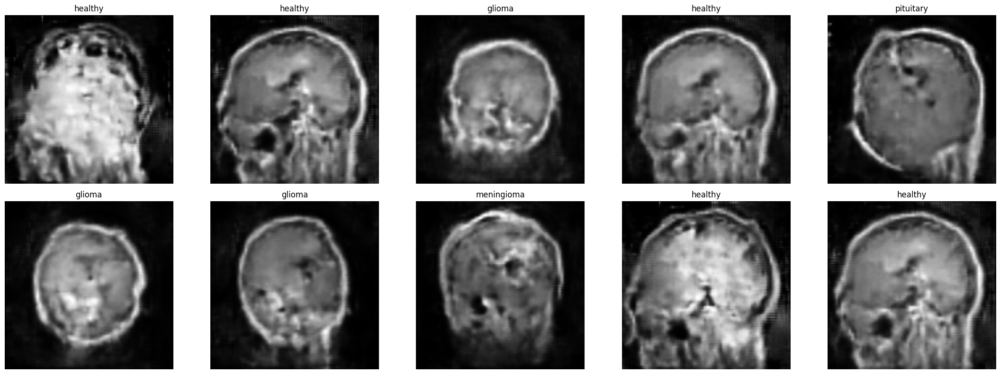

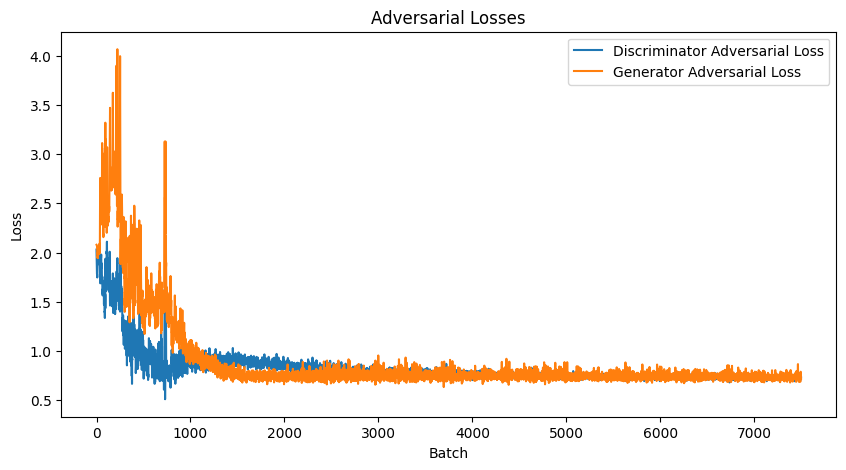

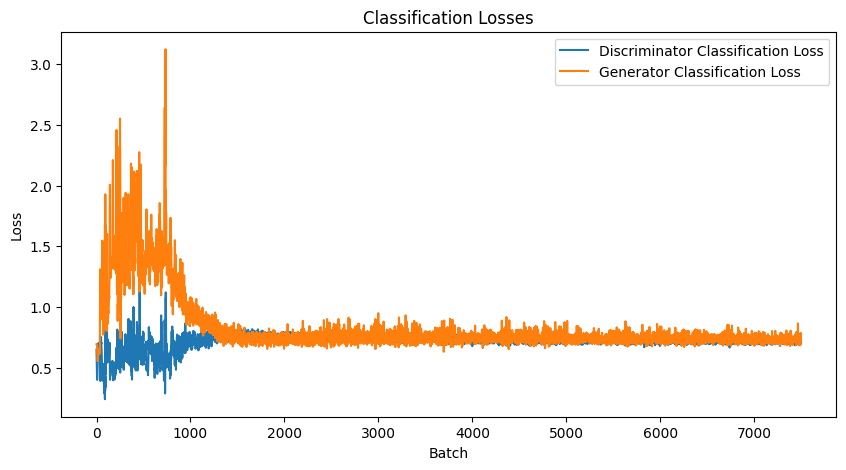

  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 1/3750 [00:00<25:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 2/3750 [00:00<25:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 3/3750 [00:01<25:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<26:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<25:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<25:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 7/3750 [00:02<25:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 8/3750 [00:03<25:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<25:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<25:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 11/3750 [00:04<25:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 12/3750 [00:04<25:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 13/3750 [00:05<25:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 14/3750 [00:05<25:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<26:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:06<25:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 17/3750 [00:07<25:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<25:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:07<25:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 20/3750 [00:08<25:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<25:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:09<25:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 23/3750 [00:09<25:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 24/3750 [00:09<25:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 25/3750 [00:10<25:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 26/3750 [00:10<25:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 28/3750 [00:11<25:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 29/3750 [00:11<25:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 31/3750 [00:12<25:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<25:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<25:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 34/3750 [00:14<25:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<25:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 36/3750 [00:14<25:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<25:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 38/3750 [00:15<25:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:16<25:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 40/3750 [00:16<25:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 41/3750 [00:16<25:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 42/3750 [00:17<25:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:17<25:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:18<25:48,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 45/3750 [00:18<25:40,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 46/3750 [00:19<25:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 47/3750 [00:19<25:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 48/3750 [00:19<25:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:20<25:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 50/3750 [00:20<25:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:21<25:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 52/3750 [00:21<25:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 53/3750 [00:21<25:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 54/3750 [00:22<25:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 55/3750 [00:22<25:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 56/3750 [00:23<25:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 57/3750 [00:23<25:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:24<25:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 59/3750 [00:24<25:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 60/3750 [00:24<25:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 61/3750 [00:25<25:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 62/3750 [00:25<25:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 63/3750 [00:26<25:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:26<25:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 65/3750 [00:26<25:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 66/3750 [00:27<25:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:27<25:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 68/3750 [00:28<25:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 69/3750 [00:28<25:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 70/3750 [00:28<25:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:29<25:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:29<25:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 73/3750 [00:30<25:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 74/3750 [00:30<25:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:30<25:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 76/3750 [00:31<25:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:31<25:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 78/3750 [00:32<25:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:32<25:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:33<25:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:33<25:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:33<25:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 83/3750 [00:34<25:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 84/3750 [00:34<25:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 85/3750 [00:35<25:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 86/3750 [00:35<25:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:35<25:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:36<25:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:36<25:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:37<25:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:37<25:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:37<25:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 93/3750 [00:38<25:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 94/3750 [00:38<24:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 95/3750 [00:39<25:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 96/3750 [00:39<25:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 97/3750 [00:40<25:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 98/3750 [00:40<25:34,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 99/3750 [00:40<25:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:41<25:33,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 101/3750 [00:41<25:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 102/3750 [00:42<25:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 103/3750 [00:42<25:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 104/3750 [00:42<25:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 105/3750 [00:43<25:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 106/3750 [00:43<25:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 107/3750 [00:44<25:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 108/3750 [00:44<25:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 109/3750 [00:45<25:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 110/3750 [00:45<24:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 111/3750 [00:45<25:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 112/3750 [00:46<25:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 113/3750 [00:46<25:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 114/3750 [00:47<24:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 115/3750 [00:47<25:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:47<25:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 117/3750 [00:48<25:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 118/3750 [00:48<25:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:49<24:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 120/3750 [00:49<25:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:50<24:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:50<24:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:50<24:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 124/3750 [00:51<24:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 125/3750 [00:51<24:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:52<24:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 127/3750 [00:52<24:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 128/3750 [00:52<24:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 129/3750 [00:53<24:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 130/3750 [00:53<24:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:54<24:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:54<24:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:54<24:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 134/3750 [00:55<24:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:55<24:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 136/3750 [00:56<24:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 137/3750 [00:56<24:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 138/3750 [00:56<24:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 139/3750 [00:57<25:03,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 140/3750 [00:57<25:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:58<24:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:58<24:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 143/3750 [00:59<24:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 144/3750 [00:59<24:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [01:00<27:26,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [01:00<26:33,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 147/3750 [01:00<25:57,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:01<25:34,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:01<25:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:02<25:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 151/3750 [01:02<24:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 152/3750 [01:02<24:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:03<24:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:03<24:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 155/3750 [01:04<24:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 156/3750 [01:04<24:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 157/3750 [01:04<24:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 158/3750 [01:05<24:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 159/3750 [01:05<24:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 160/3750 [01:06<24:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:06<24:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 162/3750 [01:07<24:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:07<24:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 164/3750 [01:07<24:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 165/3750 [01:08<24:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:08<24:24,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 167/3750 [01:09<24:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:09<24:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 169/3750 [01:09<24:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 170/3750 [01:10<24:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 171/3750 [01:10<24:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:11<24:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:11<24:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 174/3750 [01:11<24:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:12<24:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 176/3750 [01:12<24:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:13<24:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:13<24:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 179/3750 [01:13<24:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 180/3750 [01:14<24:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 181/3750 [01:14<24:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 182/3750 [01:15<24:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 183/3750 [01:15<24:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:16<24:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 185/3750 [01:16<24:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 186/3750 [01:16<24:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 187/3750 [01:17<24:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 188/3750 [01:17<24:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:18<24:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 190/3750 [01:18<24:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 191/3750 [01:18<24:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 192/3750 [01:19<24:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:19<24:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:20<24:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 195/3750 [01:20<24:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 196/3750 [01:20<24:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:21<24:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 198/3750 [01:21<24:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 199/3750 [01:22<25:13,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 200/3750 [01:22<24:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 201/3750 [01:23<24:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 202/3750 [01:23<24:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 203/3750 [01:23<24:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:24<24:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 205/3750 [01:24<24:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 206/3750 [01:25<24:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:25<24:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 208/3750 [01:25<24:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 209/3750 [01:26<24:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 210/3750 [01:26<24:07,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 211/3750 [01:27<24:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 212/3750 [01:27<24:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 213/3750 [01:27<24:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:28<24:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:28<24:00,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 216/3750 [01:29<23:59,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 217/3750 [01:29<23:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [01:30<24:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:30<23:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:30<24:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 221/3750 [01:31<23:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 222/3750 [01:31<23:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 223/3750 [01:32<23:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 224/3750 [01:32<23:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 225/3750 [01:32<24:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [01:33<23:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 227/3750 [01:33<24:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:34<24:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 229/3750 [01:34<23:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 230/3750 [01:34<24:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 231/3750 [01:35<24:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:35<24:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:36<24:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 234/3750 [01:36<24:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 235/3750 [01:36<23:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:37<24:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:37<23:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 238/3750 [01:38<23:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 239/3750 [01:38<23:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 240/3750 [01:39<23:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 241/3750 [01:39<23:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:39<23:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 243/3750 [01:40<23:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:40<23:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 245/3750 [01:41<23:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 246/3750 [01:41<23:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:41<23:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 248/3750 [01:42<23:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:42<23:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:43<23:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:43<23:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 252/3750 [01:43<23:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:44<23:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:44<23:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 255/3750 [01:45<23:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 256/3750 [01:45<23:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 257/3750 [01:45<23:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 258/3750 [01:46<23:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [01:46<23:40,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 260/3750 [01:47<23:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:47<23:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 262/3750 [01:47<23:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 263/3750 [01:48<23:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:48<23:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 265/3750 [01:49<23:44,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 266/3750 [01:49<23:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 267/3750 [01:50<23:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 268/3750 [01:50<23:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 269/3750 [01:50<23:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:51<23:37,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 271/3750 [01:51<23:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [01:52<23:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 273/3750 [01:52<23:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 274/3750 [01:52<23:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:53<23:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 276/3750 [01:53<23:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:54<23:39,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 278/3750 [01:54<23:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:54<23:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 280/3750 [01:55<23:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 281/3750 [01:55<23:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 282/3750 [01:56<23:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 283/3750 [01:56<23:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:57<23:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:57<23:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 286/3750 [01:57<23:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 287/3750 [01:58<23:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 288/3750 [01:58<23:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [01:59<23:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 290/3750 [01:59<23:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [01:59<23:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 292/3750 [02:00<23:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [02:00<23:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [02:01<23:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 295/3750 [02:01<23:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 296/3750 [02:01<23:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 297/3750 [02:02<23:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 298/3750 [02:02<23:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 299/3750 [02:03<23:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 300/3750 [02:03<23:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [02:03<23:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:04<23:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 303/3750 [02:04<23:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 304/3750 [02:05<23:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 305/3750 [02:05<23:22,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 306/3750 [02:06<23:23,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 307/3750 [02:06<23:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:06<23:23,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 309/3750 [02:07<23:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:07<23:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:08<23:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:08<23:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:08<23:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 314/3750 [02:09<23:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:09<23:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 316/3750 [02:10<23:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:10<23:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:10<23:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:11<23:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:11<23:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:12<23:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 322/3750 [02:12<23:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:13<23:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 324/3750 [02:13<23:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 325/3750 [02:13<23:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 326/3750 [02:14<23:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 327/3750 [02:14<23:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 328/3750 [02:15<23:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:15<23:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 330/3750 [02:15<23:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 331/3750 [02:16<23:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 332/3750 [02:16<23:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 333/3750 [02:17<23:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:17<23:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:17<23:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 336/3750 [02:18<23:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 337/3750 [02:18<23:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:19<23:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 339/3750 [02:19<23:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:19<23:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:20<23:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 342/3750 [02:20<23:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:21<23:05,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 344/3750 [02:21<23:05,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 345/3750 [02:22<23:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 346/3750 [02:22<23:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 347/3750 [02:22<23:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 348/3750 [02:23<23:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 349/3750 [02:23<23:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 350/3750 [02:24<23:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 351/3750 [02:24<23:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:24<23:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 353/3750 [02:25<23:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 354/3750 [02:25<23:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 355/3750 [02:26<23:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 356/3750 [02:26<23:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 357/3750 [02:26<23:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 358/3750 [02:27<23:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 359/3750 [02:27<23:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 360/3750 [02:28<23:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 361/3750 [02:28<23:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 362/3750 [02:28<22:58,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 363/3750 [02:29<23:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:29<23:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 365/3750 [02:30<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 366/3750 [02:30<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:31<23:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 368/3750 [02:31<23:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:31<23:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:32<23:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 371/3750 [02:32<23:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:33<23:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:33<23:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 374/3750 [02:33<23:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:34<23:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 376/3750 [02:34<23:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 377/3750 [02:35<22:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 378/3750 [02:35<22:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 379/3750 [02:35<22:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:36<23:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 381/3750 [02:36<23:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 382/3750 [02:37<23:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 383/3750 [02:37<23:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:38<23:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:38<22:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 386/3750 [02:38<22:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 387/3750 [02:39<22:53,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 388/3750 [02:39<22:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 389/3750 [02:40<22:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 390/3750 [02:40<22:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [02:40<23:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [02:41<23:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 393/3750 [02:41<23:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 394/3750 [02:42<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:42<23:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 396/3750 [02:42<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 397/3750 [02:43<22:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 398/3750 [02:43<22:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:44<22:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 400/3750 [02:44<22:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:44<22:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 402/3750 [02:45<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 403/3750 [02:45<22:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 404/3750 [02:46<22:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 405/3750 [02:46<22:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:47<22:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:47<22:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 408/3750 [02:47<22:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 409/3750 [02:48<23:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 410/3750 [02:48<22:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:49<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:49<22:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:49<22:49,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 414/3750 [02:50<22:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 415/3750 [02:50<22:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:51<22:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 417/3750 [02:51<22:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 418/3750 [02:51<22:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 419/3750 [02:52<22:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 420/3750 [02:52<22:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:53<22:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 422/3750 [02:53<22:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 423/3750 [02:54<22:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:54<22:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 425/3750 [02:54<22:38,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 426/3750 [02:55<22:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:55<22:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:56<22:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 429/3750 [02:56<22:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 430/3750 [02:56<22:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 431/3750 [02:57<22:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [02:57<22:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [02:58<22:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 434/3750 [02:58<22:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [02:58<22:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [02:59<22:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [02:59<22:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 438/3750 [03:00<22:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 439/3750 [03:00<22:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 440/3750 [03:00<22:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [03:01<22:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 442/3750 [03:01<22:29,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 443/3750 [03:02<22:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 444/3750 [03:02<22:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:03<22:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:03<22:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:03<22:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 448/3750 [03:04<22:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 449/3750 [03:04<22:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 450/3750 [03:05<22:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:05<22:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:05<22:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:06<22:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 454/3750 [03:06<22:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:07<22:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 456/3750 [03:07<22:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:07<22:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 458/3750 [03:08<22:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:08<22:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:09<22:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 461/3750 [03:09<22:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 462/3750 [03:10<22:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 463/3750 [03:10<22:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 464/3750 [03:10<22:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 465/3750 [03:11<22:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 466/3750 [03:11<22:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 467/3750 [03:12<22:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:12<22:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:12<22:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:13<22:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 471/3750 [03:13<22:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 472/3750 [03:14<22:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:14<22:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:14<22:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 475/3750 [03:15<22:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 476/3750 [03:15<22:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:16<22:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 478/3750 [03:16<22:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:16<22:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 480/3750 [03:17<22:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:17<22:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:18<22:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 483/3750 [03:18<22:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:19<22:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 485/3750 [03:19<22:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 486/3750 [03:19<22:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 487/3750 [03:20<22:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 488/3750 [03:20<22:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:21<22:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 490/3750 [03:21<22:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 491/3750 [03:21<22:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 492/3750 [03:22<22:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 493/3750 [03:22<22:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 494/3750 [03:23<22:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 495/3750 [03:23<22:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 496/3750 [03:23<22:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 497/3750 [03:24<22:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 498/3750 [03:24<22:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:25<22:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:25<22:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:26<22:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:26<22:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:26<22:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 504/3750 [03:27<22:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:27<22:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 506/3750 [03:28<22:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:28<22:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:28<22:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:29<22:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:29<22:18,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▎        | 511/3750 [03:30<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:30<22:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 513/3750 [03:30<22:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 514/3750 [03:31<22:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:31<22:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 516/3750 [03:32<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:32<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:33<22:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 519/3750 [03:33<22:13,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 520/3750 [03:33<22:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:34<22:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 522/3750 [03:34<22:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 523/3750 [03:35<22:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 524/3750 [03:35<22:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 525/3750 [03:35<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:36<22:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 527/3750 [03:36<22:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 528/3750 [03:37<22:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:37<22:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 530/3750 [03:37<21:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 531/3750 [03:38<21:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 532/3750 [03:38<21:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:39<21:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 534/3750 [03:39<21:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 535/3750 [03:40<21:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 536/3750 [03:40<22:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:41<27:38,  1.94it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 538/3750 [03:41<26:07,  2.05it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:42<24:56,  2.15it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 540/3750 [03:42<24:06,  2.22it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:42<23:29,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 542/3750 [03:43<23:02,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 543/3750 [03:43<22:58,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:44<22:55,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:44<22:42,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 546/3750 [03:44<22:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:45<22:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 548/3750 [03:45<22:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 549/3750 [03:46<22:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:46<22:16,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 551/3750 [03:47<22:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:47<22:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 553/3750 [03:47<22:09,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 554/3750 [03:48<22:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:48<22:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:49<22:09,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 557/3750 [03:49<22:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 558/3750 [03:49<22:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 559/3750 [03:50<22:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 560/3750 [03:50<22:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:51<22:11,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 562/3750 [03:51<22:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:52<22:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:52<22:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:52<22:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:53<21:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 567/3750 [03:53<21:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:54<21:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 569/3750 [03:54<21:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:54<21:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:55<22:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 572/3750 [03:55<21:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:56<21:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 574/3750 [03:56<21:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [03:57<21:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [03:57<21:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [03:57<21:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 578/3750 [03:58<21:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 579/3750 [03:58<22:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [03:59<22:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [03:59<22:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 582/3750 [03:59<21:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 583/3750 [04:00<21:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 584/3750 [04:00<21:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 585/3750 [04:01<22:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 586/3750 [04:01<21:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 587/3750 [04:02<22:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 588/3750 [04:02<22:13,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 589/3750 [04:02<22:11,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 590/3750 [04:03<22:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 591/3750 [04:03<21:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 592/3750 [04:04<21:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:04<21:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 594/3750 [04:04<21:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 595/3750 [04:05<21:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:05<21:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [04:06<21:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 598/3750 [04:06<21:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 599/3750 [04:07<21:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 600/3750 [04:07<21:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 601/3750 [04:07<21:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:08<21:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 603/3750 [04:08<21:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 604/3750 [04:09<21:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:09<21:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 606/3750 [04:09<21:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:10<21:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 608/3750 [04:10<22:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 609/3750 [04:11<22:06,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 610/3750 [04:11<21:57,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 611/3750 [04:12<21:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 612/3750 [04:12<21:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 613/3750 [04:12<21:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [04:13<21:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:13<21:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 616/3750 [04:14<21:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:14<21:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 618/3750 [04:14<21:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:15<21:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 620/3750 [04:15<21:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:16<21:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:16<21:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:17<21:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:17<21:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 625/3750 [04:17<21:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:18<21:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:18<21:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 628/3750 [04:19<21:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:19<21:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:19<21:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:20<21:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 632/3750 [04:20<21:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:21<21:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 634/3750 [04:21<21:47,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 635/3750 [04:22<21:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 636/3750 [04:22<21:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 637/3750 [04:22<21:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 638/3750 [04:23<21:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 639/3750 [04:23<21:36,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 640/3750 [04:24<21:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 641/3750 [04:24<21:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 642/3750 [04:24<21:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 643/3750 [04:25<21:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 644/3750 [04:25<21:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:26<21:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 646/3750 [04:26<21:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 647/3750 [04:27<21:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:27<21:44,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 649/3750 [04:27<21:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 650/3750 [04:28<21:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 651/3750 [04:28<21:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 652/3750 [04:29<21:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 653/3750 [04:29<21:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 654/3750 [04:29<21:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 655/3750 [04:30<21:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:30<21:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 657/3750 [04:31<21:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 658/3750 [04:31<21:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:32<21:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 660/3750 [04:32<21:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 661/3750 [04:32<21:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 662/3750 [04:33<21:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 663/3750 [04:33<21:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:34<21:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 665/3750 [04:34<21:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 666/3750 [04:34<21:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:35<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:35<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:36<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 670/3750 [04:36<21:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 671/3750 [04:36<21:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 672/3750 [04:37<21:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 673/3750 [04:37<21:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 674/3750 [04:38<21:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [04:38<21:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 676/3750 [04:39<21:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:39<21:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 678/3750 [04:39<21:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:40<21:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 680/3750 [04:40<21:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 681/3750 [04:41<21:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 682/3750 [04:41<21:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 683/3750 [04:41<21:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:42<21:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 685/3750 [04:42<21:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 686/3750 [04:43<21:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 687/3750 [04:43<20:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:44<21:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:44<21:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 690/3750 [04:44<21:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 691/3750 [04:45<21:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 692/3750 [04:45<21:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 693/3750 [04:46<21:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 694/3750 [04:46<21:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:46<21:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:47<21:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 697/3750 [04:47<21:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 698/3750 [04:48<21:05,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 699/3750 [04:48<21:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:48<21:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 701/3750 [04:49<21:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 702/3750 [04:49<21:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 703/3750 [04:50<21:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 704/3750 [04:50<21:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 705/3750 [04:51<20:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:51<21:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:51<21:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 708/3750 [04:52<21:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 709/3750 [04:52<20:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 710/3750 [04:53<21:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:53<20:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 712/3750 [04:53<20:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 713/3750 [04:54<21:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [04:54<20:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 715/3750 [04:55<20:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:55<20:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 717/3750 [04:56<20:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 718/3750 [04:56<20:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [04:56<20:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 720/3750 [04:57<20:54,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 721/3750 [04:57<20:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 722/3750 [04:58<20:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [04:58<20:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 724/3750 [04:58<20:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [04:59<20:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [04:59<20:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 727/3750 [05:00<20:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 728/3750 [05:00<20:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 729/3750 [05:01<20:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 730/3750 [05:01<20:54,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 731/3750 [05:01<20:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 732/3750 [05:02<20:51,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 733/3750 [05:02<20:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [05:03<20:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 735/3750 [05:03<20:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:03<20:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [05:04<20:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 738/3750 [05:04<20:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 739/3750 [05:05<20:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 740/3750 [05:05<20:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:05<20:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 742/3750 [05:06<20:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:06<20:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 744/3750 [05:07<20:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:07<20:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 746/3750 [05:08<20:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 747/3750 [05:08<20:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 748/3750 [05:08<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 749/3750 [05:09<20:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 750/3750 [05:09<20:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 751/3750 [05:10<20:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 752/3750 [05:10<20:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 753/3750 [05:10<20:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 754/3750 [05:11<20:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [05:11<20:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 756/3750 [05:12<20:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 757/3750 [05:12<20:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:13<20:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 759/3750 [05:13<20:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 760/3750 [05:13<20:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 761/3750 [05:14<20:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:14<20:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 763/3750 [05:15<20:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 764/3750 [05:15<20:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 765/3750 [05:15<20:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:16<20:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 767/3750 [05:16<20:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 768/3750 [05:17<20:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 769/3750 [05:17<20:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:17<20:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 771/3750 [05:18<20:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 772/3750 [05:18<20:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 773/3750 [05:19<20:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 774/3750 [05:19<20:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 775/3750 [05:20<20:30,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 776/3750 [05:20<20:28,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 777/3750 [05:20<20:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:21<20:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:21<20:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:22<20:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 781/3750 [05:22<20:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 782/3750 [05:22<20:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 783/3750 [05:23<20:34,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 784/3750 [05:23<20:28,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 785/3750 [05:24<20:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:24<20:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:25<20:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 788/3750 [05:25<20:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 789/3750 [05:25<20:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:26<20:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 791/3750 [05:26<20:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 792/3750 [05:27<20:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 793/3750 [05:27<20:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 794/3750 [05:27<20:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 795/3750 [05:28<20:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:28<20:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:29<20:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:29<20:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 799/3750 [05:29<20:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 800/3750 [05:30<20:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:30<20:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 802/3750 [05:31<20:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:31<20:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:32<20:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 805/3750 [05:32<20:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 806/3750 [05:32<20:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:33<20:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:33<20:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 809/3750 [05:34<20:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 810/3750 [05:34<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:34<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:35<20:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 813/3750 [05:35<20:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 814/3750 [05:36<20:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [05:36<20:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 816/3750 [05:36<20:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 817/3750 [05:37<20:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 818/3750 [05:37<20:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 819/3750 [05:38<20:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 820/3750 [05:38<20:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 821/3750 [05:39<20:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:39<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 823/3750 [05:39<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 824/3750 [05:40<20:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:40<20:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:41<20:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 827/3750 [05:41<20:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 828/3750 [05:41<20:06,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 829/3750 [05:42<20:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 830/3750 [05:42<20:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:43<20:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:43<20:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 833/3750 [05:44<20:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 834/3750 [05:44<20:28,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 835/3750 [05:44<20:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:45<20:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 837/3750 [05:45<20:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:46<20:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:46<20:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 840/3750 [05:46<20:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:47<20:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 842/3750 [05:47<20:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 843/3750 [05:48<20:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:48<20:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 845/3750 [05:49<20:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 846/3750 [05:49<19:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 847/3750 [05:49<19:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 848/3750 [05:50<19:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 849/3750 [05:50<19:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 850/3750 [05:51<19:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 851/3750 [05:51<19:52,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 852/3750 [05:51<19:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 853/3750 [05:52<19:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 854/3750 [05:52<19:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:53<19:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 856/3750 [05:53<19:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 857/3750 [05:53<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:54<19:52,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 859/3750 [05:54<19:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 860/3750 [05:55<19:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 861/3750 [05:55<19:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 862/3750 [05:56<19:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 863/3750 [05:56<19:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [05:56<19:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [05:57<19:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 866/3750 [05:57<19:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [05:58<19:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [05:58<19:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 869/3750 [05:58<19:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [05:59<20:04,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 871/3750 [05:59<19:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 872/3750 [06:00<19:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 873/3750 [06:00<19:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [06:00<19:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 875/3750 [06:01<19:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [06:01<19:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 877/3750 [06:02<19:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 878/3750 [06:02<19:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [06:03<19:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [06:03<19:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [06:03<19:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [06:04<19:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 883/3750 [06:04<19:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 884/3750 [06:05<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 885/3750 [06:05<19:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:05<19:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 887/3750 [06:06<19:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:06<19:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:07<19:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 890/3750 [06:07<19:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 891/3750 [06:08<21:43,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 892/3750 [06:08<21:01,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:08<20:31,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 894/3750 [06:09<20:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:09<20:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 896/3750 [06:10<19:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:10<19:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:11<19:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:11<19:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [06:11<19:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 901/3750 [06:12<19:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 902/3750 [06:12<19:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 903/3750 [06:13<19:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 904/3750 [06:13<19:23,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 905/3750 [06:13<19:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:14<19:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 907/3750 [06:14<19:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 908/3750 [06:15<19:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:15<19:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 910/3750 [06:15<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 911/3750 [06:16<19:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:16<19:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 913/3750 [06:17<19:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 914/3750 [06:17<19:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:18<19:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:18<19:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:18<19:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 918/3750 [06:19<19:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 919/3750 [06:19<19:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:20<19:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 921/3750 [06:20<19:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:20<19:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 923/3750 [06:21<19:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:21<19:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:22<19:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:22<19:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 927/3750 [06:22<19:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [06:23<19:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 929/3750 [06:23<19:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [06:24<19:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:24<19:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 932/3750 [06:24<19:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:25<19:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 934/3750 [06:25<19:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 935/3750 [06:26<19:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 936/3750 [06:26<19:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 937/3750 [06:27<19:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 938/3750 [06:27<19:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 939/3750 [06:27<19:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 940/3750 [06:28<19:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:28<19:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:29<19:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:29<19:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 944/3750 [06:29<19:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 945/3750 [06:30<19:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 946/3750 [06:30<19:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 947/3750 [06:31<19:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 948/3750 [06:31<19:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 949/3750 [06:31<19:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 950/3750 [06:32<19:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:32<19:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:33<19:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:33<19:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 954/3750 [06:34<19:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:34<19:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:34<19:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:35<19:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 958/3750 [06:35<19:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 959/3750 [06:36<19:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:36<19:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:36<19:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 962/3750 [06:37<19:10,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 963/3750 [06:37<19:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 964/3750 [06:38<19:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:38<19:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 966/3750 [06:38<18:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 967/3750 [06:39<18:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 968/3750 [06:39<18:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 969/3750 [06:40<18:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:40<18:55,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 971/3750 [06:41<19:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 972/3750 [06:41<19:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 973/3750 [06:41<19:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 974/3750 [06:42<19:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 975/3750 [06:42<19:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 976/3750 [06:43<18:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 977/3750 [06:43<18:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 978/3750 [06:43<18:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 979/3750 [06:44<18:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 980/3750 [06:44<19:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:45<18:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:45<19:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:45<18:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 984/3750 [06:46<18:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:46<18:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 986/3750 [06:47<18:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 987/3750 [06:47<18:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 988/3750 [06:47<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 989/3750 [06:48<18:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:48<18:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:49<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 992/3750 [06:49<18:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:50<18:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 994/3750 [06:50<18:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 995/3750 [06:50<18:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 996/3750 [06:51<18:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:51<18:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 998/3750 [06:52<18:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:52<18:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:52<18:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1001/3750 [06:53<18:47,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1002/3750 [06:53<18:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1003/3750 [06:54<18:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [06:54<18:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [06:54<18:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [06:55<18:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [06:55<18:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1008/3750 [06:56<18:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [06:56<18:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [06:57<18:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1011/3750 [06:57<18:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [06:57<18:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1013/3750 [06:58<18:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [06:58<18:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [06:59<18:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [06:59<18:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [06:59<18:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [07:00<18:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [07:00<18:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1020/3750 [07:01<18:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [07:01<18:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [07:01<18:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1023/3750 [07:02<18:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [07:02<18:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1025/3750 [07:03<18:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [07:03<18:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1027/3750 [07:03<18:33,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1028/3750 [07:04<18:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:04<18:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:05<18:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1031/3750 [07:05<18:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:06<18:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1033/3750 [07:06<18:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:06<18:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1035/3750 [07:07<18:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1036/3750 [07:07<18:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:08<18:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:08<18:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:08<18:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1040/3750 [07:09<18:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:09<18:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1042/3750 [07:10<18:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:10<18:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1044/3750 [07:10<18:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1045/3750 [07:11<18:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1046/3750 [07:11<18:28,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1047/3750 [07:12<18:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1048/3750 [07:12<18:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:12<18:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:13<18:17,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1051/3750 [07:13<18:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1052/3750 [07:14<18:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1053/3750 [07:14<18:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:15<18:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:15<18:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:15<18:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1057/3750 [07:16<18:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1058/3750 [07:16<18:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:17<18:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:17<18:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1061/3750 [07:17<18:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:18<18:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1063/3750 [07:18<18:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:19<18:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:19<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1066/3750 [07:19<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:20<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:20<18:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [07:21<18:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:21<18:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1071/3750 [07:21<18:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1072/3750 [07:22<18:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1073/3750 [07:22<18:28,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1074/3750 [07:23<18:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1075/3750 [07:23<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1076/3750 [07:24<18:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1077/3750 [07:24<18:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:24<18:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1079/3750 [07:25<18:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1080/3750 [07:25<18:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1081/3750 [07:26<18:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:26<18:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1083/3750 [07:26<18:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:27<18:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:27<18:05,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:28<18:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:28<18:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1088/3750 [07:28<18:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1089/3750 [07:29<18:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1090/3750 [07:29<18:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1091/3750 [07:30<18:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:30<18:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1093/3750 [07:31<18:49,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1094/3750 [07:31<18:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:31<18:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:32<18:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [07:32<18:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:33<18:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1099/3750 [07:33<18:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1100/3750 [07:33<18:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1101/3750 [07:34<18:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:34<17:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1103/3750 [07:35<17:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:35<18:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:35<18:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:36<18:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1107/3750 [07:36<18:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:37<18:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:37<18:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1110/3750 [07:38<18:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:38<18:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:38<18:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:39<18:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1114/3750 [07:39<18:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1115/3750 [07:40<18:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:40<18:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:40<18:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1118/3750 [07:41<17:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1119/3750 [07:41<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:42<17:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:42<17:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1122/3750 [07:42<17:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1123/3750 [07:43<17:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:43<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:44<18:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:44<18:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1127/3750 [07:45<18:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1128/3750 [07:45<18:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:45<17:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1130/3750 [07:46<17:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:46<17:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:47<17:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:47<17:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1134/3750 [07:47<17:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1135/3750 [07:48<17:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:48<17:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1137/3750 [07:49<17:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1138/3750 [07:49<17:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:49<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:50<17:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1141/3750 [07:50<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1142/3750 [07:51<17:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:51<17:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:51<17:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1145/3750 [07:52<17:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1146/3750 [07:52<17:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1147/3750 [07:53<17:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1148/3750 [07:53<17:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [07:54<17:42,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1150/3750 [07:54<17:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1151/3750 [07:54<17:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [07:55<17:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [07:55<17:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1154/3750 [07:56<17:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [07:56<17:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1156/3750 [07:56<17:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1157/3750 [07:57<17:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1158/3750 [07:57<17:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1159/3750 [07:58<17:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [07:58<17:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [07:58<17:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1162/3750 [07:59<17:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [07:59<17:41,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1164/3750 [08:00<17:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1165/3750 [08:00<17:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1166/3750 [08:00<17:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1167/3750 [08:01<17:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1168/3750 [08:01<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [08:02<17:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1170/3750 [08:02<17:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1171/3750 [08:03<17:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [08:03<17:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [08:03<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [08:04<17:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1175/3750 [08:04<17:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1176/3750 [08:05<17:27,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1177/3750 [08:05<17:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1178/3750 [08:05<17:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1179/3750 [08:06<17:29,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1180/3750 [08:06<17:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1181/3750 [08:07<17:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:07<17:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1183/3750 [08:07<17:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1184/3750 [08:08<17:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:08<17:24,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1186/3750 [08:09<17:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1187/3750 [08:09<17:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1188/3750 [08:09<17:20,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1189/3750 [08:10<17:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:10<17:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:11<17:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:11<17:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1193/3750 [08:12<17:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1194/3750 [08:12<17:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1195/3750 [08:12<17:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1196/3750 [08:13<17:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:13<17:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:14<17:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1199/3750 [08:14<17:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:14<17:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1201/3750 [08:15<17:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1202/3750 [08:15<17:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:16<17:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:16<17:16,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1205/3750 [08:16<17:13,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:17<17:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:17<17:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:18<17:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:18<17:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1210/3750 [08:18<17:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1211/3750 [08:19<17:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:19<17:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:20<17:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:20<17:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1215/3750 [08:21<17:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:21<17:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1217/3750 [08:21<17:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:22<17:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:22<17:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1220/3750 [08:23<17:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:23<17:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1222/3750 [08:23<17:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:24<17:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1224/3750 [08:24<17:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1225/3750 [08:25<17:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1226/3750 [08:25<17:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:25<17:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:26<17:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1229/3750 [08:26<17:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:27<17:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1231/3750 [08:27<17:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1232/3750 [08:27<17:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:28<17:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1234/3750 [08:28<17:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:29<17:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1236/3750 [08:29<17:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1237/3750 [08:30<17:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:30<17:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:30<17:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:31<17:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1241/3750 [08:31<17:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:32<17:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:32<17:47,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1244/3750 [08:32<17:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:33<17:19,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1246/3750 [08:33<17:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:34<17:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:34<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:34<17:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1250/3750 [08:35<16:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1251/3750 [08:35<16:54,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1252/3750 [08:36<16:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1253/3750 [08:36<17:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:37<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:37<17:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:37<17:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:38<17:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1258/3750 [08:38<17:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1259/3750 [08:39<17:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1260/3750 [08:39<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:39<17:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1262/3750 [08:40<16:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1263/3750 [08:40<16:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:41<16:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1265/3750 [08:41<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1266/3750 [08:41<17:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:42<17:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:42<17:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:43<17:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1270/3750 [08:43<17:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:44<16:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1272/3750 [08:44<16:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:44<16:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:45<16:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1275/3750 [08:45<16:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1276/3750 [08:46<16:46,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1277/3750 [08:46<16:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:46<16:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:47<16:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:47<16:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1281/3750 [08:48<16:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1282/3750 [08:48<16:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:48<16:42,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1284/3750 [08:49<16:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1285/3750 [08:49<16:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:50<16:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1287/3750 [08:50<16:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1288/3750 [08:50<16:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1289/3750 [08:51<16:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:51<16:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [08:52<16:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [08:52<16:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1293/3750 [08:53<17:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1294/3750 [08:53<16:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [08:53<16:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [08:54<16:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [08:54<16:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [08:55<16:50,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1299/3750 [08:55<16:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [08:55<16:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1301/3750 [08:56<16:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1302/3750 [08:56<16:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [08:57<16:34,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [08:57<16:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1305/3750 [08:57<16:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [08:58<16:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1307/3750 [08:58<16:41,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1308/3750 [08:59<16:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [08:59<16:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [08:59<16:33,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1311/3750 [09:00<16:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [09:00<16:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1313/3750 [09:01<16:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1314/3750 [09:01<16:28,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1315/3750 [09:01<16:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1316/3750 [09:02<16:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [09:02<16:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [09:03<16:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [09:03<16:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [09:04<16:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1321/3750 [09:04<16:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:04<16:36,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1323/3750 [09:05<16:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1324/3750 [09:05<16:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:06<16:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:06<16:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:06<16:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [09:07<16:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1329/3750 [09:07<16:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1330/3750 [09:08<16:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1331/3750 [09:08<16:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1332/3750 [09:08<16:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:09<16:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:09<16:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1335/3750 [09:10<16:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1336/3750 [09:10<16:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1337/3750 [09:11<16:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:11<16:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1339/3750 [09:11<16:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:12<16:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:12<16:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:13<16:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1343/3750 [09:13<16:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1344/3750 [09:13<16:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1345/3750 [09:14<16:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:14<16:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:15<16:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1348/3750 [09:15<16:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1349/3750 [09:15<16:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1350/3750 [09:16<16:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:16<16:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:17<16:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:17<16:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1354/3750 [09:17<16:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1355/3750 [09:18<16:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:18<16:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1357/3750 [09:19<16:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1358/3750 [09:19<16:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:20<16:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:20<16:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:20<16:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1362/3750 [09:21<16:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:21<16:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:22<16:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1365/3750 [09:22<16:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:22<16:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:23<16:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1368/3750 [09:23<16:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:24<16:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:24<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1371/3750 [09:24<16:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1372/3750 [09:25<16:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1373/3750 [09:25<16:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1374/3750 [09:26<16:07,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1375/3750 [09:26<16:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1376/3750 [09:26<16:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1377/3750 [09:27<16:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1378/3750 [09:27<16:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1379/3750 [09:28<16:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:28<16:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1381/3750 [09:29<16:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1382/3750 [09:29<16:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1383/3750 [09:29<16:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1384/3750 [09:30<16:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1385/3750 [09:30<16:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1386/3750 [09:31<16:06,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1387/3750 [09:31<16:02,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1388/3750 [09:31<16:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:32<16:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:32<16:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1391/3750 [09:33<16:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1392/3750 [09:33<16:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1393/3750 [09:33<16:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1394/3750 [09:34<16:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1395/3750 [09:34<16:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1396/3750 [09:35<16:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1397/3750 [09:35<16:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1398/3750 [09:35<16:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1399/3750 [09:36<16:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1400/3750 [09:36<16:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:37<15:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:37<15:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1403/3750 [09:38<16:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:38<15:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [09:38<16:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:39<16:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:39<16:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1408/3750 [09:40<16:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1409/3750 [09:40<15:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:40<15:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1411/3750 [09:41<15:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:41<15:50,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1413/3750 [09:42<15:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1414/3750 [09:42<15:46,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:42<15:51,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1416/3750 [09:43<15:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:43<15:48,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1418/3750 [09:44<15:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1419/3750 [09:44<15:48,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1420/3750 [09:44<15:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:45<15:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [09:45<15:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:46<15:47,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1424/3750 [09:46<15:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1425/3750 [09:47<15:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1426/3750 [09:47<15:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:47<15:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1428/3750 [09:48<15:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:48<15:42,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1430/3750 [09:49<15:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:49<15:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:49<15:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:50<15:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1434/3750 [09:50<15:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [09:51<15:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1436/3750 [09:51<15:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1437/3750 [09:51<15:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1438/3750 [09:52<15:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1439/3750 [09:52<15:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [09:53<15:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1441/3750 [09:53<15:35,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [09:53<15:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [09:54<15:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1444/3750 [09:54<15:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [09:55<15:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [09:55<15:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [09:55<15:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [09:56<15:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1449/3750 [09:56<15:39,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1450/3750 [09:57<15:36,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1451/3750 [09:57<15:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1452/3750 [09:58<15:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1453/3750 [09:58<15:34,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1454/3750 [09:58<15:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1455/3750 [09:59<15:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [09:59<15:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [10:00<15:33,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [10:00<15:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1459/3750 [10:00<15:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [10:01<15:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1461/3750 [10:01<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1462/3750 [10:02<15:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [10:02<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1464/3750 [10:02<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [10:03<15:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1466/3750 [10:03<15:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:04<15:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1468/3750 [10:04<15:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:04<15:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1470/3750 [10:05<15:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1471/3750 [10:05<15:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:06<15:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:06<15:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1474/3750 [10:07<15:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1475/3750 [10:07<15:22,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1476/3750 [10:07<15:21,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1477/3750 [10:08<15:22,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1478/3750 [10:08<15:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1479/3750 [10:09<15:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:09<15:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:09<15:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1482/3750 [10:10<15:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:10<15:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [10:11<15:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:11<15:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1486/3750 [10:11<15:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:12<15:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1488/3750 [10:12<15:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1489/3750 [10:13<15:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1490/3750 [10:13<15:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:13<15:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1492/3750 [10:14<15:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1493/3750 [10:14<15:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1494/3750 [10:15<15:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1495/3750 [10:15<15:20,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1496/3750 [10:16<15:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:16<15:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1498/3750 [10:16<15:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:17<15:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1500/3750 [10:17<15:23,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1501/3750 [10:18<15:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1502/3750 [10:18<15:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:18<15:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1504/3750 [10:19<15:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:19<15:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:20<15:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1507/3750 [10:20<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [10:20<15:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:21<15:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:21<15:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1511/3750 [10:22<15:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1512/3750 [10:22<15:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:22<15:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:23<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1515/3750 [10:23<15:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1516/3750 [10:24<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1517/3750 [10:24<15:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:25<15:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:25<15:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1520/3750 [10:25<15:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1521/3750 [10:26<15:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1522/3750 [10:26<15:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:27<15:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:27<16:48,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:28<16:27,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:28<16:02,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:28<15:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1528/3750 [10:29<15:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:29<15:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:30<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:30<15:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1532/3750 [10:30<15:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1533/3750 [10:31<15:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1534/3750 [10:31<15:03,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1535/3750 [10:32<15:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:32<15:01,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1537/3750 [10:32<14:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:33<15:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [10:33<14:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:34<14:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1541/3750 [10:34<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1542/3750 [10:35<15:33,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:35<15:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:35<15:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:36<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:36<15:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:37<15:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1548/3750 [10:37<15:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:37<15:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1550/3750 [10:38<15:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:38<15:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:39<14:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1553/3750 [10:39<14:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1554/3750 [10:39<14:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:40<14:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1556/3750 [10:40<14:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:41<14:52,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:41<14:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1559/3750 [10:41<15:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1560/3750 [10:42<14:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:42<14:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:43<14:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:43<14:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1564/3750 [10:43<14:50,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:44<14:48,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1566/3750 [10:44<14:45,  2.47it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1567/3750 [10:45<14:51,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1568/3750 [10:45<14:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1569/3750 [10:46<15:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1570/3750 [10:46<15:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:46<15:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1572/3750 [10:47<14:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1573/3750 [10:47<14:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:48<14:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:48<14:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:48<14:47,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1577/3750 [10:49<14:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [10:49<14:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1579/3750 [10:50<14:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [10:50<14:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1581/3750 [10:50<14:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [10:51<14:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [10:51<14:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [10:52<14:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1585/3750 [10:52<14:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1586/3750 [10:53<14:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [10:53<14:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1588/3750 [10:53<14:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [10:54<14:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1590/3750 [10:54<14:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1591/3750 [10:55<14:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1592/3750 [10:55<14:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1593/3750 [10:55<14:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1594/3750 [10:56<14:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [10:56<14:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1596/3750 [10:57<18:39,  1.92it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [10:57<17:30,  2.05it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [10:58<16:49,  2.13it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [10:58<16:16,  2.20it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1600/3750 [10:59<15:59,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [10:59<15:36,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [11:00<15:26,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1603/3750 [11:00<15:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [11:00<15:14,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [11:01<15:19,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [11:01<15:09,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1607/3750 [11:02<15:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1608/3750 [11:02<15:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1609/3750 [11:02<14:57,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1610/3750 [11:03<14:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1611/3750 [11:03<14:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1612/3750 [11:04<14:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1613/3750 [11:04<14:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1614/3750 [11:05<14:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1615/3750 [11:05<14:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:05<14:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1617/3750 [11:06<14:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1618/3750 [11:06<14:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:07<14:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:07<14:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:07<14:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [11:08<14:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:08<14:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1624/3750 [11:09<14:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1625/3750 [11:09<14:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:10<14:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1627/3750 [11:10<14:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1628/3750 [11:10<14:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:11<14:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1630/3750 [11:11<14:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1631/3750 [11:12<14:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:12<14:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:12<14:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1634/3750 [11:13<14:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1635/3750 [11:13<14:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1636/3750 [11:14<14:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:14<14:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1638/3750 [11:15<14:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1639/3750 [11:15<14:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1640/3750 [11:15<14:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1641/3750 [11:16<14:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:16<14:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:17<14:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1644/3750 [11:17<14:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:17<14:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:18<14:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:18<14:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1648/3750 [11:19<14:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:19<14:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:20<14:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:20<14:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1652/3750 [11:20<14:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:21<14:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1654/3750 [11:21<14:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1655/3750 [11:22<14:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1656/3750 [11:22<14:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:22<14:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:23<14:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:23<14:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1660/3750 [11:24<14:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:24<14:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:25<14:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:25<14:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1664/3750 [11:25<14:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:26<14:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1666/3750 [11:26<14:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1667/3750 [11:27<14:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1668/3750 [11:27<14:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1669/3750 [11:27<14:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1670/3750 [11:28<14:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1671/3750 [11:28<14:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1672/3750 [11:29<14:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1673/3750 [11:29<14:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1674/3750 [11:29<14:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:30<14:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:30<14:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:31<14:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:31<14:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1679/3750 [11:32<14:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1680/3750 [11:32<14:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:32<14:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1682/3750 [11:33<14:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1683/3750 [11:33<14:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:34<14:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1685/3750 [11:34<14:20,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1686/3750 [11:34<14:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:35<14:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1688/3750 [11:35<14:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1689/3750 [11:36<14:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1690/3750 [11:36<14:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1691/3750 [11:37<14:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:37<14:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1693/3750 [11:37<14:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1694/3750 [11:38<14:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1695/3750 [11:38<14:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:39<14:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:39<14:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:39<14:06,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1699/3750 [11:40<14:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1700/3750 [11:40<14:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [11:41<14:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1702/3750 [11:41<14:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:42<14:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:42<14:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1705/3750 [11:42<14:14,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1706/3750 [11:43<14:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1707/3750 [11:43<14:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:44<14:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1709/3750 [11:44<14:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:44<14:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:45<14:08,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1712/3750 [11:45<14:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:46<14:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:46<14:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1715/3750 [11:47<14:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1716/3750 [11:47<14:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:47<14:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:48<14:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:48<14:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [11:49<14:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [11:49<14:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [11:49<14:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1723/3750 [11:50<14:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [11:50<14:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [11:51<13:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [11:51<13:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [11:51<13:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [11:52<13:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1729/3750 [11:52<13:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1730/3750 [11:53<13:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [11:53<13:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [11:54<13:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1733/3750 [11:54<15:19,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [11:55<14:51,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1735/3750 [11:55<14:32,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [11:55<14:25,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1737/3750 [11:56<14:13,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▋     | 1738/3750 [11:56<14:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [11:57<14:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1740/3750 [11:57<13:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [11:57<13:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [11:58<13:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [11:58<13:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [11:59<13:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [11:59<13:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [12:00<13:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [12:00<13:57,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1748/3750 [12:00<13:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1749/3750 [12:01<13:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1750/3750 [12:01<13:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [12:02<13:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1752/3750 [12:02<13:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [12:02<13:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1754/3750 [12:03<13:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1755/3750 [12:03<13:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1756/3750 [12:04<13:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1757/3750 [12:04<13:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [12:04<13:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1759/3750 [12:05<13:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:05<13:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1761/3750 [12:06<13:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1762/3750 [12:06<13:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:07<13:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1764/3750 [12:07<13:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1765/3750 [12:07<13:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:08<13:46,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1767/3750 [12:08<13:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1768/3750 [12:09<13:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1769/3750 [12:09<13:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1770/3750 [12:09<13:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1771/3750 [12:10<13:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1772/3750 [12:10<13:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1773/3750 [12:11<13:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:11<13:42,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1775/3750 [12:12<13:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:12<13:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1777/3750 [12:12<13:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1778/3750 [12:13<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1779/3750 [12:13<13:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:14<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1781/3750 [12:14<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:14<13:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1783/3750 [12:15<13:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:15<13:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [12:16<13:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1786/3750 [12:16<13:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:16<13:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:17<13:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:17<13:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1790/3750 [12:18<13:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1791/3750 [12:18<13:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:19<13:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1793/3750 [12:19<13:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:19<13:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1795/3750 [12:20<13:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:20<13:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1797/3750 [12:21<13:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:21<13:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1799/3750 [12:21<13:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:22<13:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1801/3750 [12:22<13:34,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1802/3750 [12:23<13:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:23<13:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1804/3750 [12:24<13:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1805/3750 [12:24<13:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:24<13:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:25<13:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1808/3750 [12:25<13:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1809/3750 [12:26<13:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:26<13:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1811/3750 [12:26<13:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:27<13:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1813/3750 [12:27<13:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1814/3750 [12:28<13:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1815/3750 [12:28<13:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:28<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:29<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1818/3750 [12:29<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:30<13:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1820/3750 [12:30<13:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:31<13:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:31<13:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:31<13:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:32<13:18,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▊     | 1825/3750 [12:32<13:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:33<13:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:33<13:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1828/3750 [12:33<13:20,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1829/3750 [12:34<13:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1830/3750 [12:34<13:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:35<13:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1832/3750 [12:35<13:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1833/3750 [12:36<13:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:36<13:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:36<13:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:37<13:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:37<13:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1838/3750 [12:38<13:35,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1839/3750 [12:38<13:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:38<13:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:39<13:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1842/3750 [12:39<13:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1843/3750 [12:40<13:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1844/3750 [12:40<13:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:40<13:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1846/3750 [12:41<13:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1847/3750 [12:41<13:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:42<13:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1849/3750 [12:42<13:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1850/3750 [12:43<13:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:43<13:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1852/3750 [12:43<13:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [12:44<13:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:44<13:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1855/3750 [12:45<13:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [12:45<13:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1857/3750 [12:45<13:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:46<13:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:46<13:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:47<13:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:47<12:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:48<12:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [12:48<12:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [12:48<13:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [12:49<13:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [12:49<13:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1867/3750 [12:50<12:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1868/3750 [12:50<12:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1869/3750 [12:50<12:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [12:51<12:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [12:51<12:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 50%|████▉     | 1872/3750 [12:52<12:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1873/3750 [12:52<12:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [12:53<12:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1875/3750 [12:53<12:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1876/3750 [12:53<12:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [12:54<12:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [12:54<12:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [12:55<12:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1880/3750 [12:55<12:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1881/3750 [12:55<12:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1882/3750 [12:56<12:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1883/3750 [12:56<13:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1884/3750 [12:57<13:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [12:57<12:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [12:57<12:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1887/3750 [12:58<12:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1888/3750 [12:58<12:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [12:59<12:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1890/3750 [12:59<12:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [13:00<12:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [13:00<12:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1893/3750 [13:00<12:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1894/3750 [13:01<12:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1895/3750 [13:01<12:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [13:02<12:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [13:02<12:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1898/3750 [13:02<12:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1899/3750 [13:03<12:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1900/3750 [13:03<12:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1901/3750 [13:04<12:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1902/3750 [13:04<12:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [13:05<12:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [13:05<12:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [13:05<12:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [13:06<12:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:06<12:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:07<12:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:07<12:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:07<12:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1911/3750 [13:08<12:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:08<12:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1913/3750 [13:09<12:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:09<12:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1915/3750 [13:09<12:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1916/3750 [13:10<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1917/3750 [13:10<12:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1918/3750 [13:11<12:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:11<12:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:12<12:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:12<12:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [13:12<12:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:13<12:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:13<12:29,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████▏    | 1925/3750 [13:14<12:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:14<12:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:14<12:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1928/3750 [13:15<12:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:15<12:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:16<12:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:16<12:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:16<12:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:17<12:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:17<12:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1935/3750 [13:18<12:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:18<12:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:18<12:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1938/3750 [13:19<12:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:19<12:23,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1940/3750 [13:20<12:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:20<12:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:21<12:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1943/3750 [13:21<12:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:21<12:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:22<12:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1946/3750 [13:22<12:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:23<12:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:23<12:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:23<12:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:24<12:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:24<12:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:25<12:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1953/3750 [13:25<12:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1954/3750 [13:25<12:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:26<12:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:26<12:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1957/3750 [13:27<12:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:27<12:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:28<12:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:28<12:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1961/3750 [13:28<12:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:29<12:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:29<12:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1964/3750 [13:30<12:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:30<12:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1966/3750 [13:30<12:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1967/3750 [13:31<12:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:31<12:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1969/3750 [13:32<12:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:32<12:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1971/3750 [13:32<12:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:33<12:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:33<12:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:34<12:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1975/3750 [13:34<12:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1976/3750 [13:35<12:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1977/3750 [13:35<12:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1978/3750 [13:35<12:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:36<12:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:36<12:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1981/3750 [13:37<12:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:37<12:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:37<12:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:38<12:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:38<12:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1986/3750 [13:39<12:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:39<12:21,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1988/3750 [13:39<12:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1989/3750 [13:40<12:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1990/3750 [13:40<12:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1991/3750 [13:41<12:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:41<12:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1993/3750 [13:42<12:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1994/3750 [13:42<12:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:42<12:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:43<12:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1997/3750 [13:43<12:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1998/3750 [13:44<12:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:44<12:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:44<12:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2001/3750 [13:45<12:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:45<11:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 2003/3750 [13:46<11:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2004/3750 [13:46<11:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:46<11:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [13:47<11:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [13:47<11:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [13:48<11:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [13:48<11:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [13:49<11:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [13:49<11:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [13:49<11:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [13:50<11:50,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▎    | 2014/3750 [13:50<11:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [13:51<11:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [13:51<11:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [13:51<11:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2018/3750 [13:52<11:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [13:52<11:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [13:53<11:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [13:53<11:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [13:53<11:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [13:54<11:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2024/3750 [13:54<11:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [13:55<11:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2026/3750 [13:55<11:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [13:56<11:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [13:56<11:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2029/3750 [13:56<11:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2030/3750 [13:57<11:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [13:57<11:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [13:58<11:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2033/3750 [13:58<11:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [13:58<11:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [13:59<11:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2036/3750 [13:59<11:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2037/3750 [14:00<11:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [14:00<11:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [14:00<11:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2040/3750 [14:01<11:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2041/3750 [14:01<11:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2042/3750 [14:02<11:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [14:02<11:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [14:03<11:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [14:03<11:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2046/3750 [14:03<11:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2047/3750 [14:04<11:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [14:04<11:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [14:05<11:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [14:05<11:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2051/3750 [14:05<11:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [14:06<11:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2053/3750 [14:06<11:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:07<11:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2055/3750 [14:07<11:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2056/3750 [14:07<11:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2057/3750 [14:08<11:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2058/3750 [14:08<11:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2059/3750 [14:09<11:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2060/3750 [14:09<11:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:10<11:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:10<11:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2063/3750 [14:10<11:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:11<11:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:11<11:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2066/3750 [14:12<11:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:12<11:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [14:12<11:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:13<11:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:13<11:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [14:14<11:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:14<11:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:14<11:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:15<11:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:15<11:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:16<11:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:16<11:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:17<11:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:17<11:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [14:17<11:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:18<11:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:18<11:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2083/3750 [14:19<11:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:19<11:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [14:19<11:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2086/3750 [14:20<11:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2087/3750 [14:20<11:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:21<11:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:21<11:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:21<11:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2091/3750 [14:22<11:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2092/3750 [14:22<11:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [14:23<11:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2094/3750 [14:23<11:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:24<11:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [14:24<11:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:24<11:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:25<11:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:25<11:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2100/3750 [14:26<11:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:26<11:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:26<11:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:27<11:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:27<11:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2105/3750 [14:28<11:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:28<11:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:28<11:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [14:29<11:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:29<11:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [14:30<11:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:30<11:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:31<11:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:31<11:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2114/3750 [14:31<11:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2115/3750 [14:32<11:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:32<11:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2117/3750 [14:33<11:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2118/3750 [14:33<11:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2119/3750 [14:33<11:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2120/3750 [14:34<11:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:34<11:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2122/3750 [14:35<11:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2123/3750 [14:35<11:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2124/3750 [14:35<11:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2125/3750 [14:36<11:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:36<11:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:37<11:02,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2128/3750 [14:37<11:00,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:37<11:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2130/3750 [14:38<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:38<11:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2132/3750 [14:39<11:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:39<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2134/3750 [14:40<11:06,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2135/3750 [14:40<11:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2136/3750 [14:40<11:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2137/3750 [14:41<11:20,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2138/3750 [14:41<11:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:42<11:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:42<11:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:42<11:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2142/3750 [14:43<11:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:43<10:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2144/3750 [14:44<10:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:44<10:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:45<11:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:45<11:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [14:45<11:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:46<11:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [14:46<11:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2151/3750 [14:47<10:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2152/3750 [14:47<10:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [14:47<10:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [14:48<10:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [14:48<10:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [14:49<10:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2157/3750 [14:49<10:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [14:49<10:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [14:50<10:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2160/3750 [14:50<10:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2161/3750 [14:51<10:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [14:51<10:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [14:52<10:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [14:52<10:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [14:52<10:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [14:53<10:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [14:53<11:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [14:54<10:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [14:54<10:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [14:54<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [14:55<10:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [14:55<10:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [14:56<10:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [14:56<10:43,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2175/3750 [14:56<10:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [14:57<10:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [14:57<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [14:58<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [14:58<10:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2180/3750 [14:59<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [14:59<10:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [14:59<10:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [15:00<10:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [15:00<10:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2185/3750 [15:01<10:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2186/3750 [15:01<10:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2187/3750 [15:01<10:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [15:02<10:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [15:02<10:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [15:03<10:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [15:03<10:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2192/3750 [15:03<10:38,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2193/3750 [15:04<10:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [15:04<10:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2195/3750 [15:05<10:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [15:05<10:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [15:06<10:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2198/3750 [15:06<10:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:06<10:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [15:07<10:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:07<10:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [15:08<10:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:08<10:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:08<10:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2205/3750 [15:09<10:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2206/3750 [15:09<10:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2207/3750 [15:10<10:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2208/3750 [15:10<10:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:10<10:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2210/3750 [15:11<10:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:11<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2212/3750 [15:12<10:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2213/3750 [15:12<10:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2214/3750 [15:13<10:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2215/3750 [15:13<10:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:13<10:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:14<10:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2218/3750 [15:14<10:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2219/3750 [15:15<10:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2220/3750 [15:15<10:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2221/3750 [15:15<10:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2222/3750 [15:16<10:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:16<10:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:17<10:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2225/3750 [15:17<10:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2226/3750 [15:17<10:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2227/3750 [15:18<10:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2228/3750 [15:18<10:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2229/3750 [15:19<10:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2230/3750 [15:19<10:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:19<10:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2232/3750 [15:20<10:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2233/3750 [15:20<10:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:21<10:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [15:21<10:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2236/3750 [15:22<10:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2237/3750 [15:22<10:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2238/3750 [15:22<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:23<10:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:23<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2241/3750 [15:24<10:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:24<10:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:24<10:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [15:25<10:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [15:25<10:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:26<10:12,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:26<10:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:26<10:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2249/3750 [15:27<10:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2250/3750 [15:27<10:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [15:28<10:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:28<10:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:29<10:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:29<10:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2255/3750 [15:29<10:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:30<10:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2257/3750 [15:30<10:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:31<10:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2259/3750 [15:31<10:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2260/3750 [15:31<10:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2261/3750 [15:32<10:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2262/3750 [15:32<10:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:33<10:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2264/3750 [15:33<10:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:33<10:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:34<10:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2267/3750 [15:34<10:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2268/3750 [15:35<10:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:35<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:35<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2271/3750 [15:36<10:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2272/3750 [15:36<10:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2273/3750 [15:37<10:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:37<10:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2275/3750 [15:38<10:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2276/3750 [15:38<10:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2277/3750 [15:38<10:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2278/3750 [15:39<10:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2279/3750 [15:39<10:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [15:40<10:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2281/3750 [15:40<10:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:40<10:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:41<09:59,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2284/3750 [15:41<10:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:42<10:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2286/3750 [15:42<10:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:43<10:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:43<10:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2289/3750 [15:43<10:10,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2290/3750 [15:44<10:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:44<10:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2292/3750 [15:45<10:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:45<10:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2294/3750 [15:45<10:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2295/3750 [15:46<10:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2296/3750 [15:46<09:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2297/3750 [15:47<09:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2298/3750 [15:47<09:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2299/3750 [15:47<09:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2300/3750 [15:48<09:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2301/3750 [15:48<09:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [15:49<09:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2303/3750 [15:49<09:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [15:50<09:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2305/3750 [15:50<09:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2306/3750 [15:50<09:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2307/3750 [15:51<09:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [15:51<09:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2309/3750 [15:52<09:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2310/3750 [15:52<09:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [15:52<09:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [15:53<09:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2313/3750 [15:53<09:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [15:54<09:46,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2315/3750 [15:54<09:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2316/3750 [15:54<09:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [15:55<09:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [15:55<09:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [15:56<09:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [15:56<09:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2321/3750 [15:56<09:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2322/3750 [15:57<09:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2323/3750 [15:57<09:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [15:58<09:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2325/3750 [15:58<09:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [15:59<09:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2327/3750 [15:59<09:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [15:59<09:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [16:00<09:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2330/3750 [16:00<09:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [16:01<09:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2332/3750 [16:01<09:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2333/3750 [16:01<09:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [16:02<09:38,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2335/3750 [16:02<09:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2336/3750 [16:03<09:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2337/3750 [16:03<09:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2338/3750 [16:03<09:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2339/3750 [16:04<09:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [16:04<09:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2341/3750 [16:05<09:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [16:05<09:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [16:05<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [16:06<09:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:06<09:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:07<09:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:07<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2348/3750 [16:08<09:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2349/3750 [16:08<09:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:08<09:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2351/3750 [16:09<09:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2352/3750 [16:09<09:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2353/3750 [16:10<09:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2354/3750 [16:10<09:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2355/3750 [16:10<09:27,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:11<09:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2357/3750 [16:11<09:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:12<09:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2359/3750 [16:12<09:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:12<09:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2361/3750 [16:13<09:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2362/3750 [16:13<09:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2363/3750 [16:14<09:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2364/3750 [16:14<09:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2365/3750 [16:15<09:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2366/3750 [16:15<09:30,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2367/3750 [16:15<09:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:16<09:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:16<09:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2370/3750 [16:17<09:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:17<09:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:17<09:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2373/3750 [16:18<09:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2374/3750 [16:18<09:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2375/3750 [16:19<09:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2376/3750 [16:19<09:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2377/3750 [16:19<09:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2378/3750 [16:20<09:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2379/3750 [16:20<09:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:21<09:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2381/3750 [16:21<09:17,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:21<09:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2383/3750 [16:22<09:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:22<09:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2385/3750 [16:23<09:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2386/3750 [16:23<09:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2387/3750 [16:23<09:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2388/3750 [16:24<09:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2389/3750 [16:24<09:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2390/3750 [16:25<09:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2391/3750 [16:25<09:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:26<09:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2393/3750 [16:26<09:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2394/3750 [16:26<09:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:27<09:15,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2396/3750 [16:27<09:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2397/3750 [16:28<09:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:28<09:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2399/3750 [16:28<09:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2400/3750 [16:29<09:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:29<09:08,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2402/3750 [16:30<09:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2403/3750 [16:30<09:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2404/3750 [16:30<09:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:31<09:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2406/3750 [16:31<09:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:32<09:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:32<09:05,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2409/3750 [16:32<09:05,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2410/3750 [16:33<09:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2411/3750 [16:33<09:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:34<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2413/3750 [16:34<09:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:35<09:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:35<09:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2416/3750 [16:35<09:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2417/3750 [16:36<09:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:36<09:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:37<09:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2420/3750 [16:37<09:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2421/3750 [16:37<09:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2422/3750 [16:38<09:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:38<09:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:39<09:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2425/3750 [16:39<09:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:39<09:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2427/3750 [16:40<09:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2428/3750 [16:40<08:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:41<08:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2430/3750 [16:41<08:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:41<08:58,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2432/3750 [16:42<08:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2433/3750 [16:42<08:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:43<08:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2435/3750 [16:43<09:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:44<09:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2437/3750 [16:44<09:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:44<08:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:45<08:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [16:45<08:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2441/3750 [16:46<08:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2442/3750 [16:46<08:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2443/3750 [16:46<08:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [16:47<08:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2445/3750 [16:47<08:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2446/3750 [16:48<08:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2447/3750 [16:48<08:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2448/3750 [16:48<08:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2449/3750 [16:49<08:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2450/3750 [16:49<08:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2451/3750 [16:50<08:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2452/3750 [16:50<08:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2453/3750 [16:51<08:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2454/3750 [16:51<08:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [16:51<08:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2456/3750 [16:52<08:46,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2457/3750 [16:52<08:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [16:53<08:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [16:53<08:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [16:53<08:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2461/3750 [16:54<08:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2462/3750 [16:54<08:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2463/3750 [16:55<08:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [16:55<08:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2465/3750 [16:55<08:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2466/3750 [16:56<08:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2467/3750 [16:56<08:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [16:57<08:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [16:57<08:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [16:58<08:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2471/3750 [16:58<08:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [16:58<08:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [16:59<08:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2474/3750 [16:59<08:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2475/3750 [17:00<08:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [17:00<08:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [17:00<08:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2478/3750 [17:01<08:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2479/3750 [17:01<08:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2480/3750 [17:02<08:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2481/3750 [17:02<08:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [17:02<08:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [17:03<08:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [17:03<08:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [17:04<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [17:04<08:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [17:04<08:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [17:05<08:36,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▋   | 2489/3750 [17:05<08:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▋   | 2490/3750 [17:06<08:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2491/3750 [17:06<08:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:07<08:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2493/3750 [17:07<08:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2494/3750 [17:07<08:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2495/3750 [17:08<08:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2496/3750 [17:08<08:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2497/3750 [17:09<08:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:09<08:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:09<08:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2500/3750 [17:10<08:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2501/3750 [17:10<08:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2502/3750 [17:11<08:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2503/3750 [17:11<08:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2504/3750 [17:11<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:12<08:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2506/3750 [17:12<08:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:13<08:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2508/3750 [17:13<08:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:14<08:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2510/3750 [17:14<08:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2511/3750 [17:14<08:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2512/3750 [17:15<08:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:15<08:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:16<08:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2515/3750 [17:16<08:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:16<08:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:17<08:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2518/3750 [17:17<08:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:18<08:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2520/3750 [17:18<08:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2521/3750 [17:18<08:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:19<08:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2523/3750 [17:19<08:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:20<08:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2525/3750 [17:20<08:20,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2526/3750 [17:20<08:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:21<08:17,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2528/3750 [17:21<08:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2529/3750 [17:22<08:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:22<08:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2531/3750 [17:23<08:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2532/3750 [17:23<08:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2533/3750 [17:23<08:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2534/3750 [17:24<08:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2535/3750 [17:24<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:25<08:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2537/3750 [17:25<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:25<08:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2539/3750 [17:26<08:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:26<08:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:27<08:13,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2542/3750 [17:27<08:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:27<08:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2544/3750 [17:28<08:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2545/3750 [17:28<08:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:29<08:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2547/3750 [17:29<08:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2548/3750 [17:29<08:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:30<08:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2550/3750 [17:30<08:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [17:31<08:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2552/3750 [17:31<08:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2553/3750 [17:32<08:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:32<08:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2555/3750 [17:32<08:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:33<08:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2557/3750 [17:33<08:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2558/3750 [17:34<08:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2559/3750 [17:34<08:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2560/3750 [17:34<08:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [17:35<08:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2562/3750 [17:35<08:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2563/3750 [17:36<08:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:36<08:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2565/3750 [17:36<08:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:37<08:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:37<08:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2568/3750 [17:38<08:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2569/3750 [17:38<08:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:39<08:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2571/3750 [17:39<08:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:39<08:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2573/3750 [17:40<08:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2574/3750 [17:40<08:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2575/3750 [17:41<08:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2576/3750 [17:41<08:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:41<08:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2578/3750 [17:42<08:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:42<08:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:43<07:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2581/3750 [17:43<07:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:43<07:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2583/3750 [17:44<07:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:44<07:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2585/3750 [17:45<07:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [17:45<07:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2587/3750 [17:46<07:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [17:46<07:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2589/3750 [17:46<07:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [17:47<08:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [17:47<07:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [17:48<07:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [17:48<07:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2594/3750 [17:48<07:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [17:49<07:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [17:49<07:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [17:50<07:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2598/3750 [17:50<07:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2599/3750 [17:50<07:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [17:51<08:40,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2601/3750 [17:51<08:28,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [17:52<08:15,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2603/3750 [17:52<08:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [17:53<08:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2605/3750 [17:53<07:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [17:53<07:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2607/3750 [17:54<07:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [17:54<07:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [17:55<07:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2610/3750 [17:55<07:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [17:56<07:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [17:56<07:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2613/3750 [17:56<07:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2614/3750 [17:57<07:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2615/3750 [17:57<07:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2616/3750 [17:58<07:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2617/3750 [17:58<07:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2618/3750 [17:58<07:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2619/3750 [17:59<07:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2620/3750 [17:59<07:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2621/3750 [18:00<07:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2622/3750 [18:00<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [18:00<07:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [18:01<07:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2625/3750 [18:01<07:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [18:02<07:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2627/3750 [18:02<07:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [18:03<07:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [18:03<07:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [18:03<07:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2631/3750 [18:04<07:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [18:04<07:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [18:05<07:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [18:05<07:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2635/3750 [18:05<07:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2636/3750 [18:06<07:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2637/3750 [18:06<07:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [18:07<07:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2639/3750 [18:07<07:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2640/3750 [18:07<07:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2641/3750 [18:08<07:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2642/3750 [18:08<07:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2643/3750 [18:09<07:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2644/3750 [18:09<07:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2645/3750 [18:10<07:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2646/3750 [18:10<07:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2647/3750 [18:10<07:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:11<07:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:11<07:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2650/3750 [18:12<07:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:12<07:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:12<07:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2653/3750 [18:13<07:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2654/3750 [18:13<07:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2655/3750 [18:14<07:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:14<07:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:15<07:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:15<07:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2659/3750 [18:15<07:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2660/3750 [18:16<07:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:16<07:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2662/3750 [18:17<07:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2663/3750 [18:17<07:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:17<07:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2665/3750 [18:18<07:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:19<09:26,  1.91it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2667/3750 [18:19<08:51,  2.04it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:19<08:26,  2.13it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:20<08:10,  2.20it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2670/3750 [18:20<07:58,  2.25it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2671/3750 [18:21<07:50,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2672/3750 [18:21<07:44,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2673/3750 [18:22<07:41,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2674/3750 [18:22<07:40,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2675/3750 [18:22<07:37,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2676/3750 [18:23<07:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:23<07:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:24<07:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2679/3750 [18:24<07:28,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2680/3750 [18:24<07:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2681/3750 [18:25<07:26,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2682/3750 [18:25<07:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:26<07:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:26<07:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:27<07:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2686/3750 [18:27<07:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2687/3750 [18:27<07:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2688/3750 [18:28<07:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:28<07:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2690/3750 [18:29<07:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2691/3750 [18:29<07:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2692/3750 [18:29<07:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:30<07:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2694/3750 [18:30<07:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2695/3750 [18:31<07:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2696/3750 [18:31<07:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2697/3750 [18:32<07:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2698/3750 [18:32<07:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2699/3750 [18:32<07:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2700/3750 [18:33<07:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:33<07:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2702/3750 [18:34<07:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:34<07:18,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2704/3750 [18:34<07:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2705/3750 [18:35<07:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:35<07:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2707/3750 [18:36<07:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2708/3750 [18:36<07:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:37<07:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:37<07:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:37<07:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2712/3750 [18:38<07:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2713/3750 [18:38<07:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2714/3750 [18:39<07:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2715/3750 [18:39<07:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2716/3750 [18:39<07:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:40<07:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2718/3750 [18:40<07:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2719/3750 [18:41<07:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:41<07:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:42<07:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:42<07:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:42<07:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2724/3750 [18:43<07:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2725/3750 [18:43<07:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:44<07:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2727/3750 [18:44<07:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [18:44<07:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2729/3750 [18:45<07:08,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2730/3750 [18:45<07:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2731/3750 [18:46<07:06,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2732/3750 [18:46<07:14,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [18:47<07:10,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2734/3750 [18:47<07:06,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2735/3750 [18:47<07:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2736/3750 [18:48<07:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [18:48<07:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [18:49<07:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [18:49<07:00,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2740/3750 [18:50<06:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2741/3750 [18:50<07:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [18:50<06:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [18:51<06:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2744/3750 [18:51<07:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2745/3750 [18:52<06:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [18:52<06:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [18:52<06:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2748/3750 [18:53<06:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [18:53<06:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2750/3750 [18:54<06:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [18:54<06:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [18:55<06:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [18:55<06:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [18:55<06:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2755/3750 [18:56<06:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [18:56<06:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [18:57<06:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [18:57<06:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2759/3750 [18:57<06:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2760/3750 [18:58<06:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [18:58<06:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [18:59<06:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [18:59<06:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [19:00<06:50,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▎  | 2765/3750 [19:00<06:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [19:00<06:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [19:01<06:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2768/3750 [19:01<06:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [19:02<06:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [19:02<06:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2771/3750 [19:02<06:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2772/3750 [19:03<06:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2773/3750 [19:03<06:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2774/3750 [19:04<06:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2775/3750 [19:04<06:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [19:05<06:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2777/3750 [19:05<06:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2778/3750 [19:05<06:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2779/3750 [19:06<06:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2780/3750 [19:06<06:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2781/3750 [19:07<06:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2782/3750 [19:07<06:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:07<06:44,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2784/3750 [19:08<06:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:08<06:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:09<06:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2787/3750 [19:09<06:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:10<06:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2789/3750 [19:10<06:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2790/3750 [19:10<06:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2791/3750 [19:11<06:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:11<06:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2793/3750 [19:12<06:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:12<06:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2795/3750 [19:12<06:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:13<06:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2797/3750 [19:13<06:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:14<06:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:14<06:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:15<06:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:15<06:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:15<06:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2803/3750 [19:16<06:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:16<06:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2805/3750 [19:17<06:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2806/3750 [19:17<06:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:17<06:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2808/3750 [19:18<06:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2809/3750 [19:18<06:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [19:19<06:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:19<06:32,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2812/3750 [19:20<06:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2813/3750 [19:20<06:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:20<06:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [19:21<06:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2816/3750 [19:21<06:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:22<06:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2818/3750 [19:22<06:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:22<06:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2820/3750 [19:23<06:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2821/3750 [19:23<06:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2822/3750 [19:24<06:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2823/3750 [19:24<06:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:25<06:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2825/3750 [19:25<06:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:25<06:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2827/3750 [19:26<06:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:26<06:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:27<06:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:27<06:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2831/3750 [19:27<06:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2832/3750 [19:28<06:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:28<06:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:29<06:17,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2835/3750 [19:29<06:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:29<06:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:30<06:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2838/3750 [19:30<06:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2839/3750 [19:31<06:23,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2840/3750 [19:31<06:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:32<06:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2842/3750 [19:32<06:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:32<06:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:33<06:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2845/3750 [19:33<06:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2846/3750 [19:34<06:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2847/3750 [19:34<06:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2848/3750 [19:35<06:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2849/3750 [19:35<06:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2850/3750 [19:35<06:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:36<06:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:36<06:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2853/3750 [19:37<06:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:37<06:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2855/3750 [19:37<06:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2856/3750 [19:38<06:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:38<06:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:39<06:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:39<06:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2860/3750 [19:39<06:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2861/3750 [19:40<06:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:40<06:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:41<06:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2864/3750 [19:41<06:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2865/3750 [19:42<06:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2866/3750 [19:42<06:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2867/3750 [19:42<06:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:43<06:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [19:43<06:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [19:44<06:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2871/3750 [19:44<06:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [19:44<06:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [19:45<06:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2874/3750 [19:45<06:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2875/3750 [19:46<06:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2876/3750 [19:46<06:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [19:47<06:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [19:47<06:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2879/3750 [19:47<06:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2880/3750 [19:48<06:14,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [19:48<06:09,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2882/3750 [19:49<06:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [19:49<06:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [19:50<06:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [19:50<05:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [19:50<05:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [19:51<06:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [19:51<06:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2889/3750 [19:52<06:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2890/3750 [19:52<06:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2891/3750 [19:52<06:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2892/3750 [19:53<05:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2893/3750 [19:53<05:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [19:54<05:56,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2895/3750 [19:54<05:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2896/3750 [19:55<05:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [19:55<05:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [19:55<05:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [19:56<05:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2900/3750 [19:56<05:55,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2901/3750 [19:57<05:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2902/3750 [19:57<05:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [19:57<05:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [19:58<05:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2905/3750 [19:58<05:51,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2906/3750 [19:59<05:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2907/3750 [19:59<05:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [20:00<05:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2909/3750 [20:00<05:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2910/3750 [20:00<05:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2911/3750 [20:01<05:52,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2912/3750 [20:01<05:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2913/3750 [20:02<05:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2914/3750 [20:02<05:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2915/3750 [20:02<05:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [20:03<05:51,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2917/3750 [20:03<05:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2918/3750 [20:04<05:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [20:04<05:48,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2920/3750 [20:05<05:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2921/3750 [20:05<05:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2922/3750 [20:05<05:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [20:06<05:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2924/3750 [20:06<05:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [20:07<05:51,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [20:07<05:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [20:08<05:46,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2928/3750 [20:08<05:47,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2929/3750 [20:08<05:46,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2930/3750 [20:09<05:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2931/3750 [20:09<05:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:10<05:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2933/3750 [20:10<05:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2934/3750 [20:10<05:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2935/3750 [20:11<05:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:11<05:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:12<05:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:12<05:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2939/3750 [20:13<05:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2940/3750 [20:13<05:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2941/3750 [20:13<05:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2942/3750 [20:14<05:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2943/3750 [20:14<05:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2944/3750 [20:15<05:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2945/3750 [20:15<05:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:15<05:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2947/3750 [20:16<05:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:16<05:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2949/3750 [20:17<05:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:17<05:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2951/3750 [20:18<05:35,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▊  | 2952/3750 [20:18<05:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2953/3750 [20:18<05:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2954/3750 [20:19<05:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2955/3750 [20:19<05:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2956/3750 [20:20<05:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [20:20<05:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:20<05:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2959/3750 [20:21<05:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:21<05:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:22<05:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:22<05:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:23<05:29,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2964/3750 [20:23<05:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:23<05:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2966/3750 [20:24<05:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2967/3750 [20:24<05:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:25<05:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:25<05:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:25<05:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:26<05:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:26<05:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:27<05:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2974/3750 [20:27<05:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2975/3750 [20:28<05:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2976/3750 [20:28<05:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:28<05:20,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2978/3750 [20:29<05:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2979/3750 [20:29<05:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:30<05:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:30<05:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2982/3750 [20:30<05:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:31<05:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:31<05:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:32<05:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2986/3750 [20:32<05:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2987/3750 [20:33<05:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2988/3750 [20:33<05:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [20:33<05:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2990/3750 [20:34<05:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:34<05:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2992/3750 [20:35<05:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:35<05:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2994/3750 [20:35<05:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2995/3750 [20:36<05:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2996/3750 [20:36<05:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2997/3750 [20:37<05:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2998/3750 [20:37<05:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2999/3750 [20:38<05:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:38<05:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3001/3750 [20:38<05:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:39<05:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:39<05:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3004/3750 [20:40<05:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3005/3750 [20:40<05:14,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3006/3750 [20:40<05:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3007/3750 [20:41<05:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3008/3750 [20:41<05:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3009/3750 [20:42<05:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3010/3750 [20:42<05:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3011/3750 [20:43<05:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3012/3750 [20:43<05:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [20:43<05:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3014/3750 [20:44<05:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [20:44<05:03,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3016/3750 [20:45<05:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3017/3750 [20:45<05:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3018/3750 [20:45<05:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [20:46<05:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3020/3750 [20:46<05:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3021/3750 [20:47<05:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3022/3750 [20:47<04:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3023/3750 [20:48<04:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3024/3750 [20:48<04:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [20:48<05:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3026/3750 [20:49<05:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [20:49<05:08,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3028/3750 [20:50<05:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [20:50<05:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3030/3750 [20:50<05:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [20:51<04:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3032/3750 [20:51<04:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3033/3750 [20:52<04:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3034/3750 [20:52<04:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3035/3750 [20:53<04:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [20:53<04:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [20:53<04:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3038/3750 [20:54<04:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [20:54<04:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [20:55<04:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3041/3750 [20:55<04:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [20:55<04:54,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3043/3750 [20:56<04:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3044/3750 [20:56<04:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3045/3750 [20:57<04:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [20:57<04:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [20:58<04:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [20:58<04:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3049/3750 [20:58<04:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3050/3750 [20:59<04:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3051/3750 [20:59<04:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [21:00<04:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [21:00<04:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3054/3750 [21:00<04:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3055/3750 [21:01<04:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [21:01<04:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3057/3750 [21:02<04:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3058/3750 [21:02<04:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [21:03<04:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3060/3750 [21:03<04:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3061/3750 [21:03<04:46,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3062/3750 [21:04<04:48,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3063/3750 [21:04<04:46,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3064/3750 [21:05<04:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [21:05<04:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3066/3750 [21:05<04:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3067/3750 [21:06<04:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [21:06<04:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [21:07<04:41,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3070/3750 [21:07<04:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3071/3750 [21:08<04:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [21:08<04:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [21:08<04:41,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3074/3750 [21:09<04:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3075/3750 [21:09<04:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3076/3750 [21:10<04:43,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3077/3750 [21:10<04:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:10<04:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:11<04:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3080/3750 [21:11<04:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3081/3750 [21:12<04:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:12<04:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3083/3750 [21:13<04:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3084/3750 [21:13<04:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3085/3750 [21:13<04:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:14<04:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3087/3750 [21:14<04:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:15<04:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3089/3750 [21:15<04:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3090/3750 [21:15<04:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:16<04:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3092/3750 [21:16<04:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3093/3750 [21:17<04:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3094/3750 [21:17<04:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:18<04:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3096/3750 [21:18<04:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:18<04:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3098/3750 [21:19<04:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3099/3750 [21:19<04:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3100/3750 [21:20<04:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3101/3750 [21:20<04:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3102/3750 [21:20<04:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:21<04:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:21<04:28,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3105/3750 [21:22<04:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3106/3750 [21:22<04:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3107/3750 [21:23<04:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:23<04:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3109/3750 [21:23<04:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [21:24<04:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:24<04:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3112/3750 [21:25<04:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:25<04:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [21:25<04:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3115/3750 [21:26<04:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3116/3750 [21:26<04:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:27<04:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3118/3750 [21:27<04:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [21:28<04:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3120/3750 [21:28<04:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3121/3750 [21:28<04:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:29<04:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3123/3750 [21:29<04:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3124/3750 [21:30<04:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:30<04:19,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3126/3750 [21:30<04:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3127/3750 [21:31<04:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:31<04:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:32<04:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3130/3750 [21:32<04:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:33<04:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:33<04:18,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▎ | 3133/3750 [21:33<04:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:34<04:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:34<04:15,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▎ | 3136/3750 [21:35<04:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3137/3750 [21:35<04:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:35<04:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [21:36<04:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:36<04:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [21:37<04:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:37<04:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [21:38<04:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3144/3750 [21:38<04:10,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3145/3750 [21:38<04:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:39<04:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:39<04:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3148/3750 [21:40<04:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3149/3750 [21:40<04:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:40<04:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:41<04:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3152/3750 [21:41<04:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3153/3750 [21:42<04:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [21:42<04:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [21:42<04:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3156/3750 [21:43<04:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3157/3750 [21:43<04:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3158/3750 [21:44<04:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [21:44<04:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [21:45<04:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3161/3750 [21:45<04:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [21:45<04:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3163/3750 [21:46<04:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [21:46<04:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [21:47<04:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3166/3750 [21:47<03:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3167/3750 [21:47<03:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [21:48<03:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [21:48<03:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3170/3750 [21:49<03:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [21:49<03:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [21:49<03:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3173/3750 [21:50<03:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [21:50<04:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [21:51<04:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [21:51<04:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3177/3750 [21:52<03:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [21:52<03:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3179/3750 [21:52<03:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [21:53<03:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3181/3750 [21:53<03:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3182/3750 [21:54<03:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3183/3750 [21:54<03:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [21:54<03:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3185/3750 [21:55<03:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [21:55<03:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3187/3750 [21:56<03:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [21:56<03:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [21:57<03:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [21:57<03:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [21:57<03:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [21:58<03:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [21:58<03:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [21:59<03:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [21:59<03:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [21:59<03:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [22:00<03:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3198/3750 [22:00<03:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [22:01<03:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [22:01<03:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3201/3750 [22:02<03:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3202/3750 [22:02<03:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [22:02<03:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [22:03<03:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [22:03<03:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3206/3750 [22:04<03:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [22:04<03:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3208/3750 [22:04<03:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [22:05<03:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3210/3750 [22:05<03:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3211/3750 [22:06<03:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3212/3750 [22:06<03:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3213/3750 [22:07<03:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3214/3750 [22:07<03:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [22:07<03:44,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3216/3750 [22:08<03:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3217/3750 [22:08<03:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [22:09<03:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3219/3750 [22:09<03:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3220/3750 [22:09<03:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3221/3750 [22:10<03:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3222/3750 [22:10<04:03,  2.17it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3223/3750 [22:11<03:55,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3224/3750 [22:11<03:51,  2.27it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3225/3750 [22:12<03:48,  2.30it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3226/3750 [22:12<03:44,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:13<03:42,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3228/3750 [22:13<03:40,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3229/3750 [22:13<03:40,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3230/3750 [22:14<03:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3231/3750 [22:14<03:37,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3232/3750 [22:15<03:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:15<03:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3234/3750 [22:15<03:36,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3235/3750 [22:16<03:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:16<03:34,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3237/3750 [22:17<03:34,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3238/3750 [22:17<03:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3239/3750 [22:18<03:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3240/3750 [22:18<03:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:18<03:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3242/3750 [22:19<03:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3243/3750 [22:19<03:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3244/3750 [22:20<03:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3245/3750 [22:20<03:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:20<03:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [22:21<03:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:21<03:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [22:22<03:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3250/3750 [22:22<03:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3251/3750 [22:22<03:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3252/3750 [22:23<03:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3253/3750 [22:23<03:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:24<03:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [22:24<03:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3256/3750 [22:25<03:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3257/3750 [22:25<03:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3258/3750 [22:25<03:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3259/3750 [22:26<03:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:26<03:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [22:27<03:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:27<03:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3263/3750 [22:27<03:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3264/3750 [22:28<03:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3265/3750 [22:28<03:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:29<03:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3267/3750 [22:29<03:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:29<03:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3269/3750 [22:30<03:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:30<03:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:31<03:18,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3272/3750 [22:31<03:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [22:32<03:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3274/3750 [22:32<03:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:32<03:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3276/3750 [22:33<03:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3277/3750 [22:33<03:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3278/3750 [22:34<03:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3279/3750 [22:34<03:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3280/3750 [22:34<03:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:35<03:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:35<03:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:36<03:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:36<03:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3285/3750 [22:37<03:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3286/3750 [22:37<03:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3287/3750 [22:37<03:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:38<03:11,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3289/3750 [22:38<03:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3290/3750 [22:39<03:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3291/3750 [22:39<03:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3292/3750 [22:39<03:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3293/3750 [22:40<03:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3294/3750 [22:40<03:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:41<03:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3296/3750 [22:41<03:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:41<03:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [22:42<03:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3299/3750 [22:42<03:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3300/3750 [22:43<03:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [22:43<03:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3302/3750 [22:44<03:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3303/3750 [22:44<03:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3304/3750 [22:44<03:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3305/3750 [22:45<03:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3306/3750 [22:45<03:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3307/3750 [22:46<03:04,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3308/3750 [22:46<03:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [22:46<03:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [22:47<03:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3311/3750 [22:47<03:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [22:48<03:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3313/3750 [22:48<03:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [22:49<03:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3315/3750 [22:49<03:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3316/3750 [22:49<03:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3317/3750 [22:50<02:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [22:50<02:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3319/3750 [22:51<02:57,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3320/3750 [22:51<02:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [22:51<02:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3322/3750 [22:52<02:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3323/3750 [22:52<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3324/3750 [22:53<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [22:53<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3326/3750 [22:53<02:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3327/3750 [22:54<02:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [22:54<02:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3329/3750 [22:55<02:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3330/3750 [22:55<02:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [22:56<02:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [22:56<02:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3333/3750 [22:56<02:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3334/3750 [22:57<02:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3335/3750 [22:57<02:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3336/3750 [22:58<02:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [22:58<02:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3338/3750 [22:58<02:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3339/3750 [22:59<02:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3340/3750 [22:59<02:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [23:00<02:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [23:00<02:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3343/3750 [23:00<02:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [23:01<02:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3345/3750 [23:01<02:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [23:02<02:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3347/3750 [23:02<02:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [23:02<02:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3349/3750 [23:03<02:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [23:03<02:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [23:04<02:43,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3352/3750 [23:04<02:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [23:05<02:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [23:05<02:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3355/3750 [23:05<02:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [23:06<02:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3357/3750 [23:06<02:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [23:07<02:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [23:07<02:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [23:07<02:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [23:08<02:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3362/3750 [23:08<02:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3363/3750 [23:09<02:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [23:09<02:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:09<02:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:10<02:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3367/3750 [23:10<02:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:11<02:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:11<02:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3370/3750 [23:12<02:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:12<02:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:12<02:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3373/3750 [23:13<02:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3374/3750 [23:13<02:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3375/3750 [23:14<02:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:14<02:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:14<02:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3378/3750 [23:15<02:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:15<02:34,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3380/3750 [23:16<02:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3381/3750 [23:16<02:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3382/3750 [23:17<02:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3383/3750 [23:17<02:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3384/3750 [23:17<02:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [23:18<02:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [23:18<02:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:19<02:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [23:19<02:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:19<02:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:20<02:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3391/3750 [23:20<02:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:21<02:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3393/3750 [23:21<02:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [23:21<02:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3395/3750 [23:22<02:25,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3396/3750 [23:22<02:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [23:23<02:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3398/3750 [23:23<02:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3399/3750 [23:24<02:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3400/3750 [23:24<02:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3401/3750 [23:24<02:23,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3402/3750 [23:25<02:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3403/3750 [23:25<02:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:26<02:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3405/3750 [23:26<02:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:26<02:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3407/3750 [23:27<02:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:27<02:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:28<02:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3410/3750 [23:28<02:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:28<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:29<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:29<02:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:30<02:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3415/3750 [23:30<02:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3416/3750 [23:31<02:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:31<02:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3418/3750 [23:31<02:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3419/3750 [23:32<02:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:32<02:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:33<02:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:33<02:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [23:33<02:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3424/3750 [23:34<02:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:34<02:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3426/3750 [23:35<02:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:35<02:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3428/3750 [23:35<02:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3429/3750 [23:36<02:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3430/3750 [23:36<02:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3431/3750 [23:37<02:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3432/3750 [23:37<02:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:38<02:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:38<02:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3435/3750 [23:38<02:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3436/3750 [23:39<02:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:39<02:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:40<02:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:40<02:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:40<02:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:41<02:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3442/3750 [23:41<02:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3443/3750 [23:42<02:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3444/3750 [23:42<02:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3445/3750 [23:42<02:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3446/3750 [23:43<02:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [23:43<02:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3448/3750 [23:44<02:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [23:44<02:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [23:45<02:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3451/3750 [23:45<02:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3452/3750 [23:45<02:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3453/3750 [23:46<02:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3454/3750 [23:46<02:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [23:47<02:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [23:47<02:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [23:47<02:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [23:48<02:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3459/3750 [23:48<01:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3460/3750 [23:49<01:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3461/3750 [23:49<01:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [23:50<01:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3463/3750 [23:50<01:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3464/3750 [23:50<01:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3465/3750 [23:51<01:57,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3466/3750 [23:51<01:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3467/3750 [23:52<01:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [23:52<01:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3469/3750 [23:52<01:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3470/3750 [23:53<01:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [23:53<01:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3472/3750 [23:54<01:55,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3473/3750 [23:54<01:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3474/3750 [23:54<01:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3475/3750 [23:55<01:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [23:55<01:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [23:56<01:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [23:56<01:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3479/3750 [23:57<01:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3480/3750 [23:57<01:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3481/3750 [23:57<01:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3482/3750 [23:58<01:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [23:58<01:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3484/3750 [23:59<01:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3485/3750 [23:59<01:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3486/3750 [23:59<01:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [24:00<01:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [24:00<01:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3489/3750 [24:01<01:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3490/3750 [24:01<01:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3491/3750 [24:01<01:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [24:02<01:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3493/3750 [24:02<01:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3494/3750 [24:03<01:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3495/3750 [24:03<01:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [24:04<01:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3497/3750 [24:04<01:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [24:04<01:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [24:05<01:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [24:05<01:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [24:06<01:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [24:06<01:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3503/3750 [24:06<01:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3504/3750 [24:07<01:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3505/3750 [24:07<01:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [24:08<01:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3507/3750 [24:08<01:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [24:08<01:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [24:09<01:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3510/3750 [24:09<01:38,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3511/3750 [24:10<01:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3512/3750 [24:10<01:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3513/3750 [24:10<01:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3514/3750 [24:11<01:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:11<01:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:12<01:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:12<01:36,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3518/3750 [24:13<01:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:13<01:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:13<01:35,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3521/3750 [24:14<01:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3522/3750 [24:14<01:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3523/3750 [24:15<01:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3524/3750 [24:15<01:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3525/3750 [24:15<01:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:16<01:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3527/3750 [24:16<01:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3528/3750 [24:17<01:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3529/3750 [24:17<01:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3530/3750 [24:18<01:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3531/3750 [24:18<01:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [24:18<01:29,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3533/3750 [24:19<01:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:19<01:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [24:20<01:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:20<01:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:20<01:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:21<01:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3539/3750 [24:21<01:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3540/3750 [24:22<01:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3541/3750 [24:22<01:26,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3542/3750 [24:22<01:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3543/3750 [24:23<01:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [24:23<01:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:24<01:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3546/3750 [24:24<01:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:24<01:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3548/3750 [24:25<01:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:25<01:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3550/3750 [24:26<01:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:26<01:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:27<01:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3553/3750 [24:27<01:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3554/3750 [24:27<01:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3555/3750 [24:28<01:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3556/3750 [24:28<01:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:29<01:20,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3558/3750 [24:29<01:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3559/3750 [24:29<01:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:30<01:19,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3561/3750 [24:30<01:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3562/3750 [24:31<01:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3563/3750 [24:31<01:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:32<01:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:32<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:32<01:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3567/3750 [24:33<01:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:33<01:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [24:34<01:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:34<01:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3571/3750 [24:34<01:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [24:35<01:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3573/3750 [24:35<01:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3574/3750 [24:36<01:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:36<01:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3576/3750 [24:36<01:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3577/3750 [24:37<01:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:37<01:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3579/3750 [24:38<01:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:38<01:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:38<01:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3582/3750 [24:39<01:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3583/3750 [24:39<01:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3584/3750 [24:40<01:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3585/3750 [24:40<01:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3586/3750 [24:41<01:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [24:41<01:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3588/3750 [24:41<01:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3589/3750 [24:42<01:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3590/3750 [24:42<01:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [24:43<01:04,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3592/3750 [24:43<01:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3593/3750 [24:43<01:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3594/3750 [24:44<01:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [24:44<01:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3596/3750 [24:45<01:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3597/3750 [24:45<01:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [24:45<01:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3599/3750 [24:46<01:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3600/3750 [24:46<01:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [24:47<01:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3602/3750 [24:47<01:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [24:47<01:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [24:48<00:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3605/3750 [24:48<00:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [24:49<00:58,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3607/3750 [24:49<00:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3608/3750 [24:50<00:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [24:50<00:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [24:50<00:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3611/3750 [24:51<00:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [24:51<00:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [24:52<00:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3614/3750 [24:52<00:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3615/3750 [24:52<00:54,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3616/3750 [24:53<00:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3617/3750 [24:53<00:54,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3618/3750 [24:54<00:53,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [24:54<00:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3620/3750 [24:54<00:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3621/3750 [24:55<00:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3622/3750 [24:55<00:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3623/3750 [24:56<00:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3624/3750 [24:56<00:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3625/3750 [24:56<00:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3626/3750 [24:57<00:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3627/3750 [24:57<00:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [24:58<00:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3629/3750 [24:58<00:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [24:59<00:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3631/3750 [24:59<00:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [24:59<00:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3633/3750 [25:00<00:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3634/3750 [25:00<00:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [25:01<00:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [25:01<00:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3637/3750 [25:01<00:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [25:02<00:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3639/3750 [25:02<00:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [25:03<00:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [25:03<00:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3642/3750 [25:03<00:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3643/3750 [25:04<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [25:04<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [25:05<00:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [25:05<00:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3647/3750 [25:06<00:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [25:06<00:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3649/3750 [25:06<00:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [25:07<00:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3651/3750 [25:07<00:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [25:08<00:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3653/3750 [25:08<00:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3654/3750 [25:08<00:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3655/3750 [25:09<00:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:09<00:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3657/3750 [25:10<00:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:10<00:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3659/3750 [25:10<00:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3660/3750 [25:11<00:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:11<00:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3662/3750 [25:12<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:12<00:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3664/3750 [25:12<00:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3665/3750 [25:13<00:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3666/3750 [25:13<00:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3667/3750 [25:14<00:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:14<00:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3669/3750 [25:15<00:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3670/3750 [25:15<00:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3671/3750 [25:15<00:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:16<00:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3673/3750 [25:16<00:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:17<00:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [25:17<00:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3676/3750 [25:17<00:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3677/3750 [25:18<00:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:18<00:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3679/3750 [25:19<00:29,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3680/3750 [25:19<00:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:19<00:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:20<00:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3683/3750 [25:20<00:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3684/3750 [25:21<00:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3685/3750 [25:21<00:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3686/3750 [25:22<00:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:22<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:22<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [25:23<00:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:23<00:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3691/3750 [25:24<00:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3692/3750 [25:24<00:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3693/3750 [25:24<00:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3694/3750 [25:25<00:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3695/3750 [25:25<00:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3696/3750 [25:26<00:21,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:26<00:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3698/3750 [25:26<00:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [25:27<00:20,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3700/3750 [25:27<00:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [25:28<00:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3702/3750 [25:28<00:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:28<00:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:29<00:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3705/3750 [25:29<00:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3706/3750 [25:30<00:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3707/3750 [25:30<00:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3708/3750 [25:30<00:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3709/3750 [25:31<00:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3710/3750 [25:31<00:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3711/3750 [25:32<00:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3712/3750 [25:32<00:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3713/3750 [25:33<00:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3714/3750 [25:33<00:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3715/3750 [25:33<00:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3716/3750 [25:34<00:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:34<00:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3718/3750 [25:35<00:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3719/3750 [25:35<00:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3720/3750 [25:35<00:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:36<00:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3722/3750 [25:36<00:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3723/3750 [25:37<00:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:37<00:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:38<00:12,  1.94it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3726/3750 [25:38<00:11,  2.06it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3727/3750 [25:39<00:10,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3728/3750 [25:39<00:09,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:39<00:09,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3730/3750 [25:40<00:08,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3731/3750 [25:40<00:08,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3732/3750 [25:41<00:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3733/3750 [25:41<00:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3734/3750 [25:42<00:06,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3735/3750 [25:42<00:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3736/3750 [25:42<00:05,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3737/3750 [25:43<00:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3738/3750 [25:43<00:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [25:44<00:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [25:44<00:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3741/3750 [25:45<00:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [25:45<00:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3743/3750 [25:45<00:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3744/3750 [25:46<00:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [25:46<00:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3746/3750 [25:47<00:01,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3747/3750 [25:47<00:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3748/3750 [25:47<00:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [25:48<00:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [25:48<00:00,  2.42it/s]

EPOCH: 3 Generator Loss: 0.7304 Discriminator Loss: 0.7102
1/1 [==============================] - 0s 26ms/step


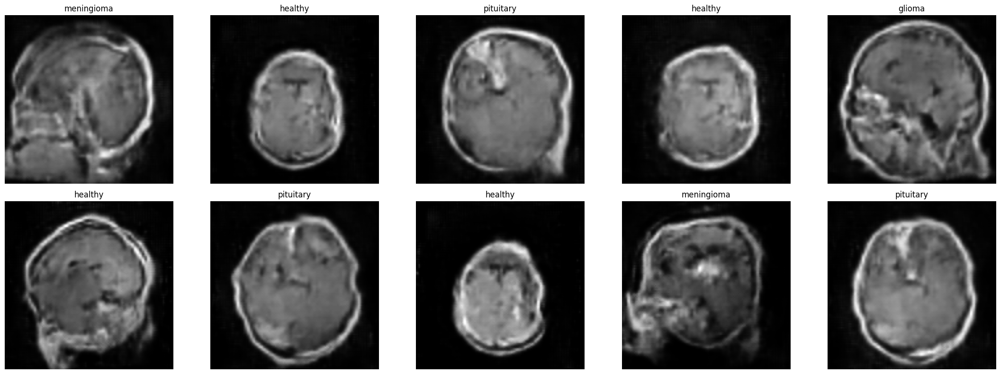

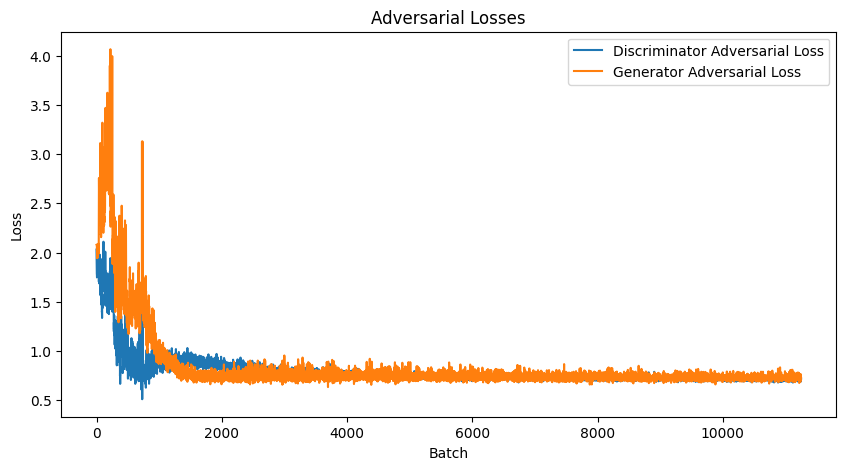

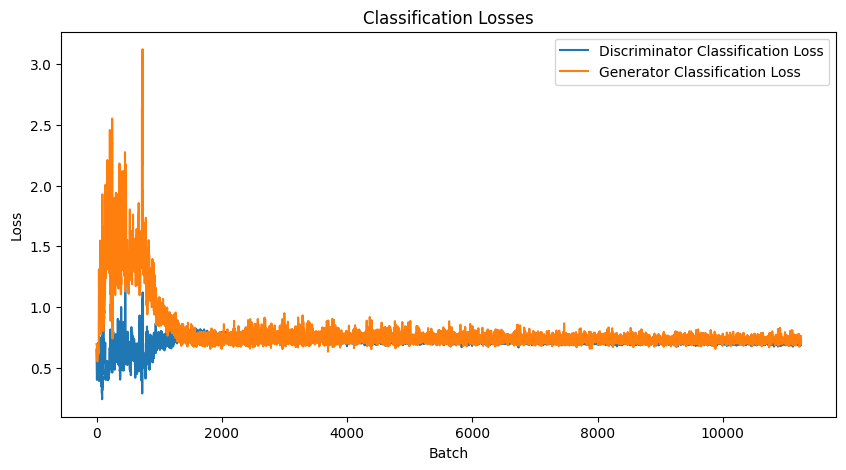

  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 1/3750 [00:00<26:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 2/3750 [00:00<26:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 3/3750 [00:01<26:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<26:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<26:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<26:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 7/3750 [00:02<25:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 8/3750 [00:03<26:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<26:35,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<26:28,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 11/3750 [00:04<26:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 12/3750 [00:05<26:24,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 13/3750 [00:05<26:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 14/3750 [00:05<26:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<26:44,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 16/3750 [00:06<26:29,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 17/3750 [00:07<26:33,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<26:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:08<26:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 20/3750 [00:08<26:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<26:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:09<26:00,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 23/3750 [00:09<26:00,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 24/3750 [00:10<25:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 25/3750 [00:10<25:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 26/3750 [00:10<26:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 28/3750 [00:11<25:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 29/3750 [00:12<26:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 31/3750 [00:13<25:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<25:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<25:54,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 34/3750 [00:14<25:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<26:01,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 36/3750 [00:15<26:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<26:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 38/3750 [00:15<26:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:16<26:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 40/3750 [00:16<26:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 41/3750 [00:17<25:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 42/3750 [00:17<25:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:18<25:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:18<26:08,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 45/3750 [00:18<26:14,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 46/3750 [00:19<26:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 47/3750 [00:19<25:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 48/3750 [00:20<25:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:20<25:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 50/3750 [00:21<25:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:21<25:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 52/3750 [00:21<25:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 53/3750 [00:22<26:16,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 54/3750 [00:22<26:21,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 55/3750 [00:23<26:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 56/3750 [00:23<26:06,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 57/3750 [00:24<25:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:24<25:56,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 59/3750 [00:24<25:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 60/3750 [00:25<25:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 61/3750 [00:25<25:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 62/3750 [00:26<25:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 63/3750 [00:26<25:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:26<25:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 65/3750 [00:27<25:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 66/3750 [00:27<25:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:28<25:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 68/3750 [00:28<25:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 69/3750 [00:29<25:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 70/3750 [00:29<25:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:29<25:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:30<25:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 73/3750 [00:30<25:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 74/3750 [00:31<25:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:31<25:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 76/3750 [00:31<25:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:32<25:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 78/3750 [00:32<25:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:33<25:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:33<25:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:34<25:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:34<25:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 83/3750 [00:34<25:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 84/3750 [00:35<25:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 85/3750 [00:35<25:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 86/3750 [00:36<25:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:36<25:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:36<25:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:37<25:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:37<25:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:38<25:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:38<25:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 93/3750 [00:39<25:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 94/3750 [00:39<25:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 95/3750 [00:39<25:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 96/3750 [00:40<25:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 97/3750 [00:40<25:44,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 98/3750 [00:41<25:41,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 99/3750 [00:41<25:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:42<25:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 101/3750 [00:42<25:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 102/3750 [00:42<25:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 103/3750 [00:43<25:30,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 104/3750 [00:43<25:30,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 105/3750 [00:44<25:27,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 106/3750 [00:44<25:34,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 107/3750 [00:44<25:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 108/3750 [00:45<25:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 109/3750 [00:45<25:42,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 110/3750 [00:46<25:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 111/3750 [00:46<25:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 112/3750 [00:47<25:29,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 113/3750 [00:47<25:29,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 114/3750 [00:47<25:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 115/3750 [00:48<25:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:48<25:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 117/3750 [00:49<25:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 118/3750 [00:49<25:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:50<25:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 120/3750 [00:50<25:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:50<25:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:51<25:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:51<25:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 124/3750 [00:52<25:33,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 125/3750 [00:52<25:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:52<25:45,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 127/3750 [00:53<25:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 128/3750 [00:53<25:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 129/3750 [00:54<25:26,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 130/3750 [00:54<25:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:55<25:33,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:55<25:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:55<25:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 134/3750 [00:56<25:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:56<25:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 136/3750 [00:57<25:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 137/3750 [00:57<25:28,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 138/3750 [00:58<25:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 139/3750 [00:58<25:21,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 140/3750 [00:58<25:21,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 141/3750 [00:59<25:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:59<25:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 143/3750 [01:00<25:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 144/3750 [01:00<25:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [01:00<25:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [01:01<25:12,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 147/3750 [01:01<25:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:02<25:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:02<25:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:03<25:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 151/3750 [01:03<24:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 152/3750 [01:03<24:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:04<25:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:04<24:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 155/3750 [01:05<24:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 156/3750 [01:05<24:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 157/3750 [01:05<24:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 158/3750 [01:06<24:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 159/3750 [01:06<24:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 160/3750 [01:07<24:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:07<25:34,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 162/3750 [01:08<25:35,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:08<25:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 164/3750 [01:08<25:10,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 165/3750 [01:09<25:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:09<24:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 167/3750 [01:10<24:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:10<24:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 169/3750 [01:11<24:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 170/3750 [01:11<24:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 171/3750 [01:11<25:09,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:12<25:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:12<24:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 174/3750 [01:13<24:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:13<25:10,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 176/3750 [01:13<25:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:14<25:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:14<24:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 179/3750 [01:15<24:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 180/3750 [01:15<24:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 181/3750 [01:16<24:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 182/3750 [01:16<24:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 183/3750 [01:16<24:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:17<24:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 185/3750 [01:17<24:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 186/3750 [01:18<24:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 187/3750 [01:18<24:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 188/3750 [01:18<24:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:19<24:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 190/3750 [01:19<24:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 191/3750 [01:20<24:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 192/3750 [01:20<24:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:21<24:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:21<24:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 195/3750 [01:21<24:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 196/3750 [01:22<24:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:22<24:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 198/3750 [01:23<24:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 199/3750 [01:23<24:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 200/3750 [01:23<24:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 201/3750 [01:24<24:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 202/3750 [01:24<24:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 203/3750 [01:25<24:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:25<24:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 205/3750 [01:26<24:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 206/3750 [01:26<24:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:26<24:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 208/3750 [01:27<24:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 209/3750 [01:27<24:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 210/3750 [01:28<24:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 211/3750 [01:28<24:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 212/3750 [01:28<24:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 213/3750 [01:29<24:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:29<24:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:30<24:17,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 216/3750 [01:30<24:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 217/3750 [01:31<24:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [01:31<24:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:31<24:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:32<24:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 221/3750 [01:32<24:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 222/3750 [01:33<24:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 223/3750 [01:33<24:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 224/3750 [01:33<24:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [01:34<24:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [01:34<24:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 227/3750 [01:35<24:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:35<24:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 229/3750 [01:36<24:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 230/3750 [01:36<24:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 231/3750 [01:36<24:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:37<24:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:37<24:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 234/3750 [01:38<24:36,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 235/3750 [01:38<24:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:38<24:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:39<24:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 238/3750 [01:39<24:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 239/3750 [01:40<24:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 240/3750 [01:40<24:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 241/3750 [01:41<24:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:41<24:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 243/3750 [01:41<24:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:42<24:24,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 245/3750 [01:42<24:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 246/3750 [01:43<24:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:43<24:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 248/3750 [01:43<24:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:44<24:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:44<24:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:45<24:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 252/3750 [01:45<24:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:46<24:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:46<24:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 255/3750 [01:46<24:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 256/3750 [01:47<24:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 257/3750 [01:47<24:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 258/3750 [01:48<24:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [01:48<23:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 260/3750 [01:48<23:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:49<24:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 262/3750 [01:49<24:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 263/3750 [01:50<24:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:50<24:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 265/3750 [01:50<24:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 266/3750 [01:51<24:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 267/3750 [01:51<24:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 268/3750 [01:52<24:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 269/3750 [01:52<24:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:53<24:21,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 271/3750 [01:53<24:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [01:53<24:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 273/3750 [01:54<24:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 274/3750 [01:54<24:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:55<24:04,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 276/3750 [01:55<23:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:55<23:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 278/3750 [01:56<23:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:56<24:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 280/3750 [01:57<24:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 281/3750 [01:57<23:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 282/3750 [01:58<23:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 283/3750 [01:58<23:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:58<23:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:59<23:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 286/3750 [01:59<23:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 287/3750 [02:00<23:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 288/3750 [02:00<24:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [02:00<24:03,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 290/3750 [02:01<24:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [02:01<23:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 292/3750 [02:02<24:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [02:02<23:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [02:03<23:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 295/3750 [02:03<23:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 296/3750 [02:03<23:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 297/3750 [02:04<24:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 298/3750 [02:04<24:13,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 299/3750 [02:05<24:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [02:05<23:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [02:05<23:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:06<23:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 303/3750 [02:06<23:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 304/3750 [02:07<23:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 305/3750 [02:07<23:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 306/3750 [02:08<23:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 307/3750 [02:08<23:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:08<23:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 309/3750 [02:09<24:33,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:09<24:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:10<24:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:10<23:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:10<23:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 314/3750 [02:11<23:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:11<23:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 316/3750 [02:12<23:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:12<23:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:13<23:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:13<23:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:13<23:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:14<23:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 322/3750 [02:14<23:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:15<23:42,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 324/3750 [02:15<23:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 325/3750 [02:15<23:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 326/3750 [02:16<23:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 327/3750 [02:16<23:44,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 328/3750 [02:17<23:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:17<23:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 330/3750 [02:18<23:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 331/3750 [02:18<23:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 332/3750 [02:18<23:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 333/3750 [02:19<23:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:19<23:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:20<23:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 336/3750 [02:20<23:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 337/3750 [02:20<23:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:21<23:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 339/3750 [02:21<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:22<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:22<23:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 342/3750 [02:23<23:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:23<23:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 344/3750 [02:23<23:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 345/3750 [02:24<23:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 346/3750 [02:24<23:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 347/3750 [02:25<23:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 348/3750 [02:25<23:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 349/3750 [02:25<23:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 350/3750 [02:26<23:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 351/3750 [02:26<23:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:27<23:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 353/3750 [02:27<23:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 354/3750 [02:28<23:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 355/3750 [02:28<23:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 356/3750 [02:28<23:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 357/3750 [02:29<23:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 358/3750 [02:29<23:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 359/3750 [02:30<23:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 360/3750 [02:30<23:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 361/3750 [02:30<23:28,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 362/3750 [02:31<23:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 363/3750 [02:31<23:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:32<23:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 365/3750 [02:32<23:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 366/3750 [02:32<23:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:33<23:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 368/3750 [02:33<23:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:34<23:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:34<23:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 371/3750 [02:35<23:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:35<23:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:35<23:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 374/3750 [02:36<23:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:36<23:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 376/3750 [02:37<23:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 377/3750 [02:37<23:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 378/3750 [02:38<23:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 379/3750 [02:38<23:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:38<23:24,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 381/3750 [02:39<23:23,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 382/3750 [02:39<23:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 383/3750 [02:40<23:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:40<23:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:40<23:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 386/3750 [02:41<23:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 387/3750 [02:41<23:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 388/3750 [02:42<23:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 389/3750 [02:42<23:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 390/3750 [02:43<23:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [02:43<23:19,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 392/3750 [02:43<23:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 393/3750 [02:44<23:22,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 394/3750 [02:44<23:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:45<23:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 396/3750 [02:45<23:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 397/3750 [02:45<23:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 398/3750 [02:46<23:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:46<23:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 400/3750 [02:47<23:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:47<23:24,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 402/3750 [02:48<23:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 403/3750 [02:48<23:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 404/3750 [02:48<23:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 405/3750 [02:49<23:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:49<23:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:50<23:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 408/3750 [02:50<23:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 409/3750 [02:50<22:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 410/3750 [02:51<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:51<22:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:52<22:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:52<23:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 414/3750 [02:53<23:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 415/3750 [02:53<23:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:53<22:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 417/3750 [02:54<22:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 418/3750 [02:54<22:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 419/3750 [02:55<22:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 420/3750 [02:55<22:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:55<22:56,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 422/3750 [02:56<22:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 423/3750 [02:56<23:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:57<23:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 425/3750 [02:57<23:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 426/3750 [02:58<23:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:58<23:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:58<23:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 429/3750 [02:59<23:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 430/3750 [02:59<23:02,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█▏        | 431/3750 [03:00<22:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [03:00<23:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [03:00<22:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 434/3750 [03:01<22:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [03:01<23:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [03:02<22:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [03:02<22:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 438/3750 [03:02<22:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 439/3750 [03:03<22:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 440/3750 [03:03<22:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [03:04<23:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 442/3750 [03:04<23:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 443/3750 [03:05<22:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 444/3750 [03:05<22:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:05<22:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:06<22:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:06<22:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 448/3750 [03:07<22:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 449/3750 [03:07<22:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 450/3750 [03:07<22:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:08<22:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:08<22:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:09<22:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 454/3750 [03:09<22:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:10<22:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 456/3750 [03:10<22:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:10<22:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 458/3750 [03:11<22:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:11<23:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:12<23:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 461/3750 [03:12<23:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 462/3750 [03:12<22:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 463/3750 [03:13<22:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 464/3750 [03:13<22:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 465/3750 [03:14<22:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 466/3750 [03:14<22:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 467/3750 [03:15<22:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:15<22:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:15<22:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:16<22:39,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 471/3750 [03:16<22:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 472/3750 [03:17<22:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:17<22:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:17<22:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 475/3750 [03:18<22:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 476/3750 [03:18<22:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:19<22:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 478/3750 [03:19<22:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:19<22:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 480/3750 [03:20<22:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:20<22:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:21<22:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 483/3750 [03:21<22:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:22<22:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 485/3750 [03:22<22:38,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 486/3750 [03:22<22:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 487/3750 [03:23<22:40,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 488/3750 [03:23<22:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:24<22:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 490/3750 [03:24<22:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 491/3750 [03:24<22:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 492/3750 [03:25<22:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 493/3750 [03:25<22:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 494/3750 [03:26<22:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 495/3750 [03:26<22:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 496/3750 [03:27<22:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 497/3750 [03:27<22:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 498/3750 [03:27<22:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:28<22:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:28<22:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:29<22:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:29<22:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:29<22:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 504/3750 [03:30<22:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:30<22:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 506/3750 [03:31<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:31<22:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:31<22:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:32<22:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:32<22:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▎        | 511/3750 [03:33<22:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:33<22:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 513/3750 [03:34<22:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 514/3750 [03:34<22:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:34<22:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 516/3750 [03:35<22:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:35<22:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:36<22:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 519/3750 [03:36<22:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 520/3750 [03:36<22:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:37<22:01,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 522/3750 [03:37<22:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 523/3750 [03:38<22:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 524/3750 [03:38<22:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 525/3750 [03:38<22:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:39<22:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 527/3750 [03:39<21:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 528/3750 [03:40<22:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:40<21:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 530/3750 [03:40<21:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 531/3750 [03:41<21:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 532/3750 [03:41<22:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:42<22:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 534/3750 [03:42<22:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 535/3750 [03:43<22:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 536/3750 [03:43<22:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:43<22:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 538/3750 [03:44<22:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:44<22:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 540/3750 [03:45<22:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:45<22:20,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 542/3750 [03:45<22:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 543/3750 [03:46<22:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:46<22:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:47<22:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 546/3750 [03:47<22:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:48<22:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 548/3750 [03:48<21:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 549/3750 [03:48<21:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:49<22:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 551/3750 [03:49<22:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:50<22:06,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 553/3750 [03:50<22:11,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 554/3750 [03:50<22:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:51<22:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:51<22:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 557/3750 [03:52<21:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 558/3750 [03:52<21:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 559/3750 [03:53<21:59,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 560/3750 [03:53<21:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:53<21:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 562/3750 [03:54<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:54<21:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:55<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:55<21:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:55<21:52,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 567/3750 [03:56<21:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:56<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 569/3750 [03:57<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:57<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:57<21:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 572/3750 [03:58<21:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:58<21:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 574/3750 [03:59<21:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [03:59<21:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [04:00<21:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [04:00<21:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 578/3750 [04:00<21:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 579/3750 [04:01<21:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [04:01<21:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [04:02<21:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 582/3750 [04:02<21:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 583/3750 [04:02<21:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 584/3750 [04:03<21:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 585/3750 [04:03<21:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 586/3750 [04:04<21:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 587/3750 [04:04<21:51,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 588/3750 [04:04<21:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 589/3750 [04:05<21:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 590/3750 [04:05<21:36,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 591/3750 [04:06<21:32,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 592/3750 [04:06<21:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:06<21:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 594/3750 [04:07<21:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 595/3750 [04:07<21:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:08<21:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 597/3750 [04:08<21:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 598/3750 [04:09<21:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 599/3750 [04:09<21:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 600/3750 [04:09<21:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 601/3750 [04:10<21:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:10<21:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 603/3750 [04:11<21:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 604/3750 [04:11<21:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:11<21:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 606/3750 [04:12<21:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:12<21:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 608/3750 [04:13<21:35,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 609/3750 [04:13<21:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 610/3750 [04:13<21:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 611/3750 [04:14<21:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 612/3750 [04:14<23:43,  2.20it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 613/3750 [04:15<22:59,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [04:15<22:37,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:16<22:14,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 616/3750 [04:16<21:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:17<21:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 618/3750 [04:17<21:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:17<21:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 620/3750 [04:18<21:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:18<21:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:19<21:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:19<21:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:19<21:30,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 625/3750 [04:20<21:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:20<21:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:21<21:46,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 628/3750 [04:21<21:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:21<21:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:22<21:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:22<21:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 632/3750 [04:23<21:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:23<21:32,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 634/3750 [04:24<21:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 635/3750 [04:24<21:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 636/3750 [04:24<21:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 637/3750 [04:25<21:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 638/3750 [04:25<21:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 639/3750 [04:26<21:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 640/3750 [04:26<21:16,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 641/3750 [04:26<21:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 642/3750 [04:27<21:22,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 643/3750 [04:27<21:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 644/3750 [04:28<21:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:28<21:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 646/3750 [04:28<21:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 647/3750 [04:29<21:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:29<21:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 649/3750 [04:30<21:06,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 650/3750 [04:30<21:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 651/3750 [04:31<21:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 652/3750 [04:31<21:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 653/3750 [04:31<21:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 654/3750 [04:32<21:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 655/3750 [04:32<21:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:33<21:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 657/3750 [04:33<21:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 658/3750 [04:33<21:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:34<21:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 660/3750 [04:34<21:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 661/3750 [04:35<21:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 662/3750 [04:35<21:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 663/3750 [04:35<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:36<21:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 665/3750 [04:36<21:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 666/3750 [04:37<21:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:37<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:37<21:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:38<21:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 670/3750 [04:38<21:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 671/3750 [04:39<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 672/3750 [04:39<21:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 673/3750 [04:40<21:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 674/3750 [04:40<21:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [04:40<20:55,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 676/3750 [04:41<20:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:41<20:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 678/3750 [04:42<20:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:42<20:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 680/3750 [04:42<21:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 681/3750 [04:43<21:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 682/3750 [04:43<21:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 683/3750 [04:44<21:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:44<20:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 685/3750 [04:44<20:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 686/3750 [04:45<20:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 687/3750 [04:45<21:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:46<20:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:46<20:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 690/3750 [04:47<20:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 691/3750 [04:47<20:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 692/3750 [04:47<20:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 693/3750 [04:48<20:47,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 694/3750 [04:48<20:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:49<20:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:49<20:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 697/3750 [04:49<20:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 698/3750 [04:50<20:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 699/3750 [04:50<20:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:51<20:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 701/3750 [04:51<20:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 702/3750 [04:51<20:49,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 703/3750 [04:52<20:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 704/3750 [04:52<20:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 705/3750 [04:53<21:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:53<21:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:54<21:12,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 708/3750 [04:54<21:06,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 709/3750 [04:54<21:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 710/3750 [04:55<21:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:55<20:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 712/3750 [04:56<20:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 713/3750 [04:56<20:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [04:56<20:52,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 715/3750 [04:57<20:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:57<20:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 717/3750 [04:58<20:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 718/3750 [04:58<20:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [04:58<20:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 720/3750 [04:59<20:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 721/3750 [04:59<20:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 722/3750 [05:00<20:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [05:00<20:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 724/3750 [05:01<20:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [05:01<20:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [05:01<20:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 727/3750 [05:02<20:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 728/3750 [05:02<20:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 729/3750 [05:03<20:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 730/3750 [05:03<20:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 731/3750 [05:03<20:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 732/3750 [05:04<20:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 733/3750 [05:04<20:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [05:05<20:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 735/3750 [05:05<20:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:05<20:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [05:06<20:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 738/3750 [05:06<20:31,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 739/3750 [05:07<20:33,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 740/3750 [05:07<20:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:07<20:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 742/3750 [05:08<20:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:08<20:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 744/3750 [05:09<20:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:09<20:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 746/3750 [05:10<20:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 747/3750 [05:10<20:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 748/3750 [05:10<20:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 749/3750 [05:11<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 750/3750 [05:11<20:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 751/3750 [05:12<20:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 752/3750 [05:12<20:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 753/3750 [05:12<20:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 754/3750 [05:13<20:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [05:13<20:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 756/3750 [05:14<20:42,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 757/3750 [05:14<20:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:15<20:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 759/3750 [05:15<20:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 760/3750 [05:15<20:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 761/3750 [05:16<20:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:16<20:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 763/3750 [05:17<20:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 764/3750 [05:17<20:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 765/3750 [05:17<20:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:18<20:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 767/3750 [05:18<20:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 768/3750 [05:19<20:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 769/3750 [05:19<20:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:19<20:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 771/3750 [05:20<20:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 772/3750 [05:20<20:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 773/3750 [05:21<20:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 774/3750 [05:21<20:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 775/3750 [05:22<20:18,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 776/3750 [05:22<20:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 777/3750 [05:22<20:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:23<20:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:23<20:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:24<20:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 781/3750 [05:24<20:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 782/3750 [05:24<20:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 783/3750 [05:25<20:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 784/3750 [05:25<20:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 785/3750 [05:26<20:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:26<20:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:26<20:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 788/3750 [05:27<20:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 789/3750 [05:27<20:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:28<20:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 791/3750 [05:28<20:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 792/3750 [05:29<20:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 793/3750 [05:29<20:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 794/3750 [05:29<20:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 795/3750 [05:30<20:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:30<20:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:31<20:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:31<20:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 799/3750 [05:31<20:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 800/3750 [05:32<20:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:32<20:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 802/3750 [05:33<20:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:33<20:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:33<20:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 805/3750 [05:34<20:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 806/3750 [05:34<20:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:35<20:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:35<20:18,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 809/3750 [05:36<20:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 810/3750 [05:36<20:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:36<20:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:37<20:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 813/3750 [05:37<20:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 814/3750 [05:38<20:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 815/3750 [05:38<20:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 816/3750 [05:38<20:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 817/3750 [05:39<20:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 818/3750 [05:39<20:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 819/3750 [05:40<20:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 820/3750 [05:40<20:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 821/3750 [05:41<20:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:41<19:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 823/3750 [05:41<20:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 824/3750 [05:42<20:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:43<25:28,  1.91it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:43<23:54,  2.04it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 827/3750 [05:43<22:50,  2.13it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 828/3750 [05:44<22:03,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 829/3750 [05:44<21:29,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 830/3750 [05:45<21:05,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:45<20:56,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:45<20:43,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 833/3750 [05:46<20:40,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 834/3750 [05:46<20:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 835/3750 [05:47<20:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:47<20:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 837/3750 [05:48<20:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:48<20:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:48<20:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 840/3750 [05:49<20:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:49<20:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 842/3750 [05:50<20:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 843/3750 [05:50<20:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:50<20:13,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 845/3750 [05:51<20:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 846/3750 [05:51<20:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 847/3750 [05:52<20:13,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 848/3750 [05:52<20:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 849/3750 [05:53<20:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 850/3750 [05:53<20:32,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 851/3750 [05:53<20:39,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 852/3750 [05:54<20:29,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 853/3750 [05:54<20:24,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 854/3750 [05:55<20:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:55<20:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 856/3750 [05:56<20:28,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 857/3750 [05:56<20:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:56<20:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [05:57<20:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 860/3750 [05:57<20:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 861/3750 [05:58<20:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 862/3750 [05:58<20:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 863/3750 [05:59<20:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [05:59<20:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [05:59<22:14,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 866/3750 [06:00<21:33,  2.23it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [06:00<21:11,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [06:01<20:49,  2.31it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 869/3750 [06:01<20:34,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [06:02<20:30,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 871/3750 [06:02<20:25,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 872/3750 [06:02<20:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 873/3750 [06:03<20:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [06:03<20:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 875/3750 [06:04<20:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [06:04<20:13,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 877/3750 [06:05<20:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 878/3750 [06:05<20:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [06:05<20:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [06:06<20:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [06:06<20:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [06:07<19:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 883/3750 [06:07<19:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 884/3750 [06:07<19:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 885/3750 [06:08<20:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:08<20:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 887/3750 [06:09<19:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:09<19:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:10<20:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 890/3750 [06:10<20:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 891/3750 [06:10<20:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 892/3750 [06:11<19:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:11<20:00,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 894/3750 [06:12<20:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:12<20:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 896/3750 [06:13<20:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:13<19:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:13<19:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:14<19:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [06:14<20:26,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 901/3750 [06:15<20:15,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 902/3750 [06:15<20:15,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 903/3750 [06:15<20:21,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 904/3750 [06:16<20:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 905/3750 [06:16<20:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:17<20:00,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 907/3750 [06:17<19:59,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 908/3750 [06:18<19:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:18<19:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 910/3750 [06:18<19:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 911/3750 [06:19<19:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:19<19:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 913/3750 [06:20<19:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 914/3750 [06:20<19:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:21<19:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:21<19:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:21<21:44,  2.17it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 918/3750 [06:22<21:07,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 919/3750 [06:22<20:40,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:23<20:39,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 921/3750 [06:23<20:20,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:24<20:06,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 923/3750 [06:24<19:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:24<19:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:25<19:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:25<19:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 927/3750 [06:26<19:40,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 928/3750 [06:26<19:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 929/3750 [06:27<19:47,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 930/3750 [06:27<19:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:27<19:42,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 932/3750 [06:28<19:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:28<19:47,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 934/3750 [06:29<19:53,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 935/3750 [06:29<19:47,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 936/3750 [06:29<19:44,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 937/3750 [06:30<19:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 938/3750 [06:30<19:44,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 939/3750 [06:31<19:42,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 940/3750 [06:31<19:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:32<19:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:32<19:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:32<19:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 944/3750 [06:33<19:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 945/3750 [06:33<19:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 946/3750 [06:34<19:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 947/3750 [06:34<19:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 948/3750 [06:34<19:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 949/3750 [06:35<19:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 950/3750 [06:35<19:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:36<19:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:36<19:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:37<19:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 954/3750 [06:37<19:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:37<19:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:38<19:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:38<19:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 958/3750 [06:39<19:40,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 959/3750 [06:39<19:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:40<19:40,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:40<19:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 962/3750 [06:40<19:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 963/3750 [06:41<19:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 964/3750 [06:41<19:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:42<19:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 966/3750 [06:42<19:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 967/3750 [06:42<19:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 968/3750 [06:43<19:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 969/3750 [06:43<19:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:44<19:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 971/3750 [06:44<19:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 972/3750 [06:45<19:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 973/3750 [06:45<19:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 974/3750 [06:45<19:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 975/3750 [06:46<19:22,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 976/3750 [06:46<19:21,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 977/3750 [06:47<19:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 978/3750 [06:47<19:15,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 979/3750 [06:47<19:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 980/3750 [06:48<19:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:48<19:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:49<19:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:49<19:20,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 984/3750 [06:50<19:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:50<19:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 986/3750 [06:50<19:19,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▋       | 987/3750 [06:51<19:18,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▋       | 988/3750 [06:51<19:16,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▋       | 989/3750 [06:52<19:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:52<19:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:52<19:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 992/3750 [06:53<19:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:53<19:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 994/3750 [06:54<19:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 995/3750 [06:54<19:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 996/3750 [06:55<19:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:55<19:05,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 998/3750 [06:55<19:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:56<19:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:56<19:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1001/3750 [06:57<19:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1002/3750 [06:57<19:12,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1003/3750 [06:58<19:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [06:58<19:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [06:58<19:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [06:59<19:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [06:59<19:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1008/3750 [07:00<18:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [07:00<18:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [07:00<18:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1011/3750 [07:01<19:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [07:01<19:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1013/3750 [07:02<19:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [07:02<19:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1015/3750 [07:03<19:05,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1016/3750 [07:03<19:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [07:03<19:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [07:04<19:10,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [07:04<19:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1020/3750 [07:05<19:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [07:05<19:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [07:05<19:05,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1023/3750 [07:06<19:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [07:06<18:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1025/3750 [07:07<18:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [07:07<18:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1027/3750 [07:08<18:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1028/3750 [07:08<18:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:08<19:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:09<19:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1031/3750 [07:09<19:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:10<18:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1033/3750 [07:10<18:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:10<18:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1035/3750 [07:11<18:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1036/3750 [07:11<18:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:12<18:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:12<18:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:13<18:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1040/3750 [07:13<18:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:13<18:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1042/3750 [07:14<18:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:14<19:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1044/3750 [07:15<19:01,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1045/3750 [07:15<18:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1046/3750 [07:16<18:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1047/3750 [07:16<19:21,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1048/3750 [07:16<19:16,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:17<19:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:17<18:55,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1051/3750 [07:18<18:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1052/3750 [07:18<18:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1053/3750 [07:18<18:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:19<18:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:19<18:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:20<18:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1057/3750 [07:20<18:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1058/3750 [07:21<18:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:21<18:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:21<18:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1061/3750 [07:22<18:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:22<18:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1063/3750 [07:23<18:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:23<18:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:23<18:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1066/3750 [07:24<18:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:24<18:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:25<18:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [07:25<18:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:26<18:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1071/3750 [07:26<18:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1072/3750 [07:26<18:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1073/3750 [07:27<18:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1074/3750 [07:27<18:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1075/3750 [07:28<18:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1076/3750 [07:28<18:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1077/3750 [07:28<18:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:29<18:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1079/3750 [07:29<18:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1080/3750 [07:30<18:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1081/3750 [07:30<18:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:30<18:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1083/3750 [07:31<18:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:31<18:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:32<18:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:32<18:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:33<18:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1088/3750 [07:33<18:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1089/3750 [07:33<18:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1090/3750 [07:34<18:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1091/3750 [07:34<18:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:35<18:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1093/3750 [07:35<18:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1094/3750 [07:35<18:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:36<18:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:36<18:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [07:37<18:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:37<18:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1099/3750 [07:38<18:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1100/3750 [07:38<18:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1101/3750 [07:38<18:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:39<18:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1103/3750 [07:39<18:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:40<18:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:40<18:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:40<18:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1107/3750 [07:41<18:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:41<18:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:42<18:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1110/3750 [07:42<18:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:43<18:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:43<18:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:43<18:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1114/3750 [07:44<18:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1115/3750 [07:44<18:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:45<18:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:45<18:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1118/3750 [07:45<18:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1119/3750 [07:46<18:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:46<18:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:47<18:11,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1122/3750 [07:47<18:09,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1123/3750 [07:48<18:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:48<18:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:48<18:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:49<18:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1127/3750 [07:49<18:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1128/3750 [07:50<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:50<18:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1130/3750 [07:50<18:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:51<18:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:51<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:52<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1134/3750 [07:52<18:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1135/3750 [07:53<18:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:53<18:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1137/3750 [07:53<17:59,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1138/3750 [07:54<18:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:54<18:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:55<18:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1141/3750 [07:55<18:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1142/3750 [07:55<18:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:56<18:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:56<18:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1145/3750 [07:57<18:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1146/3750 [07:57<17:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1147/3750 [07:58<18:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1148/3750 [07:58<18:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1149/3750 [07:58<17:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1150/3750 [07:59<17:57,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1151/3750 [07:59<18:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [08:00<18:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [08:00<18:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1154/3750 [08:00<17:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [08:01<18:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1156/3750 [08:01<18:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1157/3750 [08:02<18:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1158/3750 [08:02<18:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1159/3750 [08:03<18:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [08:03<17:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [08:03<17:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1162/3750 [08:04<17:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [08:04<17:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1164/3750 [08:05<17:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1165/3750 [08:05<17:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1166/3750 [08:05<17:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1167/3750 [08:06<17:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1168/3750 [08:06<17:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [08:07<17:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1170/3750 [08:07<17:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1171/3750 [08:07<17:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [08:08<17:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [08:08<17:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [08:09<17:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1175/3750 [08:09<17:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1176/3750 [08:10<17:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1177/3750 [08:10<17:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1178/3750 [08:10<17:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1179/3750 [08:11<17:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1180/3750 [08:11<17:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1181/3750 [08:12<17:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:12<17:44,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1183/3750 [08:12<17:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1184/3750 [08:13<17:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:13<17:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1186/3750 [08:14<17:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1187/3750 [08:14<17:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1188/3750 [08:15<17:54,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1189/3750 [08:15<17:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:15<17:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:16<17:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:16<17:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1193/3750 [08:17<17:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1194/3750 [08:17<18:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1195/3750 [08:18<17:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1196/3750 [08:18<17:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:18<17:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:19<17:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1199/3750 [08:19<17:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:20<17:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1201/3750 [08:20<17:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1202/3750 [08:20<17:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:21<17:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:21<17:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1205/3750 [08:22<17:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:22<17:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:22<17:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:23<17:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:23<17:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1210/3750 [08:24<17:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1211/3750 [08:24<17:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:25<17:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:25<17:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:25<17:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1215/3750 [08:26<17:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:26<17:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1217/3750 [08:27<17:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:27<17:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:27<17:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1220/3750 [08:28<17:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:28<17:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1222/3750 [08:29<17:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:29<17:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1224/3750 [08:30<17:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1225/3750 [08:30<17:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1226/3750 [08:30<17:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:31<17:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:31<17:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1229/3750 [08:32<17:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:32<17:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1231/3750 [08:32<17:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1232/3750 [08:33<17:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:33<17:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1234/3750 [08:34<17:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:34<17:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1236/3750 [08:35<17:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1237/3750 [08:35<17:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:35<17:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:36<17:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:36<17:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1241/3750 [08:37<17:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:37<17:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:37<17:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1244/3750 [08:38<17:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:38<17:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1246/3750 [08:39<17:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:39<17:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:40<17:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:40<17:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1250/3750 [08:40<17:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1251/3750 [08:41<17:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1252/3750 [08:41<17:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1253/3750 [08:42<17:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:42<17:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:42<17:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:43<17:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:43<17:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1258/3750 [08:44<17:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1259/3750 [08:44<17:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1260/3750 [08:44<17:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:45<17:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1262/3750 [08:45<17:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1263/3750 [08:46<16:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:46<16:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1265/3750 [08:47<17:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1266/3750 [08:47<17:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:47<17:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:48<17:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:48<17:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1270/3750 [08:49<17:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:49<17:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1272/3750 [08:49<17:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:50<16:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:50<17:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1275/3750 [08:51<17:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1276/3750 [08:51<16:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1277/3750 [08:51<16:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:52<16:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:52<16:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:53<16:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1281/3750 [08:53<16:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1282/3750 [08:54<16:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:54<16:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1284/3750 [08:54<16:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1285/3750 [08:55<16:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:55<16:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1287/3750 [08:56<16:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1288/3750 [08:56<17:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1289/3750 [08:56<17:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:57<17:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [08:57<16:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [08:58<16:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1293/3750 [08:58<17:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1294/3750 [08:59<17:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [08:59<17:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [08:59<17:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [09:00<16:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [09:00<16:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1299/3750 [09:01<16:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [09:01<16:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1301/3750 [09:01<16:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1302/3750 [09:02<16:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [09:02<16:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [09:03<16:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1305/3750 [09:03<16:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [09:03<16:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1307/3750 [09:04<16:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1308/3750 [09:04<16:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [09:05<16:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [09:05<16:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1311/3750 [09:06<16:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [09:06<16:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1313/3750 [09:06<16:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1314/3750 [09:07<16:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1315/3750 [09:07<16:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1316/3750 [09:08<16:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [09:08<16:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [09:08<16:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [09:09<16:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [09:09<16:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1321/3750 [09:10<16:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:10<16:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1323/3750 [09:10<16:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1324/3750 [09:11<16:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:11<16:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:12<16:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:12<16:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [09:13<16:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1329/3750 [09:13<16:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1330/3750 [09:13<16:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1331/3750 [09:14<16:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1332/3750 [09:14<16:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:15<16:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:15<16:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1335/3750 [09:15<16:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1336/3750 [09:16<16:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1337/3750 [09:16<16:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:17<16:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1339/3750 [09:17<16:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:17<16:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:18<16:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:18<16:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1343/3750 [09:19<17:00,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [09:19<16:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1345/3750 [09:20<16:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:20<16:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:20<16:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1348/3750 [09:21<16:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1349/3750 [09:21<16:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1350/3750 [09:22<16:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:22<16:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:22<16:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:23<16:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1354/3750 [09:23<16:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1355/3750 [09:24<16:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:24<16:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1357/3750 [09:25<16:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1358/3750 [09:25<16:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:25<16:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:26<16:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:26<16:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▋      | 1362/3750 [09:27<16:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:27<16:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:27<16:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1365/3750 [09:28<16:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:28<16:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:29<16:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1368/3750 [09:29<16:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:29<16:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:30<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1371/3750 [09:30<16:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1372/3750 [09:31<16:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1373/3750 [09:31<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1374/3750 [09:32<16:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1375/3750 [09:32<16:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1376/3750 [09:32<16:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1377/3750 [09:33<16:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1378/3750 [09:33<16:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1379/3750 [09:34<16:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:34<16:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1381/3750 [09:34<16:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1382/3750 [09:35<16:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1383/3750 [09:35<16:10,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1384/3750 [09:36<16:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1385/3750 [09:36<16:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1386/3750 [09:36<16:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1387/3750 [09:37<16:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1388/3750 [09:37<16:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:38<16:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:38<16:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1391/3750 [09:39<16:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1392/3750 [09:39<16:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1393/3750 [09:39<16:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1394/3750 [09:40<16:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1395/3750 [09:40<16:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1396/3750 [09:41<16:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1397/3750 [09:41<16:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1398/3750 [09:41<16:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1399/3750 [09:42<16:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1400/3750 [09:42<16:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:43<16:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:43<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1403/3750 [09:43<16:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:44<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [09:44<16:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:45<16:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:45<16:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1408/3750 [09:46<16:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1409/3750 [09:46<16:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:46<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1411/3750 [09:47<16:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:47<16:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1413/3750 [09:48<16:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1414/3750 [09:48<16:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:48<16:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1416/3750 [09:49<16:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:49<15:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1418/3750 [09:50<15:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1419/3750 [09:50<15:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1420/3750 [09:50<16:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:51<16:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [09:51<16:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:52<15:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1424/3750 [09:52<15:54,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1425/3750 [09:53<15:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1426/3750 [09:53<15:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:53<15:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1428/3750 [09:54<15:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:54<15:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1430/3750 [09:55<17:30,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:55<16:59,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:56<16:37,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:56<16:20,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1434/3750 [09:56<16:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [09:57<16:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1436/3750 [09:57<16:02,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1437/3750 [09:58<16:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1438/3750 [09:58<16:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1439/3750 [09:58<15:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [09:59<16:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1441/3750 [09:59<15:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [10:00<15:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [10:00<15:49,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1444/3750 [10:00<15:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [10:01<15:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [10:01<15:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [10:02<15:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [10:02<15:46,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1449/3750 [10:03<15:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1450/3750 [10:03<15:42,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1451/3750 [10:03<15:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1452/3750 [10:04<15:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1453/3750 [10:04<15:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1454/3750 [10:05<15:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1455/3750 [10:05<15:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [10:05<15:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [10:06<15:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [10:06<15:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1459/3750 [10:07<15:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [10:07<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1461/3750 [10:07<15:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1462/3750 [10:08<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [10:08<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1464/3750 [10:09<15:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [10:09<15:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1466/3750 [10:10<15:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:10<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1468/3750 [10:10<15:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:11<15:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1470/3750 [10:11<15:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1471/3750 [10:12<15:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:12<15:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:12<15:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1474/3750 [10:13<15:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1475/3750 [10:13<15:46,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1476/3750 [10:14<15:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1477/3750 [10:14<15:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1478/3750 [10:14<15:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1479/3750 [10:15<15:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:15<15:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:16<15:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1482/3750 [10:16<15:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:17<15:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [10:17<15:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:17<15:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1486/3750 [10:18<15:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:18<15:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1488/3750 [10:19<15:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1489/3750 [10:19<15:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1490/3750 [10:19<15:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:20<15:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1492/3750 [10:20<15:56,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1493/3750 [10:21<15:52,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1494/3750 [10:21<15:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1495/3750 [10:22<15:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1496/3750 [10:22<15:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:22<15:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1498/3750 [10:23<15:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:23<15:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1500/3750 [10:24<15:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1501/3750 [10:24<15:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1502/3750 [10:24<15:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:25<15:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1504/3750 [10:25<15:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:26<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:26<15:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1507/3750 [10:26<15:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [10:27<15:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:27<15:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:28<15:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1511/3750 [10:28<15:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1512/3750 [10:28<15:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:29<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:29<15:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1515/3750 [10:30<15:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1516/3750 [10:30<15:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1517/3750 [10:31<15:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:31<15:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:31<15:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1520/3750 [10:32<15:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1521/3750 [10:32<15:27,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1522/3750 [10:33<15:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:33<15:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:33<15:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:34<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:34<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:35<15:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1528/3750 [10:35<15:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:35<15:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:36<15:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:36<15:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1532/3750 [10:37<15:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1533/3750 [10:37<15:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1534/3750 [10:38<15:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1535/3750 [10:38<15:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:38<15:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1537/3750 [10:39<15:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:39<15:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [10:40<15:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:40<15:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1541/3750 [10:40<15:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1542/3750 [10:41<15:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:41<15:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:42<15:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:42<15:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:42<15:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:43<15:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1548/3750 [10:43<15:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:44<15:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1550/3750 [10:44<15:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:45<15:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:45<15:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1553/3750 [10:45<15:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████▏     | 1554/3750 [10:46<14:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:46<14:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1556/3750 [10:47<14:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:47<15:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:47<14:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1559/3750 [10:48<14:57,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1560/3750 [10:48<14:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:49<14:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:49<14:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:49<14:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1564/3750 [10:50<14:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:50<14:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1566/3750 [10:51<14:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1567/3750 [10:51<14:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1568/3750 [10:52<14:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1569/3750 [10:52<14:53,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1570/3750 [10:52<14:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:53<14:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1572/3750 [10:53<14:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1573/3750 [10:54<14:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:54<14:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:54<14:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:55<14:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1577/3750 [10:55<14:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [10:56<14:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1579/3750 [10:56<14:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [10:56<14:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1581/3750 [10:57<14:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [10:57<14:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [10:58<14:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [10:58<14:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1585/3750 [10:58<14:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1586/3750 [10:59<14:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [10:59<14:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1588/3750 [11:00<14:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [11:00<14:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1590/3750 [11:01<14:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1591/3750 [11:01<14:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1592/3750 [11:01<14:37,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1593/3750 [11:02<14:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1594/3750 [11:02<14:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [11:03<14:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1596/3750 [11:03<14:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [11:03<14:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [11:04<14:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [11:04<14:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1600/3750 [11:05<14:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [11:05<14:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [11:05<14:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1603/3750 [11:06<14:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [11:06<14:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [11:07<14:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [11:07<14:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1607/3750 [11:07<14:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1608/3750 [11:08<14:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1609/3750 [11:08<14:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1610/3750 [11:09<14:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1611/3750 [11:09<14:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1612/3750 [11:10<14:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1613/3750 [11:10<14:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1614/3750 [11:10<14:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1615/3750 [11:11<14:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:11<14:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1617/3750 [11:12<14:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1618/3750 [11:12<14:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:12<14:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:13<14:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:13<14:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [11:14<14:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:14<14:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1624/3750 [11:14<14:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1625/3750 [11:15<14:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:15<14:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1627/3750 [11:16<14:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1628/3750 [11:16<14:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:17<14:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1630/3750 [11:17<14:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1631/3750 [11:17<14:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:18<14:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:18<14:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1634/3750 [11:19<14:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1635/3750 [11:19<14:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1636/3750 [11:19<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:20<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1638/3750 [11:20<14:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1639/3750 [11:21<14:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1640/3750 [11:21<14:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1641/3750 [11:21<14:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:22<14:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:22<14:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1644/3750 [11:23<14:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:23<14:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:23<14:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:24<14:15,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1648/3750 [11:24<14:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:25<14:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:25<14:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:26<14:17,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1652/3750 [11:26<14:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:26<14:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1654/3750 [11:27<14:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1655/3750 [11:27<14:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1656/3750 [11:28<14:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:28<14:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:28<14:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:29<14:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1660/3750 [11:29<14:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:30<14:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:30<14:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:30<14:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1664/3750 [11:31<14:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:31<14:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1666/3750 [11:32<14:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1667/3750 [11:32<14:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1668/3750 [11:33<14:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1669/3750 [11:33<14:14,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1670/3750 [11:33<14:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1671/3750 [11:34<14:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1672/3750 [11:34<14:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1673/3750 [11:35<14:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1674/3750 [11:35<14:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:35<14:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:36<14:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:36<14:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:37<14:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1679/3750 [11:37<14:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1680/3750 [11:37<14:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:38<14:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1682/3750 [11:38<14:04,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1683/3750 [11:39<14:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:39<14:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1685/3750 [11:39<14:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1686/3750 [11:40<14:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:40<14:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1688/3750 [11:41<14:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1689/3750 [11:41<14:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1690/3750 [11:42<14:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1691/3750 [11:42<14:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:42<14:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1693/3750 [11:43<14:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1694/3750 [11:43<14:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1695/3750 [11:44<14:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:44<14:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:44<13:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:45<14:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1699/3750 [11:45<14:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1700/3750 [11:46<14:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [11:46<14:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1702/3750 [11:46<14:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:47<14:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:47<13:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1705/3750 [11:48<13:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1706/3750 [11:48<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1707/3750 [11:48<13:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:49<13:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1709/3750 [11:49<13:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:50<13:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:50<13:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1712/3750 [11:51<13:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:51<13:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:51<13:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1715/3750 [11:52<13:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1716/3750 [11:52<13:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:53<13:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:53<13:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:53<13:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [11:54<13:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [11:54<13:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [11:55<13:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1723/3750 [11:55<13:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [11:55<13:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [11:56<13:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [11:56<13:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [11:57<13:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [11:57<13:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1729/3750 [11:57<13:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1730/3750 [11:58<13:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [11:58<13:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [11:59<13:42,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1733/3750 [11:59<13:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [12:00<13:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1735/3750 [12:00<13:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [12:00<13:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1737/3750 [12:01<13:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1738/3750 [12:01<13:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [12:02<13:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1740/3750 [12:02<13:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [12:02<13:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [12:03<13:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [12:03<13:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [12:04<13:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [12:04<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [12:04<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [12:05<13:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1748/3750 [12:05<13:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1749/3750 [12:06<13:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1750/3750 [12:06<13:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [12:06<13:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1752/3750 [12:07<13:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [12:07<13:34,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1754/3750 [12:08<13:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1755/3750 [12:08<13:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1756/3750 [12:09<13:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1757/3750 [12:09<13:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [12:09<13:34,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1759/3750 [12:10<13:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:10<13:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1761/3750 [12:11<13:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1762/3750 [12:11<13:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:11<13:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1764/3750 [12:12<13:30,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1765/3750 [12:12<13:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:13<13:32,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1767/3750 [12:13<13:29,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1768/3750 [12:13<13:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1769/3750 [12:14<13:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1770/3750 [12:14<13:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1771/3750 [12:15<13:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1772/3750 [12:15<13:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1773/3750 [12:15<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:16<13:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1775/3750 [12:16<13:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:17<13:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1777/3750 [12:17<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1778/3750 [12:18<13:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1779/3750 [12:18<13:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:18<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1781/3750 [12:19<13:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:19<13:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1783/3750 [12:20<13:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:20<13:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [12:20<13:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1786/3750 [12:21<13:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:21<13:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:22<13:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:22<13:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1790/3750 [12:22<13:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1791/3750 [12:23<13:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:23<13:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1793/3750 [12:24<13:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:24<13:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1795/3750 [12:24<13:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:25<13:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1797/3750 [12:25<13:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:26<13:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1799/3750 [12:26<13:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:27<13:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1801/3750 [12:27<13:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1802/3750 [12:27<13:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:28<13:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1804/3750 [12:28<13:17,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1805/3750 [12:29<13:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:29<13:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:29<13:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1808/3750 [12:30<13:14,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1809/3750 [12:30<13:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:31<13:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1811/3750 [12:31<13:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:31<13:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1813/3750 [12:32<13:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1814/3750 [12:32<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1815/3750 [12:33<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:33<13:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:34<13:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1818/3750 [12:34<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:34<13:09,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▊     | 1820/3750 [12:35<13:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:35<13:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:36<13:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:36<13:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:36<13:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1825/3750 [12:37<13:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:37<13:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:38<13:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▊     | 1828/3750 [12:38<13:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1829/3750 [12:38<13:02,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1830/3750 [12:39<13:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:39<13:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1832/3750 [12:40<13:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1833/3750 [12:40<13:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:41<13:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:41<13:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:41<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:42<13:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1838/3750 [12:42<13:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1839/3750 [12:43<13:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:43<13:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:43<13:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1842/3750 [12:44<13:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1843/3750 [12:44<13:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1844/3750 [12:45<13:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:45<12:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1846/3750 [12:45<13:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1847/3750 [12:46<13:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:46<13:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1849/3750 [12:47<13:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1850/3750 [12:47<13:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:47<12:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1852/3750 [12:48<12:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [12:48<14:17,  2.21it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:49<13:51,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1855/3750 [12:49<13:32,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [12:50<13:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1857/3750 [12:50<13:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:50<13:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:51<13:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:51<13:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:52<13:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:52<12:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [12:53<12:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [12:53<12:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [12:53<12:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [12:54<12:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1867/3750 [12:54<12:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1868/3750 [12:55<12:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1869/3750 [12:55<12:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [12:55<12:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [12:56<12:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1872/3750 [12:56<12:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1873/3750 [12:57<12:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [12:57<12:42,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1875/3750 [12:57<12:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1876/3750 [12:58<12:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [12:58<12:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [12:59<12:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [12:59<12:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1880/3750 [12:59<12:41,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1881/3750 [13:00<12:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1882/3750 [13:00<12:40,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1883/3750 [13:01<12:41,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1884/3750 [13:01<12:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [13:02<12:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [13:02<12:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1887/3750 [13:02<12:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1888/3750 [13:03<12:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [13:03<12:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1890/3750 [13:04<12:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [13:04<12:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [13:04<12:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1893/3750 [13:05<12:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1894/3750 [13:05<12:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1895/3750 [13:06<12:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [13:06<12:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [13:06<12:36,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1898/3750 [13:07<12:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1899/3750 [13:07<12:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1900/3750 [13:08<12:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1901/3750 [13:08<12:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1902/3750 [13:08<12:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [13:09<12:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [13:10<15:54,  1.93it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [13:10<14:58,  2.05it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [13:11<14:17,  2.15it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:11<13:49,  2.22it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:11<13:30,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:12<13:17,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:12<13:05,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1911/3750 [13:13<12:58,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:13<12:58,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1913/3750 [13:13<12:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:14<12:54,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1915/3750 [13:14<12:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1916/3750 [13:15<12:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1917/3750 [13:15<12:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1918/3750 [13:16<12:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:16<12:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:16<12:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:17<12:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [13:17<12:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:18<12:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:18<12:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1925/3750 [13:18<12:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:19<12:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:19<12:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1928/3750 [13:20<12:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:20<12:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:21<12:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:21<12:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:21<12:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:22<12:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:22<12:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1935/3750 [13:23<12:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:23<12:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:23<12:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1938/3750 [13:24<12:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:24<12:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1940/3750 [13:25<12:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:25<12:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:26<12:42,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1943/3750 [13:26<12:48,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:26<12:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:27<12:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1946/3750 [13:27<12:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:28<12:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:28<12:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:28<12:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:29<12:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:29<12:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:30<12:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1953/3750 [13:30<12:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1954/3750 [13:31<12:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:31<12:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:31<12:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1957/3750 [13:32<12:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:32<12:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:33<12:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:33<12:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1961/3750 [13:33<12:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:34<12:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:34<12:24,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1964/3750 [13:35<12:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:35<12:28,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1966/3750 [13:36<12:24,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1967/3750 [13:36<12:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:36<12:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1969/3750 [13:37<12:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:37<12:25,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1971/3750 [13:38<12:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:38<12:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:39<12:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:39<12:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1975/3750 [13:39<12:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1976/3750 [13:40<12:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1977/3750 [13:40<12:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1978/3750 [13:41<12:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:41<12:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:41<12:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1981/3750 [13:42<12:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:42<12:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:43<12:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:43<12:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:44<12:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1986/3750 [13:44<12:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:44<12:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1988/3750 [13:45<12:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1989/3750 [13:45<12:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1990/3750 [13:46<12:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1991/3750 [13:46<12:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:46<12:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1993/3750 [13:47<12:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1994/3750 [13:47<12:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:48<12:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:48<12:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1997/3750 [13:49<12:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1998/3750 [13:49<12:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:49<12:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:50<12:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2001/3750 [13:50<12:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:51<12:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [13:51<12:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2004/3750 [13:51<12:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:52<12:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [13:52<12:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [13:53<12:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [13:53<12:17,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▎    | 2009/3750 [13:54<12:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [13:54<12:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [13:54<12:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [13:55<12:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [13:55<12:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [13:56<12:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [13:56<12:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [13:56<11:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [13:57<12:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2018/3750 [13:57<12:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [13:58<12:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [13:58<11:57,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2021/3750 [13:59<11:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [13:59<12:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [13:59<11:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2024/3750 [14:00<11:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [14:00<11:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [14:01<12:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [14:01<12:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [14:01<11:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2029/3750 [14:02<11:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2030/3750 [14:02<11:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [14:03<11:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [14:03<11:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2033/3750 [14:04<11:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [14:04<11:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [14:04<11:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2036/3750 [14:05<12:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2037/3750 [14:05<11:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2038/3750 [14:06<11:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [14:06<11:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2040/3750 [14:06<11:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2041/3750 [14:07<11:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2042/3750 [14:07<11:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [14:08<11:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [14:08<11:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [14:09<11:50,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2046/3750 [14:09<11:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2047/3750 [14:09<11:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [14:10<11:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [14:10<11:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [14:11<11:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2051/3750 [14:11<11:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [14:11<11:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2053/3750 [14:12<11:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:12<11:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2055/3750 [14:13<11:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2056/3750 [14:13<11:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2057/3750 [14:14<11:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2058/3750 [14:14<11:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2059/3750 [14:14<11:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2060/3750 [14:15<11:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:15<11:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:16<11:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2063/3750 [14:16<11:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:17<11:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:17<11:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2066/3750 [14:17<11:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:18<11:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [14:18<11:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:19<11:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:19<11:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [14:19<11:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:20<11:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:20<11:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:21<11:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:21<11:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:21<11:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:22<11:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:22<11:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:23<11:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [14:23<11:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:24<11:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:24<11:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2083/3750 [14:24<11:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:25<11:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [14:25<11:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2086/3750 [14:26<11:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2087/3750 [14:26<11:51,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:27<11:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:27<11:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:27<11:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2091/3750 [14:28<11:35,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2092/3750 [14:28<11:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2093/3750 [14:29<11:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2094/3750 [14:29<11:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:30<12:38,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [14:30<12:16,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:30<11:59,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:31<11:48,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:31<11:43,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2100/3750 [14:32<11:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:32<11:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:32<11:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:33<11:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:33<11:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2105/3750 [14:34<11:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:34<11:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:35<11:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2108/3750 [14:35<11:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:35<11:24,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2110/3750 [14:36<11:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:36<11:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:37<11:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:37<11:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2114/3750 [14:37<11:18,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2115/3750 [14:38<11:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:38<11:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [14:39<11:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2118/3750 [14:39<11:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2119/3750 [14:40<11:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2120/3750 [14:40<11:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:40<11:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2122/3750 [14:41<11:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2123/3750 [14:41<11:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2124/3750 [14:42<11:22,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2125/3750 [14:42<11:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:42<11:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:43<11:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2128/3750 [14:43<11:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:44<11:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2130/3750 [14:44<11:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:45<11:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2132/3750 [14:45<11:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:45<11:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2134/3750 [14:46<11:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2135/3750 [14:46<11:17,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2136/3750 [14:47<11:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2137/3750 [14:47<11:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2138/3750 [14:47<11:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:48<11:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:48<11:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:49<11:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2142/3750 [14:49<11:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:50<11:11,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2144/3750 [14:50<11:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:50<11:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:51<11:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:51<11:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [14:52<11:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:52<11:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [14:52<11:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2151/3750 [14:53<11:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2152/3750 [14:53<11:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [14:54<11:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [14:54<11:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [14:55<11:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [14:55<11:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2157/3750 [14:55<11:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [14:56<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [14:56<10:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2160/3750 [14:57<10:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2161/3750 [14:57<10:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [14:57<11:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [14:58<11:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [14:58<11:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [14:59<11:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [14:59<11:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [15:00<11:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [15:00<10:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [15:00<10:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [15:01<10:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [15:01<10:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [15:02<10:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [15:02<10:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [15:02<10:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2175/3750 [15:03<10:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [15:03<10:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [15:04<10:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [15:04<10:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [15:05<10:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2180/3750 [15:05<10:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [15:05<10:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [15:06<10:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [15:06<10:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [15:07<10:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2185/3750 [15:07<10:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2186/3750 [15:07<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2187/3750 [15:08<10:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [15:08<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [15:09<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [15:09<10:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [15:09<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2192/3750 [15:10<10:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2193/3750 [15:10<10:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [15:11<10:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▊    | 2195/3750 [15:11<10:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [15:12<10:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [15:12<10:43,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▊    | 2198/3750 [15:12<10:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:13<10:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [15:13<10:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:14<10:43,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▊    | 2202/3750 [15:14<10:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:14<10:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:15<10:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2205/3750 [15:15<10:41,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2206/3750 [15:16<10:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2207/3750 [15:16<10:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2208/3750 [15:17<11:51,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:17<11:28,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2210/3750 [15:18<11:12,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:18<12:11,  2.10it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2212/3750 [15:19<11:41,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2213/3750 [15:19<11:20,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2214/3750 [15:19<11:04,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2215/3750 [15:20<10:59,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:20<10:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:21<10:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2218/3750 [15:21<10:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2219/3750 [15:21<10:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2220/3750 [15:22<10:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2221/3750 [15:22<10:44,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2222/3750 [15:23<10:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:23<10:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:23<10:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2225/3750 [15:24<10:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2226/3750 [15:24<10:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2227/3750 [15:25<10:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2228/3750 [15:25<10:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2229/3750 [15:26<10:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2230/3750 [15:26<10:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:26<10:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2232/3750 [15:27<10:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2233/3750 [15:27<10:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:28<10:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [15:28<10:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2236/3750 [15:29<10:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2237/3750 [15:29<10:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2238/3750 [15:29<10:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:30<10:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:30<10:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2241/3750 [15:31<10:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:31<10:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:31<10:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [15:32<10:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [15:32<10:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:33<10:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:33<10:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:33<10:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2249/3750 [15:34<10:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2250/3750 [15:34<10:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [15:35<10:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:35<10:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:36<10:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:36<10:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2255/3750 [15:36<10:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:37<10:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2257/3750 [15:37<10:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:38<10:19,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2259/3750 [15:38<10:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2260/3750 [15:38<10:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2261/3750 [15:39<10:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2262/3750 [15:39<10:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:40<10:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2264/3750 [15:40<10:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:40<10:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:41<10:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2267/3750 [15:41<10:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2268/3750 [15:42<10:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:42<10:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:43<10:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2271/3750 [15:43<10:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [15:43<10:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2273/3750 [15:44<10:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:44<10:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2275/3750 [15:45<10:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2276/3750 [15:45<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2277/3750 [15:45<10:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2278/3750 [15:46<10:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2279/3750 [15:46<10:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [15:47<10:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2281/3750 [15:47<10:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:48<10:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:48<10:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2284/3750 [15:48<10:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:49<10:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2286/3750 [15:49<10:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:50<10:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:50<09:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2289/3750 [15:50<10:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2290/3750 [15:51<10:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:51<10:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2292/3750 [15:52<10:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:52<10:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2294/3750 [15:52<10:03,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2295/3750 [15:53<10:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2296/3750 [15:53<10:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2297/3750 [15:54<10:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2298/3750 [15:54<09:59,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2299/3750 [15:55<10:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2300/3750 [15:55<09:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2301/3750 [15:55<09:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [15:56<09:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2303/3750 [15:56<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [15:57<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2305/3750 [15:57<09:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [15:57<09:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2307/3750 [15:58<09:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [15:58<09:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2309/3750 [15:59<09:56,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2310/3750 [15:59<09:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [15:59<09:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [16:00<09:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2313/3750 [16:00<09:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [16:01<09:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2315/3750 [16:01<09:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2316/3750 [16:02<09:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [16:02<10:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [16:02<09:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [16:03<09:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [16:03<09:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2321/3750 [16:04<09:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2322/3750 [16:04<09:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2323/3750 [16:04<09:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [16:05<09:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2325/3750 [16:05<09:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [16:06<09:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2327/3750 [16:06<09:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [16:07<09:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [16:07<09:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2330/3750 [16:07<09:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [16:08<09:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2332/3750 [16:08<09:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2333/3750 [16:09<09:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [16:09<09:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2335/3750 [16:09<09:50,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2336/3750 [16:10<09:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2337/3750 [16:10<09:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2338/3750 [16:11<09:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2339/3750 [16:11<09:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [16:11<09:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2341/3750 [16:12<09:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [16:12<09:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [16:13<09:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [16:13<09:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:14<09:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:14<09:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:14<09:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2348/3750 [16:15<09:36,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2349/3750 [16:15<09:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:16<09:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2351/3750 [16:16<09:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2352/3750 [16:16<09:32,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2353/3750 [16:17<09:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2354/3750 [16:17<09:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2355/3750 [16:18<09:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:18<09:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2357/3750 [16:18<09:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:19<09:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2359/3750 [16:19<09:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:20<09:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2361/3750 [16:20<09:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2362/3750 [16:21<09:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2363/3750 [16:21<09:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2364/3750 [16:21<09:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2365/3750 [16:22<09:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2366/3750 [16:22<09:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2367/3750 [16:23<09:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:23<09:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:23<09:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2370/3750 [16:24<09:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:24<09:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:25<09:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2373/3750 [16:25<09:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2374/3750 [16:25<09:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2375/3750 [16:26<09:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2376/3750 [16:26<09:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2377/3750 [16:27<09:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2378/3750 [16:27<09:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2379/3750 [16:28<09:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:28<09:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2381/3750 [16:28<09:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:29<09:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2383/3750 [16:29<09:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:30<09:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2385/3750 [16:30<09:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2386/3750 [16:30<09:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2387/3750 [16:31<09:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2388/3750 [16:31<09:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2389/3750 [16:32<09:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2390/3750 [16:32<09:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2391/3750 [16:32<09:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:33<09:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2393/3750 [16:33<09:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2394/3750 [16:34<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:34<09:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2396/3750 [16:35<09:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2397/3750 [16:35<09:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:35<09:15,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2399/3750 [16:36<09:18,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2400/3750 [16:36<09:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:37<09:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2402/3750 [16:37<09:13,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2403/3750 [16:37<09:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2404/3750 [16:38<09:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:38<09:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2406/3750 [16:39<09:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:39<09:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:40<09:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2409/3750 [16:40<09:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2410/3750 [16:40<09:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2411/3750 [16:41<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:41<09:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2413/3750 [16:42<09:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:42<09:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:42<09:05,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2416/3750 [16:43<09:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2417/3750 [16:43<09:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:44<09:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:44<09:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2420/3750 [16:44<09:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2421/3750 [16:45<09:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2422/3750 [16:45<09:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:46<09:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:46<09:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2425/3750 [16:46<09:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:47<09:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2427/3750 [16:47<09:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2428/3750 [16:48<09:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:48<09:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2430/3750 [16:49<09:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:49<09:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2432/3750 [16:49<09:01,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2433/3750 [16:50<09:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:50<09:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2435/3750 [16:51<08:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:51<09:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2437/3750 [16:51<09:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:52<08:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:52<08:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [16:53<08:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2441/3750 [16:53<08:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2442/3750 [16:53<09:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2443/3750 [16:54<09:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [16:54<09:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2445/3750 [16:55<09:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2446/3750 [16:55<09:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2447/3750 [16:56<09:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2448/3750 [16:56<08:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2449/3750 [16:56<08:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2450/3750 [16:57<09:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2451/3750 [16:57<08:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2452/3750 [16:58<08:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2453/3750 [16:58<08:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2454/3750 [16:58<08:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [16:59<08:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2456/3750 [16:59<08:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2457/3750 [17:00<08:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [17:00<08:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [17:00<08:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [17:01<08:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2461/3750 [17:01<08:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2462/3750 [17:02<08:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2463/3750 [17:02<08:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [17:03<08:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2465/3750 [17:03<08:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2466/3750 [17:03<08:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2467/3750 [17:04<08:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [17:04<08:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [17:05<08:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [17:05<08:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2471/3750 [17:05<08:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [17:06<08:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [17:06<08:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2474/3750 [17:07<08:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2475/3750 [17:07<08:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [17:07<08:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [17:08<08:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2478/3750 [17:08<08:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2479/3750 [17:09<08:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2480/3750 [17:09<08:40,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2481/3750 [17:10<08:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [17:10<08:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [17:10<08:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [17:11<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [17:11<08:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [17:12<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [17:12<08:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [17:12<08:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2489/3750 [17:13<08:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2490/3750 [17:13<08:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2491/3750 [17:14<08:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:14<08:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2493/3750 [17:14<08:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2494/3750 [17:15<08:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2495/3750 [17:15<08:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2496/3750 [17:16<08:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2497/3750 [17:16<08:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:16<08:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:17<08:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2500/3750 [17:17<08:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2501/3750 [17:18<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2502/3750 [17:18<08:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2503/3750 [17:19<08:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2504/3750 [17:19<08:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:19<08:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2506/3750 [17:20<08:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:20<08:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2508/3750 [17:21<08:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:21<08:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2510/3750 [17:21<08:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2511/3750 [17:22<08:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2512/3750 [17:22<08:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:23<08:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:23<08:25,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2515/3750 [17:23<08:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:24<08:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:24<08:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2518/3750 [17:25<08:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:25<08:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2520/3750 [17:26<08:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2521/3750 [17:26<08:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:26<08:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2523/3750 [17:27<08:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:27<08:18,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2525/3750 [17:28<08:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2526/3750 [17:28<08:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:28<08:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2528/3750 [17:29<08:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2529/3750 [17:29<08:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:30<08:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2531/3750 [17:30<08:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2532/3750 [17:30<08:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2533/3750 [17:31<08:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2534/3750 [17:31<08:22,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2535/3750 [17:32<08:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:32<08:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2537/3750 [17:33<08:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:33<08:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2539/3750 [17:33<08:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:34<08:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:34<08:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2542/3750 [17:35<08:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:35<08:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2544/3750 [17:35<08:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2545/3750 [17:36<08:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:36<08:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2547/3750 [17:37<08:10,  2.45it/s]

2/2 [==============================] - 0s 21ms/step


 68%|██████▊   | 2548/3750 [17:37<08:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:37<08:08,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2550/3750 [17:38<08:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [17:38<08:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2552/3750 [17:39<08:06,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2553/3750 [17:39<08:04,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:39<08:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2555/3750 [17:40<08:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:40<08:07,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2557/3750 [17:41<08:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2558/3750 [17:41<08:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2559/3750 [17:41<08:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2560/3750 [17:42<08:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [17:42<08:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2562/3750 [17:43<08:06,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2563/3750 [17:43<08:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:44<08:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2565/3750 [17:44<08:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:44<08:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:45<08:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2568/3750 [17:45<08:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2569/3750 [17:46<08:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:46<08:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2571/3750 [17:46<08:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:47<08:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2573/3750 [17:47<08:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2574/3750 [17:48<08:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2575/3750 [17:48<08:00,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2576/3750 [17:48<07:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:49<07:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2578/3750 [17:49<07:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:50<07:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:50<07:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2581/3750 [17:50<07:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:51<08:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2583/3750 [17:51<08:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:52<07:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2585/3750 [17:52<07:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [17:53<07:56,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2587/3750 [17:53<07:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [17:53<07:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2589/3750 [17:54<07:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [17:54<07:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [17:55<07:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [17:55<07:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [17:55<07:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2594/3750 [17:56<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [17:56<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [17:57<07:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [17:57<07:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2598/3750 [17:58<08:41,  2.21it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2599/3750 [17:58<08:25,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [17:58<08:16,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2601/3750 [17:59<08:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [17:59<08:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2603/3750 [18:00<07:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [18:00<07:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2605/3750 [18:00<07:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [18:01<07:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2607/3750 [18:01<07:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [18:02<07:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [18:02<07:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2610/3750 [18:03<07:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [18:03<07:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [18:03<07:46,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2613/3750 [18:04<07:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2614/3750 [18:04<07:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2615/3750 [18:05<07:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2616/3750 [18:05<07:45,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2617/3750 [18:05<07:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2618/3750 [18:06<07:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2619/3750 [18:06<07:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2620/3750 [18:07<07:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2621/3750 [18:07<07:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2622/3750 [18:07<07:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [18:08<07:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [18:08<07:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2625/3750 [18:09<07:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [18:09<07:37,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2627/3750 [18:09<07:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [18:10<07:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [18:10<07:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [18:11<07:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2631/3750 [18:11<07:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [18:12<07:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [18:12<07:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [18:12<07:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2635/3750 [18:13<07:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2636/3750 [18:13<07:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2637/3750 [18:14<07:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [18:14<07:36,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2639/3750 [18:14<07:33,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2640/3750 [18:15<07:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2641/3750 [18:15<07:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2642/3750 [18:16<07:31,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2643/3750 [18:16<07:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2644/3750 [18:16<07:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2645/3750 [18:17<07:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2646/3750 [18:17<07:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2647/3750 [18:18<07:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:18<07:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:18<07:31,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2650/3750 [18:19<07:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:19<07:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:20<07:26,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2653/3750 [18:20<07:25,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2654/3750 [18:21<07:24,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2655/3750 [18:21<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:21<07:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:22<07:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:22<07:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2659/3750 [18:23<07:23,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2660/3750 [18:23<07:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:23<07:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2662/3750 [18:24<07:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2663/3750 [18:24<07:22,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:25<07:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2665/3750 [18:25<07:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:25<07:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2667/3750 [18:26<07:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:26<07:20,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:27<07:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2670/3750 [18:27<07:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2671/3750 [18:27<07:19,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2672/3750 [18:28<07:19,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2673/3750 [18:28<07:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2674/3750 [18:29<07:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2675/3750 [18:29<07:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2676/3750 [18:29<07:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:30<07:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:30<07:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2679/3750 [18:31<07:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2680/3750 [18:31<07:15,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2681/3750 [18:32<07:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2682/3750 [18:32<07:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:32<07:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:33<07:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:33<07:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2686/3750 [18:34<07:14,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2687/3750 [18:34<07:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2688/3750 [18:34<07:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:35<07:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2690/3750 [18:35<07:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2691/3750 [18:36<07:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2692/3750 [18:36<07:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:36<07:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2694/3750 [18:37<07:10,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2695/3750 [18:37<07:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2696/3750 [18:38<07:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2697/3750 [18:38<07:08,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2698/3750 [18:38<07:08,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2699/3750 [18:39<07:07,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2700/3750 [18:39<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:40<07:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2702/3750 [18:40<07:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:41<07:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2704/3750 [18:41<07:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2705/3750 [18:41<07:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:42<07:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2707/3750 [18:42<07:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2708/3750 [18:43<07:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:43<07:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:43<07:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:44<07:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2712/3750 [18:44<07:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2713/3750 [18:45<07:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2714/3750 [18:45<07:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2715/3750 [18:45<07:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2716/3750 [18:46<07:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:46<07:00,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2718/3750 [18:47<07:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2719/3750 [18:47<07:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:47<07:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:48<07:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:48<06:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:49<06:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2724/3750 [18:49<06:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2725/3750 [18:49<06:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:50<06:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2727/3750 [18:50<06:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [18:51<07:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2729/3750 [18:51<06:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2730/3750 [18:52<06:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2731/3750 [18:52<06:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2732/3750 [18:52<07:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [18:53<06:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2734/3750 [18:53<06:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2735/3750 [18:54<06:54,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2736/3750 [18:54<06:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [18:54<06:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [18:55<06:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [18:55<06:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2740/3750 [18:56<06:54,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2741/3750 [18:56<06:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [18:56<06:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [18:57<06:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2744/3750 [18:57<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2745/3750 [18:58<06:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [18:58<06:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [18:59<06:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2748/3750 [18:59<06:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [18:59<06:46,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2750/3750 [19:00<06:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [19:00<06:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [19:01<06:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [19:01<06:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [19:01<06:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2755/3750 [19:02<06:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [19:02<06:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [19:03<06:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [19:03<06:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2759/3750 [19:03<06:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2760/3750 [19:04<06:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [19:04<06:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [19:05<06:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [19:05<06:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [19:05<06:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2765/3750 [19:06<06:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [19:06<06:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [19:07<06:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2768/3750 [19:07<06:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [19:08<06:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [19:08<06:39,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2771/3750 [19:08<06:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2772/3750 [19:09<06:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2773/3750 [19:09<06:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2774/3750 [19:10<06:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2775/3750 [19:10<06:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [19:10<06:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2777/3750 [19:11<06:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2778/3750 [19:11<06:35,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2779/3750 [19:12<06:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2780/3750 [19:12<06:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2781/3750 [19:12<06:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2782/3750 [19:13<06:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:13<06:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2784/3750 [19:14<06:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:14<06:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:14<06:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2787/3750 [19:15<06:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:15<06:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2789/3750 [19:16<06:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2790/3750 [19:16<06:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2791/3750 [19:17<06:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:17<06:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2793/3750 [19:17<06:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:18<06:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2795/3750 [19:18<06:29,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:19<06:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2797/3750 [19:19<06:27,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:19<06:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:20<06:26,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:20<06:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:21<06:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:21<06:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2803/3750 [19:21<06:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:22<06:26,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2805/3750 [19:22<06:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2806/3750 [19:23<06:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:23<06:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2808/3750 [19:23<06:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2809/3750 [19:24<06:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [19:24<06:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:25<06:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2812/3750 [19:25<06:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2813/3750 [19:26<06:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:26<06:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2815/3750 [19:26<06:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2816/3750 [19:27<06:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:27<06:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2818/3750 [19:28<06:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:28<06:22,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2820/3750 [19:28<06:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2821/3750 [19:29<06:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2822/3750 [19:29<06:18,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2823/3750 [19:30<06:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:30<06:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2825/3750 [19:30<06:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:31<06:17,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2827/3750 [19:31<06:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:32<06:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:32<06:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:32<06:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2831/3750 [19:33<06:14,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2832/3750 [19:33<06:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:34<06:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:34<06:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2835/3750 [19:35<06:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:35<06:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:35<06:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2838/3750 [19:36<06:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2839/3750 [19:36<06:10,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2840/3750 [19:37<06:09,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:37<06:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2842/3750 [19:37<06:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:38<06:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:38<06:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2845/3750 [19:39<06:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2846/3750 [19:39<06:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2847/3750 [19:39<06:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2848/3750 [19:40<06:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2849/3750 [19:40<06:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2850/3750 [19:41<06:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:41<06:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:41<06:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2853/3750 [19:42<06:04,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:42<06:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2855/3750 [19:43<06:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2856/3750 [19:43<06:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:44<06:03,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:44<06:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:44<06:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2860/3750 [19:45<06:02,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2861/3750 [19:45<06:00,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:46<05:59,  2.47it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:46<06:01,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2864/3750 [19:46<06:00,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2865/3750 [19:47<05:59,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2866/3750 [19:47<05:58,  2.46it/s]

2/2 [==============================] - 0s 21ms/step


 76%|███████▋  | 2867/3750 [19:48<05:58,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:48<06:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [19:48<06:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [19:49<05:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2871/3750 [19:49<05:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [19:50<05:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [19:50<05:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2874/3750 [19:50<05:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2875/3750 [19:51<05:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2876/3750 [19:51<05:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [19:52<05:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [19:52<05:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2879/3750 [19:53<05:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2880/3750 [19:53<05:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [19:53<05:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2882/3750 [19:54<05:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [19:54<05:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [19:55<05:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [19:55<05:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [19:55<05:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [19:56<05:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [19:56<05:49,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2889/3750 [19:57<05:48,  2.47it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2890/3750 [19:57<05:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2891/3750 [19:57<05:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2892/3750 [19:58<05:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2893/3750 [19:58<05:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [19:59<05:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2895/3750 [19:59<05:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2896/3750 [19:59<05:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [20:00<05:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [20:00<05:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [20:01<05:50,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2900/3750 [20:01<05:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2901/3750 [20:02<05:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2902/3750 [20:02<05:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [20:02<05:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [20:03<05:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2905/3750 [20:03<05:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2906/3750 [20:04<05:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2907/3750 [20:04<05:43,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [20:04<05:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2909/3750 [20:05<05:43,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2910/3750 [20:05<05:43,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2911/3750 [20:06<05:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2912/3750 [20:06<05:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2913/3750 [20:06<05:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2914/3750 [20:07<05:40,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2915/3750 [20:07<05:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [20:08<05:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2917/3750 [20:08<05:40,  2.44it/s]

2/2 [==============================] - 0s 18ms/step


 78%|███████▊  | 2918/3750 [20:08<05:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [20:09<05:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2920/3750 [20:09<05:38,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2921/3750 [20:10<05:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2922/3750 [20:10<05:36,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [20:10<05:35,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2924/3750 [20:11<05:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [20:11<05:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [20:12<05:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [20:12<05:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2928/3750 [20:13<05:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2929/3750 [20:13<05:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2930/3750 [20:13<05:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2931/3750 [20:14<05:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:14<05:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2933/3750 [20:15<05:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2934/3750 [20:15<05:32,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2935/3750 [20:15<05:32,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:16<05:31,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:16<05:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:17<05:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2939/3750 [20:17<05:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2940/3750 [20:17<05:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2941/3750 [20:18<05:29,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2942/3750 [20:18<05:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2943/3750 [20:19<05:27,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2944/3750 [20:19<05:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2945/3750 [20:19<05:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:20<05:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2947/3750 [20:20<05:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:21<05:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2949/3750 [20:21<05:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:22<05:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2951/3750 [20:22<05:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2952/3750 [20:22<05:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2953/3750 [20:23<05:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2954/3750 [20:23<05:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2955/3750 [20:24<05:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2956/3750 [20:24<05:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [20:24<05:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:25<05:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2959/3750 [20:25<05:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:26<05:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:26<05:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:26<05:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:27<05:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2964/3750 [20:27<05:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:28<05:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2966/3750 [20:28<05:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2967/3750 [20:28<05:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:29<05:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:29<05:18,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:30<05:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:30<05:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:31<05:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:31<05:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2974/3750 [20:31<05:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2975/3750 [20:32<05:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2976/3750 [20:32<05:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:33<05:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2978/3750 [20:33<05:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2979/3750 [20:33<05:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:34<05:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:35<06:42,  1.91it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2982/3750 [20:35<06:18,  2.03it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:35<06:02,  2.12it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:36<05:48,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:36<05:41,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2986/3750 [20:37<05:35,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2987/3750 [20:37<05:32,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2988/3750 [20:38<05:27,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2989/3750 [20:38<05:26,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2990/3750 [20:38<05:24,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:39<05:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2992/3750 [20:39<05:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:40<05:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2994/3750 [20:40<05:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2995/3750 [20:40<05:16,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2996/3750 [20:41<05:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2997/3750 [20:41<05:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2998/3750 [20:42<05:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2999/3750 [20:42<05:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:43<05:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3001/3750 [20:43<05:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:43<05:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:44<05:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3004/3750 [20:44<05:11,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3005/3750 [20:45<05:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3006/3750 [20:45<05:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3007/3750 [20:46<05:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3008/3750 [20:46<05:10,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3009/3750 [20:46<05:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3010/3750 [20:47<05:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3011/3750 [20:47<05:09,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3012/3750 [20:48<05:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [20:48<05:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3014/3750 [20:48<05:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [20:49<05:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3016/3750 [20:49<05:06,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3017/3750 [20:50<05:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3018/3750 [20:50<05:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [20:51<05:04,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3020/3750 [20:51<05:03,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3021/3750 [20:51<05:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3022/3750 [20:52<05:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3023/3750 [20:52<05:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3024/3750 [20:53<05:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [20:53<05:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3026/3750 [20:53<05:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [20:54<05:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3028/3750 [20:54<05:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [20:55<05:01,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3030/3750 [20:55<05:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [20:56<04:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3032/3750 [20:56<05:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3033/3750 [20:56<05:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3034/3750 [20:57<05:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3035/3750 [20:57<05:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [20:58<05:02,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [20:58<05:01,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3038/3750 [20:59<05:02,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [20:59<05:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [20:59<05:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3041/3750 [21:00<05:00,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [21:00<05:00,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3043/3750 [21:01<04:59,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3044/3750 [21:01<04:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3045/3750 [21:01<04:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [21:02<04:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [21:02<04:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [21:03<04:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3049/3750 [21:03<04:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3050/3750 [21:04<04:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3051/3750 [21:04<04:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [21:04<04:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [21:05<04:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3054/3750 [21:05<04:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3055/3750 [21:06<04:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [21:06<04:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3057/3750 [21:06<04:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3058/3750 [21:07<04:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [21:07<04:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3060/3750 [21:08<04:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3061/3750 [21:08<04:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3062/3750 [21:09<04:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3063/3750 [21:09<04:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3064/3750 [21:09<04:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [21:10<04:46,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3066/3750 [21:10<04:46,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3067/3750 [21:11<04:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [21:11<04:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [21:12<04:47,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3070/3750 [21:12<04:45,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3071/3750 [21:12<04:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [21:13<04:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [21:13<04:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3074/3750 [21:14<04:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3075/3750 [21:14<04:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3076/3750 [21:14<04:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3077/3750 [21:15<04:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:15<04:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:16<04:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3080/3750 [21:16<04:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3081/3750 [21:17<04:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:17<04:42,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3083/3750 [21:17<04:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3084/3750 [21:18<04:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3085/3750 [21:18<04:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:19<04:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3087/3750 [21:19<04:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:19<04:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3089/3750 [21:20<04:35,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3090/3750 [21:20<04:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:21<04:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3092/3750 [21:21<04:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3093/3750 [21:22<04:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3094/3750 [21:22<04:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:22<04:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3096/3750 [21:23<04:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:23<04:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3098/3750 [21:24<04:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3099/3750 [21:24<04:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3100/3750 [21:24<04:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3101/3750 [21:25<04:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3102/3750 [21:25<04:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:26<04:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:26<04:29,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3105/3750 [21:27<04:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3106/3750 [21:27<04:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3107/3750 [21:27<04:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:28<04:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3109/3750 [21:28<04:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [21:29<04:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:29<04:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3112/3750 [21:30<04:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:30<04:25,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3114/3750 [21:30<04:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3115/3750 [21:31<04:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3116/3750 [21:31<04:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:32<04:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3118/3750 [21:32<04:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [21:32<04:23,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3120/3750 [21:33<04:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3121/3750 [21:33<04:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:34<04:22,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3123/3750 [21:34<04:22,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3124/3750 [21:35<04:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:35<04:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3126/3750 [21:35<04:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3127/3750 [21:36<04:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:36<04:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:37<04:21,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3130/3750 [21:37<04:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:37<04:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:38<04:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [21:38<04:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:39<04:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:39<04:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3136/3750 [21:40<04:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3137/3750 [21:40<04:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:40<04:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [21:41<04:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:41<04:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [21:42<04:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:42<04:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [21:43<04:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3144/3750 [21:43<04:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [21:43<04:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:44<04:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:44<04:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3148/3750 [21:45<04:13,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3149/3750 [21:45<04:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:45<04:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:46<04:14,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3152/3750 [21:46<04:13,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3153/3750 [21:47<04:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [21:47<04:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [21:48<04:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3156/3750 [21:48<04:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3157/3750 [21:48<04:07,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3158/3750 [21:49<04:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [21:49<04:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [21:50<04:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3161/3750 [21:50<04:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [21:50<04:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3163/3750 [21:51<04:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [21:51<04:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [21:52<04:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3166/3750 [21:52<04:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3167/3750 [21:53<04:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [21:53<04:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [21:53<04:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3170/3750 [21:54<04:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [21:54<04:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [21:55<04:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3173/3750 [21:55<04:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [21:55<03:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3175/3750 [21:56<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [21:56<03:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3177/3750 [21:57<03:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [21:57<03:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [21:58<03:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [21:58<03:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3181/3750 [21:58<03:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [21:59<03:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3183/3750 [21:59<03:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [22:00<03:55,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3185/3750 [22:00<03:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [22:00<03:54,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3187/3750 [22:01<03:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [22:01<03:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [22:02<03:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [22:02<03:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [22:03<03:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [22:03<03:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [22:03<03:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [22:04<03:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [22:04<03:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [22:05<03:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [22:05<03:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3198/3750 [22:05<03:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [22:06<03:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [22:06<03:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▌ | 3201/3750 [22:07<03:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3202/3750 [22:07<03:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [22:08<03:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [22:08<03:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [22:08<03:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3206/3750 [22:09<03:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [22:09<03:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3208/3750 [22:10<03:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [22:10<03:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3210/3750 [22:10<03:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3211/3750 [22:11<03:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3212/3750 [22:11<03:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3213/3750 [22:12<03:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3214/3750 [22:12<03:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [22:13<03:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3216/3750 [22:13<03:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3217/3750 [22:13<03:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [22:14<03:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3219/3750 [22:14<03:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3220/3750 [22:15<03:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3221/3750 [22:15<03:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3222/3750 [22:15<03:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3223/3750 [22:16<03:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3224/3750 [22:16<03:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3225/3750 [22:17<03:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3226/3750 [22:17<03:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:18<03:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3228/3750 [22:18<03:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3229/3750 [22:18<03:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3230/3750 [22:19<03:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3231/3750 [22:19<03:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3232/3750 [22:20<03:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:20<03:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3234/3750 [22:20<03:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3235/3750 [22:21<03:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:21<03:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3237/3750 [22:22<03:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3238/3750 [22:22<03:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3239/3750 [22:23<03:32,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3240/3750 [22:23<03:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:23<03:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3242/3750 [22:24<03:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [22:24<03:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3244/3750 [22:25<03:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3245/3750 [22:25<03:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:25<03:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3247/3750 [22:26<03:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:26<03:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [22:27<03:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3250/3750 [22:27<03:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3251/3750 [22:28<03:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3252/3750 [22:28<03:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3253/3750 [22:28<03:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:29<03:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [22:29<03:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3256/3750 [22:30<03:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3257/3750 [22:30<03:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3258/3750 [22:30<03:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3259/3750 [22:31<03:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:31<03:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [22:32<03:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:32<03:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3263/3750 [22:33<03:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3264/3750 [22:33<03:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3265/3750 [22:33<03:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:34<03:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3267/3750 [22:34<03:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:35<03:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [22:35<03:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:35<03:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:36<03:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3272/3750 [22:36<03:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [22:37<03:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3274/3750 [22:37<03:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:38<03:20,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3276/3750 [22:38<03:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3277/3750 [22:38<03:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3278/3750 [22:39<03:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3279/3750 [22:39<03:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3280/3750 [22:40<03:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:40<03:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:40<03:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:41<03:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:41<03:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3285/3750 [22:42<03:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [22:42<03:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3287/3750 [22:43<03:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:43<03:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3289/3750 [22:43<03:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3290/3750 [22:44<03:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3291/3750 [22:44<03:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3292/3750 [22:45<03:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3293/3750 [22:45<03:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3294/3750 [22:45<03:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:46<03:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3296/3750 [22:46<03:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:47<03:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [22:47<03:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3299/3750 [22:48<03:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3300/3750 [22:48<03:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [22:48<03:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3302/3750 [22:49<03:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3303/3750 [22:49<03:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3304/3750 [22:50<03:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3305/3750 [22:50<03:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3306/3750 [22:50<03:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3307/3750 [22:51<03:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3308/3750 [22:51<03:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [22:52<03:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [22:52<03:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3311/3750 [22:53<03:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [22:53<03:01,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3313/3750 [22:53<03:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [22:54<03:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [22:54<03:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3316/3750 [22:55<03:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3317/3750 [22:55<02:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [22:55<02:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3319/3750 [22:56<02:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3320/3750 [22:56<02:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [22:57<02:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3322/3750 [22:57<02:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3323/3750 [22:58<02:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3324/3750 [22:58<02:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [22:58<02:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3326/3750 [22:59<02:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3327/3750 [22:59<02:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [23:00<02:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3329/3750 [23:00<02:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3330/3750 [23:00<02:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [23:01<02:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [23:01<02:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3333/3750 [23:02<02:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3334/3750 [23:02<02:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3335/3750 [23:02<02:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3336/3750 [23:03<02:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [23:03<02:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3338/3750 [23:04<02:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3339/3750 [23:04<02:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3340/3750 [23:05<02:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [23:05<02:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [23:05<02:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3343/3750 [23:06<02:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [23:06<02:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3345/3750 [23:07<02:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [23:07<02:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3347/3750 [23:07<02:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [23:08<02:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3349/3750 [23:08<02:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [23:09<02:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [23:09<02:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3352/3750 [23:10<02:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [23:10<02:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [23:10<02:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3355/3750 [23:11<02:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [23:11<02:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3357/3750 [23:12<02:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [23:12<02:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [23:12<02:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [23:13<02:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [23:13<02:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3362/3750 [23:14<02:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3363/3750 [23:14<02:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [23:15<02:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:15<02:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:15<02:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3367/3750 [23:16<02:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:16<02:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:17<02:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3370/3750 [23:17<02:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:17<02:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:18<02:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3373/3750 [23:18<02:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3374/3750 [23:19<02:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3375/3750 [23:19<02:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:20<02:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:20<02:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3378/3750 [23:20<02:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:21<02:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3380/3750 [23:21<02:34,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3381/3750 [23:22<02:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3382/3750 [23:22<02:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3383/3750 [23:22<02:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3384/3750 [23:23<02:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3385/3750 [23:23<02:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [23:24<02:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:24<02:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [23:24<02:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:25<02:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:25<02:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3391/3750 [23:26<02:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:26<02:28,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3393/3750 [23:27<02:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [23:27<02:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3395/3750 [23:27<02:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3396/3750 [23:28<02:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [23:28<02:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3398/3750 [23:29<02:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3399/3750 [23:29<02:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3400/3750 [23:29<02:26,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3401/3750 [23:30<02:25,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3402/3750 [23:30<02:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3403/3750 [23:31<02:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:31<02:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3405/3750 [23:32<02:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:32<02:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3407/3750 [23:32<02:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:33<02:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:33<02:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3410/3750 [23:34<02:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:34<02:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:34<02:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:35<02:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:35<02:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3415/3750 [23:36<02:20,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3416/3750 [23:36<02:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:37<02:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3418/3750 [23:37<02:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3419/3750 [23:37<02:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:38<02:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:38<02:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:39<02:15,  2.42it/s]

2/2 [==============================] - 0s 55ms/step


 91%|█████████▏| 3423/3750 [23:39<02:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3424/3750 [23:39<02:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:40<02:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3426/3750 [23:40<02:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:41<02:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3428/3750 [23:41<02:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3429/3750 [23:42<02:14,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3430/3750 [23:42<02:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3431/3750 [23:42<02:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3432/3750 [23:43<02:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:43<02:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:44<02:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3435/3750 [23:44<02:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3436/3750 [23:44<02:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:45<02:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:45<02:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:46<02:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:46<02:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:46<02:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3442/3750 [23:47<02:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3443/3750 [23:47<02:07,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


 92%|█████████▏| 3444/3750 [23:48<02:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3445/3750 [23:48<02:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3446/3750 [23:49<02:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [23:49<02:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3448/3750 [23:49<02:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [23:50<02:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [23:50<02:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3451/3750 [23:51<02:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3452/3750 [23:51<02:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3453/3750 [23:51<02:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3454/3750 [23:52<02:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [23:52<02:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [23:53<02:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [23:53<02:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [23:54<02:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3459/3750 [23:54<02:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3460/3750 [23:54<01:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3461/3750 [23:55<01:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [23:55<01:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3463/3750 [23:56<01:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3464/3750 [23:56<01:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3465/3750 [23:56<01:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3466/3750 [23:57<01:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3467/3750 [23:57<01:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [23:58<01:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3469/3750 [23:58<01:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3470/3750 [23:58<01:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [23:59<01:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3472/3750 [23:59<01:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3473/3750 [24:00<01:54,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3474/3750 [24:00<01:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3475/3750 [24:01<01:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [24:01<01:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [24:01<01:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [24:02<01:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3479/3750 [24:02<01:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3480/3750 [24:03<01:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3481/3750 [24:03<01:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3482/3750 [24:03<01:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [24:04<01:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3484/3750 [24:04<01:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3485/3750 [24:05<01:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3486/3750 [24:05<01:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [24:06<01:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [24:06<01:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3489/3750 [24:06<01:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3490/3750 [24:07<01:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3491/3750 [24:07<01:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [24:08<01:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3493/3750 [24:08<01:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3494/3750 [24:08<01:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3495/3750 [24:09<01:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [24:09<01:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3497/3750 [24:10<01:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [24:10<01:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [24:10<01:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3500/3750 [24:11<01:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [24:11<01:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [24:12<01:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3503/3750 [24:12<01:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3504/3750 [24:13<01:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3505/3750 [24:13<01:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [24:13<01:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3507/3750 [24:14<01:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [24:14<01:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [24:15<01:39,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3510/3750 [24:15<01:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3511/3750 [24:15<01:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3512/3750 [24:16<01:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3513/3750 [24:16<01:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3514/3750 [24:17<01:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:17<01:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:18<01:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:18<01:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3518/3750 [24:18<01:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:19<01:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:19<01:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3521/3750 [24:20<01:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3522/3750 [24:20<01:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3523/3750 [24:20<01:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3524/3750 [24:21<01:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3525/3750 [24:21<01:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:22<01:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3527/3750 [24:22<01:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3528/3750 [24:22<01:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3529/3750 [24:23<01:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3530/3750 [24:23<01:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3531/3750 [24:24<01:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [24:24<01:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3533/3750 [24:25<01:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:25<01:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [24:25<01:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:26<01:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:26<01:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:27<01:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3539/3750 [24:27<01:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3540/3750 [24:27<01:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3541/3750 [24:28<01:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3542/3750 [24:28<01:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3543/3750 [24:29<01:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [24:29<01:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:30<01:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3546/3750 [24:30<01:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:30<01:23,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3548/3750 [24:31<01:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:31<01:23,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3550/3750 [24:32<01:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:32<01:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:32<01:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3553/3750 [24:33<01:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3554/3750 [24:33<01:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3555/3750 [24:34<01:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [24:34<01:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:34<01:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3558/3750 [24:35<01:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3559/3750 [24:35<01:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:36<01:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3561/3750 [24:36<01:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3562/3750 [24:37<01:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3563/3750 [24:37<01:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:37<01:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:38<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:38<01:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3567/3750 [24:39<01:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:39<01:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [24:39<01:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:40<01:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3571/3750 [24:40<01:16,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [24:41<01:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3573/3750 [24:41<01:13,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3574/3750 [24:42<01:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:42<01:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3576/3750 [24:42<01:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3577/3750 [24:43<01:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:43<01:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3579/3750 [24:44<01:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:44<01:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:44<01:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3582/3750 [24:45<01:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3583/3750 [24:45<01:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3584/3750 [24:46<01:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3585/3750 [24:46<01:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3586/3750 [24:46<01:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [24:47<01:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3588/3750 [24:47<01:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3589/3750 [24:48<01:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3590/3750 [24:48<01:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [24:49<01:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3592/3750 [24:49<01:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3593/3750 [24:49<01:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3594/3750 [24:50<01:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [24:50<01:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3596/3750 [24:51<01:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3597/3750 [24:51<01:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [24:51<01:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3599/3750 [24:52<01:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3600/3750 [24:52<01:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [24:53<01:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3602/3750 [24:53<01:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [24:53<01:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [24:54<01:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3605/3750 [24:54<00:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [24:55<00:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3607/3750 [24:55<00:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3608/3750 [24:56<00:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [24:56<00:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [24:56<00:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3611/3750 [24:57<00:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [24:57<00:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [24:58<00:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3614/3750 [24:58<00:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3615/3750 [24:58<00:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3616/3750 [24:59<00:55,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3617/3750 [24:59<00:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3618/3750 [25:00<00:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [25:00<00:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3620/3750 [25:00<00:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3621/3750 [25:01<00:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3622/3750 [25:01<00:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3623/3750 [25:02<00:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3624/3750 [25:02<00:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3625/3750 [25:03<00:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3626/3750 [25:03<00:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3627/3750 [25:03<00:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [25:04<00:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3629/3750 [25:04<00:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [25:05<00:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3631/3750 [25:05<00:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [25:05<00:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3633/3750 [25:06<00:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3634/3750 [25:06<00:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [25:07<00:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [25:07<00:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3637/3750 [25:07<00:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [25:08<00:45,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3639/3750 [25:08<00:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [25:09<00:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [25:09<00:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3642/3750 [25:10<00:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3643/3750 [25:10<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [25:10<00:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [25:11<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [25:11<00:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3647/3750 [25:12<00:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [25:12<00:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3649/3750 [25:12<00:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [25:13<00:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3651/3750 [25:13<00:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [25:14<00:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3653/3750 [25:14<00:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3654/3750 [25:14<00:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3655/3750 [25:15<00:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:15<00:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3657/3750 [25:16<00:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:16<00:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3659/3750 [25:17<00:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3660/3750 [25:17<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:17<00:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3662/3750 [25:18<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:18<00:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3664/3750 [25:19<00:35,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3665/3750 [25:19<00:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3666/3750 [25:19<00:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3667/3750 [25:20<00:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:20<00:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3669/3750 [25:21<00:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3670/3750 [25:21<00:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3671/3750 [25:21<00:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:22<00:32,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3673/3750 [25:22<00:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:23<00:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [25:23<00:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3676/3750 [25:24<00:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3677/3750 [25:24<00:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:24<00:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3679/3750 [25:25<00:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3680/3750 [25:25<00:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:26<00:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:26<00:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3683/3750 [25:26<00:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3684/3750 [25:27<00:27,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3685/3750 [25:27<00:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3686/3750 [25:28<00:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:28<00:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:28<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [25:29<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:29<00:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3691/3750 [25:30<00:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3692/3750 [25:30<00:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3693/3750 [25:31<00:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3694/3750 [25:31<00:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3695/3750 [25:31<00:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3696/3750 [25:32<00:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:32<00:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3698/3750 [25:33<00:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [25:33<00:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3700/3750 [25:33<00:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [25:34<00:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3702/3750 [25:34<00:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:35<00:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:35<00:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3705/3750 [25:35<00:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3706/3750 [25:36<00:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3707/3750 [25:36<00:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3708/3750 [25:37<00:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3709/3750 [25:37<00:16,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3710/3750 [25:38<00:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3711/3750 [25:38<00:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3712/3750 [25:38<00:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3713/3750 [25:39<00:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3714/3750 [25:39<00:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3715/3750 [25:40<00:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3716/3750 [25:40<00:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:40<00:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3718/3750 [25:41<00:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3719/3750 [25:41<00:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3720/3750 [25:42<00:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:42<00:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3722/3750 [25:42<00:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3723/3750 [25:43<00:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:43<00:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:44<00:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3726/3750 [25:44<00:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3727/3750 [25:45<00:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3728/3750 [25:45<00:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:45<00:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3730/3750 [25:46<00:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3731/3750 [25:46<00:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3732/3750 [25:47<00:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3733/3750 [25:47<00:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3734/3750 [25:47<00:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3735/3750 [25:48<00:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3736/3750 [25:48<00:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3737/3750 [25:49<00:05,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3738/3750 [25:49<00:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [25:49<00:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [25:50<00:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3741/3750 [25:50<00:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [25:51<00:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3743/3750 [25:51<00:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3744/3750 [25:51<00:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [25:52<00:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3746/3750 [25:52<00:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3747/3750 [25:53<00:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3748/3750 [25:53<00:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [25:54<00:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [25:54<00:00,  2.41it/s]

EPOCH: 4 Generator Loss: 0.7476 Discriminator Loss: 0.6972
1/1 [==============================] - 0s 22ms/step


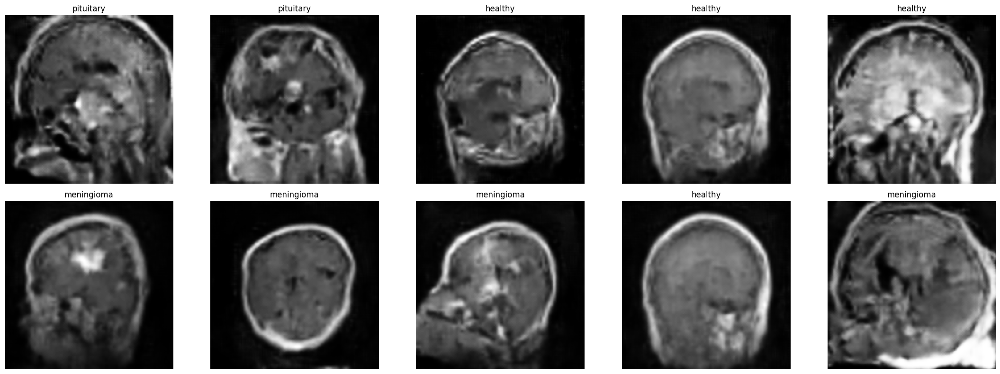

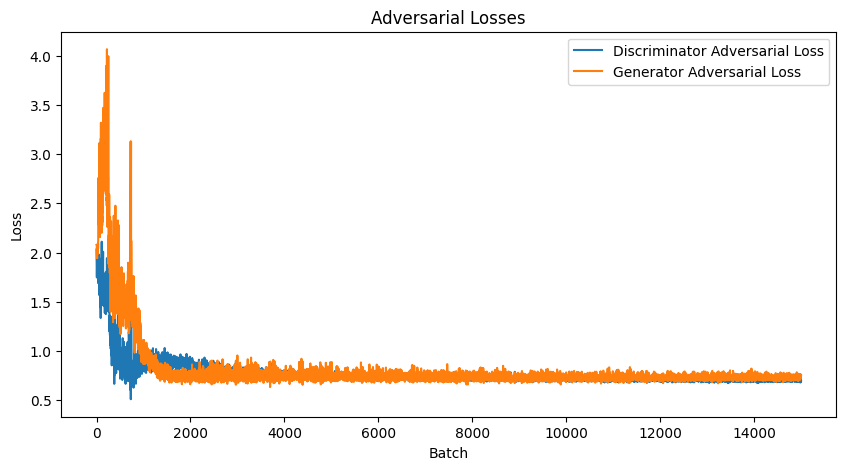

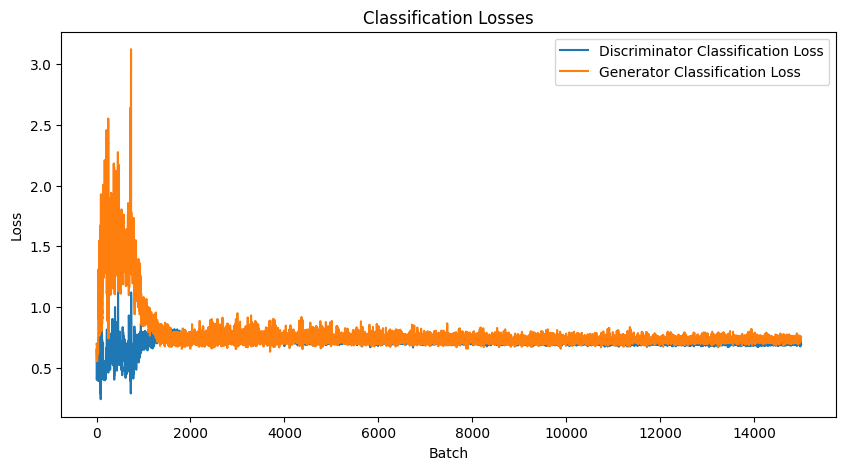

  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 1/3750 [00:00<25:25,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 2/3750 [00:00<25:21,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 3/3750 [00:01<25:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<25:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<25:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<25:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 7/3750 [00:02<25:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 8/3750 [00:03<25:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<25:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<25:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 11/3750 [00:04<25:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 12/3750 [00:04<25:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 13/3750 [00:05<25:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 14/3750 [00:05<25:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<25:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:06<25:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 17/3750 [00:06<25:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<25:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:07<25:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 20/3750 [00:08<25:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<25:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:09<25:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 23/3750 [00:09<25:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 24/3750 [00:09<25:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 25/3750 [00:10<25:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 26/3750 [00:10<25:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 28/3750 [00:11<25:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 29/3750 [00:11<25:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:21,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 31/3750 [00:12<25:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<25:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<25:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 34/3750 [00:13<25:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<25:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 36/3750 [00:14<25:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<25:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 38/3750 [00:15<25:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:16<25:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 40/3750 [00:16<25:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 41/3750 [00:16<25:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 42/3750 [00:17<25:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:17<25:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:18<25:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 45/3750 [00:18<25:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 46/3750 [00:18<25:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 47/3750 [00:19<25:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 48/3750 [00:19<25:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:20<25:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 50/3750 [00:20<25:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:20<25:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 52/3750 [00:21<25:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 53/3750 [00:21<25:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 54/3750 [00:22<25:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 55/3750 [00:22<25:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 56/3750 [00:23<25:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 57/3750 [00:23<25:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:23<25:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 59/3750 [00:24<25:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 60/3750 [00:24<25:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 61/3750 [00:25<25:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 62/3750 [00:25<25:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 63/3750 [00:25<25:07,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 64/3750 [00:26<25:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 65/3750 [00:26<25:06,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 66/3750 [00:27<25:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:27<25:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 68/3750 [00:27<25:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 69/3750 [00:28<25:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 70/3750 [00:28<25:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:29<25:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:29<25:17,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 73/3750 [00:29<25:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 74/3750 [00:30<25:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:30<25:02,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 76/3750 [00:31<25:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:31<25:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 78/3750 [00:32<25:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:32<25:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:32<25:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:33<25:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:33<24:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 83/3750 [00:34<24:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 84/3750 [00:34<24:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 85/3750 [00:34<24:52,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 86/3750 [00:35<25:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:35<25:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:36<24:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:36<24:55,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:36<24:53,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:37<24:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:37<24:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 93/3750 [00:38<24:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 94/3750 [00:38<24:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 95/3750 [00:38<24:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 96/3750 [00:39<24:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 97/3750 [00:39<24:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 98/3750 [00:40<24:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 99/3750 [00:40<25:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:41<25:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 101/3750 [00:41<24:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 102/3750 [00:41<24:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 103/3750 [00:42<24:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 104/3750 [00:42<24:56,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 105/3750 [00:43<31:35,  1.92it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 106/3750 [00:43<29:37,  2.05it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 107/3750 [00:44<28:19,  2.14it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 108/3750 [00:44<27:18,  2.22it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 109/3750 [00:45<26:44,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 110/3750 [00:45<26:17,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 111/3750 [00:45<26:04,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 112/3750 [00:46<25:50,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 113/3750 [00:46<25:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 114/3750 [00:47<25:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 115/3750 [00:47<26:18,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:48<25:58,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 117/3750 [00:48<25:42,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 118/3750 [00:48<25:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:49<25:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 120/3750 [00:49<25:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:50<25:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:50<25:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:51<25:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 124/3750 [00:51<25:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 125/3750 [00:51<25:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:52<25:21,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 127/3750 [00:52<25:20,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 128/3750 [00:53<25:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 129/3750 [00:53<25:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 130/3750 [00:53<25:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:54<25:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:54<25:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:55<25:20,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 134/3750 [00:55<25:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:56<25:09,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 136/3750 [00:56<25:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 137/3750 [00:56<25:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 138/3750 [00:57<25:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 139/3750 [00:57<25:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 140/3750 [00:58<25:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:58<25:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:58<25:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 143/3750 [00:59<25:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 144/3750 [00:59<24:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [01:00<25:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [01:00<24:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 147/3750 [01:01<25:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:01<25:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:01<25:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:02<24:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 151/3750 [01:02<25:00,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 152/3750 [01:03<24:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:03<25:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:03<25:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 155/3750 [01:04<25:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 156/3750 [01:04<25:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 157/3750 [01:05<25:08,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 158/3750 [01:05<25:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 159/3750 [01:06<25:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 160/3750 [01:06<25:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:06<25:07,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 162/3750 [01:07<25:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:07<25:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 164/3750 [01:08<24:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 165/3750 [01:08<25:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:08<24:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 167/3750 [01:09<24:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:09<24:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 169/3750 [01:10<24:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 170/3750 [01:10<24:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 171/3750 [01:11<24:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:11<24:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:11<24:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 174/3750 [01:12<25:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:12<24:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 176/3750 [01:13<24:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:13<24:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:13<24:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 179/3750 [01:14<25:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 180/3750 [01:14<24:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 181/3750 [01:15<24:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 182/3750 [01:15<24:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 183/3750 [01:16<24:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:16<24:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 185/3750 [01:16<24:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 186/3750 [01:17<24:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 187/3750 [01:17<24:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 188/3750 [01:18<24:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:18<24:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 190/3750 [01:19<24:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 191/3750 [01:19<24:37,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


  5%|▌         | 192/3750 [01:19<24:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:20<24:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:20<24:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 195/3750 [01:21<24:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 196/3750 [01:21<24:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:21<24:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 198/3750 [01:22<24:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 199/3750 [01:22<24:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 200/3750 [01:23<24:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 201/3750 [01:23<25:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 202/3750 [01:24<24:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 203/3750 [01:24<24:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:24<24:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 205/3750 [01:25<24:36,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 206/3750 [01:25<24:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:26<24:36,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 208/3750 [01:26<24:38,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 209/3750 [01:26<24:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 210/3750 [01:27<25:02,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 211/3750 [01:27<24:52,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 212/3750 [01:28<24:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 213/3750 [01:28<24:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:29<24:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:29<24:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 216/3750 [01:29<24:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 217/3750 [01:30<24:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [01:30<24:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:31<24:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:31<24:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 221/3750 [01:31<24:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 222/3750 [01:32<24:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 223/3750 [01:32<24:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 224/3750 [01:33<24:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [01:33<24:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [01:34<24:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 227/3750 [01:34<24:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:34<24:37,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 229/3750 [01:35<24:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 230/3750 [01:35<24:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 231/3750 [01:36<24:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:36<24:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:36<24:23,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 234/3750 [01:37<24:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 235/3750 [01:37<24:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:38<24:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:38<24:40,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 238/3750 [01:39<24:34,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▋         | 239/3750 [01:39<24:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 240/3750 [01:39<24:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 241/3750 [01:40<24:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:40<24:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 243/3750 [01:41<24:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:41<24:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 245/3750 [01:41<24:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 246/3750 [01:42<24:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:42<24:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 248/3750 [01:43<24:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:43<24:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:44<24:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:44<24:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 252/3750 [01:44<24:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:45<24:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:45<24:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 255/3750 [01:46<24:24,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 256/3750 [01:46<24:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 257/3750 [01:46<24:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 258/3750 [01:47<24:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [01:47<24:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 260/3750 [01:48<24:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:48<24:20,  2.39it/s]

2/2 [==============================] - 0s 46ms/step


  7%|▋         | 262/3750 [01:49<24:43,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 263/3750 [01:49<24:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:49<24:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 265/3750 [01:50<24:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 266/3750 [01:50<24:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 267/3750 [01:51<24:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 268/3750 [01:51<24:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 269/3750 [01:52<24:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:52<24:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 271/3750 [01:52<24:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [01:53<24:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 273/3750 [01:53<24:19,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 274/3750 [01:54<24:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:54<24:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 276/3750 [01:54<24:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:55<24:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 278/3750 [01:55<24:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:56<24:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 280/3750 [01:56<24:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 281/3750 [01:57<24:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 282/3750 [01:57<24:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 283/3750 [01:57<24:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:58<24:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:58<24:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 286/3750 [01:59<24:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 287/3750 [01:59<23:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 288/3750 [01:59<24:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [02:00<24:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 290/3750 [02:00<24:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [02:01<24:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 292/3750 [02:01<24:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [02:02<24:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [02:02<23:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 295/3750 [02:02<24:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 296/3750 [02:03<24:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 297/3750 [02:03<24:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 298/3750 [02:04<23:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 299/3750 [02:04<23:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [02:04<24:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [02:05<23:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:05<23:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 303/3750 [02:06<23:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 304/3750 [02:06<23:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 305/3750 [02:07<23:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 306/3750 [02:07<23:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 307/3750 [02:07<23:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:08<23:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 309/3750 [02:08<23:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:09<23:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:09<23:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:09<23:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:10<23:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 314/3750 [02:10<23:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:11<23:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 316/3750 [02:11<23:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:12<23:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:12<24:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:12<24:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:13<24:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:13<24:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 322/3750 [02:14<23:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:14<23:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 324/3750 [02:14<23:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 325/3750 [02:15<23:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 326/3750 [02:15<23:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 327/3750 [02:16<23:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 328/3750 [02:16<23:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:17<23:41,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 330/3750 [02:17<23:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 331/3750 [02:17<23:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 332/3750 [02:18<23:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 333/3750 [02:18<23:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:19<23:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:19<23:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 336/3750 [02:19<23:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 337/3750 [02:20<23:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:20<23:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 339/3750 [02:21<23:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:21<23:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:22<23:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 342/3750 [02:22<23:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:22<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 344/3750 [02:23<23:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 345/3750 [02:23<23:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 346/3750 [02:24<23:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 347/3750 [02:24<23:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 348/3750 [02:24<23:56,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 349/3750 [02:25<23:48,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 350/3750 [02:25<23:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 351/3750 [02:26<23:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:26<23:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 353/3750 [02:27<23:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 354/3750 [02:27<23:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 355/3750 [02:27<23:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 356/3750 [02:28<23:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 357/3750 [02:28<23:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 358/3750 [02:29<23:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 359/3750 [02:29<23:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 360/3750 [02:29<23:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 361/3750 [02:30<23:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 362/3750 [02:30<23:39,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 363/3750 [02:31<23:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:31<23:35,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 365/3750 [02:32<23:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 366/3750 [02:32<23:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:32<23:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 368/3750 [02:33<23:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:33<23:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:34<23:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 371/3750 [02:34<23:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:35<23:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:35<23:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 374/3750 [02:35<23:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:36<23:40,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 376/3750 [02:36<23:45,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 377/3750 [02:37<23:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 378/3750 [02:37<23:34,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 379/3750 [02:37<23:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:38<23:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 381/3750 [02:38<23:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 382/3750 [02:39<23:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 383/3750 [02:39<23:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:40<23:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:40<23:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 386/3750 [02:40<23:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 387/3750 [02:41<23:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 388/3750 [02:41<23:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 389/3750 [02:42<23:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 390/3750 [02:42<23:15,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


 10%|█         | 391/3750 [02:42<23:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [02:43<23:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 393/3750 [02:43<23:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 394/3750 [02:44<23:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:44<23:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 396/3750 [02:44<23:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 397/3750 [02:45<23:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 398/3750 [02:45<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:46<23:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 400/3750 [02:46<23:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:47<23:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 402/3750 [02:47<23:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 403/3750 [02:47<23:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 404/3750 [02:48<23:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 405/3750 [02:48<23:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:49<23:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:49<23:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 408/3750 [02:49<23:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 409/3750 [02:50<23:46,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 410/3750 [02:50<23:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:51<23:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:51<23:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:52<23:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 414/3750 [02:52<23:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 415/3750 [02:52<23:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:53<23:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 417/3750 [02:53<22:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 418/3750 [02:54<23:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 419/3750 [02:54<23:05,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 420/3750 [02:55<23:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:55<23:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 422/3750 [02:55<23:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 423/3750 [02:56<22:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:56<22:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 425/3750 [02:57<22:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 426/3750 [02:57<22:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:57<22:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:58<22:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 429/3750 [02:58<22:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 430/3750 [02:59<22:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 431/3750 [02:59<23:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [02:59<23:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [03:00<23:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 434/3750 [03:00<23:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [03:01<23:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [03:01<23:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [03:02<23:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 438/3750 [03:02<22:58,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 439/3750 [03:02<22:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 440/3750 [03:03<22:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [03:03<22:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 442/3750 [03:04<22:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 443/3750 [03:04<22:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 444/3750 [03:04<22:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:05<22:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:05<22:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:06<22:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 448/3750 [03:06<22:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 449/3750 [03:07<22:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 450/3750 [03:07<22:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:07<22:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:08<22:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:08<22:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 454/3750 [03:09<22:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:09<22:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 456/3750 [03:09<22:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:10<22:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 458/3750 [03:10<22:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:11<22:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:11<22:59,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 461/3750 [03:12<22:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 462/3750 [03:12<22:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 463/3750 [03:12<23:01,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 464/3750 [03:13<22:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 465/3750 [03:13<22:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 466/3750 [03:14<22:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 467/3750 [03:14<22:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:14<22:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:15<22:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:15<22:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 471/3750 [03:16<22:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 472/3750 [03:16<22:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:17<22:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:17<22:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 475/3750 [03:17<22:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 476/3750 [03:18<22:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:18<22:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 478/3750 [03:19<22:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:19<22:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 480/3750 [03:19<22:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:20<22:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:20<22:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 483/3750 [03:21<22:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:21<22:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 485/3750 [03:21<22:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 486/3750 [03:22<22:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 487/3750 [03:22<22:35,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 488/3750 [03:23<22:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:23<22:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 490/3750 [03:24<22:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 491/3750 [03:24<22:36,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 492/3750 [03:24<22:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 493/3750 [03:25<22:34,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 494/3750 [03:25<22:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 495/3750 [03:26<22:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 496/3750 [03:26<22:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 497/3750 [03:26<22:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 498/3750 [03:27<22:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:27<22:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:28<22:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:28<22:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:29<22:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:29<22:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 504/3750 [03:29<22:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:30<22:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 506/3750 [03:30<22:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:31<22:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:31<22:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:31<22:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:32<22:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 511/3750 [03:32<22:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:33<22:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 513/3750 [03:33<22:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 514/3750 [03:33<22:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:34<22:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 516/3750 [03:34<22:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:35<22:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:35<22:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 519/3750 [03:36<22:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 520/3750 [03:36<22:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:36<22:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 522/3750 [03:37<22:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 523/3750 [03:37<22:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 524/3750 [03:38<22:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 525/3750 [03:38<22:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:38<22:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 527/3750 [03:39<22:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 528/3750 [03:39<22:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:40<22:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 530/3750 [03:40<22:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 531/3750 [03:41<22:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 532/3750 [03:41<22:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:41<22:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 534/3750 [03:42<22:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 535/3750 [03:42<22:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 536/3750 [03:43<22:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:43<22:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 538/3750 [03:43<22:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:44<22:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 540/3750 [03:44<22:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:45<22:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 542/3750 [03:45<22:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 543/3750 [03:46<22:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:46<22:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:46<22:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 546/3750 [03:47<22:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:47<22:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 548/3750 [03:48<22:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▍        | 549/3750 [03:48<22:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:48<22:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 551/3750 [03:49<21:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:49<21:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 553/3750 [03:50<21:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 554/3750 [03:50<21:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:50<22:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:51<21:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 557/3750 [03:51<22:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 558/3750 [03:52<22:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 559/3750 [03:52<22:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 560/3750 [03:53<22:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:53<21:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 562/3750 [03:53<21:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:54<21:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:54<21:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:55<22:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:55<21:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 567/3750 [03:55<21:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:56<22:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 569/3750 [03:56<21:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:57<22:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:57<22:07,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 572/3750 [03:58<22:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:58<22:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 574/3750 [03:58<21:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [03:59<21:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [03:59<21:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [04:00<21:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 578/3750 [04:00<21:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 579/3750 [04:00<22:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [04:01<21:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [04:01<21:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 582/3750 [04:02<21:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 583/3750 [04:02<21:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 584/3750 [04:03<21:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 585/3750 [04:03<21:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 586/3750 [04:03<21:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 587/3750 [04:04<21:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 588/3750 [04:04<21:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 589/3750 [04:05<21:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 590/3750 [04:05<21:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 591/3750 [04:05<21:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 592/3750 [04:06<21:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:06<21:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 594/3750 [04:07<21:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 595/3750 [04:07<21:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:07<21:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [04:08<21:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 598/3750 [04:08<21:37,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 599/3750 [04:09<21:39,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 600/3750 [04:09<21:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 601/3750 [04:10<21:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:10<21:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 603/3750 [04:10<21:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 604/3750 [04:11<21:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:11<21:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 606/3750 [04:12<21:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:12<21:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 608/3750 [04:12<21:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 609/3750 [04:13<21:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 610/3750 [04:13<21:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 611/3750 [04:14<21:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 612/3750 [04:14<21:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 613/3750 [04:14<21:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [04:15<21:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:15<21:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 616/3750 [04:16<21:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:16<21:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 618/3750 [04:17<21:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:17<21:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 620/3750 [04:17<21:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:18<21:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:18<21:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:19<21:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:19<21:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 625/3750 [04:19<21:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:20<21:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:20<21:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 628/3750 [04:21<21:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:21<21:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:22<21:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:22<21:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 632/3750 [04:22<21:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:23<21:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 634/3750 [04:23<21:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 635/3750 [04:24<21:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 636/3750 [04:24<21:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 637/3750 [04:24<21:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 638/3750 [04:25<21:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 639/3750 [04:25<21:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 640/3750 [04:26<21:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 641/3750 [04:26<21:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 642/3750 [04:26<21:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 643/3750 [04:27<21:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 644/3750 [04:27<21:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:28<21:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 646/3750 [04:28<21:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 647/3750 [04:29<21:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:29<21:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 649/3750 [04:29<21:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 650/3750 [04:30<21:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 651/3750 [04:30<21:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 652/3750 [04:31<21:15,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 653/3750 [04:31<21:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 654/3750 [04:31<21:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 655/3750 [04:32<21:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:32<21:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 657/3750 [04:33<21:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 658/3750 [04:33<21:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:34<21:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 660/3750 [04:34<21:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 661/3750 [04:34<21:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 662/3750 [04:35<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 663/3750 [04:35<21:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:36<21:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 665/3750 [04:36<21:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 666/3750 [04:36<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:37<21:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:37<21:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:38<21:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 670/3750 [04:38<21:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 671/3750 [04:38<21:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 672/3750 [04:39<21:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 673/3750 [04:39<21:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 674/3750 [04:40<21:13,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 675/3750 [04:40<21:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 676/3750 [04:41<21:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:41<21:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 678/3750 [04:41<21:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:42<21:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 680/3750 [04:42<21:01,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 681/3750 [04:43<21:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 682/3750 [04:43<21:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 683/3750 [04:43<21:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:44<21:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 685/3750 [04:44<21:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 686/3750 [04:45<21:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 687/3750 [04:45<21:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:45<21:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:46<21:04,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 690/3750 [04:46<21:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 691/3750 [04:47<21:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 692/3750 [04:47<21:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 693/3750 [04:48<21:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 694/3750 [04:48<21:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:48<20:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:49<20:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 697/3750 [04:49<20:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 698/3750 [04:50<20:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 699/3750 [04:50<21:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:50<21:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 701/3750 [04:51<20:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 702/3750 [04:51<20:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 703/3750 [04:52<20:51,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 704/3750 [04:52<20:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 705/3750 [04:52<20:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:53<21:28,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:53<21:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 708/3750 [04:54<21:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 709/3750 [04:54<21:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 710/3750 [04:55<21:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:55<21:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 712/3750 [04:55<20:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 713/3750 [04:56<20:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [04:56<20:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 715/3750 [04:57<20:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:57<20:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 717/3750 [04:57<20:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 718/3750 [04:58<20:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [04:58<20:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 720/3750 [04:59<20:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 721/3750 [04:59<20:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 722/3750 [05:00<20:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [05:00<20:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 724/3750 [05:00<20:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [05:01<20:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [05:01<20:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 727/3750 [05:02<20:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 728/3750 [05:02<20:49,  2.42it/s]

2/2 [==============================] - 0s 18ms/step


 19%|█▉        | 729/3750 [05:02<20:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 730/3750 [05:03<20:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 731/3750 [05:03<20:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 732/3750 [05:04<20:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 733/3750 [05:04<20:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [05:04<20:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 735/3750 [05:05<20:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:05<20:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 737/3750 [05:06<20:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 738/3750 [05:06<20:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 739/3750 [05:07<20:44,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 740/3750 [05:07<20:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:07<20:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 742/3750 [05:08<20:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:08<20:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 744/3750 [05:09<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:09<20:45,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 746/3750 [05:09<20:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 747/3750 [05:10<20:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 748/3750 [05:10<20:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 749/3750 [05:11<20:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 750/3750 [05:11<20:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 751/3750 [05:12<20:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 752/3750 [05:12<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 753/3750 [05:12<20:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 754/3750 [05:13<20:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [05:13<20:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 756/3750 [05:14<20:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 757/3750 [05:14<20:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:14<20:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 759/3750 [05:15<20:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 760/3750 [05:15<20:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 761/3750 [05:16<20:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:16<20:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 763/3750 [05:16<20:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 764/3750 [05:17<20:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 765/3750 [05:17<20:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:18<20:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 767/3750 [05:18<20:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 768/3750 [05:19<20:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 769/3750 [05:19<20:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:19<20:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 771/3750 [05:20<20:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 772/3750 [05:20<20:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 773/3750 [05:21<20:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 774/3750 [05:21<20:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 775/3750 [05:21<20:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 776/3750 [05:22<20:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 777/3750 [05:22<20:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:23<20:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:23<20:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:23<20:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 781/3750 [05:24<20:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 782/3750 [05:24<20:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 783/3750 [05:25<20:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 784/3750 [05:25<20:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 785/3750 [05:26<20:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:26<20:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:26<20:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 788/3750 [05:27<20:15,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 789/3750 [05:27<20:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:28<20:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 791/3750 [05:28<20:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 792/3750 [05:28<20:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 793/3750 [05:29<20:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 794/3750 [05:29<20:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 795/3750 [05:30<20:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:30<20:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:30<20:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:31<20:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 799/3750 [05:31<20:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 800/3750 [05:32<20:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:32<20:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 802/3750 [05:33<20:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:33<20:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:33<20:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 805/3750 [05:34<20:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██▏       | 806/3750 [05:34<20:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:35<20:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:35<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 809/3750 [05:35<20:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 810/3750 [05:36<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:36<20:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:37<20:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 813/3750 [05:37<20:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 814/3750 [05:37<20:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [05:38<20:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 816/3750 [05:38<20:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 817/3750 [05:39<20:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 818/3750 [05:39<20:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 819/3750 [05:40<20:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 820/3750 [05:40<20:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 821/3750 [05:40<20:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:41<20:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 823/3750 [05:41<20:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 824/3750 [05:42<20:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:42<20:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:42<19:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 827/3750 [05:43<20:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 828/3750 [05:43<20:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 829/3750 [05:44<20:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 830/3750 [05:44<20:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:44<19:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:45<19:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 833/3750 [05:45<19:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 834/3750 [05:46<19:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 835/3750 [05:46<19:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:47<19:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 837/3750 [05:47<19:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:47<19:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:48<19:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 840/3750 [05:48<19:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:49<19:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 842/3750 [05:49<19:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 843/3750 [05:49<19:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:50<19:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 845/3750 [05:50<19:46,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 846/3750 [05:51<19:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 847/3750 [05:51<20:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 848/3750 [05:51<19:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 849/3750 [05:52<19:54,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 850/3750 [05:52<19:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 851/3750 [05:53<19:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 852/3750 [05:53<19:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 853/3750 [05:54<19:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 854/3750 [05:54<20:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:54<20:43,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 856/3750 [05:55<20:30,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 857/3750 [05:55<20:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:56<20:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [05:56<19:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 860/3750 [05:56<19:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 861/3750 [05:57<19:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 862/3750 [05:57<19:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 863/3750 [05:58<19:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [05:58<19:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [05:58<19:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 866/3750 [05:59<19:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [05:59<19:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [06:00<19:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 869/3750 [06:00<19:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [06:01<19:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 871/3750 [06:01<19:38,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 872/3750 [06:01<19:37,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 873/3750 [06:02<19:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [06:02<19:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 875/3750 [06:03<19:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [06:03<19:32,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 877/3750 [06:03<19:33,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 878/3750 [06:04<19:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [06:04<19:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [06:05<19:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [06:05<19:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [06:05<19:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 883/3750 [06:06<19:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 884/3750 [06:06<19:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 885/3750 [06:07<19:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:07<19:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 887/3750 [06:08<19:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:08<19:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:08<19:29,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▎       | 890/3750 [06:09<19:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 891/3750 [06:09<19:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 892/3750 [06:10<19:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:10<19:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 894/3750 [06:10<19:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:11<19:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 896/3750 [06:11<19:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:12<19:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:12<19:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:12<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [06:13<19:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 901/3750 [06:13<19:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 902/3750 [06:14<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 903/3750 [06:14<19:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 904/3750 [06:14<19:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 905/3750 [06:15<19:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:15<19:27,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 907/3750 [06:16<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 908/3750 [06:16<19:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:17<19:26,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 910/3750 [06:17<19:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 911/3750 [06:17<19:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:18<19:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 913/3750 [06:18<19:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 914/3750 [06:19<19:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:19<19:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:19<19:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:20<19:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 918/3750 [06:20<19:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 919/3750 [06:21<19:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:21<19:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 921/3750 [06:21<19:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:22<19:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 923/3750 [06:22<19:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:23<19:15,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:23<19:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:24<19:12,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 927/3750 [06:24<19:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [06:24<19:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 929/3750 [06:25<19:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [06:25<19:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:26<19:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 932/3750 [06:26<19:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:26<19:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 934/3750 [06:27<19:22,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 935/3750 [06:27<19:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 936/3750 [06:28<19:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 937/3750 [06:28<19:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 938/3750 [06:28<19:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 939/3750 [06:29<19:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 940/3750 [06:29<19:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:30<19:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:30<19:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:31<19:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 944/3750 [06:31<19:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 945/3750 [06:31<19:02,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 946/3750 [06:32<19:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 947/3750 [06:32<19:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 948/3750 [06:33<19:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 949/3750 [06:33<19:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 950/3750 [06:33<19:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:34<19:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:34<19:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:35<19:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 954/3750 [06:35<18:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:35<19:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:36<19:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:36<18:57,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 958/3750 [06:37<18:55,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 959/3750 [06:37<18:56,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:37<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:38<18:55,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 962/3750 [06:38<18:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 963/3750 [06:39<18:56,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 964/3750 [06:39<19:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:40<19:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 966/3750 [06:40<19:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 967/3750 [06:40<19:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 968/3750 [06:41<19:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 969/3750 [06:41<19:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:42<19:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 971/3750 [06:42<19:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 972/3750 [06:42<18:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 973/3750 [06:43<19:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 974/3750 [06:43<19:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 975/3750 [06:44<19:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 976/3750 [06:44<18:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 977/3750 [06:44<18:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 978/3750 [06:45<18:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 979/3750 [06:45<18:55,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 980/3750 [06:46<18:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:46<18:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:47<19:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:47<18:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 984/3750 [06:47<18:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:48<18:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▋       | 986/3750 [06:48<18:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 987/3750 [06:49<18:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 988/3750 [06:49<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 989/3750 [06:49<18:44,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:50<18:44,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:50<18:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 992/3750 [06:51<18:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:51<18:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 994/3750 [06:51<18:49,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 995/3750 [06:52<18:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 996/3750 [06:52<18:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:53<18:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 998/3750 [06:53<18:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:53<18:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:54<18:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1001/3750 [06:54<18:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1002/3750 [06:55<18:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1003/3750 [06:55<18:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [06:56<18:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [06:56<18:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [06:56<18:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [06:57<18:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1008/3750 [06:57<18:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [06:58<18:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [06:58<18:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1011/3750 [06:58<18:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [06:59<18:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1013/3750 [06:59<18:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [07:00<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [07:00<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [07:00<18:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [07:01<18:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [07:01<18:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [07:02<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1020/3750 [07:02<18:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [07:02<18:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [07:03<18:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1023/3750 [07:03<18:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [07:04<18:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1025/3750 [07:04<18:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [07:05<18:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1027/3750 [07:05<18:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1028/3750 [07:05<18:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:06<18:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:06<18:37,  2.43it/s]

2/2 [==============================] - 0s 21ms/step


 27%|██▋       | 1031/3750 [07:07<18:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:07<18:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1033/3750 [07:07<18:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:08<18:27,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1035/3750 [07:08<18:24,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1036/3750 [07:09<18:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:09<18:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:09<18:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:10<18:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1040/3750 [07:10<18:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:11<18:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1042/3750 [07:11<18:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:12<18:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1044/3750 [07:12<18:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1045/3750 [07:12<18:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1046/3750 [07:13<18:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1047/3750 [07:13<18:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1048/3750 [07:14<18:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:14<18:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:14<18:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1051/3750 [07:15<18:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1052/3750 [07:15<18:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1053/3750 [07:16<18:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:16<18:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:16<18:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:17<18:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1057/3750 [07:17<18:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1058/3750 [07:18<18:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:18<18:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:19<18:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1061/3750 [07:19<18:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:19<18:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1063/3750 [07:20<18:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:20<18:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:21<18:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1066/3750 [07:21<18:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:21<18:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:22<18:16,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [07:22<18:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:23<18:14,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1071/3750 [07:23<18:11,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1072/3750 [07:23<18:19,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1073/3750 [07:24<18:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1074/3750 [07:24<18:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1075/3750 [07:25<18:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1076/3750 [07:25<18:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1077/3750 [07:25<18:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:26<18:19,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1079/3750 [07:26<18:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1080/3750 [07:27<18:18,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1081/3750 [07:27<18:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:28<18:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1083/3750 [07:28<18:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:28<18:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:29<18:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:29<18:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:30<18:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1088/3750 [07:30<18:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1089/3750 [07:30<18:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1090/3750 [07:31<18:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1091/3750 [07:31<18:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:32<18:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1093/3750 [07:32<18:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1094/3750 [07:32<18:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:33<18:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:33<18:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [07:34<18:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:34<18:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1099/3750 [07:35<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1100/3750 [07:35<18:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1101/3750 [07:35<18:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:36<18:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1103/3750 [07:36<18:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:37<18:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:37<17:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:37<17:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1107/3750 [07:38<17:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:38<18:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:39<18:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1110/3750 [07:39<18:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:39<17:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:40<17:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:40<17:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1114/3750 [07:41<17:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1115/3750 [07:41<17:53,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:41<17:51,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:42<17:59,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1118/3750 [07:42<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1119/3750 [07:43<17:54,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:43<17:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:44<17:50,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1122/3750 [07:44<17:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1123/3750 [07:44<17:51,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:45<17:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:45<17:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:46<18:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1127/3750 [07:46<18:00,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1128/3750 [07:46<17:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:47<17:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1130/3750 [07:47<17:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:48<17:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:48<17:46,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:48<17:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1134/3750 [07:49<17:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1135/3750 [07:49<17:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:50<18:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1137/3750 [07:50<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1138/3750 [07:51<17:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:51<17:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:51<17:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1141/3750 [07:52<17:46,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1142/3750 [07:52<17:43,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:53<17:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:53<17:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1145/3750 [07:53<17:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1146/3750 [07:54<17:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1147/3750 [07:54<17:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1148/3750 [07:55<17:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [07:55<17:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1150/3750 [07:55<17:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1151/3750 [07:56<17:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [07:56<17:37,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [07:57<17:36,  2.46it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1154/3750 [07:57<18:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [07:57<18:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1156/3750 [07:58<17:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1157/3750 [07:58<17:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1158/3750 [07:59<17:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1159/3750 [07:59<17:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [08:00<17:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [08:00<17:35,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1162/3750 [08:00<17:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [08:01<17:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1164/3750 [08:01<17:44,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1165/3750 [08:02<17:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1166/3750 [08:02<17:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1167/3750 [08:02<17:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1168/3750 [08:03<17:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [08:03<17:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1170/3750 [08:04<17:35,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1171/3750 [08:04<17:30,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [08:04<17:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [08:05<22:32,  1.91it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [08:06<21:12,  2.02it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1175/3750 [08:06<20:12,  2.12it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1176/3750 [08:06<19:29,  2.20it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1177/3750 [08:07<18:59,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1178/3750 [08:07<18:37,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1179/3750 [08:08<18:23,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1180/3750 [08:08<18:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1181/3750 [08:09<18:24,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:09<18:11,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1183/3750 [08:09<18:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1184/3750 [08:10<17:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:10<17:53,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1186/3750 [08:11<17:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1187/3750 [08:11<17:51,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1188/3750 [08:12<17:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1189/3750 [08:12<17:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:12<17:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:13<18:04,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:13<18:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1193/3750 [08:14<18:03,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1194/3750 [08:14<18:01,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1195/3750 [08:14<17:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1196/3750 [08:15<17:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:15<17:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:16<17:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1199/3750 [08:16<17:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:17<17:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1201/3750 [08:17<17:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1202/3750 [08:17<17:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:18<17:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:18<17:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1205/3750 [08:19<17:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:19<17:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:19<17:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:20<17:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:20<17:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1210/3750 [08:21<17:49,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1211/3750 [08:21<17:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:22<17:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:22<17:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:22<17:39,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


 32%|███▏      | 1215/3750 [08:23<17:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:23<17:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1217/3750 [08:24<17:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:24<17:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:25<17:42,  2.38it/s]

2/2 [==============================] - 0s 21ms/step


 33%|███▎      | 1220/3750 [08:25<17:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:25<17:37,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1222/3750 [08:26<17:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:26<17:39,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1224/3750 [08:27<17:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1225/3750 [08:27<17:40,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1226/3750 [08:27<17:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:28<17:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:28<17:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1229/3750 [08:29<17:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:29<17:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1231/3750 [08:30<17:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1232/3750 [08:30<17:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:30<17:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1234/3750 [08:31<17:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:31<17:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1236/3750 [08:32<17:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1237/3750 [08:32<17:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:32<17:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:33<17:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:33<17:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1241/3750 [08:34<17:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:34<17:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:35<17:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1244/3750 [08:35<17:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:35<17:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1246/3750 [08:36<17:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:36<17:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:37<17:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:37<17:32,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1250/3750 [08:38<17:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1251/3750 [08:38<17:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1252/3750 [08:38<17:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1253/3750 [08:39<17:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:39<17:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:40<17:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:40<17:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:40<17:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1258/3750 [08:41<17:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1259/3750 [08:41<17:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1260/3750 [08:42<17:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:42<17:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1262/3750 [08:43<17:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1263/3750 [08:43<17:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:43<17:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1265/3750 [08:44<17:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1266/3750 [08:44<17:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:45<17:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:45<17:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:45<17:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1270/3750 [08:46<17:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:46<17:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1272/3750 [08:47<17:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:47<17:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:48<17:17,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1275/3750 [08:48<17:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1276/3750 [08:48<17:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1277/3750 [08:49<17:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:49<17:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:50<17:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:50<17:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1281/3750 [08:50<17:11,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1282/3750 [08:51<17:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:51<17:07,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1284/3750 [08:52<17:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1285/3750 [08:52<17:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:53<17:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1287/3750 [08:53<17:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1288/3750 [08:53<17:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1289/3750 [08:54<17:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:54<17:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [08:55<17:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [08:55<17:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1293/3750 [08:55<17:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1294/3750 [08:56<17:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [08:56<17:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [08:57<17:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [08:57<17:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [08:58<17:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1299/3750 [08:58<17:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [08:58<17:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1301/3750 [08:59<17:07,  2.38it/s]

2/2 [==============================] - 0s 17ms/step


 35%|███▍      | 1302/3750 [08:59<17:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [09:00<17:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [09:00<17:04,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1305/3750 [09:01<17:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [09:01<17:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1307/3750 [09:01<17:08,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1308/3750 [09:02<17:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [09:02<17:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [09:03<16:59,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1311/3750 [09:03<16:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [09:03<16:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1313/3750 [09:04<16:54,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1314/3750 [09:04<17:00,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1315/3750 [09:05<16:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1316/3750 [09:05<17:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [09:06<16:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [09:06<16:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [09:06<16:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [09:07<16:54,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1321/3750 [09:07<16:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:08<16:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1323/3750 [09:08<16:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1324/3750 [09:08<16:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:09<16:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:09<16:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:10<16:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1328/3750 [09:10<16:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1329/3750 [09:11<16:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1330/3750 [09:11<16:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1331/3750 [09:11<16:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1332/3750 [09:12<16:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:12<16:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:13<16:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1335/3750 [09:13<16:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1336/3750 [09:13<16:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1337/3750 [09:14<16:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:14<16:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1339/3750 [09:15<16:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:15<16:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:16<16:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:16<16:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1343/3750 [09:16<16:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [09:17<16:49,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1345/3750 [09:17<16:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:18<16:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:18<16:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1348/3750 [09:18<16:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1349/3750 [09:19<16:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1350/3750 [09:19<16:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:20<16:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:20<16:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:21<16:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1354/3750 [09:21<16:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1355/3750 [09:21<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:22<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1357/3750 [09:22<16:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1358/3750 [09:23<16:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:23<16:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:24<16:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:24<16:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1362/3750 [09:24<16:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:25<16:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:25<16:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1365/3750 [09:26<16:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:26<16:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:26<16:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1368/3750 [09:27<16:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:27<16:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:28<16:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1371/3750 [09:28<16:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1372/3750 [09:29<16:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1373/3750 [09:29<16:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1374/3750 [09:29<16:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1375/3750 [09:30<16:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1376/3750 [09:30<16:30,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1377/3750 [09:31<16:37,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1378/3750 [09:31<16:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1379/3750 [09:31<16:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:32<16:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1381/3750 [09:32<16:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1382/3750 [09:33<16:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1383/3750 [09:33<16:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1384/3750 [09:34<16:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1385/3750 [09:34<16:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1386/3750 [09:34<16:40,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1387/3750 [09:35<16:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1388/3750 [09:35<16:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:36<16:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:36<16:24,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1391/3750 [09:36<16:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1392/3750 [09:37<16:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1393/3750 [09:37<16:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1394/3750 [09:38<16:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1395/3750 [09:38<16:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1396/3750 [09:39<16:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1397/3750 [09:39<16:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1398/3750 [09:39<16:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1399/3750 [09:40<16:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1400/3750 [09:40<16:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:41<16:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:41<16:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1403/3750 [09:41<16:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:42<16:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [09:42<16:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:43<16:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:43<16:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1408/3750 [09:44<16:10,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1409/3750 [09:44<16:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:44<16:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1411/3750 [09:45<16:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:45<16:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1413/3750 [09:46<16:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1414/3750 [09:46<16:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:46<16:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1416/3750 [09:47<16:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:47<16:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1418/3750 [09:48<16:09,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1419/3750 [09:48<16:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1420/3750 [09:49<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:49<16:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [09:49<16:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:50<16:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1424/3750 [09:50<16:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1425/3750 [09:51<16:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1426/3750 [09:51<16:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:51<16:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1428/3750 [09:52<16:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:52<16:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1430/3750 [09:53<16:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:53<16:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:54<16:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:54<16:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1434/3750 [09:54<16:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [09:55<15:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1436/3750 [09:55<16:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1437/3750 [09:56<16:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1438/3750 [09:56<16:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1439/3750 [09:56<15:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [09:57<16:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1441/3750 [09:57<16:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [09:58<16:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [09:58<16:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1444/3750 [09:59<16:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [09:59<16:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [09:59<16:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [10:00<16:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [10:00<16:09,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1449/3750 [10:01<16:10,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1450/3750 [10:01<16:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1451/3750 [10:01<16:00,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1452/3750 [10:02<16:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1453/3750 [10:02<15:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1454/3750 [10:03<15:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1455/3750 [10:03<15:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [10:04<15:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [10:04<15:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [10:04<15:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1459/3750 [10:05<15:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [10:05<15:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1461/3750 [10:06<15:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1462/3750 [10:06<15:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [10:06<15:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1464/3750 [10:07<15:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [10:07<15:47,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1466/3750 [10:08<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:08<15:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1468/3750 [10:09<15:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:09<15:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1470/3750 [10:09<15:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1471/3750 [10:10<15:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:10<15:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:11<15:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1474/3750 [10:11<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1475/3750 [10:11<15:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1476/3750 [10:12<15:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1477/3750 [10:12<15:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1478/3750 [10:13<15:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1479/3750 [10:13<15:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:14<15:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:14<15:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1482/3750 [10:14<15:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:15<15:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [10:15<15:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:16<15:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1486/3750 [10:16<15:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:16<15:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1488/3750 [10:17<15:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1489/3750 [10:17<15:35,  2.42it/s]

2/2 [==============================] - 0s 22ms/step


 40%|███▉      | 1490/3750 [10:18<15:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:18<15:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1492/3750 [10:19<15:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1493/3750 [10:19<15:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1494/3750 [10:19<15:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1495/3750 [10:20<15:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1496/3750 [10:20<15:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:21<15:47,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1498/3750 [10:21<15:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:21<15:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1500/3750 [10:22<15:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1501/3750 [10:22<15:37,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


 40%|████      | 1502/3750 [10:23<15:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:23<15:45,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1504/3750 [10:24<15:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:24<15:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:24<15:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1507/3750 [10:25<15:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [10:25<15:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:26<15:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:26<15:28,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


 40%|████      | 1511/3750 [10:26<15:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1512/3750 [10:27<15:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:27<15:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:28<15:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1515/3750 [10:28<15:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1516/3750 [10:29<15:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1517/3750 [10:29<15:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:29<15:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:30<15:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1520/3750 [10:30<15:27,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


 41%|████      | 1521/3750 [10:31<15:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1522/3750 [10:31<15:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:31<15:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:32<15:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:32<15:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:33<15:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:33<15:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1528/3750 [10:34<15:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:34<15:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:34<15:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:35<15:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1532/3750 [10:35<15:24,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1533/3750 [10:36<15:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1534/3750 [10:36<15:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1535/3750 [10:36<15:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:37<15:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1537/3750 [10:37<15:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:38<15:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [10:38<15:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:39<15:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1541/3750 [10:39<15:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1542/3750 [10:39<15:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:40<15:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:40<15:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:41<15:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:41<15:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:41<15:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1548/3750 [10:42<15:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:42<15:16,  2.40it/s]

2/2 [==============================] - 0s 22ms/step


 41%|████▏     | 1550/3750 [10:43<15:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:43<15:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:44<15:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1553/3750 [10:44<15:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1554/3750 [10:44<15:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:45<15:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1556/3750 [10:45<15:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:46<15:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:46<15:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1559/3750 [10:46<15:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1560/3750 [10:47<15:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:47<15:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:48<15:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:48<15:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1564/3750 [10:49<15:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:49<15:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1566/3750 [10:49<14:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1567/3750 [10:50<15:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1568/3750 [10:50<15:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1569/3750 [10:51<15:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1570/3750 [10:51<15:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:51<15:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1572/3750 [10:52<15:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1573/3750 [10:52<15:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:53<15:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:53<15:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:54<15:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1577/3750 [10:54<15:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [10:54<15:03,  2.40it/s]

2/2 [==============================] - 0s 17ms/step


 42%|████▏     | 1579/3750 [10:55<15:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [10:55<15:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1581/3750 [10:56<15:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [10:56<15:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [10:56<15:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [10:57<14:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1585/3750 [10:57<15:02,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


 42%|████▏     | 1586/3750 [10:58<14:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [10:58<14:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1588/3750 [10:59<15:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [10:59<14:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1590/3750 [10:59<14:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1591/3750 [11:00<14:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1592/3750 [11:00<14:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1593/3750 [11:01<14:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1594/3750 [11:01<14:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [11:01<15:16,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1596/3750 [11:02<15:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [11:02<15:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [11:03<15:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [11:03<15:06,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1600/3750 [11:04<16:33,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [11:04<16:07,  2.22it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [11:04<15:41,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1603/3750 [11:05<15:32,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [11:05<15:18,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [11:06<15:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [11:06<14:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1607/3750 [11:07<14:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1608/3750 [11:07<15:02,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1609/3750 [11:07<14:58,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1610/3750 [11:08<14:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1611/3750 [11:08<14:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1612/3750 [11:09<14:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1613/3750 [11:09<16:21,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1614/3750 [11:10<15:49,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1615/3750 [11:10<15:27,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:10<15:11,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1617/3750 [11:11<15:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1618/3750 [11:11<14:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:12<14:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:12<14:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:13<14:53,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1622/3750 [11:13<14:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:13<14:49,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 43%|████▎     | 1624/3750 [11:14<14:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1625/3750 [11:14<14:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:15<14:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1627/3750 [11:15<14:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1628/3750 [11:15<14:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:16<14:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1630/3750 [11:16<14:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1631/3750 [11:17<14:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:17<14:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:17<14:36,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1634/3750 [11:18<14:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1635/3750 [11:18<14:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1636/3750 [11:19<14:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:19<14:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1638/3750 [11:20<14:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1639/3750 [11:20<14:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1640/3750 [11:20<14:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1641/3750 [11:21<14:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:21<14:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:22<14:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1644/3750 [11:22<14:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:22<14:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:23<14:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:23<14:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1648/3750 [11:24<14:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:24<14:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:25<14:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:25<14:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1652/3750 [11:25<14:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:26<14:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1654/3750 [11:26<14:20,  2.44it/s]

2/2 [==============================] - 0s 17ms/step


 44%|████▍     | 1655/3750 [11:27<14:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1656/3750 [11:27<14:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:27<14:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:28<14:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:28<14:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1660/3750 [11:29<14:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:29<14:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:29<14:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:30<14:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1664/3750 [11:30<14:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:31<14:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1666/3750 [11:31<14:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1667/3750 [11:32<14:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1668/3750 [11:32<14:34,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 45%|████▍     | 1669/3750 [11:32<14:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1670/3750 [11:33<14:25,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1671/3750 [11:33<14:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1672/3750 [11:34<14:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1673/3750 [11:34<14:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1674/3750 [11:34<14:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:35<14:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:35<14:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:36<14:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:36<14:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1679/3750 [11:37<14:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1680/3750 [11:37<14:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:37<14:10,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1682/3750 [11:38<14:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1683/3750 [11:38<14:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:39<14:13,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1685/3750 [11:39<14:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1686/3750 [11:39<14:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:40<14:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1688/3750 [11:40<14:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1689/3750 [11:41<14:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1690/3750 [11:41<14:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1691/3750 [11:41<14:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:42<14:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1693/3750 [11:42<14:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1694/3750 [11:43<14:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1695/3750 [11:43<14:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:44<14:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:44<14:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:44<14:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1699/3750 [11:45<14:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1700/3750 [11:45<14:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [11:46<14:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1702/3750 [11:46<14:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:46<14:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:47<14:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1705/3750 [11:47<14:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1706/3750 [11:48<14:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1707/3750 [11:48<14:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:48<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1709/3750 [11:49<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:49<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:50<13:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1712/3750 [11:50<13:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:51<13:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:51<13:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1715/3750 [11:51<13:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1716/3750 [11:52<13:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:52<13:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:53<13:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:53<13:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [11:53<13:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [11:54<14:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [11:54<14:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1723/3750 [11:55<14:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [11:55<14:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [11:56<14:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [11:56<13:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [11:56<13:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [11:57<13:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1729/3750 [11:57<13:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1730/3750 [11:58<13:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [11:58<13:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [11:58<13:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1733/3750 [11:59<13:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [11:59<13:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1735/3750 [12:00<13:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [12:00<13:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1737/3750 [12:00<13:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1738/3750 [12:01<13:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [12:01<13:54,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▋     | 1740/3750 [12:02<13:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [12:02<13:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [12:03<13:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [12:03<14:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [12:03<14:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [12:04<14:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [12:04<13:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [12:05<13:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1748/3750 [12:05<13:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1749/3750 [12:05<13:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1750/3750 [12:06<13:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [12:06<13:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1752/3750 [12:07<13:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [12:07<13:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1754/3750 [12:08<13:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1755/3750 [12:08<13:44,  2.42it/s]

2/2 [==============================] - 0s 21ms/step


 47%|████▋     | 1756/3750 [12:08<13:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1757/3750 [12:09<13:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [12:09<13:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1759/3750 [12:10<13:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:10<13:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1761/3750 [12:10<13:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1762/3750 [12:11<13:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:11<13:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1764/3750 [12:12<13:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1765/3750 [12:12<13:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:12<13:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1767/3750 [12:13<13:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1768/3750 [12:13<13:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1769/3750 [12:14<13:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1770/3750 [12:14<13:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1771/3750 [12:15<13:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1772/3750 [12:15<13:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1773/3750 [12:15<13:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:16<13:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1775/3750 [12:16<13:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:17<13:33,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1777/3750 [12:17<13:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1778/3750 [12:17<13:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1779/3750 [12:18<13:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:18<13:31,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1781/3750 [12:19<13:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:19<13:31,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1783/3750 [12:19<13:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:20<13:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1785/3750 [12:20<13:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1786/3750 [12:21<13:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:21<13:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:22<13:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:22<13:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1790/3750 [12:22<13:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1791/3750 [12:23<13:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:23<13:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1793/3750 [12:24<13:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:24<13:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1795/3750 [12:24<13:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:25<13:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1797/3750 [12:25<13:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:26<13:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1799/3750 [12:26<13:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:26<13:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1801/3750 [12:27<13:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1802/3750 [12:27<13:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:28<13:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1804/3750 [12:28<13:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1805/3750 [12:29<13:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:29<13:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:29<13:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1808/3750 [12:30<13:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1809/3750 [12:30<13:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:31<13:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1811/3750 [12:31<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:31<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1813/3750 [12:32<13:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1814/3750 [12:32<13:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1815/3750 [12:33<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:33<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:33<13:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1818/3750 [12:34<13:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:34<13:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1820/3750 [12:35<13:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:35<13:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:36<13:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:36<13:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:36<13:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1825/3750 [12:37<13:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:37<13:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:38<13:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1828/3750 [12:38<13:07,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1829/3750 [12:38<13:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1830/3750 [12:39<13:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:39<13:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1832/3750 [12:40<13:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1833/3750 [12:40<13:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:40<13:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:41<13:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:41<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:42<13:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1838/3750 [12:42<13:02,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1839/3750 [12:43<13:01,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:43<13:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:43<13:00,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1842/3750 [12:44<12:59,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1843/3750 [12:44<12:58,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1844/3750 [12:45<12:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:45<12:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1846/3750 [12:45<12:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1847/3750 [12:46<12:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:46<12:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1849/3750 [12:47<12:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1850/3750 [12:47<13:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:47<13:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1852/3750 [12:48<13:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [12:48<13:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:49<12:58,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1855/3750 [12:49<12:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1856/3750 [12:49<12:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1857/3750 [12:50<12:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:50<12:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:51<12:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:51<12:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:52<12:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:52<12:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [12:52<13:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [12:53<13:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [12:53<12:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [12:54<12:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1867/3750 [12:54<12:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1868/3750 [12:54<12:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1869/3750 [12:55<12:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [12:55<12:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [12:56<12:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1872/3750 [12:56<12:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1873/3750 [12:56<12:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [12:57<12:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1875/3750 [12:57<12:46,  2.45it/s]

2/2 [==============================] - 0s 23ms/step


 50%|█████     | 1876/3750 [12:58<12:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [12:58<12:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [12:59<12:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [12:59<12:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1880/3750 [12:59<12:45,  2.44it/s]

2/2 [==============================] - 0s 22ms/step


 50%|█████     | 1881/3750 [13:00<12:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1882/3750 [13:00<12:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1883/3750 [13:01<12:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1884/3750 [13:01<12:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [13:01<12:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [13:02<12:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1887/3750 [13:02<12:47,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1888/3750 [13:03<12:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [13:03<12:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1890/3750 [13:03<12:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [13:04<12:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [13:04<13:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1893/3750 [13:05<12:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1894/3750 [13:05<12:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1895/3750 [13:06<12:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [13:06<12:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [13:06<12:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1898/3750 [13:07<12:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1899/3750 [13:07<12:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1900/3750 [13:08<12:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1901/3750 [13:08<12:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1902/3750 [13:08<12:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [13:09<12:34,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [13:09<12:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [13:10<12:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [13:10<12:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:10<12:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:11<12:35,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:11<12:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:12<12:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1911/3750 [13:12<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:13<12:28,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1913/3750 [13:13<12:34,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:13<12:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1915/3750 [13:14<12:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1916/3750 [13:14<12:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1917/3750 [13:15<12:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1918/3750 [13:15<12:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:15<12:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:16<12:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:16<12:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [13:17<12:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:17<12:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:17<12:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1925/3750 [13:18<12:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:18<12:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:19<12:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1928/3750 [13:19<12:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:20<12:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:20<12:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:20<12:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:21<12:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:21<12:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:22<12:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1935/3750 [13:22<12:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:22<12:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:23<12:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1938/3750 [13:23<12:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:24<12:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1940/3750 [13:24<12:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:24<12:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:25<12:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1943/3750 [13:25<12:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:26<12:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:26<12:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1946/3750 [13:27<12:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:27<12:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:27<12:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:28<12:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:28<12:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:29<12:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:29<12:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1953/3750 [13:29<12:14,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1954/3750 [13:30<12:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:30<12:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:31<12:12,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1957/3750 [13:31<12:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:31<12:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:32<12:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:32<12:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1961/3750 [13:33<12:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:33<12:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:33<12:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1964/3750 [13:34<12:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:34<12:09,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1966/3750 [13:35<12:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1967/3750 [13:35<12:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:36<12:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1969/3750 [13:36<12:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:36<12:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1971/3750 [13:37<12:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:37<12:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:38<12:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:38<12:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1975/3750 [13:38<12:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1976/3750 [13:39<12:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1977/3750 [13:39<12:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1978/3750 [13:40<12:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:40<12:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:40<12:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1981/3750 [13:41<12:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:41<12:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:42<12:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:42<12:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:43<12:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1986/3750 [13:43<12:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:43<12:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1988/3750 [13:44<12:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1989/3750 [13:44<12:09,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1990/3750 [13:45<12:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1991/3750 [13:45<12:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:45<12:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1993/3750 [13:46<11:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1994/3750 [13:46<12:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:47<12:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:47<12:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1997/3750 [13:47<12:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1998/3750 [13:48<11:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:48<11:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:49<11:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2001/3750 [13:49<12:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:50<12:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [13:50<12:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2004/3750 [13:50<12:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:51<12:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [13:51<12:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [13:52<11:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [13:52<11:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [13:52<11:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [13:53<11:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [13:53<11:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [13:54<11:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [13:54<11:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [13:55<11:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [13:55<11:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [13:55<11:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [13:56<11:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2018/3750 [13:56<11:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [13:57<11:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2020/3750 [13:57<11:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [13:57<11:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [13:58<11:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [13:58<11:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2024/3750 [13:59<11:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [13:59<11:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [13:59<11:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [14:00<11:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [14:00<11:44,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2029/3750 [14:01<11:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2030/3750 [14:01<11:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [14:01<11:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [14:02<11:49,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2033/3750 [14:02<11:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [14:03<11:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [14:03<11:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2036/3750 [14:04<11:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2037/3750 [14:04<11:40,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [14:04<11:39,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [14:05<11:38,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2040/3750 [14:05<11:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2041/3750 [14:06<11:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2042/3750 [14:06<11:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [14:06<11:37,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [14:07<11:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [14:07<11:36,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2046/3750 [14:08<11:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2047/3750 [14:08<11:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2048/3750 [14:08<11:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [14:09<11:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [14:09<11:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2051/3750 [14:10<11:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [14:10<11:34,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2053/3750 [14:11<11:33,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:11<11:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2055/3750 [14:11<11:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2056/3750 [14:12<11:31,  2.45it/s]

2/2 [==============================] - 0s 21ms/step


 55%|█████▍    | 2057/3750 [14:12<11:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2058/3750 [14:13<11:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2059/3750 [14:13<11:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2060/3750 [14:13<11:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:14<11:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:14<11:34,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2063/3750 [14:15<11:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:15<11:29,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:15<11:30,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2066/3750 [14:16<11:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:16<11:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [14:17<11:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:17<11:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:18<11:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [14:18<11:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:18<11:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:19<11:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:19<11:24,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:20<11:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:20<11:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:20<11:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:21<11:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:21<11:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [14:22<11:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:22<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:22<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2083/3750 [14:23<11:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:23<11:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [14:24<11:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2086/3750 [14:24<11:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2087/3750 [14:24<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:25<11:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:25<11:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:26<11:21,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2091/3750 [14:26<11:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2092/3750 [14:27<11:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [14:27<11:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2094/3750 [14:27<11:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:28<11:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [14:28<11:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:29<11:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:29<11:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:29<11:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2100/3750 [14:30<11:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:30<11:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:31<11:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:31<11:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:31<11:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2105/3750 [14:32<11:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:32<11:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:33<11:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [14:33<11:11,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:33<11:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [14:34<11:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:34<11:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:35<11:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:35<11:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2114/3750 [14:36<11:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2115/3750 [14:36<11:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:36<11:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [14:37<11:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▋    | 2118/3750 [14:37<11:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2119/3750 [14:38<11:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2120/3750 [14:38<11:05,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:38<11:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2122/3750 [14:39<11:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2123/3750 [14:39<11:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2124/3750 [14:40<11:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2125/3750 [14:40<11:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:40<11:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:41<11:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2128/3750 [14:41<11:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:42<11:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2130/3750 [14:42<11:02,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:43<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2132/3750 [14:43<11:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:43<11:05,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2134/3750 [14:44<11:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2135/3750 [14:44<11:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2136/3750 [14:45<11:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2137/3750 [14:45<11:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2138/3750 [14:45<10:59,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:46<10:58,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:46<10:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:47<10:57,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2142/3750 [14:47<10:56,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:47<11:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2144/3750 [14:48<11:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:48<11:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:49<11:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:49<10:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [14:50<10:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:50<10:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [14:50<10:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2151/3750 [14:51<10:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2152/3750 [14:51<10:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [14:52<10:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [14:52<10:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [14:52<10:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [14:53<10:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2157/3750 [14:53<10:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [14:54<10:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [14:54<10:49,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2160/3750 [14:54<10:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2161/3750 [14:55<10:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [14:55<10:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [14:56<10:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [14:56<10:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [14:56<10:47,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [14:57<10:45,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [14:57<10:48,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2168/3750 [14:58<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [14:58<10:48,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [14:59<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [14:59<10:45,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2172/3750 [14:59<10:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [15:00<10:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [15:00<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2175/3750 [15:01<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [15:01<10:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [15:01<10:42,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2178/3750 [15:02<10:42,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [15:02<10:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2180/3750 [15:03<10:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [15:03<10:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [15:03<10:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [15:04<10:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [15:04<10:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2185/3750 [15:05<10:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2186/3750 [15:05<10:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2187/3750 [15:06<10:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [15:06<10:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [15:06<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [15:07<10:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [15:07<11:07,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2192/3750 [15:08<10:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2193/3750 [15:08<10:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [15:08<10:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2195/3750 [15:09<10:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [15:09<10:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [15:10<10:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2198/3750 [15:10<10:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:10<10:38,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▊    | 2200/3750 [15:11<10:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:11<10:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [15:12<10:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:12<10:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:13<10:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2205/3750 [15:13<10:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2206/3750 [15:13<10:31,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2207/3750 [15:14<10:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2208/3750 [15:14<10:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:15<10:28,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2210/3750 [15:15<10:28,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:15<10:29,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2212/3750 [15:16<10:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2213/3750 [15:16<10:27,  2.45it/s]

2/2 [==============================] - 0s 21ms/step


 59%|█████▉    | 2214/3750 [15:17<10:27,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2215/3750 [15:17<10:26,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:17<10:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:18<10:28,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2218/3750 [15:18<10:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2219/3750 [15:19<10:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2220/3750 [15:19<10:26,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2221/3750 [15:19<10:25,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2222/3750 [15:20<10:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:20<10:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:21<10:24,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2225/3750 [15:21<10:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2226/3750 [15:22<10:22,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2227/3750 [15:22<10:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2228/3750 [15:22<10:21,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2229/3750 [15:23<10:20,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2230/3750 [15:23<10:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:24<10:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2232/3750 [15:24<10:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2233/3750 [15:24<10:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:25<10:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [15:25<10:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2236/3750 [15:26<10:19,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2237/3750 [15:26<10:17,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2238/3750 [15:26<10:15,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:27<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:27<10:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2241/3750 [15:28<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:28<10:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:29<10:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [15:29<10:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [15:29<10:15,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:30<10:17,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:30<10:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:31<10:11,  2.46it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2249/3750 [15:31<10:13,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2250/3750 [15:32<13:12,  1.89it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2251/3750 [15:32<12:21,  2.02it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:33<11:44,  2.13it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:33<11:20,  2.20it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:33<11:04,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2255/3750 [15:34<10:52,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:34<10:45,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2257/3750 [15:35<10:44,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:35<10:41,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2259/3750 [15:36<10:34,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2260/3750 [15:36<10:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2261/3750 [15:36<10:25,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2262/3750 [15:37<10:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:37<10:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2264/3750 [15:38<10:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:38<10:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:38<10:20,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2267/3750 [15:39<10:23,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2268/3750 [15:39<10:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:40<10:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:40<10:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2271/3750 [15:41<10:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [15:41<10:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2273/3750 [15:41<10:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:42<10:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2275/3750 [15:42<10:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2276/3750 [15:43<10:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2277/3750 [15:43<10:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2278/3750 [15:44<10:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2279/3750 [15:44<10:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [15:44<10:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2281/3750 [15:45<10:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:45<10:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:46<10:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2284/3750 [15:46<10:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:46<10:20,  2.36it/s]

2/2 [==============================] - 0s 22ms/step


 61%|██████    | 2286/3750 [15:47<10:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:47<10:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:48<10:13,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2289/3750 [15:48<10:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2290/3750 [15:49<10:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:49<10:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2292/3750 [15:49<10:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:50<10:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2294/3750 [15:50<10:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2295/3750 [15:51<10:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2296/3750 [15:51<10:11,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2297/3750 [15:51<10:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2298/3750 [15:52<10:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2299/3750 [15:52<10:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2300/3750 [15:53<10:10,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2301/3750 [15:53<10:10,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2302/3750 [15:54<10:07,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2303/3750 [15:54<10:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [15:54<10:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2305/3750 [15:55<10:09,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [15:55<10:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2307/3750 [15:56<10:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [15:56<10:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2309/3750 [15:57<10:09,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2310/3750 [15:57<10:09,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [15:57<10:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [15:58<10:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2313/3750 [15:58<10:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [15:59<10:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2315/3750 [15:59<10:01,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2316/3750 [15:59<10:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [16:00<10:06,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [16:00<10:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [16:01<10:08,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [16:01<10:05,  2.36it/s]

2/2 [==============================] - 0s 21ms/step


 62%|██████▏   | 2321/3750 [16:02<10:03,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2322/3750 [16:02<10:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2323/3750 [16:02<09:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [16:03<09:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2325/3750 [16:03<09:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [16:04<09:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2327/3750 [16:04<09:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [16:05<09:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [16:05<09:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2330/3750 [16:05<09:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [16:06<09:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2332/3750 [16:06<09:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2333/3750 [16:07<09:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [16:07<09:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2335/3750 [16:07<09:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2336/3750 [16:08<09:57,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2337/3750 [16:08<09:54,  2.38it/s]

2/2 [==============================] - 0s 59ms/step


 62%|██████▏   | 2338/3750 [16:09<10:11,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2339/3750 [16:09<10:03,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [16:10<10:00,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2341/3750 [16:10<09:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [16:10<09:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [16:11<09:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [16:11<09:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:12<09:56,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:12<09:53,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:13<09:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2348/3750 [16:13<09:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2349/3750 [16:13<09:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:14<09:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2351/3750 [16:14<09:47,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2352/3750 [16:15<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2353/3750 [16:15<09:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2354/3750 [16:15<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2355/3750 [16:16<09:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:16<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2357/3750 [16:17<09:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:17<09:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2359/3750 [16:18<09:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:18<09:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2361/3750 [16:18<09:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2362/3750 [16:19<09:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2363/3750 [16:19<09:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2364/3750 [16:20<09:40,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2365/3750 [16:20<09:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2366/3750 [16:21<09:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2367/3750 [16:21<09:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:21<09:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:22<09:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2370/3750 [16:22<09:47,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:23<09:49,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:23<09:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2373/3750 [16:23<09:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2374/3750 [16:24<09:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2375/3750 [16:24<09:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2376/3750 [16:25<09:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2377/3750 [16:25<09:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2378/3750 [16:26<09:33,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 63%|██████▎   | 2379/3750 [16:26<09:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:26<09:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2381/3750 [16:27<09:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:27<09:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2383/3750 [16:28<09:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:28<09:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2385/3750 [16:29<09:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2386/3750 [16:29<09:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2387/3750 [16:29<09:30,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2388/3750 [16:30<09:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2389/3750 [16:30<09:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2390/3750 [16:31<09:26,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2391/3750 [16:31<09:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:31<09:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2393/3750 [16:32<09:26,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 64%|██████▍   | 2394/3750 [16:32<09:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:33<09:26,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2396/3750 [16:33<09:28,  2.38it/s]

2/2 [==============================] - 0s 17ms/step


 64%|██████▍   | 2397/3750 [16:34<09:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:34<09:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2399/3750 [16:34<09:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▍   | 2400/3750 [16:35<09:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:35<09:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2402/3750 [16:36<09:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2403/3750 [16:36<09:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2404/3750 [16:36<09:27,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:37<09:29,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2406/3750 [16:37<09:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:38<09:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:38<09:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2409/3750 [16:39<09:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2410/3750 [16:39<09:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2411/3750 [16:39<09:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:40<09:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2413/3750 [16:40<09:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:41<09:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:41<09:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2416/3750 [16:41<09:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2417/3750 [16:42<09:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:42<09:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:43<09:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2420/3750 [16:43<09:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2421/3750 [16:44<09:15,  2.39it/s]

2/2 [==============================] - 0s 24ms/step


 65%|██████▍   | 2422/3750 [16:44<09:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:44<09:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:45<09:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2425/3750 [16:45<09:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:46<09:17,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2427/3750 [16:46<09:21,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2428/3750 [16:47<09:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:47<09:16,  2.37it/s]

2/2 [==============================] - 0s 21ms/step


 65%|██████▍   | 2430/3750 [16:47<09:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:48<09:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2432/3750 [16:48<09:11,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▍   | 2433/3750 [16:49<09:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:49<09:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2435/3750 [16:49<09:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:50<09:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2437/3750 [16:50<09:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:51<09:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:51<09:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [16:52<09:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2441/3750 [16:52<09:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2442/3750 [16:52<09:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2443/3750 [16:53<09:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [16:53<09:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2445/3750 [16:54<09:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2446/3750 [16:54<09:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2447/3750 [16:54<09:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2448/3750 [16:55<09:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2449/3750 [16:55<09:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2450/3750 [16:56<09:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2451/3750 [16:56<09:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2452/3750 [16:57<09:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2453/3750 [16:57<09:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2454/3750 [16:57<09:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [16:58<09:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2456/3750 [16:58<09:05,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2457/3750 [16:59<09:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [16:59<08:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [17:00<08:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [17:00<08:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2461/3750 [17:00<08:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2462/3750 [17:01<08:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2463/3750 [17:01<08:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [17:02<09:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2465/3750 [17:02<08:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2466/3750 [17:02<08:57,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


 66%|██████▌   | 2467/3750 [17:03<08:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [17:03<08:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [17:04<08:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [17:04<08:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2471/3750 [17:05<08:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [17:05<08:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [17:05<08:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2474/3750 [17:06<08:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2475/3750 [17:06<08:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [17:07<08:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [17:07<08:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2478/3750 [17:07<08:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2479/3750 [17:08<08:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2480/3750 [17:08<08:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2481/3750 [17:09<08:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [17:09<08:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [17:10<08:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [17:10<09:07,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [17:10<09:04,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [17:11<08:58,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [17:11<08:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [17:12<08:53,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2489/3750 [17:12<08:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2490/3750 [17:13<08:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2491/3750 [17:13<08:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:13<08:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2493/3750 [17:14<08:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2494/3750 [17:14<08:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2495/3750 [17:15<08:46,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


 67%|██████▋   | 2496/3750 [17:15<08:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2497/3750 [17:16<08:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:16<08:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:16<08:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2500/3750 [17:17<08:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2501/3750 [17:17<08:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2502/3750 [17:18<08:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2503/3750 [17:18<08:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2504/3750 [17:18<08:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:19<08:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2506/3750 [17:19<08:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:20<08:38,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2508/3750 [17:20<08:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:21<08:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2510/3750 [17:21<08:40,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2511/3750 [17:21<08:39,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 67%|██████▋   | 2512/3750 [17:22<08:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:22<08:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:23<08:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2515/3750 [17:23<08:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:23<08:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:24<08:41,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2518/3750 [17:24<08:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:25<08:39,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2520/3750 [17:25<08:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2521/3750 [17:26<08:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:26<08:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2523/3750 [17:26<08:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:27<08:30,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 67%|██████▋   | 2525/3750 [17:27<08:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2526/3750 [17:28<08:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:28<08:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2528/3750 [17:29<08:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2529/3750 [17:29<08:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:29<08:30,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 67%|██████▋   | 2531/3750 [17:30<08:29,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2532/3750 [17:30<08:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2533/3750 [17:31<08:27,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2534/3750 [17:31<08:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2535/3750 [17:31<08:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:32<08:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2537/3750 [17:32<08:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:33<08:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2539/3750 [17:33<08:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:34<08:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:34<08:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2542/3750 [17:34<08:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:35<08:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2544/3750 [17:35<08:24,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


 68%|██████▊   | 2545/3750 [17:36<08:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:36<08:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2547/3750 [17:36<08:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2548/3750 [17:37<08:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:37<08:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2550/3750 [17:38<08:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [17:38<08:20,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2552/3750 [17:39<08:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2553/3750 [17:39<08:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:39<08:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2555/3750 [17:40<08:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:40<08:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2557/3750 [17:41<08:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2558/3750 [17:41<08:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2559/3750 [17:41<08:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2560/3750 [17:42<08:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [17:42<08:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2562/3750 [17:43<08:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2563/3750 [17:43<08:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:44<08:13,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2565/3750 [17:44<08:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:44<08:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:45<08:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2568/3750 [17:45<08:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2569/3750 [17:46<08:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:46<08:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▊   | 2571/3750 [17:46<08:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:47<08:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2573/3750 [17:47<08:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2574/3750 [17:48<08:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2575/3750 [17:48<08:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2576/3750 [17:49<08:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:49<08:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2578/3750 [17:49<08:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:50<08:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:50<08:09,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2581/3750 [17:51<08:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:51<08:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2583/3750 [17:51<08:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:52<08:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2585/3750 [17:52<08:10,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [17:53<08:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2587/3750 [17:53<08:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [17:54<08:04,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2589/3750 [17:54<08:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [17:54<08:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [17:55<08:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [17:55<08:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [17:56<08:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2594/3750 [17:56<08:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [17:57<07:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [17:57<07:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [17:57<07:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2598/3750 [17:58<08:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2599/3750 [17:58<08:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [17:59<07:59,  2.40it/s]

2/2 [==============================] - 0s 22ms/step


 69%|██████▉   | 2601/3750 [17:59<07:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [17:59<07:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2603/3750 [18:00<07:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [18:00<07:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2605/3750 [18:01<07:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [18:01<07:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2607/3750 [18:02<07:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [18:02<07:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [18:02<07:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2610/3750 [18:03<07:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [18:03<07:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [18:04<07:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2613/3750 [18:04<07:55,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2614/3750 [18:04<07:53,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2615/3750 [18:05<07:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2616/3750 [18:05<07:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2617/3750 [18:06<07:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2618/3750 [18:06<07:59,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2619/3750 [18:07<07:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2620/3750 [18:07<07:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2621/3750 [18:07<07:51,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 70%|██████▉   | 2622/3750 [18:08<07:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [18:08<07:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [18:09<07:50,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2625/3750 [18:09<07:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [18:09<07:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2627/3750 [18:10<07:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [18:10<07:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [18:11<07:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [18:11<07:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2631/3750 [18:12<08:01,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [18:12<07:57,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [18:12<07:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [18:13<07:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2635/3750 [18:13<07:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2636/3750 [18:14<07:45,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 70%|███████   | 2637/3750 [18:14<07:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [18:14<07:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2639/3750 [18:15<07:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2640/3750 [18:15<07:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2641/3750 [18:16<07:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2642/3750 [18:16<07:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2643/3750 [18:17<07:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2644/3750 [18:17<07:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2645/3750 [18:17<07:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2646/3750 [18:18<07:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2647/3750 [18:18<07:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:19<07:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:19<07:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2650/3750 [18:20<07:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:20<07:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:20<07:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2653/3750 [18:21<07:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2654/3750 [18:21<07:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2655/3750 [18:22<07:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:22<07:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:22<07:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:23<07:33,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


 71%|███████   | 2659/3750 [18:23<07:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2660/3750 [18:24<07:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:24<07:30,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2662/3750 [18:24<07:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2663/3750 [18:25<07:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:25<07:34,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2665/3750 [18:26<07:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:26<07:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2667/3750 [18:27<07:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:27<07:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:27<07:30,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2670/3750 [18:28<07:28,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2671/3750 [18:28<07:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2672/3750 [18:29<07:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2673/3750 [18:29<07:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2674/3750 [18:30<07:30,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2675/3750 [18:30<07:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2676/3750 [18:30<07:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:31<07:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:31<07:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2679/3750 [18:32<07:28,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2680/3750 [18:32<07:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2681/3750 [18:32<07:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2682/3750 [18:33<07:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:33<07:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:34<07:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:34<07:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2686/3750 [18:35<07:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2687/3750 [18:35<07:24,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2688/3750 [18:35<07:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:36<07:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2690/3750 [18:36<07:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2691/3750 [18:37<07:23,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2692/3750 [18:37<07:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:37<07:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2694/3750 [18:38<07:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2695/3750 [18:38<07:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2696/3750 [18:39<07:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2697/3750 [18:39<07:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2698/3750 [18:40<07:20,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2699/3750 [18:40<07:24,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2700/3750 [18:40<07:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:41<07:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2702/3750 [18:41<07:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:42<07:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2704/3750 [18:42<07:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2705/3750 [18:42<07:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:43<07:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2707/3750 [18:43<07:15,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2708/3750 [18:44<07:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:44<07:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:45<07:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:45<07:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2712/3750 [18:45<07:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2713/3750 [18:46<07:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2714/3750 [18:46<07:11,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2715/3750 [18:47<07:10,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2716/3750 [18:47<07:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:48<07:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2718/3750 [18:48<07:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2719/3750 [18:48<07:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:49<07:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:49<07:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:50<07:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:50<07:07,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


 73%|███████▎  | 2724/3750 [18:50<07:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2725/3750 [18:51<07:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:51<07:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2727/3750 [18:52<07:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [18:52<07:07,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2729/3750 [18:53<07:05,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2730/3750 [18:53<07:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2731/3750 [18:53<07:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2732/3750 [18:54<07:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [18:54<06:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2734/3750 [18:55<06:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2735/3750 [18:55<07:02,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2736/3750 [18:55<07:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [18:56<07:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [18:56<07:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [18:57<06:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2740/3750 [18:57<06:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2741/3750 [18:57<06:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [18:58<06:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [18:58<06:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2744/3750 [18:59<06:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2745/3750 [18:59<06:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [19:00<07:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [19:00<06:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2748/3750 [19:00<06:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [19:01<06:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2750/3750 [19:01<06:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [19:02<06:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [19:02<06:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [19:02<06:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [19:03<06:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2755/3750 [19:03<06:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [19:04<06:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [19:04<06:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [19:05<06:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2759/3750 [19:05<06:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2760/3750 [19:05<06:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [19:06<06:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [19:06<06:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [19:07<06:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [19:07<06:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2765/3750 [19:07<06:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [19:08<06:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [19:08<06:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2768/3750 [19:09<06:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [19:09<06:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [19:10<06:45,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2771/3750 [19:10<06:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2772/3750 [19:10<06:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2773/3750 [19:11<06:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2774/3750 [19:11<06:44,  2.41it/s]

2/2 [==============================] - 0s 23ms/step


 74%|███████▍  | 2775/3750 [19:12<06:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [19:12<06:42,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2777/3750 [19:12<06:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2778/3750 [19:13<06:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2779/3750 [19:13<06:41,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2780/3750 [19:14<06:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2781/3750 [19:14<06:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2782/3750 [19:15<06:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:15<06:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2784/3750 [19:15<06:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:16<06:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:16<06:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2787/3750 [19:17<06:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:17<06:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2789/3750 [19:17<06:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2790/3750 [19:18<06:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2791/3750 [19:18<06:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:19<06:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2793/3750 [19:19<06:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:19<06:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▍  | 2795/3750 [19:20<06:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:20<06:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2797/3750 [19:21<06:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:21<06:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:22<06:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:22<06:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:22<06:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:23<06:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2803/3750 [19:23<06:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:24<06:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2805/3750 [19:24<06:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2806/3750 [19:24<06:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:25<06:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2808/3750 [19:25<06:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2809/3750 [19:26<06:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [19:26<06:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:27<06:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2812/3750 [19:27<06:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2813/3750 [19:27<06:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:28<06:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [19:28<06:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2816/3750 [19:29<06:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:29<06:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2818/3750 [19:29<06:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:30<06:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2820/3750 [19:30<06:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2821/3750 [19:31<06:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2822/3750 [19:31<06:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2823/3750 [19:32<06:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:32<06:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2825/3750 [19:32<06:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:33<06:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2827/3750 [19:33<06:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:34<06:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:34<06:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:34<06:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2831/3750 [19:35<06:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2832/3750 [19:35<06:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:36<06:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:36<06:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2835/3750 [19:36<06:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:37<06:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:37<06:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2838/3750 [19:38<06:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2839/3750 [19:38<06:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2840/3750 [19:39<06:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:39<06:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2842/3750 [19:39<06:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:40<06:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:40<06:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2845/3750 [19:41<06:14,  2.41it/s]

2/2 [==============================] - 0s 24ms/step


 76%|███████▌  | 2846/3750 [19:41<06:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2847/3750 [19:41<06:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2848/3750 [19:42<06:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2849/3750 [19:42<06:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2850/3750 [19:43<06:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:43<06:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:44<06:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2853/3750 [19:44<06:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:44<06:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2855/3750 [19:45<06:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2856/3750 [19:45<06:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:46<06:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:46<06:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:46<06:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2860/3750 [19:47<06:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2861/3750 [19:47<06:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:48<06:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:48<06:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2864/3750 [19:48<06:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2865/3750 [19:49<06:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2866/3750 [19:49<06:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2867/3750 [19:50<06:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:50<06:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [19:51<06:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [19:51<06:02,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2871/3750 [19:51<06:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [19:52<06:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [19:52<06:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2874/3750 [19:53<06:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2875/3750 [19:53<06:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2876/3750 [19:53<06:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [19:54<05:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [19:54<05:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2879/3750 [19:55<05:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2880/3750 [19:55<05:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [19:56<06:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2882/3750 [19:56<06:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [19:56<06:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [19:57<05:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [19:57<05:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [19:58<05:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [19:58<05:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [19:58<05:56,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2889/3750 [19:59<05:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2890/3750 [19:59<05:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2891/3750 [20:00<05:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2892/3750 [20:00<05:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2893/3750 [20:00<05:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [20:01<05:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2895/3750 [20:01<05:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2896/3750 [20:02<05:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [20:02<05:54,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2898/3750 [20:03<05:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [20:03<05:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2900/3750 [20:03<05:51,  2.42it/s]

2/2 [==============================] - 0s 21ms/step


 77%|███████▋  | 2901/3750 [20:04<05:52,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2902/3750 [20:04<05:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [20:05<05:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [20:05<05:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2905/3750 [20:05<05:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2906/3750 [20:06<05:45,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2907/3750 [20:06<05:45,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [20:07<05:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2909/3750 [20:07<05:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2910/3750 [20:08<05:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2911/3750 [20:08<05:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2912/3750 [20:08<05:44,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2913/3750 [20:09<05:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2914/3750 [20:09<05:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2915/3750 [20:10<05:41,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [20:10<05:41,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2917/3750 [20:10<05:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2918/3750 [20:11<05:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [20:11<05:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2920/3750 [20:12<05:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2921/3750 [20:12<05:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2922/3750 [20:12<05:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [20:13<05:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2924/3750 [20:13<05:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [20:14<05:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [20:14<05:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [20:15<05:53,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2928/3750 [20:15<05:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2929/3750 [20:15<05:45,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2930/3750 [20:16<05:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2931/3750 [20:16<05:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:17<05:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2933/3750 [20:17<05:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2934/3750 [20:17<05:37,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2935/3750 [20:18<05:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:18<05:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:19<05:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:19<05:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2939/3750 [20:19<05:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2940/3750 [20:20<05:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2941/3750 [20:20<05:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2942/3750 [20:21<05:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2943/3750 [20:21<05:30,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2944/3750 [20:22<05:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2945/3750 [20:22<05:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:22<05:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2947/3750 [20:23<05:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:23<05:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2949/3750 [20:24<05:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:24<05:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2951/3750 [20:24<05:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2952/3750 [20:25<05:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2953/3750 [20:25<05:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2954/3750 [20:26<05:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2955/3750 [20:26<05:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2956/3750 [20:27<05:27,  2.42it/s]

2/2 [==============================] - 0s 25ms/step


 79%|███████▉  | 2957/3750 [20:27<05:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:27<05:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2959/3750 [20:28<05:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:28<05:23,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:29<05:22,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:29<05:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:29<05:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2964/3750 [20:30<05:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:30<05:23,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2966/3750 [20:31<05:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2967/3750 [20:31<05:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:31<05:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:32<05:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:32<05:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:33<05:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:33<05:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:34<05:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2974/3750 [20:34<05:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2975/3750 [20:34<05:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2976/3750 [20:35<05:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:35<05:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2978/3750 [20:36<05:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2979/3750 [20:36<05:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:36<05:16,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:37<05:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2982/3750 [20:37<05:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:38<05:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:38<05:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:38<05:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2986/3750 [20:39<05:14,  2.43it/s]

2/2 [==============================] - 0s 24ms/step


 80%|███████▉  | 2987/3750 [20:39<05:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2988/3750 [20:40<05:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [20:40<05:12,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2990/3750 [20:41<05:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:41<05:16,  2.40it/s]

2/2 [==============================] - 0s 22ms/step


 80%|███████▉  | 2992/3750 [20:41<05:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:42<05:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2994/3750 [20:42<05:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2995/3750 [20:43<05:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2996/3750 [20:43<05:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2997/3750 [20:43<05:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2998/3750 [20:44<05:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2999/3750 [20:44<05:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:45<05:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3001/3750 [20:45<05:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:45<05:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:46<05:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3004/3750 [20:46<05:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3005/3750 [20:47<05:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3006/3750 [20:47<05:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3007/3750 [20:48<05:04,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3008/3750 [20:48<05:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3009/3750 [20:48<05:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3010/3750 [20:49<05:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3011/3750 [20:49<05:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3012/3750 [20:50<05:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [20:50<05:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3014/3750 [20:50<05:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [20:51<05:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3016/3750 [20:51<05:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3017/3750 [20:52<05:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3018/3750 [20:52<05:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [20:53<05:03,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3020/3750 [20:53<05:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3021/3750 [20:53<05:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3022/3750 [20:54<05:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3023/3750 [20:54<05:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3024/3750 [20:55<04:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [20:55<04:58,  2.43it/s]

2/2 [==============================] - 0s 22ms/step


 81%|████████  | 3026/3750 [20:55<04:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [20:56<05:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3028/3750 [20:56<04:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [20:57<05:01,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3030/3750 [20:57<04:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [20:57<04:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3032/3750 [20:58<04:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3033/3750 [20:58<04:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3034/3750 [20:59<04:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3035/3750 [20:59<04:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [21:00<04:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [21:00<04:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3038/3750 [21:00<04:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [21:01<04:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [21:01<04:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3041/3750 [21:02<04:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [21:02<04:53,  2.41it/s]

2/2 [==============================] - 0s 25ms/step


 81%|████████  | 3043/3750 [21:02<04:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3044/3750 [21:03<04:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3045/3750 [21:03<04:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [21:04<04:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [21:04<04:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [21:05<04:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3049/3750 [21:05<04:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3050/3750 [21:05<04:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3051/3750 [21:06<04:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [21:06<04:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [21:07<04:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3054/3750 [21:07<04:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3055/3750 [21:07<04:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [21:08<04:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3057/3750 [21:08<04:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3058/3750 [21:09<04:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [21:09<04:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3060/3750 [21:09<04:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3061/3750 [21:10<04:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3062/3750 [21:10<04:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3063/3750 [21:11<04:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3064/3750 [21:11<04:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [21:12<04:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3066/3750 [21:12<04:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3067/3750 [21:12<04:41,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3068/3750 [21:13<04:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [21:13<04:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3070/3750 [21:14<04:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3071/3750 [21:14<04:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [21:14<04:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [21:15<04:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3074/3750 [21:15<04:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3075/3750 [21:16<04:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3076/3750 [21:16<04:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3077/3750 [21:16<04:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:17<04:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:17<04:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3080/3750 [21:18<04:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3081/3750 [21:18<04:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:19<04:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3083/3750 [21:19<04:37,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3084/3750 [21:19<04:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3085/3750 [21:20<04:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:20<04:32,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3087/3750 [21:21<04:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:21<04:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3089/3750 [21:21<04:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3090/3750 [21:22<04:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:22<04:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3092/3750 [21:23<04:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3093/3750 [21:23<04:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3094/3750 [21:24<04:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:24<04:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3096/3750 [21:24<04:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:25<04:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3098/3750 [21:25<04:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3099/3750 [21:26<04:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3100/3750 [21:26<04:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3101/3750 [21:26<04:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3102/3750 [21:27<04:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:27<04:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:28<04:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3105/3750 [21:28<04:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3106/3750 [21:28<04:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3107/3750 [21:29<04:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:29<04:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3109/3750 [21:30<04:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [21:30<04:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:31<04:22,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3112/3750 [21:31<04:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:31<04:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [21:32<04:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3115/3750 [21:32<04:20,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3116/3750 [21:33<04:19,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:33<04:20,  2.43it/s]

2/2 [==============================] - 0s 23ms/step


 83%|████████▎ | 3118/3750 [21:33<04:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [21:34<04:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3120/3750 [21:34<04:22,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3121/3750 [21:35<04:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:35<04:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3123/3750 [21:36<04:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3124/3750 [21:36<04:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:36<04:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3126/3750 [21:37<04:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3127/3750 [21:37<04:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:38<04:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:38<04:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3130/3750 [21:38<04:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:39<04:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:39<04:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [21:40<04:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:40<04:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:40<04:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3136/3750 [21:41<04:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▎ | 3137/3750 [21:41<04:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:42<04:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [21:42<04:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:43<04:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [21:43<04:08,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:43<04:08,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3143/3750 [21:44<04:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3144/3750 [21:44<04:07,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [21:45<04:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:45<04:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:45<04:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3148/3750 [21:46<04:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3149/3750 [21:46<04:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:47<04:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:47<04:06,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3152/3750 [21:47<04:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3153/3750 [21:48<04:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [21:48<04:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [21:49<04:04,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3156/3750 [21:49<04:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3157/3750 [21:50<04:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3158/3750 [21:50<04:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [21:50<04:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [21:51<04:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3161/3750 [21:51<04:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [21:52<04:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3163/3750 [21:52<04:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [21:52<04:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [21:53<04:02,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


 84%|████████▍ | 3166/3750 [21:53<04:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3167/3750 [21:54<04:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [21:54<04:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [21:54<03:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3170/3750 [21:55<03:58,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [21:55<03:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [21:56<03:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3173/3750 [21:56<03:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [21:57<03:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [21:57<03:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [21:57<03:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3177/3750 [21:58<03:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [21:58<03:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [21:59<03:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [21:59<03:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3181/3750 [21:59<03:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [22:00<03:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3183/3750 [22:00<03:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [22:01<03:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3185/3750 [22:01<03:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [22:01<03:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3187/3750 [22:02<03:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [22:02<03:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [22:03<03:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [22:03<03:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [22:04<03:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [22:04<03:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [22:04<03:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [22:05<03:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [22:05<03:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [22:06<03:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [22:06<03:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3198/3750 [22:06<03:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [22:07<03:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [22:07<03:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3201/3750 [22:08<03:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3202/3750 [22:08<03:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [22:08<03:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [22:09<03:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [22:09<03:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3206/3750 [22:10<03:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [22:10<03:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3208/3750 [22:11<03:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [22:11<03:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3210/3750 [22:11<03:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3211/3750 [22:12<03:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3212/3750 [22:12<03:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3213/3750 [22:13<03:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3214/3750 [22:13<03:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [22:13<03:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3216/3750 [22:14<03:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3217/3750 [22:14<03:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [22:15<03:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3219/3750 [22:15<03:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3220/3750 [22:15<03:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3221/3750 [22:16<03:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3222/3750 [22:16<03:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3223/3750 [22:17<03:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3224/3750 [22:17<03:42,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3225/3750 [22:18<03:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3226/3750 [22:18<03:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:18<03:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3228/3750 [22:19<03:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3229/3750 [22:19<03:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3230/3750 [22:20<03:38,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3231/3750 [22:20<03:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3232/3750 [22:20<03:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:21<03:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3234/3750 [22:21<03:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3235/3750 [22:22<03:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:22<03:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3237/3750 [22:23<03:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3238/3750 [22:23<03:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3239/3750 [22:23<03:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3240/3750 [22:24<03:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:24<03:29,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3242/3750 [22:25<03:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [22:25<03:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3244/3750 [22:25<03:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3245/3750 [22:26<03:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:26<03:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [22:27<03:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:27<03:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [22:28<03:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3250/3750 [22:28<03:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3251/3750 [22:28<03:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3252/3750 [22:29<03:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3253/3750 [22:29<03:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:30<03:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [22:30<03:24,  2.42it/s]

2/2 [==============================] - 0s 24ms/step


 87%|████████▋ | 3256/3750 [22:30<03:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3257/3750 [22:31<03:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3258/3750 [22:31<03:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3259/3750 [22:32<03:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:32<03:21,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3261/3750 [22:32<03:20,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:33<03:20,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3263/3750 [22:33<03:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3264/3750 [22:34<03:20,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3265/3750 [22:34<03:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:35<03:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3267/3750 [22:35<03:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:35<03:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [22:36<03:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:36<03:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:37<03:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3272/3750 [22:37<03:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3273/3750 [22:37<03:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3274/3750 [22:38<03:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:38<03:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3276/3750 [22:39<03:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3277/3750 [22:39<03:14,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3278/3750 [22:39<03:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3279/3750 [22:40<03:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3280/3750 [22:40<03:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:41<03:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:41<03:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:42<03:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:42<03:12,  2.42it/s]

2/2 [==============================] - 0s 23ms/step


 88%|████████▊ | 3285/3750 [22:42<03:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [22:43<03:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3287/3750 [22:43<03:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:44<03:09,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3289/3750 [22:44<03:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3290/3750 [22:44<03:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3291/3750 [22:45<03:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3292/3750 [22:45<03:09,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3293/3750 [22:46<03:19,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3294/3750 [22:46<03:15,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:47<03:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3296/3750 [22:47<03:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:47<03:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [22:48<03:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3299/3750 [22:48<03:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3300/3750 [22:49<03:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [22:49<03:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3302/3750 [22:49<03:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3303/3750 [22:50<03:03,  2.44it/s]

2/2 [==============================] - 0s 25ms/step


 88%|████████▊ | 3304/3750 [22:50<03:03,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3305/3750 [22:51<03:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3306/3750 [22:51<03:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3307/3750 [22:51<03:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3308/3750 [22:52<03:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [22:52<03:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [22:53<03:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3311/3750 [22:53<03:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [22:54<03:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3313/3750 [22:54<02:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [22:54<02:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [22:55<02:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3316/3750 [22:55<02:58,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3317/3750 [22:56<03:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [22:56<03:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3319/3750 [22:56<02:59,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3320/3750 [22:57<02:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [22:57<02:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3322/3750 [22:58<02:56,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3323/3750 [22:58<02:55,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3324/3750 [22:58<02:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [22:59<02:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3326/3750 [22:59<02:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▊ | 3327/3750 [23:00<02:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [23:00<02:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3329/3750 [23:01<02:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3330/3750 [23:01<02:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [23:01<02:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [23:02<02:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3333/3750 [23:02<02:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3334/3750 [23:03<02:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3335/3750 [23:03<02:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3336/3750 [23:03<02:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [23:04<02:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3338/3750 [23:04<02:49,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3339/3750 [23:05<02:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3340/3750 [23:05<02:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [23:05<02:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [23:06<02:47,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3343/3750 [23:06<02:46,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [23:07<02:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3345/3750 [23:08<03:35,  1.88it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [23:08<03:21,  2.00it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3347/3750 [23:08<03:13,  2.08it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [23:09<03:06,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3349/3750 [23:09<02:59,  2.23it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [23:10<02:55,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [23:10<02:52,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3352/3750 [23:11<02:52,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [23:11<02:51,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [23:11<02:49,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3355/3750 [23:12<02:48,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [23:12<02:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3357/3750 [23:13<02:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [23:13<02:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [23:13<02:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [23:14<02:43,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3361/3750 [23:14<02:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3362/3750 [23:15<02:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3363/3750 [23:15<02:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [23:16<02:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:16<02:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:16<02:40,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3367/3750 [23:17<02:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:17<02:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:18<02:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3370/3750 [23:18<02:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:19<02:43,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:19<02:42,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3373/3750 [23:19<02:41,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3374/3750 [23:20<02:40,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3375/3750 [23:20<02:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:21<02:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:21<02:37,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3378/3750 [23:21<02:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:22<02:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3380/3750 [23:22<02:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3381/3750 [23:23<02:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3382/3750 [23:23<02:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3383/3750 [23:24<02:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3384/3750 [23:24<02:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [23:24<02:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [23:25<02:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:25<02:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [23:26<02:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:26<02:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:26<02:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3391/3750 [23:27<02:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:27<02:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3393/3750 [23:28<02:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [23:28<02:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3395/3750 [23:29<02:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3396/3750 [23:29<02:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [23:29<02:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3398/3750 [23:30<02:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3399/3750 [23:30<02:27,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3400/3750 [23:31<02:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3401/3750 [23:31<02:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3402/3750 [23:32<02:27,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3403/3750 [23:32<02:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:32<02:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3405/3750 [23:33<02:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:33<02:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3407/3750 [23:34<02:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:34<02:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:34<02:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3410/3750 [23:35<02:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:35<02:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:36<02:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:36<02:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:37<02:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3415/3750 [23:37<02:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3416/3750 [23:37<02:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:38<02:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3418/3750 [23:38<02:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3419/3750 [23:39<02:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:39<02:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:39<02:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:40<02:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [23:40<02:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3424/3750 [23:41<02:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:41<02:16,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3426/3750 [23:42<02:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:42<02:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3428/3750 [23:42<02:15,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3429/3750 [23:43<02:15,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3430/3750 [23:43<02:15,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3431/3750 [23:44<02:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3432/3750 [23:44<02:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:45<02:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:45<02:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3435/3750 [23:45<02:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3436/3750 [23:46<02:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:46<02:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:47<02:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:47<02:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:48<02:11,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:48<02:11,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3442/3750 [23:48<02:10,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3443/3750 [23:49<02:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3444/3750 [23:49<02:09,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3445/3750 [23:50<02:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3446/3750 [23:50<02:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [23:50<02:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3448/3750 [23:51<02:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [23:51<02:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [23:52<02:06,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3451/3750 [23:52<02:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3452/3750 [23:53<02:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3453/3750 [23:53<02:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3454/3750 [23:53<02:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [23:54<02:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [23:54<02:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [23:55<02:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [23:55<02:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3459/3750 [23:56<02:04,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3460/3750 [23:56<02:03,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3461/3750 [23:56<02:02,  2.37it/s]

2/2 [==============================] - 0s 21ms/step


 92%|█████████▏| 3462/3750 [23:57<02:01,  2.37it/s]

2/2 [==============================] - 0s 13ms/step


 92%|█████████▏| 3463/3750 [23:57<02:00,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3464/3750 [23:58<02:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3465/3750 [23:58<01:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3466/3750 [23:58<01:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3467/3750 [23:59<01:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [23:59<01:59,  2.36it/s]

2/2 [==============================] - 0s 23ms/step


 93%|█████████▎| 3469/3750 [24:00<01:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3470/3750 [24:00<01:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [24:01<01:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3472/3750 [24:01<01:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3473/3750 [24:01<01:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3474/3750 [24:02<01:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3475/3750 [24:02<01:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [24:03<01:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [24:03<01:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [24:04<01:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3479/3750 [24:04<01:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3480/3750 [24:04<01:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3481/3750 [24:05<01:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3482/3750 [24:05<01:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [24:06<01:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3484/3750 [24:06<01:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3485/3750 [24:06<01:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3486/3750 [24:07<01:52,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [24:07<01:52,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [24:08<01:51,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3489/3750 [24:08<01:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3490/3750 [24:09<01:49,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3491/3750 [24:09<01:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [24:09<01:48,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3493/3750 [24:10<01:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3494/3750 [24:10<01:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3495/3750 [24:11<01:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [24:11<01:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3497/3750 [24:12<01:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [24:12<01:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [24:12<01:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [24:13<01:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [24:13<01:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [24:14<01:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3503/3750 [24:14<01:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3504/3750 [24:14<01:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3505/3750 [24:15<01:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [24:15<01:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3507/3750 [24:16<01:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [24:16<01:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [24:17<01:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3510/3750 [24:17<01:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3511/3750 [24:17<01:40,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3512/3750 [24:18<01:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3513/3750 [24:18<01:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3514/3750 [24:19<01:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:19<01:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:20<01:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:20<01:38,  2.36it/s]

2/2 [==============================] - 0s 21ms/step


 94%|█████████▍| 3518/3750 [24:20<01:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:21<01:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:21<01:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3521/3750 [24:22<01:36,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3522/3750 [24:22<01:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3523/3750 [24:22<01:36,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3524/3750 [24:23<01:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3525/3750 [24:23<01:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:24<01:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3527/3750 [24:24<01:33,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3528/3750 [24:25<01:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3529/3750 [24:25<01:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3530/3750 [24:25<01:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3531/3750 [24:26<01:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [24:26<01:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3533/3750 [24:27<01:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:27<01:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [24:28<01:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:28<01:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:28<01:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:29<01:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3539/3750 [24:29<01:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3540/3750 [24:30<01:28,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3541/3750 [24:30<01:28,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3542/3750 [24:30<01:27,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3543/3750 [24:31<01:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [24:31<01:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:32<01:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3546/3750 [24:32<01:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:33<01:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3548/3750 [24:33<01:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:33<01:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3550/3750 [24:34<01:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:34<01:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:35<01:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3553/3750 [24:35<01:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3554/3750 [24:35<01:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3555/3750 [24:36<01:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [24:36<01:21,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:37<01:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3558/3750 [24:37<01:20,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3559/3750 [24:38<01:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:38<01:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3561/3750 [24:38<01:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3562/3750 [24:39<01:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3563/3750 [24:39<01:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:40<01:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:40<01:18,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:41<01:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3567/3750 [24:41<01:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:41<01:17,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3569/3750 [24:42<01:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:42<01:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3571/3750 [24:43<01:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [24:43<01:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3573/3750 [24:43<01:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3574/3750 [24:44<01:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:44<01:13,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 95%|█████████▌| 3576/3750 [24:45<01:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3577/3750 [24:45<01:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:46<01:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3579/3750 [24:46<01:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:46<01:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:47<01:10,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3582/3750 [24:47<01:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3583/3750 [24:48<01:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3584/3750 [24:48<01:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3585/3750 [24:49<01:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3586/3750 [24:49<01:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [24:49<01:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3588/3750 [24:50<01:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3589/3750 [24:50<01:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3590/3750 [24:51<01:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [24:51<01:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3592/3750 [24:51<01:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3593/3750 [24:52<01:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3594/3750 [24:52<01:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [24:53<01:05,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3596/3750 [24:53<01:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3597/3750 [24:54<01:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [24:54<01:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3599/3750 [24:54<01:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3600/3750 [24:55<01:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [24:55<01:02,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3602/3750 [24:56<01:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [24:56<01:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [24:56<01:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3605/3750 [24:57<01:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [24:57<01:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3607/3750 [24:58<00:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3608/3750 [24:58<00:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [24:59<00:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [24:59<00:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3611/3750 [24:59<00:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [25:00<00:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [25:00<00:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3614/3750 [25:01<00:56,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3615/3750 [25:01<00:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3616/3750 [25:01<00:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3617/3750 [25:02<00:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3618/3750 [25:02<00:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [25:03<00:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3620/3750 [25:03<00:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3621/3750 [25:04<00:53,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 97%|█████████▋| 3622/3750 [25:04<00:53,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3623/3750 [25:04<00:53,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3624/3750 [25:05<00:53,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3625/3750 [25:05<00:53,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3626/3750 [25:06<00:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3627/3750 [25:06<00:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [25:07<00:51,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3629/3750 [25:07<00:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [25:07<00:50,  2.39it/s]

2/2 [==============================] - 0s 15ms/step


 97%|█████████▋| 3631/3750 [25:08<00:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [25:08<00:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3633/3750 [25:09<00:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3634/3750 [25:09<00:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [25:09<00:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [25:10<00:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3637/3750 [25:10<00:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [25:11<00:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3639/3750 [25:11<00:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [25:12<00:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [25:12<00:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3642/3750 [25:12<00:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3643/3750 [25:13<00:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [25:13<00:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [25:14<00:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [25:14<00:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3647/3750 [25:15<00:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [25:15<00:42,  2.37it/s]

2/2 [==============================] - 0s 22ms/step


 97%|█████████▋| 3649/3750 [25:15<00:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [25:16<00:42,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3651/3750 [25:16<00:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [25:17<00:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3653/3750 [25:17<00:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3654/3750 [25:17<00:40,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3655/3750 [25:18<00:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:18<00:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3657/3750 [25:19<00:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:19<00:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3659/3750 [25:20<00:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3660/3750 [25:20<00:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:20<00:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3662/3750 [25:21<00:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:21<00:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3664/3750 [25:22<00:36,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3665/3750 [25:22<00:36,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3666/3750 [25:23<00:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3667/3750 [25:23<00:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:23<00:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3669/3750 [25:24<00:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3670/3750 [25:24<00:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3671/3750 [25:25<00:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:25<00:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3673/3750 [25:25<00:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:26<00:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [25:26<00:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3676/3750 [25:27<00:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3677/3750 [25:27<00:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:28<00:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3679/3750 [25:28<00:30,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3680/3750 [25:28<00:29,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:29<00:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:29<00:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3683/3750 [25:30<00:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3684/3750 [25:30<00:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3685/3750 [25:31<00:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3686/3750 [25:31<00:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:31<00:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:32<00:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [25:32<00:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:33<00:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3691/3750 [25:33<00:24,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 98%|█████████▊| 3692/3750 [25:33<00:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3693/3750 [25:34<00:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3694/3750 [25:34<00:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3695/3750 [25:35<00:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3696/3750 [25:35<00:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:36<00:22,  2.38it/s]

2/2 [==============================] - 0s 23ms/step


 99%|█████████▊| 3698/3750 [25:36<00:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [25:36<00:21,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3700/3750 [25:37<00:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [25:37<00:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3702/3750 [25:38<00:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:38<00:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:39<00:19,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3705/3750 [25:39<00:19,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3706/3750 [25:39<00:18,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3707/3750 [25:40<00:18,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3708/3750 [25:40<00:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3709/3750 [25:41<00:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3710/3750 [25:41<00:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3711/3750 [25:41<00:16,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3712/3750 [25:42<00:15,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3713/3750 [25:42<00:15,  2.37it/s]

2/2 [==============================] - 0s 23ms/step


 99%|█████████▉| 3714/3750 [25:43<00:15,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3715/3750 [25:43<00:14,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3716/3750 [25:44<00:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:44<00:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3718/3750 [25:44<00:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3719/3750 [25:45<00:12,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3720/3750 [25:45<00:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:46<00:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3722/3750 [25:46<00:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3723/3750 [25:46<00:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:47<00:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:47<00:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3726/3750 [25:48<00:10,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3727/3750 [25:48<00:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3728/3750 [25:49<00:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:49<00:08,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3730/3750 [25:49<00:08,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3731/3750 [25:50<00:08,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3732/3750 [25:50<00:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3733/3750 [25:51<00:07,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3734/3750 [25:51<00:06,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3735/3750 [25:52<00:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3736/3750 [25:52<00:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3737/3750 [25:52<00:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3738/3750 [25:53<00:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [25:53<00:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [25:54<00:04,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3741/3750 [25:54<00:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [25:54<00:03,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3743/3750 [25:55<00:02,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3744/3750 [25:55<00:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [25:56<00:02,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3746/3750 [25:56<00:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3747/3750 [25:57<00:01,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3748/3750 [25:57<00:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [25:57<00:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [25:58<00:00,  2.41it/s]

EPOCH: 5 Generator Loss: 0.7471 Discriminator Loss: 0.6791
1/1 [==============================] - 0s 25ms/step


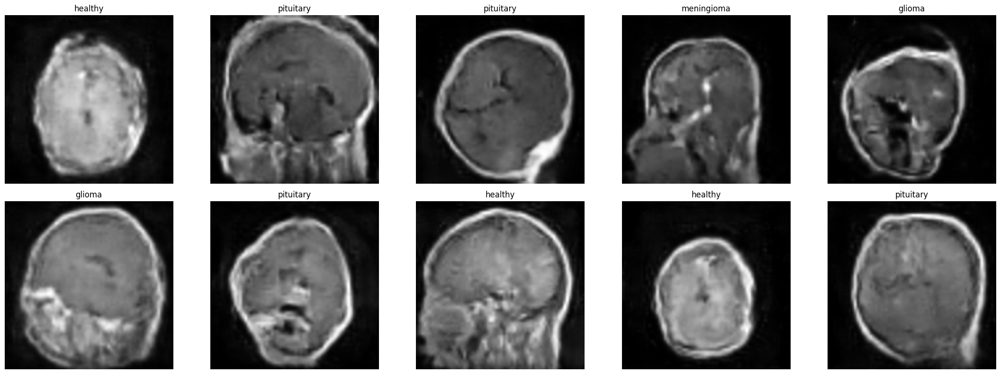

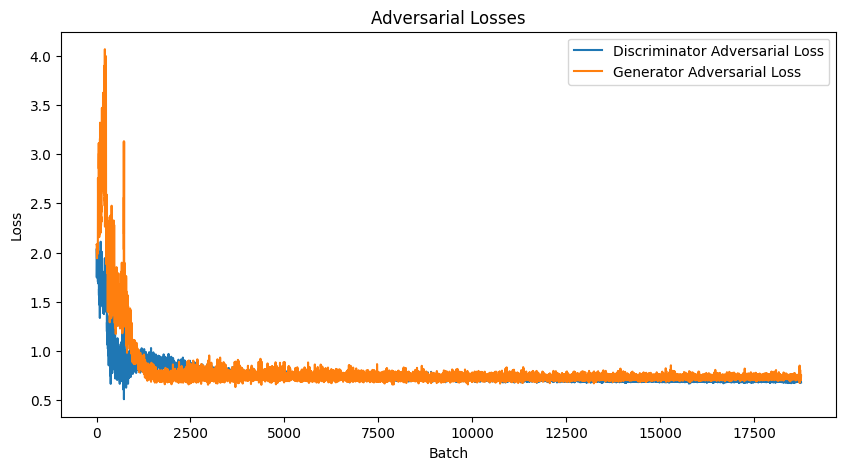

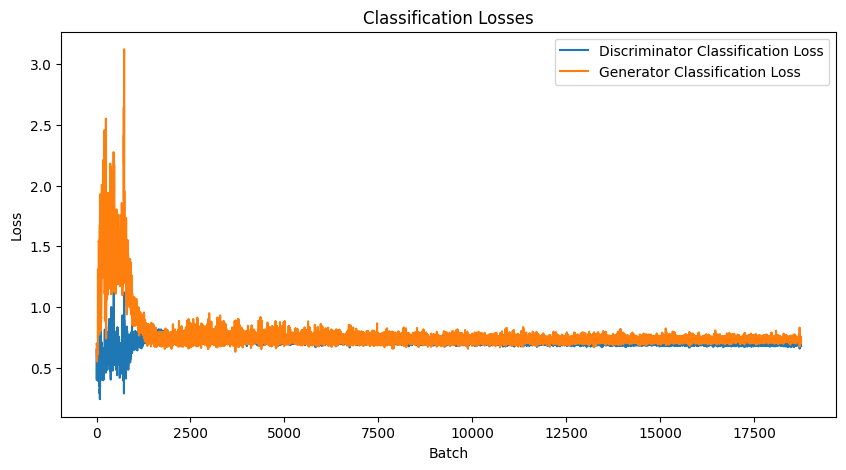

  0%|          | 0/3750 [00:00<?, ?it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 1/3750 [00:00<26:02,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 2/3750 [00:00<25:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 3/3750 [00:01<25:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 4/3750 [00:01<25:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 5/3750 [00:02<26:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 6/3750 [00:02<26:06,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 7/3750 [00:02<26:10,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 8/3750 [00:03<26:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:03<26:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:04<26:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 11/3750 [00:04<26:15,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 12/3750 [00:05<26:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 13/3750 [00:05<26:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 14/3750 [00:05<26:20,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 15/3750 [00:06<26:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:06<26:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  0%|          | 17/3750 [00:07<26:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:07<26:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:07<26:06,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 20/3750 [00:08<26:05,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 21/3750 [00:08<26:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 22/3750 [00:09<25:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 23/3750 [00:09<25:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 24/3750 [00:10<25:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 25/3750 [00:10<25:56,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 26/3750 [00:10<26:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:11<25:58,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 28/3750 [00:11<26:05,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 29/3750 [00:12<26:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 30/3750 [00:12<25:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 31/3750 [00:13<26:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 32/3750 [00:13<26:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 33/3750 [00:13<26:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 34/3750 [00:14<26:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 35/3750 [00:14<26:04,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 36/3750 [00:15<26:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 37/3750 [00:15<26:03,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 38/3750 [00:15<26:03,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 39/3750 [00:16<25:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 40/3750 [00:16<25:49,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  1%|          | 41/3750 [00:17<25:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 42/3750 [00:17<25:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 43/3750 [00:18<25:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 44/3750 [00:18<25:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 45/3750 [00:18<25:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|          | 46/3750 [00:19<25:44,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 47/3750 [00:19<25:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 48/3750 [00:20<25:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 49/3750 [00:20<25:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 50/3750 [00:20<25:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 51/3750 [00:21<25:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 52/3750 [00:21<25:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 53/3750 [00:22<25:51,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  1%|▏         | 54/3750 [00:22<25:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  1%|▏         | 55/3750 [00:23<25:40,  2.40it/s]

2/2 [==============================] - 0s 71ms/step


  1%|▏         | 56/3750 [00:23<26:28,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 57/3750 [00:23<26:09,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:24<25:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 59/3750 [00:24<25:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 60/3750 [00:25<25:38,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 61/3750 [00:25<25:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 62/3750 [00:25<25:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 63/3750 [00:26<25:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:26<25:50,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 65/3750 [00:27<25:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 66/3750 [00:27<25:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 67/3750 [00:28<25:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 68/3750 [00:28<25:49,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 69/3750 [00:28<25:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 70/3750 [00:29<25:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 71/3750 [00:29<25:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:30<25:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 73/3750 [00:30<25:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 74/3750 [00:30<25:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 75/3750 [00:31<25:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 76/3750 [00:31<25:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:32<25:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 78/3750 [00:32<25:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 79/3750 [00:33<25:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 80/3750 [00:33<25:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 81/3750 [00:33<25:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 82/3750 [00:34<25:35,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 83/3750 [00:34<25:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 84/3750 [00:35<25:37,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 85/3750 [00:35<25:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 86/3750 [00:36<25:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 87/3750 [00:36<25:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:36<25:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 89/3750 [00:37<25:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:37<25:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 91/3750 [00:38<25:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  2%|▏         | 92/3750 [00:38<25:32,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  2%|▏         | 93/3750 [00:38<25:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 94/3750 [00:39<25:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 95/3750 [00:39<25:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 96/3750 [00:40<25:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 97/3750 [00:40<25:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 98/3750 [00:41<25:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 99/3750 [00:41<25:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 100/3750 [00:41<25:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 101/3750 [00:42<25:17,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 102/3750 [00:42<25:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 103/3750 [00:43<25:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 104/3750 [00:43<25:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 105/3750 [00:43<25:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 106/3750 [00:44<25:11,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 107/3750 [00:44<25:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 108/3750 [00:45<25:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 109/3750 [00:45<25:25,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


  3%|▎         | 110/3750 [00:46<25:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 111/3750 [00:46<25:21,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 112/3750 [00:46<25:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 113/3750 [00:47<25:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 114/3750 [00:47<25:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 115/3750 [00:48<25:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 116/3750 [00:48<25:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 117/3750 [00:48<25:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 118/3750 [00:49<25:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:49<25:22,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 120/3750 [00:50<25:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 121/3750 [00:50<25:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 122/3750 [00:51<25:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 123/3750 [00:51<24:59,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 124/3750 [00:51<24:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 125/3750 [00:52<24:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 126/3750 [00:52<25:03,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  3%|▎         | 127/3750 [00:53<25:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 128/3750 [00:53<25:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 129/3750 [00:53<25:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 130/3750 [00:54<25:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  3%|▎         | 131/3750 [00:54<25:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 132/3750 [00:55<24:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 133/3750 [00:55<24:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 134/3750 [00:55<24:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 135/3750 [00:56<25:08,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


  4%|▎         | 136/3750 [00:56<25:03,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▎         | 137/3750 [00:57<25:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 138/3750 [00:57<25:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 139/3750 [00:58<24:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▎         | 140/3750 [00:58<25:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:58<25:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 142/3750 [00:59<25:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 143/3750 [00:59<25:06,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 144/3750 [01:00<25:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 145/3750 [01:00<25:21,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 146/3750 [01:01<25:28,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 147/3750 [01:01<25:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 148/3750 [01:01<25:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 149/3750 [01:02<25:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 150/3750 [01:02<24:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 151/3750 [01:03<24:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 152/3750 [01:03<24:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 153/3750 [01:03<24:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 154/3750 [01:04<24:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 155/3750 [01:04<24:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 156/3750 [01:05<25:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 157/3750 [01:05<24:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 158/3750 [01:06<24:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 159/3750 [01:06<24:50,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 160/3750 [01:06<24:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 161/3750 [01:07<24:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 162/3750 [01:07<24:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 163/3750 [01:08<24:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  4%|▍         | 164/3750 [01:08<24:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 165/3750 [01:08<24:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 166/3750 [01:09<24:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 167/3750 [01:09<24:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  4%|▍         | 168/3750 [01:10<24:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 169/3750 [01:10<24:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 170/3750 [01:10<24:43,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 171/3750 [01:11<24:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 172/3750 [01:11<24:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 173/3750 [01:12<24:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 174/3750 [01:12<24:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 175/3750 [01:13<24:49,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 176/3750 [01:13<24:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 177/3750 [01:13<24:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 178/3750 [01:14<24:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 179/3750 [01:14<24:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 180/3750 [01:15<24:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 181/3750 [01:15<24:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 182/3750 [01:16<24:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 183/3750 [01:16<24:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 184/3750 [01:16<24:39,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▍         | 185/3750 [01:17<24:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 186/3750 [01:17<24:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▍         | 187/3750 [01:18<24:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 188/3750 [01:18<24:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 189/3750 [01:18<24:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 190/3750 [01:19<24:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 191/3750 [01:19<24:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 192/3750 [01:20<24:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 193/3750 [01:20<24:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 194/3750 [01:20<24:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 195/3750 [01:21<24:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 196/3750 [01:21<24:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [01:22<24:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 198/3750 [01:22<24:22,  2.43it/s]

2/2 [==============================] - 0s 27ms/step


  5%|▌         | 199/3750 [01:23<24:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 200/3750 [01:23<24:52,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 201/3750 [01:23<25:01,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 202/3750 [01:24<24:51,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  5%|▌         | 203/3750 [01:24<25:18,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 204/3750 [01:25<25:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 205/3750 [01:25<25:11,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  5%|▌         | 206/3750 [01:26<24:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 207/3750 [01:26<24:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 208/3750 [01:26<24:54,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 209/3750 [01:27<24:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 210/3750 [01:27<24:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 211/3750 [01:28<24:29,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 212/3750 [01:28<24:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 213/3750 [01:28<24:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 214/3750 [01:29<24:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 215/3750 [01:29<24:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 216/3750 [01:30<24:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 217/3750 [01:30<24:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [01:30<24:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 219/3750 [01:31<24:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 220/3750 [01:31<24:12,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 221/3750 [01:32<24:14,  2.43it/s]

2/2 [==============================] - 0s 22ms/step


  6%|▌         | 222/3750 [01:32<24:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 223/3750 [01:33<24:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 224/3750 [01:33<24:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [01:33<24:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 226/3750 [01:34<24:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 227/3750 [01:34<24:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 228/3750 [01:35<24:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  6%|▌         | 229/3750 [01:35<24:20,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


  6%|▌         | 230/3750 [01:35<24:28,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


  6%|▌         | 231/3750 [01:36<24:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [01:36<24:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 233/3750 [01:37<24:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▌         | 234/3750 [01:37<24:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 235/3750 [01:38<24:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 236/3750 [01:38<24:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 237/3750 [01:38<24:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 238/3750 [01:39<24:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 239/3750 [01:39<24:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 240/3750 [01:40<24:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 241/3750 [01:40<24:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 242/3750 [01:40<24:00,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


  6%|▋         | 243/3750 [01:41<24:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 244/3750 [01:41<24:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 245/3750 [01:42<24:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 246/3750 [01:42<24:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 247/3750 [01:43<24:25,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 248/3750 [01:43<24:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 249/3750 [01:43<24:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 250/3750 [01:44<24:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 251/3750 [01:44<24:14,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 252/3750 [01:45<24:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 253/3750 [01:45<24:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 254/3750 [01:45<24:27,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 255/3750 [01:46<24:19,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 256/3750 [01:46<24:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 257/3750 [01:47<24:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 258/3750 [01:47<24:12,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 259/3750 [01:47<24:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 260/3750 [01:48<24:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 261/3750 [01:48<24:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 262/3750 [01:49<24:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 263/3750 [01:49<24:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 264/3750 [01:50<24:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 265/3750 [01:50<24:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 266/3750 [01:50<24:01,  2.42it/s]

2/2 [==============================] - 0s 27ms/step


  7%|▋         | 267/3750 [01:51<23:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 268/3750 [01:51<23:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 269/3750 [01:52<23:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 270/3750 [01:52<23:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 271/3750 [01:52<23:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [01:53<23:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 273/3750 [01:53<24:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 274/3750 [01:54<24:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 275/3750 [01:54<24:01,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  7%|▋         | 276/3750 [01:55<23:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 277/3750 [01:55<23:57,  2.42it/s]

2/2 [==============================] - 0s 26ms/step


  7%|▋         | 278/3750 [01:55<23:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 279/3750 [01:56<24:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 280/3750 [01:56<23:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  7%|▋         | 281/3750 [01:57<23:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 282/3750 [01:57<24:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 283/3750 [01:57<23:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 284/3750 [01:58<23:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 285/3750 [01:58<23:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 286/3750 [01:59<23:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 287/3750 [01:59<23:52,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 288/3750 [01:59<23:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 289/3750 [02:00<23:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 290/3750 [02:00<23:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 291/3750 [02:01<23:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 292/3750 [02:01<23:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 293/3750 [02:02<23:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 294/3750 [02:02<23:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 295/3750 [02:02<23:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 296/3750 [02:03<23:50,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 297/3750 [02:03<23:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 298/3750 [02:04<23:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 299/3750 [02:04<23:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [02:04<23:53,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


  8%|▊         | 301/3750 [02:05<23:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 302/3750 [02:05<24:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 303/3750 [02:06<24:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 304/3750 [02:06<23:57,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 305/3750 [02:07<23:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 306/3750 [02:07<23:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


  8%|▊         | 307/3750 [02:07<23:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 308/3750 [02:08<23:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 309/3750 [02:08<23:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [02:09<23:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 311/3750 [02:09<23:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 312/3750 [02:09<23:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 313/3750 [02:10<23:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 314/3750 [02:10<23:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 315/3750 [02:11<23:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 316/3750 [02:11<23:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 317/3750 [02:11<23:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  8%|▊         | 318/3750 [02:12<23:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 319/3750 [02:12<23:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 320/3750 [02:13<23:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 321/3750 [02:13<23:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 322/3750 [02:14<23:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 323/3750 [02:14<23:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 324/3750 [02:14<23:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 325/3750 [02:15<23:34,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▊         | 326/3750 [02:15<23:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 327/3750 [02:16<23:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▊         | 328/3750 [02:16<23:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 329/3750 [02:16<23:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 330/3750 [02:17<23:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 331/3750 [02:17<23:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 332/3750 [02:18<23:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 333/3750 [02:18<23:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 334/3750 [02:19<23:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 335/3750 [02:19<25:55,  2.19it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 336/3750 [02:20<25:14,  2.25it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 337/3750 [02:20<24:38,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 338/3750 [02:20<24:19,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 339/3750 [02:21<23:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 340/3750 [02:21<23:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 341/3750 [02:22<23:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 342/3750 [02:22<23:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 343/3750 [02:22<23:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 344/3750 [02:23<23:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 345/3750 [02:23<23:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 346/3750 [02:24<23:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 347/3750 [02:24<23:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


  9%|▉         | 348/3750 [02:24<23:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 349/3750 [02:25<23:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 350/3750 [02:25<23:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 351/3750 [02:26<23:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 352/3750 [02:26<23:36,  2.40it/s]

2/2 [==============================] - 0s 26ms/step


  9%|▉         | 353/3750 [02:27<23:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 354/3750 [02:27<23:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 355/3750 [02:27<23:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


  9%|▉         | 356/3750 [02:28<23:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 357/3750 [02:28<23:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 358/3750 [02:29<23:19,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 359/3750 [02:29<23:17,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 360/3750 [02:29<23:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 361/3750 [02:30<23:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 362/3750 [02:30<23:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 363/3750 [02:31<23:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 364/3750 [02:31<23:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 365/3750 [02:32<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 366/3750 [02:32<23:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 367/3750 [02:32<23:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 368/3750 [02:33<23:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [02:33<23:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 370/3750 [02:34<23:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|▉         | 371/3750 [02:34<23:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 372/3750 [02:34<23:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 373/3750 [02:35<23:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|▉         | 374/3750 [02:35<23:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 375/3750 [02:36<23:16,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 376/3750 [02:36<23:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 377/3750 [02:36<23:07,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 378/3750 [02:37<23:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 379/3750 [02:37<23:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 380/3750 [02:38<23:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 381/3750 [02:38<23:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 382/3750 [02:39<23:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 383/3750 [02:39<23:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 384/3750 [02:39<23:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 385/3750 [02:40<23:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 386/3750 [02:40<23:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 387/3750 [02:41<23:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 388/3750 [02:41<23:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 10%|█         | 389/3750 [02:41<23:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 390/3750 [02:42<23:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [02:42<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [02:43<23:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 10%|█         | 393/3750 [02:43<23:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 394/3750 [02:44<23:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 395/3750 [02:44<23:18,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 396/3750 [02:44<23:09,  2.41it/s]

2/2 [==============================] - 0s 24ms/step


 11%|█         | 397/3750 [02:45<23:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 398/3750 [02:45<23:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 399/3750 [02:46<23:12,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 400/3750 [02:46<23:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 401/3750 [02:46<23:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 402/3750 [02:47<23:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 403/3750 [02:47<22:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 404/3750 [02:48<22:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 405/3750 [02:48<22:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 406/3750 [02:48<22:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 407/3750 [02:49<23:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 408/3750 [02:49<23:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 409/3750 [02:50<23:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 410/3750 [02:50<23:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 411/3750 [02:51<23:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 412/3750 [02:51<23:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 413/3750 [02:51<22:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 414/3750 [02:52<22:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 415/3750 [02:52<22:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 416/3750 [02:53<22:53,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 11%|█         | 417/3750 [02:53<23:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 418/3750 [02:53<23:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 419/3750 [02:54<23:03,  2.41it/s]

2/2 [==============================] - 0s 25ms/step


 11%|█         | 420/3750 [02:54<22:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█         | 421/3750 [02:55<22:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 422/3750 [02:55<22:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 423/3750 [02:55<22:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 424/3750 [02:56<22:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 425/3750 [02:56<22:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 426/3750 [02:57<22:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 427/3750 [02:57<23:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 428/3750 [02:58<23:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 429/3750 [02:58<23:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 430/3750 [02:58<22:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 11%|█▏        | 431/3750 [02:59<22:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 432/3750 [02:59<22:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 433/3750 [03:00<22:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 434/3750 [03:00<23:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 435/3750 [03:00<23:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 436/3750 [03:01<23:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 437/3750 [03:01<23:02,  2.40it/s]

2/2 [==============================] - 0s 22ms/step


 12%|█▏        | 438/3750 [03:02<22:55,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 439/3750 [03:02<22:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 440/3750 [03:03<23:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 441/3750 [03:03<23:01,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 442/3750 [03:03<22:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 443/3750 [03:04<22:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 444/3750 [03:04<23:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 445/3750 [03:05<22:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 446/3750 [03:05<22:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 447/3750 [03:05<22:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 448/3750 [03:06<22:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 449/3750 [03:06<22:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 450/3750 [03:07<22:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 451/3750 [03:07<22:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 452/3750 [03:08<22:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 453/3750 [03:08<22:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 454/3750 [03:09<29:16,  1.88it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 455/3750 [03:09<27:35,  1.99it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 456/3750 [03:10<26:10,  2.10it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 457/3750 [03:10<25:12,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 458/3750 [03:10<24:32,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 459/3750 [03:11<23:58,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 460/3750 [03:11<23:38,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 461/3750 [03:12<23:30,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 462/3750 [03:12<23:17,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 463/3750 [03:13<23:21,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 464/3750 [03:13<23:16,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 12%|█▏        | 465/3750 [03:13<23:10,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 466/3750 [03:14<23:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 467/3750 [03:14<22:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 12%|█▏        | 468/3750 [03:15<22:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 469/3750 [03:15<22:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [03:15<22:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 471/3750 [03:16<23:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 472/3750 [03:16<23:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 473/3750 [03:17<23:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 474/3750 [03:17<23:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 475/3750 [03:18<22:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 476/3750 [03:18<22:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 477/3750 [03:18<23:04,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 478/3750 [03:19<22:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 479/3750 [03:19<23:07,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 480/3750 [03:20<23:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 481/3750 [03:20<22:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 482/3750 [03:21<22:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 483/3750 [03:21<22:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 484/3750 [03:21<22:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 485/3750 [03:22<22:51,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 486/3750 [03:22<22:52,  2.38it/s]

2/2 [==============================] - 0s 27ms/step


 13%|█▎        | 487/3750 [03:23<23:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 488/3750 [03:23<23:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [03:23<22:59,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 490/3750 [03:24<22:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 491/3750 [03:24<22:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 492/3750 [03:25<22:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 493/3750 [03:25<22:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 494/3750 [03:26<22:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 495/3750 [03:26<22:39,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 13%|█▎        | 496/3750 [03:26<22:50,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 497/3750 [03:27<22:50,  2.37it/s]

2/2 [==============================] - 0s 59ms/step


 13%|█▎        | 498/3750 [03:27<23:25,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 499/3750 [03:28<23:19,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 500/3750 [03:28<23:07,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 501/3750 [03:29<22:59,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 502/3750 [03:29<22:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 503/3750 [03:29<22:53,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 504/3750 [03:30<22:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 13%|█▎        | 505/3750 [03:30<22:57,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 13%|█▎        | 506/3750 [03:31<22:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 507/3750 [03:31<22:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 508/3750 [03:32<22:59,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 509/3750 [03:32<22:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 510/3750 [03:32<22:57,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 511/3750 [03:33<22:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 512/3750 [03:33<22:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 513/3750 [03:34<22:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 514/3750 [03:34<22:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▎        | 515/3750 [03:34<22:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 516/3750 [03:35<22:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 517/3750 [03:35<22:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 518/3750 [03:36<22:43,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 519/3750 [03:36<22:37,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 520/3750 [03:37<22:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 521/3750 [03:37<22:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 522/3750 [03:37<22:28,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 523/3750 [03:38<22:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 524/3750 [03:38<22:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 525/3750 [03:39<22:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 526/3750 [03:39<22:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 527/3750 [03:40<22:30,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 528/3750 [03:40<22:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 529/3750 [03:40<22:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 530/3750 [03:41<22:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 531/3750 [03:41<22:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 532/3750 [03:42<22:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 533/3750 [03:42<22:34,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 534/3750 [03:42<22:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 535/3750 [03:43<22:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 536/3750 [03:43<22:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 537/3750 [03:44<22:40,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 538/3750 [03:44<22:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 539/3750 [03:45<22:36,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 540/3750 [03:45<22:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 541/3750 [03:45<22:43,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 14%|█▍        | 542/3750 [03:46<22:42,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 14%|█▍        | 543/3750 [03:46<22:39,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 544/3750 [03:47<22:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 545/3750 [03:47<22:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 546/3750 [03:48<22:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 547/3750 [03:48<22:36,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 548/3750 [03:48<22:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 549/3750 [03:49<22:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 550/3750 [03:49<22:40,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 551/3750 [03:50<22:40,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 552/3750 [03:50<22:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 553/3750 [03:51<22:27,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 554/3750 [03:51<22:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 555/3750 [03:51<22:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 556/3750 [03:52<22:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 557/3750 [03:52<22:13,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 15%|█▍        | 558/3750 [03:53<22:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 559/3750 [03:53<22:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 560/3750 [03:53<22:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 561/3750 [03:54<22:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▍        | 562/3750 [03:54<22:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 563/3750 [03:55<22:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [03:55<22:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 565/3750 [03:56<22:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 566/3750 [03:56<22:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 567/3750 [03:56<22:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [03:57<22:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 569/3750 [03:57<22:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 570/3750 [03:58<22:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 571/3750 [03:58<22:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 572/3750 [03:58<22:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 573/3750 [03:59<22:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 574/3750 [03:59<22:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 575/3750 [04:00<22:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 576/3750 [04:00<22:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 577/3750 [04:01<22:14,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 15%|█▌        | 578/3750 [04:01<22:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 579/3750 [04:01<22:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 580/3750 [04:02<22:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 15%|█▌        | 581/3750 [04:02<22:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 582/3750 [04:03<22:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 583/3750 [04:03<22:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 584/3750 [04:04<22:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 585/3750 [04:04<22:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 586/3750 [04:04<22:15,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 587/3750 [04:05<22:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 588/3750 [04:05<22:25,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 589/3750 [04:06<22:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 590/3750 [04:06<22:25,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 591/3750 [04:07<22:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 592/3750 [04:07<22:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 593/3750 [04:07<22:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 594/3750 [04:08<22:04,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 595/3750 [04:08<22:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 596/3750 [04:09<22:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [04:09<22:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 598/3750 [04:09<22:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 599/3750 [04:10<22:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 600/3750 [04:10<22:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 601/3750 [04:11<22:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 602/3750 [04:11<21:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 603/3750 [04:12<21:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 604/3750 [04:12<22:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 605/3750 [04:12<22:07,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 606/3750 [04:13<22:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▌        | 607/3750 [04:13<21:58,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 608/3750 [04:14<21:57,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▌        | 609/3750 [04:14<21:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 610/3750 [04:14<21:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 611/3750 [04:15<21:46,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 16%|█▋        | 612/3750 [04:15<21:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 613/3750 [04:16<22:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [04:16<21:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 615/3750 [04:17<22:10,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 16%|█▋        | 616/3750 [04:17<22:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 617/3750 [04:17<21:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 16%|█▋        | 618/3750 [04:18<21:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 619/3750 [04:18<22:00,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 620/3750 [04:19<22:11,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 621/3750 [04:19<22:06,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 622/3750 [04:20<22:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 623/3750 [04:20<22:04,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [04:20<21:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 625/3750 [04:21<21:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 626/3750 [04:21<21:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 627/3750 [04:22<21:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 628/3750 [04:22<21:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 629/3750 [04:22<21:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 630/3750 [04:23<21:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [04:23<22:01,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 632/3750 [04:24<21:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 633/3750 [04:24<21:58,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 634/3750 [04:25<21:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 635/3750 [04:25<21:54,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 636/3750 [04:25<22:00,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 637/3750 [04:26<21:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 638/3750 [04:26<21:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 639/3750 [04:27<21:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 640/3750 [04:27<21:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 641/3750 [04:28<21:45,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 642/3750 [04:28<21:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 643/3750 [04:28<22:14,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 644/3750 [04:29<22:13,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 645/3750 [04:29<22:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 646/3750 [04:30<22:10,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 647/3750 [04:30<22:06,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 648/3750 [04:31<22:15,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 649/3750 [04:31<22:08,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 650/3750 [04:31<22:00,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 651/3750 [04:32<21:50,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 17%|█▋        | 652/3750 [04:32<21:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 653/3750 [04:33<21:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 654/3750 [04:33<21:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 655/3750 [04:33<21:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 17%|█▋        | 656/3750 [04:34<21:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 657/3750 [04:34<21:39,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 658/3750 [04:35<21:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 659/3750 [04:35<21:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 660/3750 [04:36<21:46,  2.37it/s]

2/2 [==============================] - 0s 25ms/step


 18%|█▊        | 661/3750 [04:36<21:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 662/3750 [04:36<21:36,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 663/3750 [04:37<21:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 664/3750 [04:37<21:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 665/3750 [04:38<21:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 666/3750 [04:38<21:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 667/3750 [04:39<21:47,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 668/3750 [04:39<21:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 669/3750 [04:39<21:50,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 670/3750 [04:40<21:50,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 671/3750 [04:40<21:52,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 672/3750 [04:41<21:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 673/3750 [04:41<21:43,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 674/3750 [04:42<21:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [04:42<21:38,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 676/3750 [04:42<21:52,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 677/3750 [04:43<21:42,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 678/3750 [04:43<21:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 679/3750 [04:44<21:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 680/3750 [04:44<21:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 681/3750 [04:44<21:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 682/3750 [04:45<21:36,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 683/3750 [04:45<21:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 684/3750 [04:46<21:46,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 685/3750 [04:46<21:51,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 686/3750 [04:47<21:48,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 687/3750 [04:47<21:43,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 688/3750 [04:47<21:47,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 689/3750 [04:48<21:41,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 690/3750 [04:48<21:40,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 691/3750 [04:49<21:43,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 18%|█▊        | 692/3750 [04:49<21:44,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 18%|█▊        | 693/3750 [04:50<21:43,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 694/3750 [04:50<21:44,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [04:50<21:45,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 696/3750 [04:51<21:37,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 697/3750 [04:51<21:39,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 698/3750 [04:52<21:36,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 699/3750 [04:52<21:46,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 700/3750 [04:53<21:45,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 701/3750 [04:53<21:47,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▊        | 702/3750 [04:53<21:41,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▊        | 703/3750 [04:54<21:39,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 704/3750 [04:54<21:41,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 705/3750 [04:55<21:33,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 706/3750 [04:55<21:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 707/3750 [04:56<21:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 708/3750 [04:56<21:26,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 709/3750 [04:56<21:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 710/3750 [04:57<21:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 711/3750 [04:57<21:29,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 712/3750 [04:58<21:37,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 713/3750 [04:58<21:33,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [04:59<21:24,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 715/3750 [04:59<21:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 716/3750 [04:59<21:30,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 717/3750 [05:00<21:28,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 718/3750 [05:00<21:27,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 719/3750 [05:01<21:23,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 720/3750 [05:01<21:25,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 721/3750 [05:02<21:33,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 722/3750 [05:02<21:29,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 723/3750 [05:02<21:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 724/3750 [05:03<21:20,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 725/3750 [05:03<21:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 726/3750 [05:04<21:15,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 727/3750 [05:04<21:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 728/3750 [05:04<21:07,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 729/3750 [05:05<21:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 19%|█▉        | 730/3750 [05:05<21:23,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 19%|█▉        | 731/3750 [05:06<21:14,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 732/3750 [05:06<21:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 733/3750 [05:07<21:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [05:07<21:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 735/3750 [05:07<21:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 736/3750 [05:08<21:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [05:08<21:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 738/3750 [05:09<21:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 739/3750 [05:09<21:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 740/3750 [05:10<21:13,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [05:10<21:19,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 742/3750 [05:10<21:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 743/3750 [05:11<21:19,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 744/3750 [05:11<21:17,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 745/3750 [05:12<21:24,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 20%|█▉        | 746/3750 [05:12<21:23,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 747/3750 [05:13<21:26,  2.33it/s]

2/2 [==============================] - 0s 21ms/step


 20%|█▉        | 748/3750 [05:13<21:27,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 20%|█▉        | 749/3750 [05:13<21:18,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 750/3750 [05:14<21:10,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 751/3750 [05:14<21:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 752/3750 [05:15<21:13,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 753/3750 [05:15<21:06,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 754/3750 [05:15<21:09,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [05:16<21:12,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 756/3750 [05:16<21:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 757/3750 [05:17<21:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 758/3750 [05:17<21:27,  2.32it/s]

2/2 [==============================] - 0s 24ms/step


 20%|██        | 759/3750 [05:18<21:21,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 760/3750 [05:18<21:27,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 761/3750 [05:18<21:29,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 762/3750 [05:19<21:28,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 763/3750 [05:19<21:28,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 764/3750 [05:20<21:18,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 765/3750 [05:20<21:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 20%|██        | 766/3750 [05:21<21:18,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 767/3750 [05:21<21:10,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 20%|██        | 768/3750 [05:21<21:04,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 769/3750 [05:22<20:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 770/3750 [05:22<21:03,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 771/3750 [05:23<21:04,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 772/3750 [05:23<20:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 773/3750 [05:24<21:01,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 774/3750 [05:24<21:02,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 775/3750 [05:24<21:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 776/3750 [05:25<21:10,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 777/3750 [05:25<21:11,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 778/3750 [05:26<20:59,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 779/3750 [05:26<20:56,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 780/3750 [05:27<20:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 781/3750 [05:27<20:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 782/3750 [05:27<20:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 783/3750 [05:28<20:45,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 784/3750 [05:28<20:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 785/3750 [05:29<20:58,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 786/3750 [05:29<20:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 787/3750 [05:30<21:04,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 788/3750 [05:30<20:59,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 789/3750 [05:30<21:01,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 790/3750 [05:31<20:51,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 791/3750 [05:31<20:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 792/3750 [05:32<20:44,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 793/3750 [05:32<20:55,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 794/3750 [05:32<20:51,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 21%|██        | 795/3750 [05:33<20:56,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██        | 796/3750 [05:33<20:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 797/3750 [05:34<20:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 798/3750 [05:34<20:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 799/3750 [05:35<20:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 800/3750 [05:35<20:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 801/3750 [05:35<20:41,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 21%|██▏       | 802/3750 [05:36<20:55,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 803/3750 [05:36<20:52,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [05:37<20:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 805/3750 [05:37<20:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 21%|██▏       | 806/3750 [05:38<20:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 807/3750 [05:38<20:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 808/3750 [05:38<20:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 809/3750 [05:39<20:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 810/3750 [05:39<20:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 811/3750 [05:40<20:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 812/3750 [05:40<20:45,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 813/3750 [05:40<20:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 814/3750 [05:41<20:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [05:41<20:39,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 816/3750 [05:42<20:36,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 817/3750 [05:42<20:39,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 818/3750 [05:43<20:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 819/3750 [05:43<20:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 820/3750 [05:43<20:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 821/3750 [05:44<20:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 822/3750 [05:44<20:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 823/3750 [05:45<20:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 824/3750 [05:45<20:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 825/3750 [05:46<20:34,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 826/3750 [05:46<20:35,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 827/3750 [05:46<20:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 828/3750 [05:47<20:33,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 829/3750 [05:47<20:28,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 830/3750 [05:48<20:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 831/3750 [05:48<20:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 832/3750 [05:48<20:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 833/3750 [05:49<20:21,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 834/3750 [05:49<20:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 835/3750 [05:50<20:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 836/3750 [05:50<20:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 837/3750 [05:51<20:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 838/3750 [05:51<20:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 839/3750 [05:51<20:23,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 840/3750 [05:52<20:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 841/3750 [05:52<20:29,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 22%|██▏       | 842/3750 [05:53<20:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 22%|██▏       | 843/3750 [05:53<20:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 844/3750 [05:54<20:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 845/3750 [05:54<20:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 846/3750 [05:54<20:14,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 847/3750 [05:55<20:08,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 848/3750 [05:55<20:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 849/3750 [05:56<20:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 850/3750 [05:56<20:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 851/3750 [05:56<20:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 852/3750 [05:57<20:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 853/3750 [05:57<20:18,  2.38it/s]

2/2 [==============================] - 0s 27ms/step


 23%|██▎       | 854/3750 [05:58<20:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [05:58<20:14,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 856/3750 [05:59<20:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 857/3750 [05:59<20:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 858/3750 [05:59<20:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [06:00<20:22,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 860/3750 [06:00<20:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 861/3750 [06:01<20:27,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 862/3750 [06:01<20:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 863/3750 [06:02<20:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 864/3750 [06:02<20:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 865/3750 [06:02<20:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 866/3750 [06:03<20:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 867/3750 [06:03<20:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 868/3750 [06:04<20:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 869/3750 [06:04<20:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 870/3750 [06:04<20:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 871/3750 [06:05<20:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 872/3750 [06:05<20:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 873/3750 [06:06<20:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 874/3750 [06:06<20:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 23%|██▎       | 875/3750 [06:07<19:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 876/3750 [06:07<20:00,  2.39it/s]

2/2 [==============================] - 0s 25ms/step


 23%|██▎       | 877/3750 [06:07<19:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 878/3750 [06:08<19:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 879/3750 [06:08<20:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 880/3750 [06:09<20:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 23%|██▎       | 881/3750 [06:09<19:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 882/3750 [06:09<20:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 883/3750 [06:10<19:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 884/3750 [06:10<20:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 885/3750 [06:11<20:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 886/3750 [06:11<20:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 887/3750 [06:12<19:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 888/3750 [06:12<19:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 889/3750 [06:12<19:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▎       | 890/3750 [06:13<19:56,  2.39it/s]

2/2 [==============================] - 0s 25ms/step


 24%|██▍       | 891/3750 [06:13<19:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 892/3750 [06:14<19:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 893/3750 [06:14<19:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 894/3750 [06:15<19:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 895/3750 [06:15<19:58,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 896/3750 [06:15<19:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 897/3750 [06:16<19:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 898/3750 [06:16<19:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 899/3750 [06:17<19:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 900/3750 [06:17<19:46,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 901/3750 [06:17<19:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 902/3750 [06:18<19:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 903/3750 [06:18<19:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 904/3750 [06:19<19:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 905/3750 [06:19<19:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 906/3750 [06:19<19:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 907/3750 [06:20<19:38,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 24%|██▍       | 908/3750 [06:20<19:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 909/3750 [06:21<19:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 910/3750 [06:21<19:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 911/3750 [06:22<19:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 912/3750 [06:22<19:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 913/3750 [06:22<19:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 914/3750 [06:23<19:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 915/3750 [06:23<19:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 916/3750 [06:24<19:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [06:24<19:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 24%|██▍       | 918/3750 [06:24<19:39,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 919/3750 [06:25<19:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 920/3750 [06:25<19:44,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 921/3750 [06:26<19:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 922/3750 [06:26<19:46,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 923/3750 [06:27<19:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 924/3750 [06:27<19:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 925/3750 [06:27<19:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 926/3750 [06:28<19:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 927/3750 [06:28<19:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [06:29<19:44,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▍       | 929/3750 [06:29<19:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [06:30<19:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 931/3750 [06:30<19:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 932/3750 [06:30<19:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 933/3750 [06:31<19:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 934/3750 [06:31<19:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 935/3750 [06:32<20:09,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 936/3750 [06:32<19:59,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▍       | 937/3750 [06:32<19:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 938/3750 [06:33<19:56,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 939/3750 [06:33<19:57,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 940/3750 [06:34<19:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 941/3750 [06:34<19:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 942/3750 [06:35<19:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 943/3750 [06:35<19:37,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 944/3750 [06:35<19:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 945/3750 [06:36<19:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 946/3750 [06:36<19:33,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 947/3750 [06:37<19:37,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 948/3750 [06:37<19:48,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 949/3750 [06:38<19:44,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 25%|██▌       | 950/3750 [06:38<19:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 951/3750 [06:38<19:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 952/3750 [06:39<19:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 953/3750 [06:39<19:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 954/3750 [06:40<19:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 955/3750 [06:40<19:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 25%|██▌       | 956/3750 [06:40<19:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 957/3750 [06:41<19:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 958/3750 [06:41<19:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 959/3750 [06:42<19:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 960/3750 [06:42<19:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 961/3750 [06:43<19:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 962/3750 [06:43<19:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 963/3750 [06:43<19:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 964/3750 [06:44<19:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 965/3750 [06:44<19:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 966/3750 [06:45<19:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 967/3750 [06:45<19:28,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 968/3750 [06:45<19:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 969/3750 [06:46<19:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 970/3750 [06:46<19:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 971/3750 [06:47<19:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 972/3750 [06:47<19:21,  2.39it/s]

2/2 [==============================] - 0s 24ms/step


 26%|██▌       | 973/3750 [06:48<19:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 974/3750 [06:48<19:20,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 975/3750 [06:48<19:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 976/3750 [06:49<19:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 977/3750 [06:49<19:23,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 978/3750 [06:50<19:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 979/3750 [06:50<19:27,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▌       | 980/3750 [06:51<19:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 981/3750 [06:51<19:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 982/3750 [06:51<19:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▌       | 983/3750 [06:52<19:09,  2.41it/s]

2/2 [==============================] - 0s 10ms/step


 26%|██▌       | 984/3750 [06:52<19:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 985/3750 [06:53<19:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 986/3750 [06:53<19:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 987/3750 [06:53<19:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 988/3750 [06:54<19:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 989/3750 [06:54<19:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 990/3750 [06:55<19:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 991/3750 [06:55<19:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 26%|██▋       | 992/3750 [06:55<19:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 26%|██▋       | 993/3750 [06:56<19:21,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 994/3750 [06:56<19:14,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 995/3750 [06:57<19:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 996/3750 [06:57<19:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 997/3750 [06:58<19:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 998/3750 [06:58<19:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 999/3750 [06:58<18:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1000/3750 [06:59<18:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1001/3750 [06:59<18:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1002/3750 [07:00<18:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1003/3750 [07:00<19:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1004/3750 [07:00<19:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1005/3750 [07:01<19:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1006/3750 [07:01<19:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1007/3750 [07:02<19:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1008/3750 [07:02<19:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1009/3750 [07:03<19:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1010/3750 [07:03<19:01,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1011/3750 [07:03<18:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1012/3750 [07:04<19:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 27%|██▋       | 1013/3750 [07:04<19:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1014/3750 [07:05<18:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [07:05<18:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [07:05<18:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1017/3750 [07:06<18:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1018/3750 [07:06<18:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1019/3750 [07:07<18:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1020/3750 [07:07<18:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1021/3750 [07:08<19:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1022/3750 [07:08<19:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1023/3750 [07:08<19:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1024/3750 [07:09<19:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1025/3750 [07:09<18:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1026/3750 [07:10<19:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1027/3750 [07:10<19:00,  2.39it/s]

2/2 [==============================] - 0s 21ms/step


 27%|██▋       | 1028/3750 [07:10<18:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1029/3750 [07:11<18:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [07:11<18:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 27%|██▋       | 1031/3750 [07:12<18:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1032/3750 [07:12<18:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1033/3750 [07:13<18:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1034/3750 [07:13<18:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1035/3750 [07:13<19:05,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1036/3750 [07:14<19:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1037/3750 [07:14<18:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1038/3750 [07:15<18:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1039/3750 [07:15<18:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1040/3750 [07:16<18:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1041/3750 [07:16<18:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1042/3750 [07:16<18:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1043/3750 [07:17<18:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1044/3750 [07:17<18:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1045/3750 [07:18<18:39,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1046/3750 [07:18<18:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1047/3750 [07:18<18:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1048/3750 [07:19<18:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1049/3750 [07:19<19:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1050/3750 [07:20<19:00,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1051/3750 [07:20<18:51,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1052/3750 [07:21<18:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1053/3750 [07:21<18:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1054/3750 [07:21<18:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1055/3750 [07:22<18:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1056/3750 [07:22<18:39,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1057/3750 [07:23<18:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1058/3750 [07:23<18:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1059/3750 [07:23<18:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1060/3750 [07:24<18:36,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1061/3750 [07:24<18:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1062/3750 [07:25<18:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1063/3750 [07:25<18:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1064/3750 [07:26<18:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1065/3750 [07:26<18:35,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 28%|██▊       | 1066/3750 [07:26<18:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1067/3750 [07:27<18:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [07:27<18:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [07:28<18:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1070/3750 [07:28<18:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1071/3750 [07:28<18:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1072/3750 [07:29<18:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1073/3750 [07:29<18:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1074/3750 [07:30<18:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1075/3750 [07:30<18:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1076/3750 [07:30<18:32,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▊       | 1077/3750 [07:31<18:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▊       | 1078/3750 [07:31<18:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1079/3750 [07:32<18:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1080/3750 [07:32<18:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1081/3750 [07:33<18:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1082/3750 [07:33<18:56,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1083/3750 [07:33<18:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1084/3750 [07:34<18:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1085/3750 [07:34<18:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1086/3750 [07:35<18:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1087/3750 [07:35<18:26,  2.41it/s]

2/2 [==============================] - 0s 23ms/step


 29%|██▉       | 1088/3750 [07:35<18:29,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1089/3750 [07:36<18:30,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1090/3750 [07:36<18:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1091/3750 [07:37<18:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1092/3750 [07:37<18:19,  2.42it/s]

2/2 [==============================] - 0s 27ms/step


 29%|██▉       | 1093/3750 [07:38<18:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1094/3750 [07:38<18:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1095/3750 [07:38<18:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1096/3750 [07:39<18:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [07:39<18:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1098/3750 [07:40<18:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1099/3750 [07:40<18:08,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 29%|██▉       | 1100/3750 [07:40<18:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1101/3750 [07:41<18:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1102/3750 [07:41<18:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1103/3750 [07:42<18:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1104/3750 [07:42<18:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1105/3750 [07:43<18:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 29%|██▉       | 1106/3750 [07:43<18:17,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1107/3750 [07:43<18:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1108/3750 [07:44<18:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1109/3750 [07:44<18:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1110/3750 [07:45<18:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1111/3750 [07:45<18:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1112/3750 [07:45<18:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1113/3750 [07:46<18:10,  2.42it/s]

2/2 [==============================] - 0s 24ms/step


 30%|██▉       | 1114/3750 [07:46<18:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1115/3750 [07:47<18:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1116/3750 [07:47<18:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1117/3750 [07:48<18:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|██▉       | 1118/3750 [07:48<18:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1119/3750 [07:48<18:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1120/3750 [07:49<20:06,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1121/3750 [07:49<19:35,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1122/3750 [07:50<19:10,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1123/3750 [07:50<18:46,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 30%|██▉       | 1124/3750 [07:51<18:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1125/3750 [07:51<18:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1126/3750 [07:51<18:16,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1127/3750 [07:52<18:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1128/3750 [07:52<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1129/3750 [07:53<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1130/3750 [07:53<18:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1131/3750 [07:53<18:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1132/3750 [07:54<18:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1133/3750 [07:54<18:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1134/3750 [07:55<18:04,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 30%|███       | 1135/3750 [07:55<18:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1136/3750 [07:56<17:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1137/3750 [07:56<18:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1138/3750 [07:56<18:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1139/3750 [07:57<18:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1140/3750 [07:57<18:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1141/3750 [07:58<18:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1142/3750 [07:58<17:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [07:58<17:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1144/3750 [07:59<17:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1145/3750 [07:59<17:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1146/3750 [08:00<17:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1147/3750 [08:00<17:54,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1148/3750 [08:00<17:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [08:01<17:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1150/3750 [08:01<17:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1151/3750 [08:02<17:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1152/3750 [08:02<17:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [08:03<17:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1154/3750 [08:03<17:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [08:03<17:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1156/3750 [08:04<17:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1157/3750 [08:04<17:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1158/3750 [08:05<17:52,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1159/3750 [08:05<17:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1160/3750 [08:05<17:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1161/3750 [08:06<17:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1162/3750 [08:06<17:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1163/3750 [08:07<17:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1164/3750 [08:07<17:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1165/3750 [08:07<17:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1166/3750 [08:08<17:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1167/3750 [08:08<17:56,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1168/3750 [08:09<17:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1169/3750 [08:09<17:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███       | 1170/3750 [08:10<17:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███       | 1171/3750 [08:10<17:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [08:10<17:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1173/3750 [08:11<17:40,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1174/3750 [08:11<17:39,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 31%|███▏      | 1175/3750 [08:12<18:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1176/3750 [08:12<17:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1177/3750 [08:12<17:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1178/3750 [08:13<17:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1179/3750 [08:13<17:43,  2.42it/s]

2/2 [==============================] - 0s 28ms/step


 31%|███▏      | 1180/3750 [08:14<17:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 31%|███▏      | 1181/3750 [08:14<17:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1182/3750 [08:15<17:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1183/3750 [08:15<17:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1184/3750 [08:15<17:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [08:16<17:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1186/3750 [08:16<17:42,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


 32%|███▏      | 1187/3750 [08:17<17:38,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1188/3750 [08:17<17:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1189/3750 [08:17<17:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1190/3750 [08:18<17:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1191/3750 [08:18<17:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1192/3750 [08:19<17:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1193/3750 [08:19<17:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1194/3750 [08:20<17:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1195/3750 [08:20<17:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1196/3750 [08:20<17:28,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1197/3750 [08:21<17:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1198/3750 [08:21<17:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 32%|███▏      | 1199/3750 [08:22<17:27,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1200/3750 [08:22<17:38,  2.41it/s]

2/2 [==============================] - 0s 24ms/step


 32%|███▏      | 1201/3750 [08:22<17:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1202/3750 [08:23<17:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1203/3750 [08:23<17:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1204/3750 [08:24<17:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1205/3750 [08:24<17:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1206/3750 [08:25<17:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1207/3750 [08:25<17:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1208/3750 [08:25<17:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1209/3750 [08:26<17:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1210/3750 [08:26<17:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1211/3750 [08:27<17:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1212/3750 [08:27<17:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1213/3750 [08:27<17:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1214/3750 [08:28<17:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1215/3750 [08:28<17:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1216/3750 [08:29<17:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1217/3750 [08:29<17:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 32%|███▏      | 1218/3750 [08:29<17:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1219/3750 [08:30<17:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1220/3750 [08:30<17:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1221/3750 [08:31<17:29,  2.41it/s]

2/2 [==============================] - 0s 26ms/step


 33%|███▎      | 1222/3750 [08:31<17:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1223/3750 [08:32<17:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1224/3750 [08:32<17:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1225/3750 [08:32<17:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1226/3750 [08:33<17:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1227/3750 [08:33<17:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1228/3750 [08:34<17:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1229/3750 [08:34<17:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1230/3750 [08:34<18:08,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1231/3750 [08:35<17:50,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1232/3750 [08:35<17:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1233/3750 [08:36<17:45,  2.36it/s]

2/2 [==============================] - 0s 24ms/step


 33%|███▎      | 1234/3750 [08:36<17:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1235/3750 [08:37<17:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1236/3750 [08:37<17:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1237/3750 [08:37<17:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1238/3750 [08:38<17:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1239/3750 [08:38<17:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1240/3750 [08:39<17:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1241/3750 [08:39<17:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1242/3750 [08:39<17:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1243/3750 [08:40<17:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1244/3750 [08:40<17:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1245/3750 [08:41<17:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1246/3750 [08:41<17:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1247/3750 [08:42<17:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1248/3750 [08:42<17:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1249/3750 [08:42<17:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1250/3750 [08:43<17:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1251/3750 [08:43<17:08,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 33%|███▎      | 1252/3750 [08:44<17:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1253/3750 [08:44<17:03,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1254/3750 [08:45<18:06,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1255/3750 [08:45<17:46,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 33%|███▎      | 1256/3750 [08:45<17:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1257/3750 [08:46<17:28,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1258/3750 [08:46<17:26,  2.38it/s]

2/2 [==============================] - 0s 27ms/step


 34%|███▎      | 1259/3750 [08:47<17:25,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 34%|███▎      | 1260/3750 [08:47<17:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1261/3750 [08:47<17:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1262/3750 [08:48<17:10,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▎      | 1263/3750 [08:48<17:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1264/3750 [08:49<17:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▎      | 1265/3750 [08:49<17:09,  2.41it/s]

2/2 [==============================] - 0s 17ms/step


 34%|███▍      | 1266/3750 [08:49<17:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1267/3750 [08:50<17:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1268/3750 [08:50<17:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1269/3750 [08:51<17:12,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 34%|███▍      | 1270/3750 [08:51<17:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1271/3750 [08:52<17:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1272/3750 [08:52<17:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1273/3750 [08:52<17:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1274/3750 [08:53<16:59,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 34%|███▍      | 1275/3750 [08:53<17:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1276/3750 [08:54<17:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1277/3750 [08:54<17:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1278/3750 [08:54<17:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1279/3750 [08:55<17:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1280/3750 [08:55<17:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1281/3750 [08:56<17:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1282/3750 [08:56<16:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1283/3750 [08:57<16:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1284/3750 [08:57<17:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1285/3750 [08:57<17:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [08:58<17:08,  2.40it/s]

2/2 [==============================] - 0s 27ms/step


 34%|███▍      | 1287/3750 [08:58<17:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1288/3750 [08:59<17:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1289/3750 [08:59<16:54,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1290/3750 [08:59<16:52,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1291/3750 [09:00<16:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1292/3750 [09:00<16:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 34%|███▍      | 1293/3750 [09:01<17:00,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1294/3750 [09:01<16:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1295/3750 [09:01<17:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1296/3750 [09:02<16:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [09:02<16:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1298/3750 [09:03<16:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1299/3750 [09:03<16:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1300/3750 [09:04<16:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1301/3750 [09:04<16:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1302/3750 [09:04<16:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1303/3750 [09:05<16:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1304/3750 [09:05<16:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1305/3750 [09:06<16:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1306/3750 [09:06<16:46,  2.43it/s]

2/2 [==============================] - 0s 23ms/step


 35%|███▍      | 1307/3750 [09:06<16:48,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▍      | 1308/3750 [09:07<16:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1309/3750 [09:07<16:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1310/3750 [09:08<16:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1311/3750 [09:08<16:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▍      | 1312/3750 [09:09<16:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1313/3750 [09:09<16:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1314/3750 [09:09<16:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1315/3750 [09:10<16:54,  2.40it/s]

2/2 [==============================] - 0s 26ms/step


 35%|███▌      | 1316/3750 [09:10<16:52,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1317/3750 [09:11<16:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1318/3750 [09:11<16:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1319/3750 [09:11<16:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1320/3750 [09:12<16:50,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1321/3750 [09:12<16:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1322/3750 [09:13<16:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1323/3750 [09:13<16:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1324/3750 [09:14<16:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1325/3750 [09:14<16:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1326/3750 [09:14<16:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1327/3750 [09:15<16:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [09:15<18:25,  2.19it/s]

2/2 [==============================] - 0s 19ms/step


 35%|███▌      | 1329/3750 [09:16<17:58,  2.24it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1330/3750 [09:16<17:32,  2.30it/s]

2/2 [==============================] - 0s 20ms/step


 35%|███▌      | 1331/3750 [09:17<17:20,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1332/3750 [09:17<17:06,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1333/3750 [09:17<16:55,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1334/3750 [09:18<16:46,  2.40it/s]

2/2 [==============================] - 0s 29ms/step


 36%|███▌      | 1335/3750 [09:18<16:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1336/3750 [09:19<16:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1337/3750 [09:19<16:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [09:19<16:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1339/3750 [09:20<16:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1340/3750 [09:20<16:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1341/3750 [09:21<16:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1342/3750 [09:21<16:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1343/3750 [09:22<16:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [09:22<16:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1345/3750 [09:22<16:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1346/3750 [09:23<16:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1347/3750 [09:23<16:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1348/3750 [09:24<16:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1349/3750 [09:24<16:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1350/3750 [09:24<16:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1351/3750 [09:25<16:35,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1352/3750 [09:25<16:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1353/3750 [09:26<16:28,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1354/3750 [09:26<16:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1355/3750 [09:26<16:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1356/3750 [09:27<16:28,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▌      | 1357/3750 [09:27<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1358/3750 [09:28<16:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▌      | 1359/3750 [09:28<16:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1360/3750 [09:29<16:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1361/3750 [09:29<16:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1362/3750 [09:29<16:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1363/3750 [09:30<16:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1364/3750 [09:30<16:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1365/3750 [09:31<16:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1366/3750 [09:31<16:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 36%|███▋      | 1367/3750 [09:31<16:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 36%|███▋      | 1368/3750 [09:32<16:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1369/3750 [09:32<16:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1370/3750 [09:33<16:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1371/3750 [09:33<16:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1372/3750 [09:34<16:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1373/3750 [09:34<16:32,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1374/3750 [09:34<16:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1375/3750 [09:35<16:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1376/3750 [09:35<16:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1377/3750 [09:36<16:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1378/3750 [09:36<16:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1379/3750 [09:36<16:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1380/3750 [09:37<16:21,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1381/3750 [09:37<16:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1382/3750 [09:38<16:13,  2.43it/s]

2/2 [==============================] - 0s 25ms/step


 37%|███▋      | 1383/3750 [09:38<16:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1384/3750 [09:39<16:23,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1385/3750 [09:39<16:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1386/3750 [09:39<16:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1387/3750 [09:40<16:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1388/3750 [09:40<16:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1389/3750 [09:41<16:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1390/3750 [09:41<16:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1391/3750 [09:41<16:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1392/3750 [09:42<16:23,  2.40it/s]

2/2 [==============================] - 0s 21ms/step


 37%|███▋      | 1393/3750 [09:42<16:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1394/3750 [09:43<16:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1395/3750 [09:43<16:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1396/3750 [09:44<16:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1397/3750 [09:44<16:13,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1398/3750 [09:44<16:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1399/3750 [09:45<16:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1400/3750 [09:45<16:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1401/3750 [09:46<16:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1402/3750 [09:46<16:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1403/3750 [09:46<16:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1404/3750 [09:47<16:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 37%|███▋      | 1405/3750 [09:47<16:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [09:48<16:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1407/3750 [09:48<16:08,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1408/3750 [09:48<16:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1409/3750 [09:49<16:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [09:49<16:05,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1411/3750 [09:50<16:17,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1412/3750 [09:50<16:11,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1413/3750 [09:51<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1414/3750 [09:51<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1415/3750 [09:51<16:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1416/3750 [09:52<16:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1417/3750 [09:52<16:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1418/3750 [09:53<16:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1419/3750 [09:53<16:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1420/3750 [09:53<16:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1421/3750 [09:54<16:11,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [09:54<16:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1423/3750 [09:55<16:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1424/3750 [09:55<16:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1425/3750 [09:56<16:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1426/3750 [09:56<16:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1427/3750 [09:56<15:58,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1428/3750 [09:57<15:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1429/3750 [09:57<16:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1430/3750 [09:58<16:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1431/3750 [09:58<15:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1432/3750 [09:58<16:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1433/3750 [09:59<16:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1434/3750 [09:59<16:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1435/3750 [10:00<16:08,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1436/3750 [10:00<16:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1437/3750 [10:01<16:08,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 38%|███▊      | 1438/3750 [10:01<16:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1439/3750 [10:01<16:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1440/3750 [10:02<16:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1441/3750 [10:02<16:11,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 38%|███▊      | 1442/3750 [10:03<16:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 38%|███▊      | 1443/3750 [10:03<15:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1444/3750 [10:03<15:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1445/3750 [10:04<15:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1446/3750 [10:04<15:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1447/3750 [10:05<15:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [10:05<15:57,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1449/3750 [10:06<15:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1450/3750 [10:06<15:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1451/3750 [10:06<15:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▊      | 1452/3750 [10:07<15:50,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▊      | 1453/3750 [10:07<15:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1454/3750 [10:08<15:52,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1455/3750 [10:08<15:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1456/3750 [10:08<15:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1457/3750 [10:09<15:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1458/3750 [10:09<15:54,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1459/3750 [10:10<15:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1460/3750 [10:10<15:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1461/3750 [10:10<15:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1462/3750 [10:11<15:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1463/3750 [10:11<15:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1464/3750 [10:12<15:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1465/3750 [10:12<15:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1466/3750 [10:13<15:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1467/3750 [10:13<15:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1468/3750 [10:13<15:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1469/3750 [10:14<15:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1470/3750 [10:14<15:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1471/3750 [10:15<15:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1472/3750 [10:15<15:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1473/3750 [10:15<15:43,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1474/3750 [10:16<15:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1475/3750 [10:16<15:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1476/3750 [10:17<15:50,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 39%|███▉      | 1477/3750 [10:17<15:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1478/3750 [10:18<15:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1479/3750 [10:18<15:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1480/3750 [10:18<15:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 39%|███▉      | 1481/3750 [10:19<15:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1482/3750 [10:19<15:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1483/3750 [10:20<15:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1484/3750 [10:20<15:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1485/3750 [10:20<15:38,  2.41it/s]

2/2 [==============================] - 0s 18ms/step


 40%|███▉      | 1486/3750 [10:21<15:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1487/3750 [10:21<15:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1488/3750 [10:22<15:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1489/3750 [10:22<15:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1490/3750 [10:23<15:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [10:23<15:29,  2.43it/s]

2/2 [==============================] - 0s 23ms/step


 40%|███▉      | 1492/3750 [10:23<15:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1493/3750 [10:24<15:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1494/3750 [10:24<15:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1495/3750 [10:25<15:28,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 40%|███▉      | 1496/3750 [10:25<15:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1497/3750 [10:25<15:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1498/3750 [10:26<15:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|███▉      | 1499/3750 [10:26<15:32,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1500/3750 [10:27<15:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1501/3750 [10:27<15:44,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 40%|████      | 1502/3750 [10:28<15:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1503/3750 [10:28<15:42,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1504/3750 [10:28<15:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1505/3750 [10:29<15:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1506/3750 [10:29<15:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1507/3750 [10:30<15:29,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1508/3750 [10:30<15:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1509/3750 [10:30<15:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1510/3750 [10:31<15:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1511/3750 [10:31<15:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1512/3750 [10:32<15:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1513/3750 [10:32<15:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1514/3750 [10:33<15:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1515/3750 [10:33<15:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1516/3750 [10:33<15:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 40%|████      | 1517/3750 [10:34<15:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 40%|████      | 1518/3750 [10:34<15:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1519/3750 [10:35<15:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1520/3750 [10:35<15:28,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 41%|████      | 1521/3750 [10:35<15:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1522/3750 [10:36<15:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1523/3750 [10:36<15:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1524/3750 [10:37<15:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1525/3750 [10:37<15:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1526/3750 [10:37<15:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1527/3750 [10:38<15:11,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1528/3750 [10:38<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1529/3750 [10:39<15:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1530/3750 [10:39<15:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1531/3750 [10:40<15:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1532/3750 [10:40<15:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1533/3750 [10:40<15:07,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1534/3750 [10:41<15:09,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1535/3750 [10:41<15:08,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1536/3750 [10:42<15:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1537/3750 [10:42<15:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1538/3750 [10:43<19:45,  1.87it/s]

2/2 [==============================] - 0s 20ms/step


 41%|████      | 1539/3750 [10:43<18:25,  2.00it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1540/3750 [10:44<17:31,  2.10it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1541/3750 [10:44<16:54,  2.18it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1542/3750 [10:44<16:29,  2.23it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1543/3750 [10:45<16:15,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1544/3750 [10:45<15:57,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1545/3750 [10:46<15:48,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████      | 1546/3750 [10:46<15:46,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1547/3750 [10:47<15:39,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1548/3750 [10:47<15:41,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1549/3750 [10:47<15:33,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1550/3750 [10:48<15:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1551/3750 [10:48<15:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1552/3750 [10:49<15:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1553/3750 [10:49<15:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1554/3750 [10:50<15:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1555/3750 [10:50<15:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 41%|████▏     | 1556/3750 [10:50<15:34,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1557/3750 [10:51<15:27,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1558/3750 [10:51<15:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1559/3750 [10:52<15:28,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1560/3750 [10:52<15:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1561/3750 [10:53<15:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1562/3750 [10:53<15:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1563/3750 [10:53<15:22,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1564/3750 [10:54<15:33,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1565/3750 [10:54<15:28,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1566/3750 [10:55<15:25,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1567/3750 [10:55<15:24,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1568/3750 [10:55<15:23,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1569/3750 [10:56<15:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1570/3750 [10:56<15:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1571/3750 [10:57<15:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1572/3750 [10:57<15:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1573/3750 [10:58<15:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1574/3750 [10:58<15:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1575/3750 [10:58<15:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1576/3750 [10:59<15:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1577/3750 [10:59<15:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1578/3750 [11:00<15:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1579/3750 [11:00<15:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1580/3750 [11:01<15:12,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1581/3750 [11:01<15:23,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1582/3750 [11:01<15:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [11:02<15:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1584/3750 [11:02<15:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1585/3750 [11:03<15:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1586/3750 [11:03<15:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1587/3750 [11:03<15:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1588/3750 [11:04<15:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [11:04<15:10,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1590/3750 [11:05<15:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1591/3750 [11:05<15:23,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 42%|████▏     | 1592/3750 [11:06<15:19,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 42%|████▏     | 1593/3750 [11:06<15:17,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1594/3750 [11:06<15:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1595/3750 [11:07<15:15,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1596/3750 [11:07<15:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1597/3750 [11:08<15:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1598/3750 [11:08<15:06,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1599/3750 [11:09<15:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1600/3750 [11:09<15:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1601/3750 [11:09<14:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1602/3750 [11:10<14:57,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1603/3750 [11:10<14:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1604/3750 [11:11<14:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1605/3750 [11:11<14:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1606/3750 [11:12<15:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1607/3750 [11:12<15:04,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1608/3750 [11:12<15:07,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1609/3750 [11:13<15:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1610/3750 [11:13<15:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1611/3750 [11:14<14:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1612/3750 [11:14<14:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1613/3750 [11:14<14:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1614/3750 [11:15<14:56,  2.38it/s]

2/2 [==============================] - 0s 26ms/step


 43%|████▎     | 1615/3750 [11:15<14:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1616/3750 [11:16<14:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1617/3750 [11:16<15:00,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 43%|████▎     | 1618/3750 [11:17<15:06,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1619/3750 [11:17<15:01,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1620/3750 [11:17<15:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1621/3750 [11:18<15:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [11:18<14:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1623/3750 [11:19<14:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1624/3750 [11:19<14:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1625/3750 [11:20<14:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1626/3750 [11:20<15:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1627/3750 [11:20<15:00,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1628/3750 [11:21<14:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1629/3750 [11:21<14:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1630/3750 [11:22<14:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 43%|████▎     | 1631/3750 [11:22<14:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1632/3750 [11:22<14:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1633/3750 [11:23<14:50,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1634/3750 [11:23<14:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1635/3750 [11:24<14:53,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1636/3750 [11:24<14:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1637/3750 [11:25<14:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1638/3750 [11:25<14:51,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▎     | 1639/3750 [11:25<14:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▎     | 1640/3750 [11:26<14:48,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1641/3750 [11:26<14:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1642/3750 [11:27<14:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1643/3750 [11:27<14:47,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1644/3750 [11:28<14:51,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1645/3750 [11:28<14:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1646/3750 [11:28<14:55,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1647/3750 [11:29<14:50,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1648/3750 [11:29<14:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1649/3750 [11:30<14:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1650/3750 [11:30<14:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1651/3750 [11:30<14:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1652/3750 [11:31<14:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1653/3750 [11:31<14:53,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1654/3750 [11:32<14:51,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1655/3750 [11:32<14:51,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1656/3750 [11:33<14:47,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1657/3750 [11:33<14:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1658/3750 [11:33<14:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1659/3750 [11:34<14:39,  2.38it/s]

2/2 [==============================] - 0s 31ms/step


 44%|████▍     | 1660/3750 [11:34<14:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1661/3750 [11:35<14:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1662/3750 [11:35<14:46,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1663/3750 [11:36<14:47,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 44%|████▍     | 1664/3750 [11:36<14:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1665/3750 [11:36<14:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1666/3750 [11:37<14:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1667/3750 [11:37<14:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 44%|████▍     | 1668/3750 [11:38<14:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1669/3750 [11:38<14:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1670/3750 [11:39<14:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1671/3750 [11:39<14:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1672/3750 [11:39<14:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1673/3750 [11:40<14:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1674/3750 [11:40<14:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1675/3750 [11:41<14:33,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1676/3750 [11:41<14:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1677/3750 [11:41<14:36,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1678/3750 [11:42<14:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▍     | 1679/3750 [11:42<14:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1680/3750 [11:43<14:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1681/3750 [11:43<14:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1682/3750 [11:44<14:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1683/3750 [11:44<14:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1684/3750 [11:44<14:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1685/3750 [11:45<14:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1686/3750 [11:45<14:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▍     | 1687/3750 [11:46<14:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1688/3750 [11:46<14:32,  2.36it/s]

2/2 [==============================] - 0s 22ms/step


 45%|████▌     | 1689/3750 [11:47<14:34,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1690/3750 [11:47<14:33,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1691/3750 [11:47<14:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [11:48<14:31,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1693/3750 [11:48<14:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1694/3750 [11:49<14:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1695/3750 [11:49<14:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1696/3750 [11:49<14:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1697/3750 [11:50<14:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1698/3750 [11:50<14:18,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1699/3750 [11:51<14:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1700/3750 [11:51<14:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [11:52<14:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1702/3750 [11:52<14:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1703/3750 [11:52<14:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1704/3750 [11:53<14:22,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 45%|████▌     | 1705/3750 [11:53<14:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 45%|████▌     | 1706/3750 [11:54<14:23,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1707/3750 [11:54<14:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1708/3750 [11:55<14:25,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1709/3750 [11:55<14:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [11:55<14:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1711/3750 [11:56<14:21,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1712/3750 [11:56<14:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [11:57<14:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1714/3750 [11:57<14:13,  2.38it/s]

2/2 [==============================] - 0s 23ms/step


 46%|████▌     | 1715/3750 [11:57<14:15,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 46%|████▌     | 1716/3750 [11:58<14:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1717/3750 [11:58<14:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1718/3750 [11:59<14:20,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1719/3750 [11:59<14:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1720/3750 [12:00<14:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1721/3750 [12:00<14:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1722/3750 [12:00<14:12,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1723/3750 [12:01<14:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1724/3750 [12:01<14:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1725/3750 [12:02<14:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1726/3750 [12:02<14:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1727/3750 [12:03<14:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1728/3750 [12:03<14:10,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 46%|████▌     | 1729/3750 [12:03<14:06,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 46%|████▌     | 1730/3750 [12:04<14:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1731/3750 [12:04<14:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1732/3750 [12:05<14:18,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1733/3750 [12:05<14:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▌     | 1734/3750 [12:05<14:13,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1735/3750 [12:06<14:15,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1736/3750 [12:06<14:10,  2.37it/s]

2/2 [==============================] - 0s 27ms/step


 46%|████▋     | 1737/3750 [12:07<14:09,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1738/3750 [12:07<14:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1739/3750 [12:08<14:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1740/3750 [12:08<13:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1741/3750 [12:08<14:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1742/3750 [12:09<14:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 46%|████▋     | 1743/3750 [12:09<14:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1744/3750 [12:10<14:07,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1745/3750 [12:10<14:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1746/3750 [12:11<14:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1747/3750 [12:11<13:57,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1748/3750 [12:11<14:01,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1749/3750 [12:12<14:03,  2.37it/s]

2/2 [==============================] - 0s 22ms/step


 47%|████▋     | 1750/3750 [12:12<14:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1751/3750 [12:13<13:59,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1752/3750 [12:13<13:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1753/3750 [12:13<14:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1754/3750 [12:14<13:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1755/3750 [12:14<13:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1756/3750 [12:15<13:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1757/3750 [12:15<13:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1758/3750 [12:16<13:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1759/3750 [12:16<13:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1760/3750 [12:16<13:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1761/3750 [12:17<13:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1762/3750 [12:17<14:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1763/3750 [12:18<13:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1764/3750 [12:18<13:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1765/3750 [12:19<13:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [12:19<13:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1767/3750 [12:19<13:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1768/3750 [12:20<13:50,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1769/3750 [12:20<13:56,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1770/3750 [12:21<13:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1771/3750 [12:21<14:01,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1772/3750 [12:21<13:56,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1773/3750 [12:22<13:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1774/3750 [12:22<14:02,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1775/3750 [12:23<13:56,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1776/3750 [12:23<13:53,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1777/3750 [12:24<13:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1778/3750 [12:24<13:52,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 47%|████▋     | 1779/3750 [12:24<13:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1780/3750 [12:25<13:56,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 47%|████▋     | 1781/3750 [12:25<13:58,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1782/3750 [12:26<13:58,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1783/3750 [12:26<13:57,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1784/3750 [12:27<13:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [12:27<13:53,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1786/3750 [12:27<13:55,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1787/3750 [12:28<13:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1788/3750 [12:28<13:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1789/3750 [12:29<13:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1790/3750 [12:29<13:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1791/3750 [12:30<13:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1792/3750 [12:30<13:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1793/3750 [12:30<13:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1794/3750 [12:31<13:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1795/3750 [12:31<13:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1796/3750 [12:32<13:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1797/3750 [12:32<13:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1798/3750 [12:32<13:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1799/3750 [12:33<13:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1800/3750 [12:33<13:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1801/3750 [12:34<13:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1802/3750 [12:34<13:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1803/3750 [12:35<13:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1804/3750 [12:35<13:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1805/3750 [12:35<13:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1806/3750 [12:36<13:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1807/3750 [12:36<13:35,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1808/3750 [12:37<13:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1809/3750 [12:37<13:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1810/3750 [12:37<13:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1811/3750 [12:38<13:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1812/3750 [12:38<13:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1813/3750 [12:39<13:39,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 48%|████▊     | 1814/3750 [12:39<13:38,  2.37it/s]

2/2 [==============================] - 0s 22ms/step


 48%|████▊     | 1815/3750 [12:40<13:34,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1816/3750 [12:40<13:42,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1817/3750 [12:40<13:39,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 48%|████▊     | 1818/3750 [12:41<13:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1819/3750 [12:41<13:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1820/3750 [12:42<13:34,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1821/3750 [12:42<13:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1822/3750 [12:43<13:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1823/3750 [12:43<13:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1824/3750 [12:43<13:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1825/3750 [12:44<13:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1826/3750 [12:44<13:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1827/3750 [12:45<13:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▊     | 1828/3750 [12:45<13:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1829/3750 [12:45<13:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1830/3750 [12:46<13:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1831/3750 [12:46<13:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1832/3750 [12:47<13:25,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1833/3750 [12:47<13:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1834/3750 [12:48<13:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1835/3750 [12:48<13:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1836/3750 [12:48<13:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [12:49<13:32,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1838/3750 [12:49<13:25,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1839/3750 [12:50<13:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [12:50<13:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [12:51<13:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1842/3750 [12:51<13:24,  2.37it/s]

2/2 [==============================] - 0s 27ms/step


 49%|████▉     | 1843/3750 [12:51<13:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1844/3750 [12:52<13:22,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1845/3750 [12:52<13:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1846/3750 [12:53<13:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1847/3750 [12:53<13:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1848/3750 [12:53<13:17,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1849/3750 [12:54<13:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1850/3750 [12:54<13:19,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1851/3750 [12:55<13:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1852/3750 [12:55<13:14,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 49%|████▉     | 1853/3750 [12:56<13:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1854/3750 [12:56<13:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1855/3750 [12:57<14:04,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [12:57<13:56,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1857/3750 [12:57<13:39,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1858/3750 [12:58<13:30,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1859/3750 [12:58<13:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1860/3750 [12:59<13:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [12:59<13:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1862/3750 [12:59<13:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1863/3750 [13:00<13:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1864/3750 [13:00<13:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1865/3750 [13:01<13:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1866/3750 [13:01<13:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1867/3750 [13:02<13:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1868/3750 [13:02<13:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1869/3750 [13:02<13:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1870/3750 [13:03<13:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1871/3750 [13:03<13:14,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1872/3750 [13:04<13:12,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1873/3750 [13:04<13:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|████▉     | 1874/3750 [13:04<13:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1875/3750 [13:05<13:03,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1876/3750 [13:05<13:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1877/3750 [13:06<13:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1878/3750 [13:06<12:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1879/3750 [13:07<12:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1880/3750 [13:07<13:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1881/3750 [13:07<13:06,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 50%|█████     | 1882/3750 [13:08<13:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1883/3750 [13:08<13:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1884/3750 [13:09<13:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1885/3750 [13:09<13:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1886/3750 [13:09<12:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1887/3750 [13:10<13:02,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1888/3750 [13:10<13:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [13:11<13:02,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 50%|█████     | 1890/3750 [13:11<12:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [13:12<12:59,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [13:12<12:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 50%|█████     | 1893/3750 [13:12<13:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1894/3750 [13:13<12:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1895/3750 [13:13<12:57,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1896/3750 [13:14<12:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1897/3750 [13:14<12:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1898/3750 [13:15<12:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1899/3750 [13:15<12:57,  2.38it/s]

2/2 [==============================] - 0s 28ms/step


 51%|█████     | 1900/3750 [13:15<12:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1901/3750 [13:16<13:05,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1902/3750 [13:16<13:00,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1903/3750 [13:17<12:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1904/3750 [13:17<12:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1905/3750 [13:17<12:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1906/3750 [13:18<12:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1907/3750 [13:18<12:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1908/3750 [13:19<12:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1909/3750 [13:19<12:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1910/3750 [13:20<12:53,  2.38it/s]

2/2 [==============================] - 0s 21ms/step


 51%|█████     | 1911/3750 [13:20<12:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1912/3750 [13:20<12:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1913/3750 [13:21<12:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1914/3750 [13:21<12:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1915/3750 [13:22<12:39,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1916/3750 [13:22<12:42,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1917/3750 [13:22<12:43,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████     | 1918/3750 [13:23<12:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1919/3750 [13:23<12:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1920/3750 [13:24<12:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████     | 1921/3750 [13:24<12:45,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 51%|█████▏    | 1922/3750 [13:25<12:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [13:25<12:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1924/3750 [13:25<12:51,  2.37it/s]

2/2 [==============================] - 0s 29ms/step


 51%|█████▏    | 1925/3750 [13:26<13:02,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1926/3750 [13:26<13:02,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1927/3750 [13:27<12:51,  2.36it/s]

2/2 [==============================] - 0s 23ms/step


 51%|█████▏    | 1928/3750 [13:27<12:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1929/3750 [13:28<12:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1930/3750 [13:28<12:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 51%|█████▏    | 1931/3750 [13:28<12:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1932/3750 [13:29<12:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1933/3750 [13:29<12:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1934/3750 [13:30<12:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1935/3750 [13:30<12:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1936/3750 [13:30<12:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1937/3750 [13:31<12:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1938/3750 [13:31<12:41,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1939/3750 [13:32<12:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1940/3750 [13:32<12:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1941/3750 [13:33<12:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [13:33<12:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1943/3750 [13:33<12:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1944/3750 [13:34<12:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1945/3750 [13:34<12:31,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1946/3750 [13:35<12:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1947/3750 [13:35<12:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1948/3750 [13:35<12:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1949/3750 [13:36<12:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1950/3750 [13:36<12:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1951/3750 [13:37<12:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1952/3750 [13:37<12:36,  2.38it/s]

2/2 [==============================] - 0s 22ms/step


 52%|█████▏    | 1953/3750 [13:38<12:38,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1954/3750 [13:38<12:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1955/3750 [13:38<12:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1956/3750 [13:39<12:26,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 52%|█████▏    | 1957/3750 [13:39<12:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1958/3750 [13:40<12:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1959/3750 [13:40<12:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1960/3750 [13:40<12:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1961/3750 [13:41<12:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1962/3750 [13:41<12:48,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1963/3750 [13:42<12:42,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1964/3750 [13:42<12:41,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1965/3750 [13:43<12:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1966/3750 [13:43<12:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1967/3750 [13:43<12:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 52%|█████▏    | 1968/3750 [13:44<12:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1969/3750 [13:44<12:27,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1970/3750 [13:45<12:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1971/3750 [13:45<12:26,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1972/3750 [13:46<12:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1973/3750 [13:46<12:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1974/3750 [13:46<12:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1975/3750 [13:47<12:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1976/3750 [13:47<12:16,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1977/3750 [13:48<12:15,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1978/3750 [13:48<12:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1979/3750 [13:48<12:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1980/3750 [13:49<12:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1981/3750 [13:49<12:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1982/3750 [13:50<12:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1983/3750 [13:50<12:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1984/3750 [13:51<12:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1985/3750 [13:51<12:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1986/3750 [13:51<12:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1987/3750 [13:52<12:10,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1988/3750 [13:52<12:15,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 53%|█████▎    | 1989/3750 [13:53<12:16,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1990/3750 [13:53<12:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1991/3750 [13:53<12:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1992/3750 [13:54<12:15,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 53%|█████▎    | 1993/3750 [13:54<12:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1994/3750 [13:55<12:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1995/3750 [13:55<12:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1996/3750 [13:56<12:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1997/3750 [13:56<12:16,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 53%|█████▎    | 1998/3750 [13:56<12:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 1999/3750 [13:57<12:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [13:57<12:11,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 53%|█████▎    | 2001/3750 [13:58<12:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2002/3750 [13:58<12:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [13:59<12:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2004/3750 [13:59<12:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2005/3750 [13:59<12:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 53%|█████▎    | 2006/3750 [14:00<12:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2007/3750 [14:00<12:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [14:01<12:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [14:01<12:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2010/3750 [14:01<12:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [14:02<12:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2012/3750 [14:02<12:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [14:03<12:03,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [14:03<12:02,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▎    | 2015/3750 [14:04<12:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2016/3750 [14:04<12:06,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [14:04<12:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2018/3750 [14:05<12:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [14:05<12:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [14:06<12:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [14:06<12:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2022/3750 [14:06<11:59,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2023/3750 [14:07<11:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2024/3750 [14:07<12:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [14:08<11:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [14:08<11:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2027/3750 [14:09<11:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [14:09<11:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2029/3750 [14:09<11:51,  2.42it/s]

2/2 [==============================] - 0s 24ms/step


 54%|█████▍    | 2030/3750 [14:10<11:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2031/3750 [14:10<11:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [14:11<11:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2033/3750 [14:11<12:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2034/3750 [14:11<12:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2035/3750 [14:12<12:01,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2036/3750 [14:12<12:00,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 54%|█████▍    | 2037/3750 [14:13<11:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [14:13<11:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [14:14<11:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2040/3750 [14:14<11:52,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 54%|█████▍    | 2041/3750 [14:14<11:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2042/3750 [14:15<11:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [14:15<11:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2044/3750 [14:16<11:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [14:16<11:54,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2046/3750 [14:16<11:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▍    | 2047/3750 [14:17<11:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [14:17<11:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2049/3750 [14:18<11:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [14:18<11:45,  2.41it/s]

2/2 [==============================] - 0s 28ms/step


 55%|█████▍    | 2051/3750 [14:19<11:53,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2052/3750 [14:19<11:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2053/3750 [14:19<11:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2054/3750 [14:20<11:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2055/3750 [14:20<11:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2056/3750 [14:21<11:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2057/3750 [14:21<11:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2058/3750 [14:21<11:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2059/3750 [14:22<11:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2060/3750 [14:22<11:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2061/3750 [14:23<11:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▍    | 2062/3750 [14:23<11:51,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 55%|█████▌    | 2063/3750 [14:24<11:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2064/3750 [14:24<11:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2065/3750 [14:24<11:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2066/3750 [14:25<11:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2067/3750 [14:25<11:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [14:26<11:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2069/3750 [14:26<11:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2070/3750 [14:27<11:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [14:27<11:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2072/3750 [14:27<11:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [14:28<11:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2074/3750 [14:28<11:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [14:29<11:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2076/3750 [14:29<11:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2077/3750 [14:29<11:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [14:30<11:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2079/3750 [14:30<11:42,  2.38it/s]

2/2 [==============================] - 0s 25ms/step


 55%|█████▌    | 2080/3750 [14:31<11:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 55%|█████▌    | 2081/3750 [14:31<11:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2082/3750 [14:32<11:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2083/3750 [14:32<11:33,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2084/3750 [14:32<11:35,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2085/3750 [14:33<11:36,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2086/3750 [14:33<11:36,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 56%|█████▌    | 2087/3750 [14:34<11:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2088/3750 [14:34<11:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2089/3750 [14:34<11:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2090/3750 [14:35<11:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2091/3750 [14:35<11:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2092/3750 [14:36<11:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [14:36<11:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2094/3750 [14:37<11:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [14:37<11:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [14:37<11:36,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2097/3750 [14:38<11:39,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [14:38<11:38,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2099/3750 [14:39<11:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2100/3750 [14:39<11:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2101/3750 [14:39<11:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2102/3750 [14:40<11:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2103/3750 [14:40<11:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2104/3750 [14:41<11:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2105/3750 [14:41<11:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [14:42<11:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [14:42<11:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [14:42<11:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [14:43<11:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [14:43<11:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [14:44<11:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2112/3750 [14:44<11:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2113/3750 [14:44<11:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2114/3750 [14:45<11:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2115/3750 [14:45<11:25,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2116/3750 [14:46<11:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [14:46<11:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 56%|█████▋    | 2118/3750 [14:47<11:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2119/3750 [14:47<11:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2120/3750 [14:47<11:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2121/3750 [14:48<11:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2122/3750 [14:48<11:11,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2123/3750 [14:49<11:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2124/3750 [14:49<11:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2125/3750 [14:49<11:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [14:50<11:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2127/3750 [14:50<11:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2128/3750 [14:51<11:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2129/3750 [14:51<11:06,  2.43it/s]

2/2 [==============================] - 0s 21ms/step


 57%|█████▋    | 2130/3750 [14:52<11:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2131/3750 [14:52<11:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2132/3750 [14:52<11:12,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2133/3750 [14:53<11:17,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 57%|█████▋    | 2134/3750 [14:53<11:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2135/3750 [14:54<11:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2136/3750 [14:54<11:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2137/3750 [14:54<11:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2138/3750 [14:55<11:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2139/3750 [14:55<11:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2140/3750 [14:56<11:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2141/3750 [14:56<11:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2142/3750 [14:56<11:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [14:57<11:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2144/3750 [14:57<11:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [14:58<11:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2146/3750 [14:58<11:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [14:59<11:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [14:59<11:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [14:59<11:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [15:00<11:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2151/3750 [15:00<11:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2152/3750 [15:01<11:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2153/3750 [15:01<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2154/3750 [15:01<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2155/3750 [15:02<10:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [15:02<10:58,  2.42it/s]

2/2 [==============================] - 0s 30ms/step


 58%|█████▊    | 2157/3750 [15:03<10:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2158/3750 [15:03<10:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [15:04<10:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2160/3750 [15:04<10:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2161/3750 [15:04<10:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2162/3750 [15:05<10:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2163/3750 [15:05<10:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [15:06<10:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2165/3750 [15:06<10:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2166/3750 [15:06<10:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2167/3750 [15:07<10:56,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [15:07<10:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2169/3750 [15:08<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2170/3750 [15:08<10:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2171/3750 [15:09<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [15:09<10:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [15:09<10:48,  2.43it/s]

2/2 [==============================] - 0s 24ms/step


 58%|█████▊    | 2174/3750 [15:10<10:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2175/3750 [15:10<10:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2176/3750 [15:11<10:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2177/3750 [15:11<10:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [15:11<10:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [15:12<10:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2180/3750 [15:12<10:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [15:13<10:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2182/3750 [15:13<10:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2183/3750 [15:13<10:42,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2184/3750 [15:14<10:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2185/3750 [15:14<10:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2186/3750 [15:15<10:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 58%|█████▊    | 2187/3750 [15:15<10:40,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [15:16<10:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [15:16<10:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [15:16<10:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [15:17<10:45,  2.41it/s]

2/2 [==============================] - 0s 28ms/step


 58%|█████▊    | 2192/3750 [15:17<10:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 58%|█████▊    | 2193/3750 [15:18<10:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2194/3750 [15:18<10:38,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2195/3750 [15:18<10:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2196/3750 [15:19<10:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2197/3750 [15:19<10:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2198/3750 [15:20<10:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2199/3750 [15:20<10:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [15:20<10:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [15:21<10:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [15:21<10:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▊    | 2203/3750 [15:22<10:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2204/3750 [15:22<10:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2205/3750 [15:23<10:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2206/3750 [15:23<10:43,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2207/3750 [15:23<10:40,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


 59%|█████▉    | 2208/3750 [15:24<10:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2209/3750 [15:24<10:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2210/3750 [15:25<10:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2211/3750 [15:25<10:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2212/3750 [15:25<10:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2213/3750 [15:26<10:30,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2214/3750 [15:26<10:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2215/3750 [15:27<10:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2216/3750 [15:27<10:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2217/3750 [15:28<10:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2218/3750 [15:28<10:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2219/3750 [15:28<10:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2220/3750 [15:29<10:33,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2221/3750 [15:29<10:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2222/3750 [15:30<10:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2223/3750 [15:30<10:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2224/3750 [15:30<10:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2225/3750 [15:31<10:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2226/3750 [15:31<10:34,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2227/3750 [15:32<10:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2228/3750 [15:32<10:27,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2229/3750 [15:33<10:30,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 59%|█████▉    | 2230/3750 [15:33<10:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 59%|█████▉    | 2231/3750 [15:33<10:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2232/3750 [15:34<10:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2233/3750 [15:34<10:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2234/3750 [15:35<10:28,  2.41it/s]

2/2 [==============================] - 0s 21ms/step


 60%|█████▉    | 2235/3750 [15:35<10:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2236/3750 [15:35<10:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2237/3750 [15:36<10:30,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2238/3750 [15:36<10:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2239/3750 [15:37<10:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2240/3750 [15:37<10:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2241/3750 [15:37<10:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2242/3750 [15:38<10:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2243/3750 [15:38<10:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [15:39<10:26,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 60%|█████▉    | 2245/3750 [15:39<10:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [15:40<10:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [15:40<10:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|█████▉    | 2248/3750 [15:40<10:21,  2.42it/s]

2/2 [==============================] - 0s 27ms/step


 60%|█████▉    | 2249/3750 [15:41<10:22,  2.41it/s]

2/2 [==============================] - 0s 25ms/step


 60%|██████    | 2250/3750 [15:41<10:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [15:42<10:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2252/3750 [15:42<10:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2253/3750 [15:42<10:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2254/3750 [15:43<10:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2255/3750 [15:43<10:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2256/3750 [15:44<10:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2257/3750 [15:44<10:15,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2258/3750 [15:45<10:33,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2259/3750 [15:45<10:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2260/3750 [15:45<10:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2261/3750 [15:46<10:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2262/3750 [15:46<10:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2263/3750 [15:47<10:14,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 60%|██████    | 2264/3750 [15:47<10:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2265/3750 [15:47<10:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2266/3750 [15:48<10:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2267/3750 [15:48<10:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 60%|██████    | 2268/3750 [15:49<10:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2269/3750 [15:49<10:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2270/3750 [15:50<10:09,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2271/3750 [15:50<10:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [15:50<10:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2273/3750 [15:51<10:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [15:51<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2275/3750 [15:52<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2276/3750 [15:52<10:10,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2277/3750 [15:52<10:15,  2.39it/s]

2/2 [==============================] - 0s 18ms/step


 61%|██████    | 2278/3750 [15:53<10:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2279/3750 [15:53<10:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [15:54<10:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2281/3750 [15:54<10:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2282/3750 [15:55<10:06,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2283/3750 [15:55<10:03,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2284/3750 [15:55<10:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2285/3750 [15:56<10:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2286/3750 [15:56<10:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2287/3750 [15:57<10:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2288/3750 [15:57<10:08,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2289/3750 [15:57<10:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2290/3750 [15:58<10:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2291/3750 [15:58<10:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████    | 2292/3750 [15:59<10:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2293/3750 [15:59<10:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2294/3750 [15:59<09:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2295/3750 [16:00<09:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████    | 2296/3750 [16:00<10:01,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 61%|██████▏   | 2297/3750 [16:01<09:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2298/3750 [16:01<10:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2299/3750 [16:02<10:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2300/3750 [16:02<10:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2301/3750 [16:02<09:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [16:03<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2303/3750 [16:03<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2304/3750 [16:04<09:55,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2305/3750 [16:04<09:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [16:04<09:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2307/3750 [16:05<09:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2308/3750 [16:05<09:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2309/3750 [16:06<09:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2310/3750 [16:06<09:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2311/3750 [16:06<10:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2312/3750 [16:07<09:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2313/3750 [16:07<09:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [16:08<09:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2315/3750 [16:08<09:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2316/3750 [16:09<10:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2317/3750 [16:09<09:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2318/3750 [16:09<09:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [16:10<09:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2320/3750 [16:10<09:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2321/3750 [16:11<09:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2322/3750 [16:11<09:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2323/3750 [16:11<09:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2324/3750 [16:12<09:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2325/3750 [16:12<09:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2326/3750 [16:13<09:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2327/3750 [16:13<09:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2328/3750 [16:14<09:47,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2329/3750 [16:14<09:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2330/3750 [16:14<09:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2331/3750 [16:15<09:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2332/3750 [16:15<09:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2333/3750 [16:16<09:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2334/3750 [16:16<09:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2335/3750 [16:16<09:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2336/3750 [16:17<09:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2337/3750 [16:17<09:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2338/3750 [16:18<09:39,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2339/3750 [16:18<09:37,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [16:19<09:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 62%|██████▏   | 2341/3750 [16:19<09:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2342/3750 [16:19<09:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 62%|██████▏   | 2343/3750 [16:20<09:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2344/3750 [16:20<09:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2345/3750 [16:21<09:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2346/3750 [16:21<09:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2347/3750 [16:21<09:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2348/3750 [16:22<09:41,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2349/3750 [16:22<09:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2350/3750 [16:23<09:45,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2351/3750 [16:23<09:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2352/3750 [16:23<09:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2353/3750 [16:24<09:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2354/3750 [16:24<09:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2355/3750 [16:25<09:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2356/3750 [16:25<09:40,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2357/3750 [16:26<09:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2358/3750 [16:26<09:43,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2359/3750 [16:26<09:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2360/3750 [16:27<09:41,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2361/3750 [16:27<09:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2362/3750 [16:28<09:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2363/3750 [16:28<09:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2364/3750 [16:28<09:34,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2365/3750 [16:29<09:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2366/3750 [16:29<09:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2367/3750 [16:30<09:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2368/3750 [16:30<09:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2369/3750 [16:31<09:32,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 63%|██████▎   | 2370/3750 [16:31<09:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2371/3750 [16:31<09:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2372/3750 [16:32<09:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2373/3750 [16:32<09:29,  2.42it/s]

2/2 [==============================] - 0s 26ms/step


 63%|██████▎   | 2374/3750 [16:33<09:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2375/3750 [16:33<09:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2376/3750 [16:33<09:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2377/3750 [16:34<09:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2378/3750 [16:34<09:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2379/3750 [16:35<09:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 63%|██████▎   | 2380/3750 [16:35<09:24,  2.43it/s]

2/2 [==============================] - 0s 27ms/step


 63%|██████▎   | 2381/3750 [16:36<09:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2382/3750 [16:36<09:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2383/3750 [16:36<09:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2384/3750 [16:37<09:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2385/3750 [16:37<09:22,  2.43it/s]

2/2 [==============================] - 0s 24ms/step


 64%|██████▎   | 2386/3750 [16:38<09:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2387/3750 [16:38<09:24,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2388/3750 [16:38<09:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▎   | 2389/3750 [16:39<09:25,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 64%|██████▎   | 2390/3750 [16:39<09:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2391/3750 [16:40<09:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2392/3750 [16:40<09:21,  2.42it/s]

2/2 [==============================] - 0s 26ms/step


 64%|██████▍   | 2393/3750 [16:40<09:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2394/3750 [16:41<09:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2395/3750 [16:41<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2396/3750 [16:42<09:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2397/3750 [16:42<09:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2398/3750 [16:43<09:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2399/3750 [16:43<09:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2400/3750 [16:43<09:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2401/3750 [16:44<09:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2402/3750 [16:44<09:13,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2403/3750 [16:45<09:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2404/3750 [16:45<09:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [16:45<09:13,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2406/3750 [16:46<09:24,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2407/3750 [16:46<09:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2408/3750 [16:47<09:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2409/3750 [16:47<09:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2410/3750 [16:48<09:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2411/3750 [16:48<09:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2412/3750 [16:48<09:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2413/3750 [16:49<09:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [16:49<09:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2415/3750 [16:50<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2416/3750 [16:50<09:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2417/3750 [16:50<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 64%|██████▍   | 2418/3750 [16:51<09:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2419/3750 [16:51<09:08,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2420/3750 [16:52<09:08,  2.42it/s]

2/2 [==============================] - 0s 23ms/step


 65%|██████▍   | 2421/3750 [16:52<09:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2422/3750 [16:52<09:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [16:53<09:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2424/3750 [16:53<09:03,  2.44it/s]

2/2 [==============================] - 0s 22ms/step


 65%|██████▍   | 2425/3750 [16:54<09:04,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2426/3750 [16:54<09:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2427/3750 [16:55<09:07,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2428/3750 [16:55<09:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2429/3750 [16:55<09:09,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2430/3750 [16:56<09:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [16:56<09:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2432/3750 [16:57<09:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2433/3750 [16:57<09:03,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2434/3750 [16:57<09:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2435/3750 [16:58<09:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2436/3750 [16:58<08:57,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▍   | 2437/3750 [16:59<09:00,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [16:59<08:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [16:59<08:57,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2440/3750 [17:00<09:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2441/3750 [17:00<09:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2442/3750 [17:01<09:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2443/3750 [17:01<08:58,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2444/3750 [17:02<09:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2445/3750 [17:02<08:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2446/3750 [17:02<08:54,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2447/3750 [17:03<08:52,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2448/3750 [17:03<08:51,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2449/3750 [17:04<08:53,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2450/3750 [17:04<08:52,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2451/3750 [17:04<08:52,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 65%|██████▌   | 2452/3750 [17:05<08:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2453/3750 [17:05<08:50,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2454/3750 [17:06<08:49,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 65%|██████▌   | 2455/3750 [17:06<08:49,  2.45it/s]

2/2 [==============================] - 0s 21ms/step


 65%|██████▌   | 2456/3750 [17:06<08:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2457/3750 [17:07<08:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2458/3750 [17:07<08:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2459/3750 [17:08<08:52,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2460/3750 [17:08<08:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2461/3750 [17:09<08:50,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2462/3750 [17:09<08:51,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2463/3750 [17:09<08:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2464/3750 [17:10<08:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2465/3750 [17:10<08:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2466/3750 [17:11<08:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2467/3750 [17:11<08:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2468/3750 [17:11<08:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2469/3750 [17:12<08:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2470/3750 [17:12<08:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2471/3750 [17:13<08:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2472/3750 [17:13<08:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2473/3750 [17:13<08:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2474/3750 [17:14<08:47,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2475/3750 [17:14<08:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2476/3750 [17:15<08:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [17:15<08:46,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2478/3750 [17:16<08:45,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2479/3750 [17:16<08:43,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2480/3750 [17:16<08:42,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▌   | 2481/3750 [17:17<08:43,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [17:17<08:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2483/3750 [17:18<08:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [17:18<08:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▋   | 2485/3750 [17:18<08:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2486/3750 [17:19<08:44,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2487/3750 [17:19<08:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2488/3750 [17:20<08:39,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2489/3750 [17:20<08:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2490/3750 [17:20<08:40,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 66%|██████▋   | 2491/3750 [17:21<08:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2492/3750 [17:21<08:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 66%|██████▋   | 2493/3750 [17:22<08:43,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 67%|██████▋   | 2494/3750 [17:22<08:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2495/3750 [17:23<08:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2496/3750 [17:23<08:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2497/3750 [17:23<08:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [17:24<08:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2499/3750 [17:24<08:33,  2.44it/s]

2/2 [==============================] - 0s 25ms/step


 67%|██████▋   | 2500/3750 [17:25<08:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2501/3750 [17:25<08:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2502/3750 [17:25<08:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2503/3750 [17:26<08:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2504/3750 [17:26<08:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2505/3750 [17:27<08:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2506/3750 [17:27<08:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2507/3750 [17:28<08:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2508/3750 [17:28<08:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2509/3750 [17:28<08:33,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2510/3750 [17:29<08:32,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2511/3750 [17:29<08:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2512/3750 [17:30<08:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2513/3750 [17:30<08:41,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [17:30<08:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2515/3750 [17:31<08:33,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2516/3750 [17:31<08:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [17:32<08:29,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2518/3750 [17:32<08:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2519/3750 [17:32<08:24,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2520/3750 [17:33<08:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 67%|██████▋   | 2521/3750 [17:33<08:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2522/3750 [17:34<08:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2523/3750 [17:34<08:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2524/3750 [17:35<08:22,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2525/3750 [17:35<08:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2526/3750 [17:35<08:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2527/3750 [17:36<08:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2528/3750 [17:36<08:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2529/3750 [17:37<08:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2530/3750 [17:37<08:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 67%|██████▋   | 2531/3750 [17:37<08:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2532/3750 [17:38<08:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2533/3750 [17:38<08:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2534/3750 [17:39<08:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2535/3750 [17:39<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2536/3750 [17:40<08:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2537/3750 [17:40<08:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2538/3750 [17:40<08:18,  2.43it/s]

2/2 [==============================] - 0s 23ms/step


 68%|██████▊   | 2539/3750 [17:41<08:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [17:41<08:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2541/3750 [17:42<08:22,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2542/3750 [17:42<08:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [17:42<08:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2544/3750 [17:43<08:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2545/3750 [17:43<08:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2546/3750 [17:44<08:15,  2.43it/s]

2/2 [==============================] - 0s 21ms/step


 68%|██████▊   | 2547/3750 [17:44<08:13,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2548/3750 [17:44<08:11,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [17:45<08:12,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2550/3750 [17:45<08:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [17:46<08:10,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2552/3750 [17:46<08:10,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2553/3750 [17:47<08:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2554/3750 [17:47<08:13,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2555/3750 [17:47<08:23,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2556/3750 [17:48<08:17,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2557/3750 [17:48<08:16,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2558/3750 [17:49<08:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2559/3750 [17:49<08:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2560/3750 [17:49<08:09,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [17:50<08:06,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2562/3750 [17:50<08:04,  2.45it/s]

2/2 [==============================] - 0s 23ms/step


 68%|██████▊   | 2563/3750 [17:51<08:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [17:51<08:05,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2565/3750 [17:51<08:04,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2566/3750 [17:52<08:03,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 68%|██████▊   | 2567/3750 [17:52<08:08,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 68%|██████▊   | 2568/3750 [17:53<08:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2569/3750 [17:53<08:06,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2570/3750 [17:54<08:05,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2571/3750 [17:54<08:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2572/3750 [17:54<08:02,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2573/3750 [17:55<08:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2574/3750 [17:55<08:00,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2575/3750 [17:56<08:01,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2576/3750 [17:56<08:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2577/3750 [17:56<08:02,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▊   | 2578/3750 [17:57<08:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2579/3750 [17:57<08:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2580/3750 [17:58<08:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2581/3750 [17:58<08:01,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2582/3750 [17:58<08:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2583/3750 [17:59<07:59,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2584/3750 [17:59<08:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2585/3750 [18:00<08:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2586/3750 [18:00<08:02,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2587/3750 [18:01<08:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2588/3750 [18:01<07:59,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2589/3750 [18:01<07:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2590/3750 [18:02<07:58,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [18:02<08:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2592/3750 [18:03<08:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2593/3750 [18:03<07:59,  2.42it/s]

2/2 [==============================] - 0s 26ms/step


 69%|██████▉   | 2594/3750 [18:03<08:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2595/3750 [18:04<08:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2596/3750 [18:04<08:05,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2597/3750 [18:05<08:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2598/3750 [18:05<07:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2599/3750 [18:06<07:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2600/3750 [18:06<07:51,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2601/3750 [18:06<07:48,  2.45it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [18:07<07:48,  2.45it/s]

2/2 [==============================] - 0s 20ms/step


 69%|██████▉   | 2603/3750 [18:07<07:50,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2604/3750 [18:08<07:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2605/3750 [18:08<07:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 69%|██████▉   | 2606/3750 [18:08<07:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2607/3750 [18:09<07:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2608/3750 [18:09<07:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2609/3750 [18:10<07:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2610/3750 [18:10<07:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2611/3750 [18:10<07:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2612/3750 [18:11<07:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2613/3750 [18:11<07:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2614/3750 [18:12<07:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2615/3750 [18:12<07:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2616/3750 [18:13<07:48,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2617/3750 [18:13<07:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2618/3750 [18:13<07:46,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2619/3750 [18:14<07:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2620/3750 [18:14<07:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2621/3750 [18:15<07:45,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2622/3750 [18:15<10:07,  1.86it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [18:16<09:26,  1.99it/s]

2/2 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [18:16<08:59,  2.09it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2625/3750 [18:17<08:38,  2.17it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2626/3750 [18:17<08:23,  2.23it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2627/3750 [18:18<08:12,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2628/3750 [18:18<08:04,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [18:18<07:57,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2630/3750 [18:19<07:58,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2631/3750 [18:19<07:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [18:20<07:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2633/3750 [18:20<07:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2634/3750 [18:20<07:55,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2635/3750 [18:21<07:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2636/3750 [18:21<07:50,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2637/3750 [18:22<07:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [18:22<07:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2639/3750 [18:23<07:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2640/3750 [18:23<07:50,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2641/3750 [18:23<07:49,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2642/3750 [18:24<07:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 70%|███████   | 2643/3750 [18:24<07:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2644/3750 [18:25<07:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2645/3750 [18:25<07:42,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2646/3750 [18:26<07:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2647/3750 [18:26<07:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2648/3750 [18:26<07:42,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2649/3750 [18:27<07:42,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2650/3750 [18:27<07:48,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2651/3750 [18:28<07:50,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2652/3750 [18:28<07:49,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2653/3750 [18:28<07:45,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2654/3750 [18:29<07:45,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████   | 2655/3750 [18:29<07:47,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [18:30<07:45,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2657/3750 [18:30<07:45,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2658/3750 [18:31<07:44,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2659/3750 [18:31<07:42,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2660/3750 [18:31<07:40,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2661/3750 [18:32<07:39,  2.37it/s]

2/2 [==============================] - 0s 21ms/step


 71%|███████   | 2662/3750 [18:32<07:41,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2663/3750 [18:33<07:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2664/3750 [18:33<07:38,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2665/3750 [18:34<07:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2666/3750 [18:34<07:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2667/3750 [18:34<07:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2668/3750 [18:35<07:32,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2669/3750 [18:35<07:30,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2670/3750 [18:36<07:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████   | 2671/3750 [18:36<07:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2672/3750 [18:36<07:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2673/3750 [18:37<07:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2674/3750 [18:37<07:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2675/3750 [18:38<07:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2676/3750 [18:38<07:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2677/3750 [18:39<07:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 71%|███████▏  | 2678/3750 [18:39<07:32,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2679/3750 [18:39<07:33,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2680/3750 [18:40<07:33,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 71%|███████▏  | 2681/3750 [18:40<07:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2682/3750 [18:41<07:34,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2683/3750 [18:41<07:33,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2684/3750 [18:42<07:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2685/3750 [18:42<07:29,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2686/3750 [18:42<07:31,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2687/3750 [18:43<07:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2688/3750 [18:43<07:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2689/3750 [18:44<07:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2690/3750 [18:44<07:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2691/3750 [18:45<07:35,  2.33it/s]

2/2 [==============================] - 0s 23ms/step


 72%|███████▏  | 2692/3750 [18:45<07:29,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2693/3750 [18:45<07:30,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2694/3750 [18:46<07:27,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2695/3750 [18:46<07:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2696/3750 [18:47<07:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2697/3750 [18:47<07:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2698/3750 [18:47<07:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2699/3750 [18:48<07:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2700/3750 [18:48<07:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [18:49<07:30,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2702/3750 [18:49<07:26,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [18:50<07:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2704/3750 [18:50<07:21,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2705/3750 [18:50<07:20,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2706/3750 [18:51<07:20,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2707/3750 [18:51<07:18,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2708/3750 [18:52<07:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2709/3750 [18:52<07:19,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2710/3750 [18:53<07:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2711/3750 [18:53<07:13,  2.39it/s]

2/2 [==============================] - 0s 25ms/step


 72%|███████▏  | 2712/3750 [18:53<07:13,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 72%|███████▏  | 2713/3750 [18:54<07:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2714/3750 [18:54<07:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2715/3750 [18:55<07:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2716/3750 [18:55<07:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2717/3750 [18:56<07:18,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 72%|███████▏  | 2718/3750 [18:56<07:23,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2719/3750 [18:56<07:19,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2720/3750 [18:57<07:18,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2721/3750 [18:57<07:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2722/3750 [18:58<07:14,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2723/3750 [18:58<07:11,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2724/3750 [18:58<07:11,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2725/3750 [18:59<07:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2726/3750 [18:59<07:14,  2.36it/s]

2/2 [==============================] - 0s 26ms/step


 73%|███████▎  | 2727/3750 [19:00<07:15,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2728/3750 [19:00<07:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2729/3750 [19:01<07:09,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2730/3750 [19:01<07:10,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2731/3750 [19:01<07:12,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2732/3750 [19:02<07:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2733/3750 [19:02<07:12,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2734/3750 [19:03<07:12,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2735/3750 [19:03<07:09,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2736/3750 [19:04<07:13,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2737/3750 [19:04<07:11,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2738/3750 [19:04<07:09,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2739/3750 [19:05<07:10,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2740/3750 [19:05<07:08,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2741/3750 [19:06<07:08,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2742/3750 [19:06<07:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2743/3750 [19:07<07:07,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2744/3750 [19:07<07:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2745/3750 [19:07<07:04,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2746/3750 [19:08<07:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2747/3750 [19:08<07:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2748/3750 [19:09<06:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2749/3750 [19:09<07:00,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2750/3750 [19:09<07:02,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2751/3750 [19:10<07:04,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2752/3750 [19:10<07:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2753/3750 [19:11<06:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2754/3750 [19:11<07:02,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 73%|███████▎  | 2755/3750 [19:12<06:59,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [19:12<06:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2757/3750 [19:12<06:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2758/3750 [19:13<06:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2759/3750 [19:13<06:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2760/3750 [19:14<06:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2761/3750 [19:14<06:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2762/3750 [19:15<06:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2763/3750 [19:15<06:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2764/3750 [19:15<06:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▎  | 2765/3750 [19:16<06:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2766/3750 [19:16<06:56,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2767/3750 [19:17<06:55,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2768/3750 [19:17<06:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2769/3750 [19:17<06:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2770/3750 [19:18<06:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2771/3750 [19:18<06:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2772/3750 [19:19<06:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2773/3750 [19:19<06:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2774/3750 [19:20<06:55,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2775/3750 [19:20<06:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2776/3750 [19:20<06:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2777/3750 [19:21<06:47,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2778/3750 [19:21<06:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2779/3750 [19:22<06:45,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2780/3750 [19:22<06:46,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 74%|███████▍  | 2781/3750 [19:23<06:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2782/3750 [19:23<06:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2783/3750 [19:23<06:48,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2784/3750 [19:24<06:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2785/3750 [19:24<06:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2786/3750 [19:25<06:45,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2787/3750 [19:25<06:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2788/3750 [19:25<06:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2789/3750 [19:26<06:45,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2790/3750 [19:26<06:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2791/3750 [19:27<06:48,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2792/3750 [19:27<06:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 74%|███████▍  | 2793/3750 [19:28<06:44,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2794/3750 [19:28<06:44,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2795/3750 [19:28<06:43,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2796/3750 [19:29<06:43,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2797/3750 [19:29<06:42,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2798/3750 [19:30<06:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2799/3750 [19:30<06:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2800/3750 [19:31<06:46,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2801/3750 [19:31<06:45,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2802/3750 [19:31<06:47,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2803/3750 [19:32<06:46,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2804/3750 [19:32<06:42,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2805/3750 [19:33<06:41,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2806/3750 [19:33<06:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2807/3750 [19:34<06:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2808/3750 [19:34<06:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2809/3750 [19:34<06:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [19:35<06:33,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2811/3750 [19:35<06:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▍  | 2812/3750 [19:36<06:33,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2813/3750 [19:36<06:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2814/3750 [19:36<06:31,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [19:37<06:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2816/3750 [19:37<06:32,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2817/3750 [19:38<06:31,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2818/3750 [19:38<06:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2819/3750 [19:39<06:33,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2820/3750 [19:39<06:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2821/3750 [19:39<06:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2822/3750 [19:40<06:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2823/3750 [19:40<06:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2824/3750 [19:41<06:27,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2825/3750 [19:41<06:25,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2826/3750 [19:41<06:26,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2827/3750 [19:42<06:30,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2828/3750 [19:42<06:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2829/3750 [19:43<06:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 75%|███████▌  | 2830/3750 [19:43<06:28,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 75%|███████▌  | 2831/3750 [19:44<06:26,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2832/3750 [19:44<06:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2833/3750 [19:44<06:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2834/3750 [19:45<06:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2835/3750 [19:45<06:25,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2836/3750 [19:46<06:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2837/3750 [19:46<06:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2838/3750 [19:47<06:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2839/3750 [19:47<06:22,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2840/3750 [19:47<06:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2841/3750 [19:48<06:21,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▌  | 2842/3750 [19:48<06:21,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2843/3750 [19:49<06:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2844/3750 [19:49<06:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2845/3750 [19:50<06:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2846/3750 [19:50<06:24,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2847/3750 [19:50<06:33,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2848/3750 [19:51<06:27,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2849/3750 [19:51<06:24,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2850/3750 [19:52<06:21,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2851/3750 [19:52<06:18,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2852/3750 [19:52<06:18,  2.37it/s]

2/2 [==============================] - 0s 22ms/step


 76%|███████▌  | 2853/3750 [19:53<06:16,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2854/3750 [19:53<06:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2855/3750 [19:54<06:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2856/3750 [19:54<06:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2857/3750 [19:55<06:14,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2858/3750 [19:55<06:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▌  | 2859/3750 [19:55<06:13,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2860/3750 [19:56<06:13,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2861/3750 [19:56<06:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2862/3750 [19:57<06:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2863/3750 [19:57<06:12,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2864/3750 [19:58<06:14,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 76%|███████▋  | 2865/3750 [19:58<06:15,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2866/3750 [19:58<06:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2867/3750 [19:59<06:15,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 76%|███████▋  | 2868/3750 [19:59<06:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2869/3750 [20:00<06:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [20:00<06:11,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2871/3750 [20:00<06:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2872/3750 [20:01<06:12,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2873/3750 [20:01<06:13,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2874/3750 [20:02<06:12,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2875/3750 [20:02<06:11,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2876/3750 [20:03<06:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2877/3750 [20:03<06:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2878/3750 [20:03<06:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2879/3750 [20:04<06:06,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2880/3750 [20:04<06:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2881/3750 [20:05<06:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2882/3750 [20:05<06:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2883/3750 [20:06<06:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2884/3750 [20:06<06:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2885/3750 [20:06<06:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2886/3750 [20:07<06:01,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2887/3750 [20:07<05:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2888/3750 [20:08<05:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2889/3750 [20:08<06:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2890/3750 [20:08<06:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2891/3750 [20:09<06:00,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2892/3750 [20:09<06:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2893/3750 [20:10<06:01,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2894/3750 [20:10<05:59,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 77%|███████▋  | 2895/3750 [20:11<05:58,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2896/3750 [20:11<05:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [20:11<05:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [20:12<05:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2899/3750 [20:12<05:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2900/3750 [20:13<05:58,  2.37it/s]

2/2 [==============================] - 0s 17ms/step


 77%|███████▋  | 2901/3750 [20:13<05:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2902/3750 [20:14<05:58,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2903/3750 [20:14<05:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2904/3750 [20:14<05:53,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 77%|███████▋  | 2905/3750 [20:15<05:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 77%|███████▋  | 2906/3750 [20:15<05:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2907/3750 [20:16<05:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2908/3750 [20:16<05:51,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2909/3750 [20:16<05:55,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2910/3750 [20:17<05:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2911/3750 [20:17<05:58,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2912/3750 [20:18<05:55,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2913/3750 [20:18<05:56,  2.35it/s]

2/2 [==============================] - 0s 24ms/step


 78%|███████▊  | 2914/3750 [20:19<05:54,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2915/3750 [20:19<05:54,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2916/3750 [20:19<05:52,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2917/3750 [20:20<05:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2918/3750 [20:20<05:53,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2919/3750 [20:21<05:52,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2920/3750 [20:21<05:51,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2921/3750 [20:22<05:52,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2922/3750 [20:22<05:49,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2923/3750 [20:22<05:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2924/3750 [20:23<05:47,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2925/3750 [20:23<05:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2926/3750 [20:24<05:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2927/3750 [20:24<05:50,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2928/3750 [20:25<05:52,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2929/3750 [20:25<05:53,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2930/3750 [20:25<05:52,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2931/3750 [20:26<05:49,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2932/3750 [20:26<05:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2933/3750 [20:27<05:46,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2934/3750 [20:27<05:47,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2935/3750 [20:27<05:47,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2936/3750 [20:28<05:48,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2937/3750 [20:28<05:48,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2938/3750 [20:29<05:48,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2939/3750 [20:29<05:45,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2940/3750 [20:30<05:44,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 78%|███████▊  | 2941/3750 [20:30<05:45,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2942/3750 [20:30<05:46,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 78%|███████▊  | 2943/3750 [20:31<05:45,  2.33it/s]

2/2 [==============================] - 0s 31ms/step


 79%|███████▊  | 2944/3750 [20:31<05:44,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2945/3750 [20:32<06:06,  2.20it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2946/3750 [20:32<05:56,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2947/3750 [20:33<05:49,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [20:33<05:44,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2949/3750 [20:34<05:42,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2950/3750 [20:34<05:40,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2951/3750 [20:34<05:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2952/3750 [20:35<05:37,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▊  | 2953/3750 [20:35<05:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2954/3750 [20:36<05:37,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2955/3750 [20:36<05:37,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2956/3750 [20:36<05:37,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [20:37<05:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2958/3750 [20:37<05:35,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2959/3750 [20:38<05:34,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2960/3750 [20:38<05:36,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2961/3750 [20:39<05:34,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2962/3750 [20:39<05:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2963/3750 [20:39<05:32,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2964/3750 [20:40<05:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2965/3750 [20:40<05:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2966/3750 [20:41<05:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2967/3750 [20:41<05:28,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2968/3750 [20:42<05:30,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2969/3750 [20:42<05:28,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2970/3750 [20:42<05:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2971/3750 [20:43<05:29,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [20:43<05:31,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2973/3750 [20:44<05:28,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 79%|███████▉  | 2974/3750 [20:44<05:27,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2975/3750 [20:45<05:28,  2.36it/s]

2/2 [==============================] - 0s 27ms/step


 79%|███████▉  | 2976/3750 [20:45<05:28,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2977/3750 [20:45<05:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2978/3750 [20:46<05:27,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2979/3750 [20:46<05:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [20:47<05:24,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 79%|███████▉  | 2981/3750 [20:47<05:26,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2982/3750 [20:47<05:26,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2983/3750 [20:48<05:25,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2984/3750 [20:48<05:23,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2985/3750 [20:49<05:24,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2986/3750 [20:49<05:22,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2987/3750 [20:50<05:21,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2988/3750 [20:50<05:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [20:50<05:22,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2990/3750 [20:51<05:24,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [20:51<05:23,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2992/3750 [20:52<05:31,  2.29it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2993/3750 [20:52<05:26,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2994/3750 [20:53<05:25,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2995/3750 [20:53<05:22,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2996/3750 [20:53<05:19,  2.36it/s]

2/2 [==============================] - 0s 20ms/step


 80%|███████▉  | 2997/3750 [20:54<05:18,  2.37it/s]

2/2 [==============================] - 0s 32ms/step


 80%|███████▉  | 2998/3750 [20:54<05:17,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 80%|███████▉  | 2999/3750 [20:55<05:17,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3000/3750 [20:55<05:19,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3001/3750 [20:56<05:20,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3002/3750 [20:56<05:20,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3003/3750 [20:56<05:22,  2.32it/s]

2/2 [==============================] - 0s 29ms/step


 80%|████████  | 3004/3750 [20:57<05:22,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3005/3750 [20:57<05:19,  2.34it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3006/3750 [20:58<05:17,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3007/3750 [20:58<05:18,  2.34it/s]

2/2 [==============================] - 0s 27ms/step


 80%|████████  | 3008/3750 [20:59<05:18,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3009/3750 [20:59<05:19,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3010/3750 [20:59<05:17,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3011/3750 [21:00<05:16,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


 80%|████████  | 3012/3750 [21:00<05:15,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3013/3750 [21:01<05:14,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3014/3750 [21:01<05:12,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3015/3750 [21:02<05:10,  2.36it/s]

2/2 [==============================] - 0s 25ms/step


 80%|████████  | 3016/3750 [21:02<05:10,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3017/3750 [21:02<05:08,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 80%|████████  | 3018/3750 [21:03<05:10,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3019/3750 [21:03<05:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3020/3750 [21:04<05:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3021/3750 [21:04<05:08,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3022/3750 [21:05<05:06,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3023/3750 [21:05<05:04,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3024/3750 [21:05<05:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3025/3750 [21:06<05:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3026/3750 [21:06<05:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3027/3750 [21:07<05:02,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3028/3750 [21:07<05:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3029/3750 [21:07<05:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3030/3750 [21:08<05:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3031/3750 [21:08<04:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3032/3750 [21:09<04:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████  | 3033/3750 [21:09<04:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3034/3750 [21:10<04:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3035/3750 [21:10<04:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3036/3750 [21:10<05:03,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3037/3750 [21:11<05:03,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3038/3750 [21:11<05:02,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3039/3750 [21:12<05:00,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3040/3750 [21:12<04:58,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3041/3750 [21:12<04:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3042/3750 [21:13<04:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3043/3750 [21:13<04:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3044/3750 [21:14<04:57,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3045/3750 [21:14<04:56,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████  | 3046/3750 [21:15<04:55,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3047/3750 [21:15<04:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3048/3750 [21:15<04:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3049/3750 [21:16<04:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3050/3750 [21:16<04:51,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3051/3750 [21:17<04:51,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3052/3750 [21:17<04:49,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [21:17<04:49,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 81%|████████▏ | 3054/3750 [21:18<04:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3055/3750 [21:18<04:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [21:19<04:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3057/3750 [21:19<04:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3058/3750 [21:20<04:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3059/3750 [21:20<04:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3060/3750 [21:20<04:46,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3061/3750 [21:21<04:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3062/3750 [21:21<04:44,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3063/3750 [21:22<04:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3064/3750 [21:22<04:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3065/3750 [21:22<04:46,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3066/3750 [21:23<04:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3067/3750 [21:23<04:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [21:24<04:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3069/3750 [21:24<04:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3070/3750 [21:25<04:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3071/3750 [21:25<04:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3072/3750 [21:25<04:46,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3073/3750 [21:26<04:43,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3074/3750 [21:26<04:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3075/3750 [21:27<04:41,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3076/3750 [21:27<04:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3077/3750 [21:27<04:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3078/3750 [21:28<04:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3079/3750 [21:28<04:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3080/3750 [21:29<04:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3081/3750 [21:29<04:38,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3082/3750 [21:30<04:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3083/3750 [21:30<04:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3084/3750 [21:30<04:38,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3085/3750 [21:31<04:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3086/3750 [21:31<04:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3087/3750 [21:32<04:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3088/3750 [21:32<04:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3089/3750 [21:32<04:33,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3090/3750 [21:33<04:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 82%|████████▏ | 3091/3750 [21:33<04:37,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3092/3750 [21:34<04:37,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 82%|████████▏ | 3093/3750 [21:34<04:39,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3094/3750 [21:35<04:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3095/3750 [21:35<04:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3096/3750 [21:35<04:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3097/3750 [21:36<04:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3098/3750 [21:36<04:31,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3099/3750 [21:37<04:31,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3100/3750 [21:37<04:30,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3101/3750 [21:37<04:31,  2.39it/s]

2/2 [==============================] - 0s 26ms/step


 83%|████████▎ | 3102/3750 [21:38<04:30,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [21:38<04:31,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [21:39<04:32,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3105/3750 [21:39<04:31,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3106/3750 [21:40<04:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3107/3750 [21:40<04:28,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3108/3750 [21:40<04:29,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3109/3750 [21:41<04:27,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3110/3750 [21:41<04:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [21:42<04:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3112/3750 [21:42<04:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3113/3750 [21:42<04:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [21:43<04:21,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3115/3750 [21:43<04:21,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3116/3750 [21:44<04:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3117/3750 [21:44<04:23,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3118/3750 [21:45<04:24,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [21:45<04:24,  2.39it/s]

2/2 [==============================] - 0s 23ms/step


 83%|████████▎ | 3120/3750 [21:45<04:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3121/3750 [21:46<04:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3122/3750 [21:46<04:20,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 83%|████████▎ | 3123/3750 [21:47<04:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3124/3750 [21:47<04:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3125/3750 [21:47<04:17,  2.42it/s]

2/2 [==============================] - 0s 29ms/step


 83%|████████▎ | 3126/3750 [21:48<04:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3127/3750 [21:48<04:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3128/3750 [21:49<04:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3129/3750 [21:49<04:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3130/3750 [21:50<04:18,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 83%|████████▎ | 3131/3750 [21:50<04:46,  2.16it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [21:51<04:36,  2.24it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [21:51<04:31,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3134/3750 [21:51<04:25,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3135/3750 [21:52<04:24,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3136/3750 [21:52<04:23,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3137/3750 [21:53<04:21,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [21:53<04:25,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [21:54<04:22,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▎ | 3140/3750 [21:54<04:19,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [21:54<04:16,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3142/3750 [21:55<04:15,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [21:55<04:15,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3144/3750 [21:56<04:14,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [21:56<04:13,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3146/3750 [21:56<04:16,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3147/3750 [21:57<04:16,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3148/3750 [21:57<04:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3149/3750 [21:58<04:12,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3150/3750 [21:58<04:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3151/3750 [21:59<04:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3152/3750 [21:59<04:08,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3153/3750 [21:59<04:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3154/3750 [22:00<04:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3155/3750 [22:00<04:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3156/3750 [22:01<04:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3157/3750 [22:01<04:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3158/3750 [22:01<04:04,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3159/3750 [22:02<04:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3160/3750 [22:02<04:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3161/3750 [22:03<04:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3162/3750 [22:03<04:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3163/3750 [22:04<04:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [22:04<04:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [22:04<04:03,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 84%|████████▍ | 3166/3750 [22:05<04:02,  2.40it/s]

2/2 [==============================] - 0s 29ms/step


 84%|████████▍ | 3167/3750 [22:05<04:03,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [22:06<04:01,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3169/3750 [22:06<04:00,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3170/3750 [22:06<04:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [22:07<04:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [22:07<04:00,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3173/3750 [22:08<03:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3174/3750 [22:08<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [22:09<03:58,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [22:09<03:58,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3177/3750 [22:09<03:57,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [22:10<03:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [22:10<03:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [22:11<03:56,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 85%|████████▍ | 3181/3750 [22:11<03:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [22:11<03:54,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3183/3750 [22:12<03:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3184/3750 [22:12<03:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3185/3750 [22:13<03:56,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▍ | 3186/3750 [22:13<03:56,  2.38it/s]

2/2 [==============================] - 0s 30ms/step


 85%|████████▍ | 3187/3750 [22:14<03:56,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [22:14<04:07,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3189/3750 [22:14<04:03,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [22:15<04:00,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3191/3750 [22:15<03:57,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3192/3750 [22:16<03:57,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [22:16<03:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3194/3750 [22:17<03:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3195/3750 [22:17<03:54,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3196/3750 [22:17<03:52,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3197/3750 [22:18<03:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3198/3750 [22:18<03:51,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [22:19<03:52,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3200/3750 [22:19<03:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3201/3750 [22:19<03:50,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3202/3750 [22:20<03:48,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3203/3750 [22:20<03:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3204/3750 [22:21<03:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3205/3750 [22:21<03:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 85%|████████▌ | 3206/3750 [22:22<03:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3207/3750 [22:22<03:48,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3208/3750 [22:22<03:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3209/3750 [22:23<03:47,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3210/3750 [22:23<03:46,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3211/3750 [22:24<03:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3212/3750 [22:24<03:44,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3213/3750 [22:24<03:44,  2.40it/s]

2/2 [==============================] - 0s 28ms/step


 86%|████████▌ | 3214/3750 [22:25<03:44,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [22:25<03:42,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3216/3750 [22:26<03:44,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3217/3750 [22:26<03:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3218/3750 [22:27<03:43,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3219/3750 [22:27<03:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3220/3750 [22:27<03:40,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 86%|████████▌ | 3221/3750 [22:28<03:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3222/3750 [22:28<03:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3223/3750 [22:29<03:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3224/3750 [22:29<03:39,  2.40it/s]

2/2 [==============================] - 0s 22ms/step


 86%|████████▌ | 3225/3750 [22:29<03:39,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3226/3750 [22:30<03:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3227/3750 [22:30<03:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3228/3750 [22:31<03:38,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3229/3750 [22:31<03:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3230/3750 [22:32<03:37,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▌ | 3231/3750 [22:32<03:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3232/3750 [22:32<03:36,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3233/3750 [22:33<03:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▌ | 3234/3750 [22:33<03:36,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3235/3750 [22:34<03:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3236/3750 [22:34<03:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3237/3750 [22:34<03:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3238/3750 [22:35<03:33,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 86%|████████▋ | 3239/3750 [22:35<03:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3240/3750 [22:36<03:31,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [22:36<03:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3242/3750 [22:37<03:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [22:37<03:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3244/3750 [22:37<03:29,  2.41it/s]

2/2 [==============================] - 0s 23ms/step


 87%|████████▋ | 3245/3750 [22:38<03:28,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3246/3750 [22:38<03:28,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [22:39<03:27,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3248/3750 [22:39<03:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [22:39<03:26,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3250/3750 [22:40<03:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3251/3750 [22:40<03:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3252/3750 [22:41<03:27,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3253/3750 [22:41<03:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [22:42<03:26,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [22:42<03:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3256/3750 [22:42<03:24,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3257/3750 [22:43<03:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3258/3750 [22:43<03:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3259/3750 [22:44<03:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3260/3750 [22:44<03:25,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [22:44<03:26,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3262/3750 [22:45<03:23,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3263/3750 [22:45<03:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3264/3750 [22:46<03:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3265/3750 [22:46<03:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [22:47<03:20,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3267/3750 [22:47<03:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [22:47<03:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [22:48<03:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3270/3750 [22:48<03:20,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3271/3750 [22:49<03:20,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3272/3750 [22:49<03:20,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [22:49<03:20,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 87%|████████▋ | 3274/3750 [22:50<03:19,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3275/3750 [22:50<03:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3276/3750 [22:51<03:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3277/3750 [22:51<03:16,  2.41it/s]

2/2 [==============================] - 0s 31ms/step


 87%|████████▋ | 3278/3750 [22:52<03:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3279/3750 [22:52<03:16,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3280/3750 [22:52<03:17,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 87%|████████▋ | 3281/3750 [22:53<03:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3282/3750 [22:53<03:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [22:54<03:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3284/3750 [22:54<03:13,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3285/3750 [22:54<03:12,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [22:55<03:11,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3287/3750 [22:55<03:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3288/3750 [22:56<03:12,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3289/3750 [22:56<03:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3290/3750 [22:57<03:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3291/3750 [22:57<03:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3292/3750 [22:57<03:10,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3293/3750 [22:58<03:09,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3294/3750 [22:58<03:07,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3295/3750 [22:59<03:07,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3296/3750 [22:59<03:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3297/3750 [22:59<03:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3298/3750 [23:00<03:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3299/3750 [23:00<03:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3300/3750 [23:01<03:06,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3301/3750 [23:01<03:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3302/3750 [23:01<03:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3303/3750 [23:02<03:08,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3304/3750 [23:02<03:07,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3305/3750 [23:03<03:05,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3306/3750 [23:03<03:04,  2.40it/s]

2/2 [==============================] - 0s 32ms/step


 88%|████████▊ | 3307/3750 [23:04<03:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3308/3750 [23:04<03:14,  2.27it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3309/3750 [23:04<03:11,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3310/3750 [23:05<03:07,  2.35it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3311/3750 [23:05<03:05,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3312/3750 [23:06<03:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3313/3750 [23:06<03:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3314/3750 [23:07<03:02,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [23:07<03:03,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 88%|████████▊ | 3316/3750 [23:07<03:04,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3317/3750 [23:08<03:01,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 88%|████████▊ | 3318/3750 [23:08<03:00,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3319/3750 [23:09<03:02,  2.37it/s]

2/2 [==============================] - 0s 25ms/step


 89%|████████▊ | 3320/3750 [23:09<03:01,  2.36it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3321/3750 [23:10<02:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3322/3750 [23:10<02:59,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3323/3750 [23:10<02:57,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3324/3750 [23:11<02:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3325/3750 [23:11<02:57,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 89%|████████▊ | 3326/3750 [23:12<02:55,  2.41it/s]

2/2 [==============================] - 0s 31ms/step


 89%|████████▊ | 3327/3750 [23:12<02:56,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [23:12<02:55,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3329/3750 [23:13<02:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3330/3750 [23:13<02:53,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3331/3750 [23:14<02:53,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3332/3750 [23:14<02:54,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3333/3750 [23:15<02:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3334/3750 [23:15<02:53,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3335/3750 [23:15<02:52,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3336/3750 [23:16<02:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3337/3750 [23:16<02:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3338/3750 [23:17<02:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3339/3750 [23:17<02:49,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3340/3750 [23:17<02:48,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [23:18<02:47,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [23:18<02:48,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3343/3750 [23:19<02:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3344/3750 [23:19<02:48,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3345/3750 [23:19<02:48,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 89%|████████▉ | 3346/3750 [23:20<02:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3347/3750 [23:20<02:46,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [23:21<02:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3349/3750 [23:21<02:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [23:22<02:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3351/3750 [23:22<02:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3352/3750 [23:22<02:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3353/3750 [23:23<02:45,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3354/3750 [23:23<02:45,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 89%|████████▉ | 3355/3750 [23:24<02:44,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 89%|████████▉ | 3356/3750 [23:24<02:43,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3357/3750 [23:24<02:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3358/3750 [23:25<02:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3359/3750 [23:25<02:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3360/3750 [23:26<02:39,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [23:26<02:40,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3362/3750 [23:27<02:40,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3363/3750 [23:27<02:40,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3364/3750 [23:27<02:39,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3365/3750 [23:28<02:38,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3366/3750 [23:28<02:37,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 90%|████████▉ | 3367/3750 [23:29<02:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3368/3750 [23:29<02:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3369/3750 [23:29<02:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3370/3750 [23:30<02:38,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3371/3750 [23:30<02:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3372/3750 [23:31<02:37,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3373/3750 [23:31<02:38,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|████████▉ | 3374/3750 [23:31<02:37,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3375/3750 [23:32<02:37,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3376/3750 [23:32<02:35,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3377/3750 [23:33<02:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3378/3750 [23:33<02:35,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3379/3750 [23:34<02:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3380/3750 [23:34<02:35,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3381/3750 [23:34<02:34,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3382/3750 [23:35<02:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3383/3750 [23:35<02:32,  2.41it/s]

2/2 [==============================] - 0s 22ms/step


 90%|█████████ | 3384/3750 [23:36<02:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [23:36<02:30,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [23:36<02:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3387/3750 [23:37<02:29,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [23:37<02:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [23:38<02:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3390/3750 [23:38<02:29,  2.41it/s]

2/2 [==============================] - 0s 30ms/step


 90%|█████████ | 3391/3750 [23:39<02:30,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 90%|█████████ | 3392/3750 [23:39<02:31,  2.37it/s]

2/2 [==============================] - 0s 20ms/step


 90%|█████████ | 3393/3750 [23:39<02:29,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [23:40<02:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3395/3750 [23:40<02:26,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3396/3750 [23:41<02:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [23:41<02:26,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3398/3750 [23:41<02:26,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3399/3750 [23:42<02:25,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3400/3750 [23:42<02:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3401/3750 [23:43<02:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3402/3750 [23:43<02:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3403/3750 [23:44<02:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3404/3750 [23:44<02:22,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████ | 3405/3750 [23:44<02:22,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3406/3750 [23:45<02:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3407/3750 [23:45<02:23,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3408/3750 [23:46<02:23,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3409/3750 [23:46<02:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3410/3750 [23:46<02:22,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3411/3750 [23:47<02:21,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3412/3750 [23:47<02:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [23:48<02:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3414/3750 [23:48<02:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3415/3750 [23:49<02:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3416/3750 [23:49<02:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3417/3750 [23:49<02:18,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3418/3750 [23:50<02:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3419/3750 [23:50<02:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3420/3750 [23:51<02:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████ | 3421/3750 [23:51<02:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [23:51<02:14,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [23:52<02:14,  2.44it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3424/3750 [23:52<02:14,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3425/3750 [23:53<02:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3426/3750 [23:53<02:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [23:54<02:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 91%|█████████▏| 3428/3750 [23:54<02:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3429/3750 [23:54<02:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3430/3750 [23:55<02:13,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 91%|█████████▏| 3431/3750 [23:55<02:12,  2.42it/s]

2/2 [==============================] - 0s 21ms/step


 92%|█████████▏| 3432/3750 [23:56<02:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [23:56<02:13,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3434/3750 [23:56<02:12,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3435/3750 [23:57<02:12,  2.38it/s]

2/2 [==============================] - 0s 24ms/step


 92%|█████████▏| 3436/3750 [23:57<02:11,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3437/3750 [23:58<02:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3438/3750 [23:58<02:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3439/3750 [23:59<02:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3440/3750 [23:59<02:09,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3441/3750 [23:59<02:08,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3442/3750 [24:00<02:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3443/3750 [24:00<02:07,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3444/3750 [24:01<02:08,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3445/3750 [24:01<02:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3446/3750 [24:01<02:07,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3447/3750 [24:02<02:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3448/3750 [24:02<02:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3449/3750 [24:03<02:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3450/3750 [24:03<02:05,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3451/3750 [24:04<02:04,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3452/3750 [24:04<02:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3453/3750 [24:04<02:04,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3454/3750 [24:05<02:04,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3455/3750 [24:05<02:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3456/3750 [24:06<02:03,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [24:06<02:02,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3458/3750 [24:06<02:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3459/3750 [24:07<02:00,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 92%|█████████▏| 3460/3750 [24:07<02:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3461/3750 [24:08<02:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [24:08<02:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3463/3750 [24:09<02:00,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3464/3750 [24:09<01:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3465/3750 [24:09<01:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3466/3750 [24:10<01:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3467/3750 [24:10<01:57,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 92%|█████████▏| 3468/3750 [24:11<02:03,  2.29it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3469/3750 [24:11<02:00,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3470/3750 [24:11<01:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [24:12<01:57,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3472/3750 [24:12<01:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3473/3750 [24:13<01:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3474/3750 [24:13<01:54,  2.41it/s]

2/2 [==============================] - 0s 33ms/step


 93%|█████████▎| 3475/3750 [24:14<01:54,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [24:14<01:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3477/3750 [24:14<01:52,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3478/3750 [24:15<01:51,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3479/3750 [24:15<01:51,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3480/3750 [24:16<01:51,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3481/3750 [24:16<01:50,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3482/3750 [24:16<01:51,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3483/3750 [24:17<01:50,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3484/3750 [24:17<01:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3485/3750 [24:18<01:49,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3486/3750 [24:18<01:48,  2.42it/s]

2/2 [==============================] - 0s 25ms/step


 93%|█████████▎| 3487/3750 [24:19<01:48,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3488/3750 [24:19<01:49,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3489/3750 [24:19<01:49,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3490/3750 [24:20<01:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3491/3750 [24:20<01:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3492/3750 [24:21<01:47,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3493/3750 [24:21<01:46,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3494/3750 [24:21<01:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3495/3750 [24:22<01:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [24:22<01:45,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3497/3750 [24:23<01:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3498/3750 [24:23<01:46,  2.37it/s]

2/2 [==============================] - 0s 25ms/step


 93%|█████████▎| 3499/3750 [24:24<01:45,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [24:24<01:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [24:24<01:43,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3502/3750 [24:25<01:42,  2.42it/s]

2/2 [==============================] - 0s 24ms/step


 93%|█████████▎| 3503/3750 [24:25<01:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3504/3750 [24:26<01:42,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 93%|█████████▎| 3505/3750 [24:26<01:41,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 93%|█████████▎| 3506/3750 [24:26<01:40,  2.43it/s]

2/2 [==============================] - 0s 18ms/step


 94%|█████████▎| 3507/3750 [24:27<01:41,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [24:27<01:41,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [24:28<01:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3510/3750 [24:28<01:40,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▎| 3511/3750 [24:29<01:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3512/3750 [24:29<01:39,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3513/3750 [24:29<01:38,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3514/3750 [24:30<01:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▎| 3515/3750 [24:30<01:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3516/3750 [24:31<01:37,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3517/3750 [24:31<01:36,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3518/3750 [24:31<01:35,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3519/3750 [24:32<01:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3520/3750 [24:32<01:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3521/3750 [24:33<01:34,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3522/3750 [24:33<01:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3523/3750 [24:33<01:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3524/3750 [24:34<01:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3525/3750 [24:34<01:32,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3526/3750 [24:35<01:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3527/3750 [24:35<01:32,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3528/3750 [24:36<01:32,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3529/3750 [24:36<01:31,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3530/3750 [24:36<01:30,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3531/3750 [24:37<01:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [24:37<01:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3533/3750 [24:38<01:29,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3534/3750 [24:38<01:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [24:38<01:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3536/3750 [24:39<01:28,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [24:39<01:27,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3538/3750 [24:40<01:27,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3539/3750 [24:40<01:27,  2.41it/s]

2/2 [==============================] - 0s 23ms/step


 94%|█████████▍| 3540/3750 [24:40<01:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3541/3750 [24:41<01:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 94%|█████████▍| 3542/3750 [24:41<01:25,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 94%|█████████▍| 3543/3750 [24:42<01:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [24:42<01:25,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3545/3750 [24:43<01:24,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3546/3750 [24:43<01:23,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3547/3750 [24:43<01:23,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3548/3750 [24:44<01:24,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3549/3750 [24:44<01:23,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3550/3750 [24:45<01:22,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [24:45<01:22,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3552/3750 [24:45<01:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▍| 3553/3750 [24:46<01:21,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3554/3750 [24:46<01:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3555/3750 [24:47<01:20,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [24:47<01:20,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3557/3750 [24:48<01:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3558/3750 [24:48<01:19,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3559/3750 [24:48<01:19,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3560/3750 [24:49<01:18,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▍| 3561/3750 [24:49<01:18,  2.42it/s]

2/2 [==============================] - 0s 21ms/step


 95%|█████████▍| 3562/3750 [24:50<01:17,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3563/3750 [24:50<01:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3564/3750 [24:50<01:16,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3565/3750 [24:51<01:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3566/3750 [24:51<01:15,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3567/3750 [24:52<01:15,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3568/3750 [24:52<01:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [24:53<01:15,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3570/3750 [24:53<01:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3571/3750 [24:53<01:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [24:54<01:14,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3573/3750 [24:54<01:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3574/3750 [24:55<01:12,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3575/3750 [24:55<01:12,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 95%|█████████▌| 3576/3750 [24:55<01:11,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3577/3750 [24:56<01:11,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3578/3750 [24:56<01:10,  2.42it/s]

2/2 [==============================] - 0s 27ms/step


 95%|█████████▌| 3579/3750 [24:57<01:10,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3580/3750 [24:57<01:10,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 95%|█████████▌| 3581/3750 [24:57<01:11,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3582/3750 [24:58<01:10,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3583/3750 [24:58<01:10,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3584/3750 [24:59<01:09,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3585/3750 [24:59<01:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3586/3750 [25:00<01:08,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3587/3750 [25:00<01:07,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3588/3750 [25:00<01:07,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3589/3750 [25:01<01:07,  2.39it/s]

2/2 [==============================] - 0s 22ms/step


 96%|█████████▌| 3590/3750 [25:01<01:06,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3591/3750 [25:02<01:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3592/3750 [25:02<01:05,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3593/3750 [25:02<01:05,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3594/3750 [25:03<01:04,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3595/3750 [25:03<01:04,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3596/3750 [25:04<01:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3597/3750 [25:04<01:03,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3598/3750 [25:05<01:02,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▌| 3599/3750 [25:05<01:02,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3600/3750 [25:05<01:02,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3601/3750 [25:06<01:01,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3602/3750 [25:06<01:01,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3603/3750 [25:07<01:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [25:07<01:00,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3605/3750 [25:07<01:00,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3606/3750 [25:08<00:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3607/3750 [25:08<00:59,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3608/3750 [25:09<00:59,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▌| 3609/3750 [25:09<00:58,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [25:10<00:57,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3611/3750 [25:10<00:57,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3612/3750 [25:10<00:56,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3613/3750 [25:11<00:56,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3614/3750 [25:11<00:56,  2.42it/s]

2/2 [==============================] - 0s 24ms/step


 96%|█████████▋| 3615/3750 [25:12<00:55,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 96%|█████████▋| 3616/3750 [25:12<00:55,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3617/3750 [25:12<00:55,  2.39it/s]

2/2 [==============================] - 0s 20ms/step


 96%|█████████▋| 3618/3750 [25:13<00:55,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3619/3750 [25:13<00:54,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3620/3750 [25:14<00:53,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3621/3750 [25:14<00:53,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3622/3750 [25:14<00:53,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3623/3750 [25:15<00:53,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3624/3750 [25:15<00:53,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3625/3750 [25:16<00:52,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3626/3750 [25:16<00:52,  2.38it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3627/3750 [25:17<00:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [25:17<00:51,  2.37it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3629/3750 [25:17<00:50,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3630/3750 [25:18<00:50,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3631/3750 [25:18<00:49,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3632/3750 [25:19<00:49,  2.39it/s]

2/2 [==============================] - 0s 27ms/step


 97%|█████████▋| 3633/3750 [25:19<00:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3634/3750 [25:20<00:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3635/3750 [25:20<00:48,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [25:20<00:47,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3637/3750 [25:21<00:47,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3638/3750 [25:21<00:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3639/3750 [25:22<00:46,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3640/3750 [25:22<00:45,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [25:22<00:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3642/3750 [25:23<00:44,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3643/3750 [25:23<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [25:24<00:43,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [25:24<00:43,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3646/3750 [25:24<00:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3647/3750 [25:25<00:42,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [25:25<00:42,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3649/3750 [25:26<00:41,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [25:26<00:41,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 97%|█████████▋| 3651/3750 [25:27<00:40,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3652/3750 [25:27<00:40,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3653/3750 [25:27<00:40,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3654/3750 [25:28<00:40,  2.38it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3655/3750 [25:28<00:39,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 97%|█████████▋| 3656/3750 [25:29<00:39,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3657/3750 [25:29<00:38,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3658/3750 [25:29<00:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3659/3750 [25:30<00:37,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3660/3750 [25:30<00:37,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3661/3750 [25:31<00:36,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3662/3750 [25:31<00:36,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3663/3750 [25:32<00:36,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3664/3750 [25:32<00:35,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3665/3750 [25:32<00:35,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3666/3750 [25:33<00:34,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3667/3750 [25:33<00:34,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3668/3750 [25:34<00:33,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3669/3750 [25:34<00:33,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3670/3750 [25:34<00:32,  2.44it/s]

2/2 [==============================] - 0s 26ms/step


 98%|█████████▊| 3671/3750 [25:35<00:32,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3672/3750 [25:35<00:32,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3673/3750 [25:36<00:31,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3674/3750 [25:36<00:31,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [25:36<00:31,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3676/3750 [25:37<00:30,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3677/3750 [25:37<00:30,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3678/3750 [25:38<00:29,  2.41it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3679/3750 [25:38<00:29,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3680/3750 [25:39<00:29,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3681/3750 [25:39<00:28,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3682/3750 [25:39<00:28,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3683/3750 [25:40<00:27,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3684/3750 [25:40<00:27,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3685/3750 [25:41<00:26,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3686/3750 [25:41<00:26,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [25:41<00:25,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3688/3750 [25:42<00:25,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3689/3750 [25:42<00:25,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3690/3750 [25:43<00:24,  2.43it/s]

2/2 [==============================] - 0s 20ms/step


 98%|█████████▊| 3691/3750 [25:43<00:24,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3692/3750 [25:44<00:24,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 98%|█████████▊| 3693/3750 [25:44<00:23,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3694/3750 [25:44<00:23,  2.43it/s]

2/2 [==============================] - 0s 23ms/step


 99%|█████████▊| 3695/3750 [25:45<00:22,  2.43it/s]

2/2 [==============================] - 0s 24ms/step


 99%|█████████▊| 3696/3750 [25:45<00:22,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [25:46<00:21,  2.42it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▊| 3698/3750 [25:46<00:21,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [25:46<00:21,  2.39it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3700/3750 [25:47<00:20,  2.40it/s]

2/2 [==============================] - 0s 23ms/step


 99%|█████████▊| 3701/3750 [25:47<00:20,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3702/3750 [25:48<00:19,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▊| 3703/3750 [25:48<00:19,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3704/3750 [25:48<00:18,  2.44it/s]

2/2 [==============================] - 0s 25ms/step


 99%|█████████▉| 3705/3750 [25:49<00:18,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3706/3750 [25:49<00:18,  2.44it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3707/3750 [25:50<00:17,  2.43it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3708/3750 [25:50<00:17,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3709/3750 [25:51<00:16,  2.42it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3710/3750 [25:51<00:16,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3711/3750 [25:51<00:16,  2.40it/s]

2/2 [==============================] - 0s 24ms/step


 99%|█████████▉| 3712/3750 [25:52<00:15,  2.40it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3713/3750 [25:52<00:15,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3714/3750 [25:53<00:15,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3715/3750 [25:53<00:14,  2.40it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3716/3750 [25:53<00:14,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3717/3750 [25:54<00:13,  2.41it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3718/3750 [25:55<00:18,  1.77it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3719/3750 [25:55<00:16,  1.92it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3720/3750 [25:56<00:14,  2.02it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3721/3750 [25:56<00:13,  2.11it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3722/3750 [25:56<00:12,  2.18it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3723/3750 [25:57<00:12,  2.23it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3724/3750 [25:57<00:11,  2.26it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3725/3750 [25:58<00:10,  2.28it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3726/3750 [25:58<00:10,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3727/3750 [25:59<00:09,  2.32it/s]

2/2 [==============================] - 0s 25ms/step


 99%|█████████▉| 3728/3750 [25:59<00:09,  2.25it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3729/3750 [25:59<00:09,  2.28it/s]

2/2 [==============================] - 0s 19ms/step


 99%|█████████▉| 3730/3750 [26:00<00:08,  2.30it/s]

2/2 [==============================] - 0s 20ms/step


 99%|█████████▉| 3731/3750 [26:00<00:08,  2.30it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3732/3750 [26:01<00:07,  2.31it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3733/3750 [26:01<00:07,  2.33it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3734/3750 [26:02<00:06,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3735/3750 [26:02<00:06,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3736/3750 [26:03<00:06,  2.30it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3737/3750 [26:03<00:05,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3738/3750 [26:03<00:05,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3739/3750 [26:04<00:04,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3740/3750 [26:04<00:04,  2.35it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3741/3750 [26:05<00:03,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3742/3750 [26:05<00:03,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3743/3750 [26:06<00:03,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3744/3750 [26:06<00:02,  2.31it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3745/3750 [26:06<00:02,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3746/3750 [26:07<00:01,  2.32it/s]

2/2 [==============================] - 0s 20ms/step


100%|█████████▉| 3747/3750 [26:07<00:01,  2.32it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3748/3750 [26:08<00:00,  2.33it/s]

2/2 [==============================] - 0s 19ms/step


100%|█████████▉| 3749/3750 [26:08<00:00,  2.34it/s]

2/2 [==============================] - 0s 19ms/step


100%|██████████| 3750/3750 [26:08<00:00,  2.39it/s]

EPOCH: 6 Generator Loss: 0.7424 Discriminator Loss: 0.6958
1/1 [==============================] - 0s 26ms/step


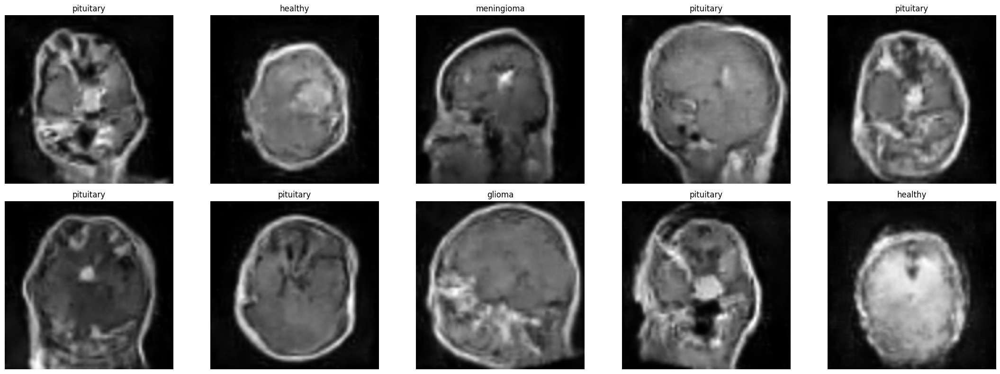

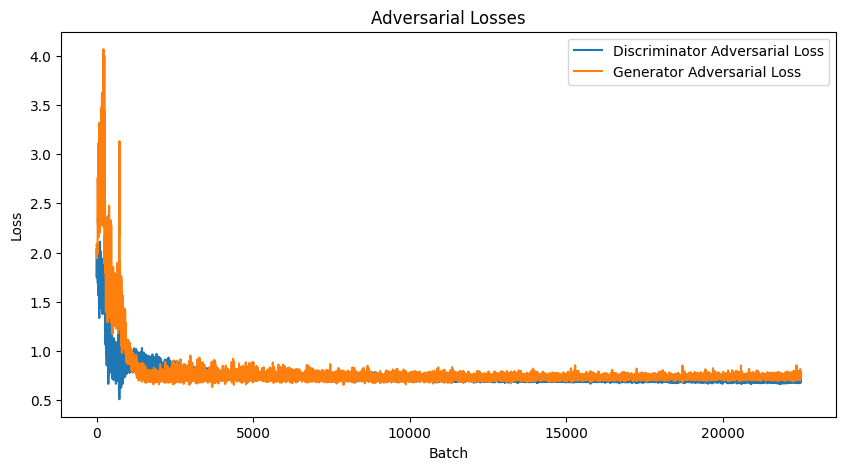

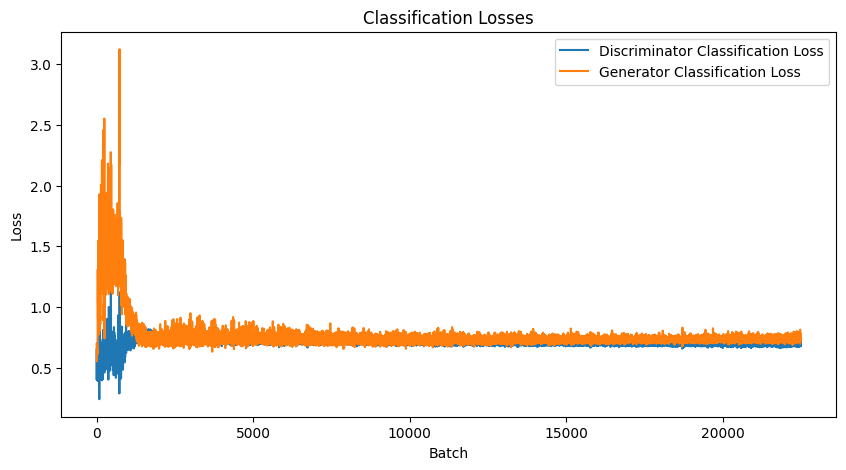

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# This code was adapted from a response generated by ChatGPT, provided by OpenAI.

# Set seed for reproducibility
SEED = 42
np.random.seed(SEED)

# Assume 'subfolders' is a list containing the names of the different classes and get the total number of classes
num_classes = len(subfolders)

# Convert labels to one-hot encoding to make it compatiable for multi class classification and to ensure compataibilty with loss function
y_train_one_hot = to_categorical(y_train_org, num_classes=num_classes)

# Initialize lists for storing loss values
d_losses = []
g_losses = []

# Training ratio: how many times the generator is trained per discriminator training step
TRAINING_RATIO = 1

for epoch in range(EPOCHS):
    for batch in tqdm(range(STEPS_PER_EPOCH)): # Use tqdm to show a progress bar for each epoch
        # Training the discriminator
        noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM)) # Generate random noise for the generator
        sampled_labels = np.random.randint(0, num_classes, BATCH_SIZE).reshape(-1, 1) # Randomly select labels for the fake images
        fake_X = generator.predict([noise, sampled_labels]) # Generate fake images using the generator

        idx = np.random.randint(0, X_train.shape[0], BATCH_SIZE) # Select a random batch of real images
        real_X = X_train[idx] # Get the real images
        real_labels = y_train_one_hot[idx] # Get the corresponding one-hot encoded labels for the real images

        # Train the discriminator on real images and real labels
        d_loss_real = discriminator.train_on_batch(real_X, [np.ones((BATCH_SIZE, 1)), real_labels])

        # Train the discriminator on fake images and fake labels
        d_loss_fake = discriminator.train_on_batch(fake_X, [np.zeros((BATCH_SIZE, 1)), to_categorical(sampled_labels, num_classes=num_classes)])

        # Calculate the average discriminator loss from real and fake data
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Training the generator
        for _ in range(TRAINING_RATIO):
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM)) # Generate new noise for the generator
            sampled_labels = np.random.randint(0, num_classes, BATCH_SIZE).reshape(-1, 1) # Randomly select new labels
            # Train the generator to fool the discriminator
            g_loss = combined.train_on_batch([noise, sampled_labels], [np.ones((BATCH_SIZE, 1)), to_categorical(sampled_labels, num_classes=num_classes)])

        # Store losses for later visualization
        d_losses.append(d_loss)
        g_losses.append(g_loss)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss[0]:.4f} Discriminator Loss: {d_loss[0]:.4f}")

    # Generate and display a sample of images to visualize progress
    noise = np.random.normal(0, 1, size=(10, NOISE_DIM))
    sampled_labels = np.random.randint(0, num_classes, 10).reshape(-1, 1)
    sample_images([noise, sampled_labels], (2, 5))

    # Plot the adversarial losses
    plt.figure(figsize=(10, 5))
    plt.plot(np.array(d_losses)[:, 0], label="Discriminator Adversarial Loss")
    plt.plot(np.array(g_losses)[:, 0], label="Generator Adversarial Loss")
    plt.title("Adversarial Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # Plot the classification losses
    plt.figure(figsize=(10, 5))
    plt.plot(np.array(d_losses)[:, 1], label="Discriminator Classification Loss")
    plt.plot(np.array(g_losses)[:, 1], label="Generator Classification Loss")
    plt.title("Classification Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Save weights after training so that it can be used for further use
generator.save_weights('generator_weights.h5')
discriminator.save_weights('discriminator_weights.h5')

# Download the weights
files.download('generator_weights.h5')
files.download('discriminator_weights.h5')

2/2 [==============================] - 4s 1s/step


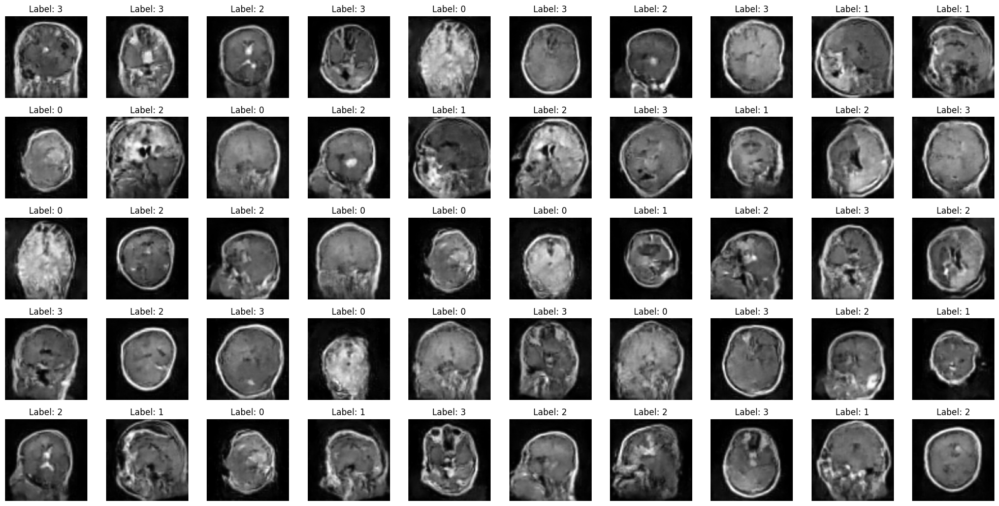

In [ ]:
def generate_images_from_test(generator, x_test, y_test, num_images=50):
    # Ensure num_images does not exceed the number of test samples
    num_images = min(num_images, len(x_test))

    # Generate random noise to generate synthetic samples
    noise = np.random.normal(0, 1, size=(num_images, NOISE_DIM))

    # Use labels from the test set
    sampled_labels = y_test[:num_images]

    # Generate synthetic images from the trained model
    generated_images = generator.predict([noise, sampled_labels])

    # Plot the generated images
    plt.figure(figsize=(20, 20))
    for i in range(num_images):
        plt.subplot(10, 10, i + 1)
        plt.imshow(generated_images[i, :, :, 0], cmap='gray')
        plt.title(f'Label: {sampled_labels[i]}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Load generator weights
generator.load_weights('generator_weights.h5')

# Generate and display images for specific test labels in x_test
generate_images_from_test(generator, X_test_org, y_test_org, num_images=50)

In [ ]:
# Function to generate and save images from the test set using the ACGAN generator
def generate_images_from_test(generator, num_images_per_label=1000, save_path='synthetic_image'):
    NOISE_DIM = 100  # Define the noise vector dimension to generate synthetic images
    labels = [0, 1, 2, 3]  # Define the class labels (ClassES = 4)

    # Create the main directory and subdirectories for saving the generated images
    os.makedirs(save_path, exist_ok=True)  # Create the main save directory if it doesn't exist
    for label in labels:
        os.makedirs(os.path.join(save_path, f'class_{label}'), exist_ok=True)  # Create subdirectories for each class

    # Generate and save a specified number of images for each label
    for label in labels:
        for i in range(num_images_per_label):
            # Generate a random noise vector
            noise = np.random.normal(0, 1, size=(1, NOISE_DIM))

            # Create an array for the label used as input to the generator
            sampled_labels = np.array([label])

            # Use the generator model to produce an image based on the noise and label
            generated_image = generator.predict([noise, sampled_labels])

            # Save the generated image to the appropriate class folder
            label_folder = os.path.join(save_path, f'class_{label}')  # Define the path to the class folder
            # Save the image as a grayscale PNG file
            plt.imsave(os.path.join(label_folder, f'generated_image_{i}.png'), generated_image[0, :, :, 0], cmap='gray')

# Load generator weights from the saved file
generator.load_weights('generator_weights.h5')

# Generate and save 1000 images for each label (4 classes, 4000 images total)
generate_images_from_test(generator, num_images_per_label=1000, save_path='synthetic_image')


1/1 [==============================] - 0s 21ms/step


In [ ]:
# Module to zip and download the synthetic images generated by the generator
import shutil
from google.colab import files

# Path to the folder where we want to download
folder_path = 'synthetic_image'
zip_file = 'synthetic_image.zip'

# Zipping the folder
shutil.make_archive(folder_path, 'zip', folder_path)

# Downloading the zip file
files.download(zip_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**U-NET**

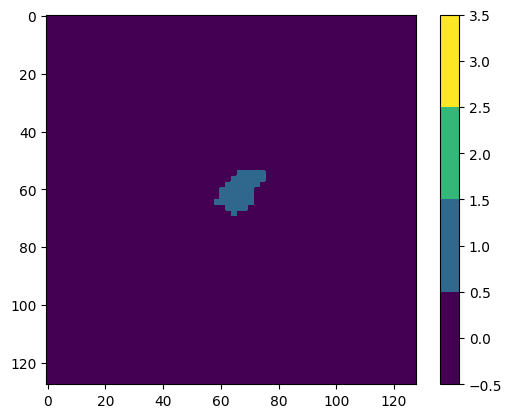

In [ ]:
# Plotting a segmentation image from the dataset
some_seg_img = z_train_org # Assigning the segmentation images dataset to a variable

# Create a colormap with 4 discrete colors using the 'viridis' color map
cmap = plt.cm.get_cmap('viridis', 4)

# Normalize the color scale to match the class labels for 4 different classes of tumors
norm = plt.Normalize(vmin=-0.5, vmax=3.5)

# Plot the 100th segmentation image in the dataset
plt.imshow(some_seg_img[100, :, :], cmap=cmap, norm=norm) # Display the image using the specified colormap and normalization
plt.colorbar() # Add a colorbar to the plot to show the mapping of colors to class labels

In [ ]:
# Selecting the first 100 segmentation images from the dataset
seg_samples = z_train_org[0:100]

# Initializing variables to keep track of the maximum number of unique values in any segmentation image
saved_values = []  # Used to store the unique values of the image with the maximum number of unique values
max_nb_values = 0  # Keeps track of the maximum number of unique values found

# Loop through each segmentation image in the selected sample
for sample in seg_samples:
    seg_img = sample  # Current segmentation image
    unique_values = np.unique(seg_img)  # Get all unique values in the segmentation image
    nb_unique_values = len(unique_values)  # Count the number of unique values

    # If the current image has more unique values than the previous maximum, update the tracking variables
    if nb_unique_values > max_nb_values:
        max_nb_values = nb_unique_values  # Update the maximum number of unique values
        saved_values = unique_values  # Save the unique values of this image

# Prints the maximum number of unique values found across all segmentation images
print(f"Maximum number of values in all segmentation images: {max_nb_values}")
# Prints the unique values corresponding to the image with the most unique values
print(f"Values: {saved_values}")

# Calculates the unique values and their counts in the entire segmentation dataset
values, counts = np.unique(some_seg_img, return_counts=True)
# Prints the counts of each unique value in the dataset
print(counts)


Maximum number of values in all segmentation images: 4
Values: [0 1 2 3]
[66627571   382733   336566   106058]


In [ ]:
# Defining the range of slices to use from the 3D volume data
VOLUME_START_AT = 60  # Start extracting slices from this index
VOLUME_SLICES = 75  # Number of slices to extract from the volume
IMG_SIZE = 128  # Size to which each image slice will be resized (128x128 pixels)

In [ ]:
# This code was adapted from a response generated by ChatGPT, provided by OpenAI.

# Custom data generator class for Keras
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras models'

    def __init__(self, images, masks, labels, batch_size=32, dim=(128, 128), n_channels=1, n_classes=4, shuffle=True):
        self.images = images  # Input images
        self.masks = masks  # Corresponding segmentation masks
        self.labels = labels  # Labels for each image
        self.batch_size = batch_size  # Number of samples per batch
        self.dim = dim  # Dimensions of the input images (128x128 pixels)
        self.n_channels = n_channels  # Number of image channels (1 for grayscale)
        self.n_classes = n_classes  # Number of classes in the segmentation mask
        self.shuffle = shuffle  # Whether to shuffle the data after each epoch
        self.on_epoch_end()  # Initialize the index array and shuffle if necessary

    def __len__(self):
        'Denotes the number of batches per epoch'
        # Returns the number of batches per epoch based on the dataset size and batch size
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generates indices for the current batch
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

        # Selects the images and masks corresponding to the current batch
        images_batch = self.images[indexes]
        masks_batch = self.masks[indexes]

        # Generates data and return the batch
        X, y = self.__data_generation(images_batch, masks_batch)
        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        # Creates an array of indices for the dataset
        self.indexes = np.arange(len(self.images))

        # Shuffles the indices if shuffle is set to True
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, images_batch, masks_batch):
        'Generates data containing batch_size samples'
        # Initializing the arrays to hold the batch data
        X = np.zeros((self.batch_size, *self.dim, self.n_channels))  # Batch of images
        y = np.zeros((self.batch_size, *self.dim, self.n_classes))  # Batch of corresponding masks (one-hot encoded)

        # Processing each image and its corresponding mask in the batch
        for i, (img, mask) in enumerate(zip(images_batch, masks_batch)):
            # Expanding image dimensions to add the channel dimension (e.g., from 128x128 to 128x128x1)
            X[i,] = np.expand_dims(img, axis=-1)

            # Converts the segmentation mask to one-hot encoding
            mask_one_hot = tf.keras.utils.to_categorical(mask, num_classes=self.n_classes)

            # Stores the one-hot encoded mask in the batch array
            y[i,] = mask_one_hot

        # Returns the generated batch of images and masks
        return X, y

# Creating instances of the data generator for training, validation, and testing datasets
training_generator = DataGenerator(X_train_org, z_train_org, y_train_org)
valid_generator = DataGenerator(X_val_org, z_val_org, y_val_org)
test_generator = DataGenerator(X_test_org, z_test_org, y_test_org)

In [ ]:
# Function to build a U-Net model for image segmentation
# The code is inspired by: "Brain Tumor Segmentation | UNet | Dice coef: 89.6%" on Kaggle.
# https://www.kaggle.com/code/abdallahwagih/brain-tumor-segmentation-unet-dice-coef-89-6

def build_unet(inputs, ker_init, dropout):
    # Encoder path (downsampling)
    # Follows typical UNET architecture. 2 convolutional layer followed by 1 max pooling layer
    # In each convolutional block we set "padding = same" due to which in each convolutional layer the dimension is not changed.
    # Dimension changes only during the pooling.
    # First convolutional block with 32 filters to extract the features from provided input
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer=ker_init)(inputs)
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv1)

    # First pooling layer (downsampling)
    # Reduces the spatial dimension by half (input image of 128x128 is reduced to feature dimension of 64x64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    # Second convolutional block
    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer=ker_init)(pool1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv2)

    # Second pooling layer (downsampling) (Reduced to 32X32)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Third convolutional block
    conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer=ker_init)(pool2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv3)

    # Third pooling layer (downsampling) (Reduced to 16X16)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Fourth convolutional block
    conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer=ker_init)(pool3)
    conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv4)

    # Fourth pooling layer (downsampling) (Reduced to 8X8)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck layer (deepest part of the network)
    # Uses maximum number of filters in our architecture i.e. 512 numbers of filters
    conv5 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer=ker_init)(pool4)
    conv5 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv5)
    drop5 = Dropout(dropout)(conv5)  # Applying dropout for regularization to prevent overfitting

    # Decoder path (upsampling)
    # uses the spatial information lost during encoding through skip connection and other learned features during convolution to reconstruct the segmentation map

    # First upsampling and concatenation
    up6 = Conv2D(256, 2, activation='relu', padding='same', kernel_initializer=ker_init)(UpSampling2D(size=(2, 2))(drop5))
    merge6 = concatenate([conv4, up6], axis=3)  # Skip connection from the corresponding downsampling layer
    conv6 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer=ker_init)(merge6)
    conv6 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv6)

    # Second upsampling and concatenation
    up7 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer=ker_init)(UpSampling2D(size=(2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis=3)  # Skip connection from the corresponding downsampling layer
    conv7 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer=ker_init)(merge7)
    conv7 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv7)

    # Third upsampling and concatenation
    up8 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer=ker_init)(UpSampling2D(size=(2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis=3)  # Skip connection from the corresponding downsampling layer
    conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer=ker_init)(merge8)
    conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv8)

    # Fourth upsampling and concatenation
    up9 = Conv2D(32, 2, activation='relu', padding='same', kernel_initializer=ker_init)(UpSampling2D(size=(2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis=3)  # Skip connection from the corresponding downsampling layer
    conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer=ker_init)(merge9)
    conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer=ker_init)(conv9)

    # Final convolutional layer that maps to the output classes (using softmax activation for multi-class segmentation)
    conv10 = Conv2D(4, 1, activation='softmax')(conv9)  # 4 output channels for 4 classes

    # Return the U-Net model
    return Model(inputs=inputs, outputs=conv10)

In [ ]:
# This code was adapted from a response generated by ChatGPT, provided by OpenAI.
# Compute metric between the predicted segmentation and the ground truth

def dice_coef(y_true, y_pred, smooth=1.0):
    class_num = 4  # Number of classes in the segmentation
    total_loss = 0  # Initializing the total Dice loss

    # Calculating the Dice coefficient for each class separately
    for i in range(class_num):
        y_true_f = K.flatten(y_true[:,:,:,i])  # Flattening the ground truth segmentation for class i
        y_pred_f = K.flatten(y_pred[:,:,:,i])  # Flattening the predicted segmentation for class i

        intersection = K.sum(y_true_f * y_pred_f)  # Computing the intersection between the true and predicted values

        # Computing the Dice coefficient for class i
        loss = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

        total_loss += loss  # Accumulating the Dice coefficient for each class

    total_loss = total_loss / class_num  # Averaging the Dice coefficients across all classes
    return total_loss  # Returning the mean Dice coefficient


def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))  # Counting the number of true positives
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))  # Counting the number of predicted positives

    # Precision is the ratio of true positives to all predicted positives
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision  # Returning the precision

def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))  # Counting the number of true positives
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))  # Counting the number of actual positives (in the ground truth)

    # Sensitivity (Recall) is the ratio of true positives to all actual positives
    return true_positives / (possible_positives + K.epsilon())  # Returning the sensitivity


def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))  # Counting the number of true negatives
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))  # Counting the number of actual negatives (in the ground truth)

    # Specificity is the ratio of true negatives to all actual negatives
    return true_negatives / (possible_negatives + K.epsilon())  # Returning the specificity


In [ ]:
# Defining input data shape
input_layer = Input((IMG_SIZE, IMG_SIZE, 1))
# IMG_SIZE is the dimension of the input image (e.g., 128x128 pixels)
# The input layer expects grayscale images, hence the single channel (1).

# Building the U-Net model
model = build_unet(input_layer, 'he_normal', 0.2)
# build_unet is a function that constructs the U-Net architecture.
# 'he_normal' is used as the kernel initializer, which helps in initializing the weights.
# 0.2 represents the dropout rate, where 20% of the units are dropped during training to prevent overfitting.

# Compiling the model with appropriate loss function, optimizer, and evaluation metrics
model.compile(
    loss="categorical_crossentropy",  # Categorical crossentropy is used as the loss function for multi-class segmentation.
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # Adam optimizer with a learning rate of 0.001
    metrics=[
        'accuracy',  # Measures the overall accuracy of the model
        tf.keras.metrics.MeanIoU(num_classes=4),  # Mean Intersection over Union (IoU) for 4 classes
        dice_coef,  # Custom metric: Dice coefficient for overlap between prediction and ground truth
        precision,  # Custom metric: Precision, the accuracy of positive predictions
        sensitivity,  # Custom metric: Sensitivity (Recall), the ability to identify positive instances
        specificity  # Custom metric: Specificity, the ability to identify negative instances
    ]
)


In [ ]:
# Defining callbacks to enhance the training process

callbacks = [
    # Reducing learning rate when a metric has stopped improving
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',  # Monitor the validation loss to decide when to reduce the learning rate
        factor=0.2,  # Reduce the learning rate by a factor of 0.2 (i.e. new_lr = old_lr * 0.2)
        patience=2,  # Number of epochs with no improvement after which the learning rate will be reduced
        min_lr=0.000001,  # Lower bound for the learning rate; it will not go below this value
        verbose=1  # Verbosity mode; 1 = update messages
    ),

    # Save the model after every epoch if the validation loss has improved
    tf.keras.callbacks.ModelCheckpoint(
        filepath='model_.{epoch:02d}-{val_loss:.6f}.h5',  # Filepath template to save the model weights
        verbose=1,
        save_best_only=True,  # Only save the model if the current epoch's validation loss is the best so far
        save_weights_only=True  # Only save the weights (not the entire model)
    ),

    # Log details to a CSV file
    CSVLogger('training.log', separator=',', append=False)  # Log training and validation metrics to 'training.log'
    # separator=',' specifies the delimiter used in the CSV file
    # append=False means the file will be overwritten each time the training starts
]


In [ ]:
# Train the model using the fit method

model.fit(
    training_generator,
    epochs=35,
    steps_per_epoch=len(training_generator),
    callbacks=callbacks,
    validation_data=valid_generator
)

Epoch 1/35


KeyboardInterrupt: 

In [ ]:
# Read the CSVlogger file that contains all our metrics (accuracy, loss, dice_coef, ...) of our training
history = pd.read_csv('training.log', sep=',', engine='python')

# Plot training and validation metrics
# Using subplot to plot Accuracy vs Epoch graph
fig, axs = plt.subplots(1, 4, figsize=(16, 8))

axs[0].plot(history['epoch'], history['accuracy'], 'b', label='Training Accuracy')
axs[0].plot(history['epoch'], history['val_accuracy'], 'r', label='Validation Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].legend()

# Using subplot to plot Loss vs Epoch graph
axs[1].plot(history['epoch'], history['loss'], 'b', label='Training Loss')
axs[1].plot(history['epoch'], history['val_loss'], 'r', label='Validation Loss')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].legend()

# Using subplot to plot Dice Coefficient vs Epoch graph
axs[2].plot(history['epoch'], history['dice_coef'], 'b', label='Training dice coef')
axs[2].plot(history['epoch'], history['val_dice_coef'], 'r', label='Validation dice coef')
axs[2].set_xlabel('Epoch')
axs[2].set_ylabel('Dice Coefficient')
axs[2].legend()

# Using subplot to plot Mean IOU vs Epoch graph
axs[3].plot(history['epoch'], history['mean_io_u_2'], 'b', label='Training mean IOU')
axs[3].plot(history['epoch'], history['val_mean_io_u_2'], 'r', label='Validation mean IOU')
axs[3].set_xlabel('Epoch')
axs[3].set_ylabel('Mean IOU')
axs[3].legend()

# Add space between subplots
plt.subplots_adjust(wspace=0.4)
plt.savefig('training_metrics_unet.png')

plt.show()

In [ ]:
# Make predictions on the test set using the trained model
predicted_masks = model.predict(test_generator)

In [ ]:
# Function to plot and save real image, real mask, and predicted mask
def plot_predictions(images, true_masks, predicted_masks, num_samples=3, save_path='predictions'):
    # Ensure the save directory exists
    os.makedirs(save_path, exist_ok=True)

    for i in range(num_samples):
        plt.figure(figsize=(12, 6))

        # Plot real image
        plt.subplot(1, 3, 1)
        plt.title('Real Image')
        plt.imshow(images[i].squeeze(), cmap='gray')

        # Plot real mask
        plt.subplot(1, 3, 2)
        plt.title('Real Mask')
        plt.imshow(np.argmax(true_masks[i], axis=-1), cmap='viridis')

        # Plot predicted mask
        plt.subplot(1, 3, 3)
        plt.title('Predicted Mask')
        plt.imshow(np.argmax(predicted_masks[i], axis=-1), cmap='viridis')

        # Save the plot
        plt.savefig(os.path.join(save_path, f'prediction_{i}.png'))

        plt.show()

# Select a batch of images and masks from the test set
test_images, test_masks = next(iter(test_generator))

# Predict masks for the selected batch
predicted_masks = model.predict(test_images)

# Plot and save predictions
plot_predictions(test_images, test_masks, predicted_masks, num_samples=5, save_path='predictions')

In [ ]:
# Evaluating the model on the test data
results = model.evaluate(test_generator, batch_size=100, callbacks=callbacks)

# List of metric descriptions in the same order as they are returned by model.evaluate()
descriptions = ["Loss", "Accuracy", "MeanIOU", "Dice coefficient", "Precision", "Sensitivity", "Specificity"]

# Combining the results and descriptions into a list of tuples
results_list = zip(results, descriptions)

# Displaying each metric with its description
print("\nModel evaluation on the test set:")
print("==================================")
for i, (metric, description) in enumerate(results_list):
    print(f"{description} : {round(metric, 4)}")


In [ ]:
# Load the training log
history = pd.read_csv('training.log', sep=',', engine='python')

# Find the epoch with the lowest validation loss
best_epoch = history['val_loss'].idxmin()

# Print the best epoch and corresponding validation loss
best_epoch_num = history.loc[best_epoch, 'epoch']
best_val_loss = history.loc[best_epoch, 'val_loss']
print(f"Best Epoch: {best_epoch_num}, Validation Loss: {best_val_loss}")

# Assuming your model checkpoint files are named in the format 'model_.epoch-val_loss.h5'
model_filename = f'model_.{best_epoch_num:02d}-{best_val_loss:.6f}.h5'
print(f"Best Model Checkpoint Filename: {model_filename}")

In [ ]:
# Load the weights
model.load_weights('model_.33-0.012833.h5')

In [ ]:
# Evaluate the model on the test set
test_loss, test_acc, test_miou, test_dice, test_precision, test_sensitivity, test_specificity = model.evaluate(test_generator)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_acc}')
print(f'Test Mean IoU: {test_miou}')
print(f'Test Dice Coefficient: {test_dice}')
print(f'Test Precision: {test_precision}')
print(f'Test Sensitivity: {test_sensitivity}')
print(f'Test Specificity: {test_specificity}')

In [ ]:
# Function to plot and save real image, real mask, and predicted mask
def plot_predictions(images, true_masks, predicted_masks, num_samples=3, save_path='predictions'):
    # Ensure the save directory exists
    os.makedirs(save_path, exist_ok=True)
    # 'os.makedirs' creates the directory if it doesn't exist, ensuring that the folder is ready to save images.
    # 'exist_ok=True' prevents an error if the directory already exists.

    for i in range(num_samples):
        plt.figure(figsize=(12, 6))

        # Plot real image
        plt.subplot(1, 3, 1)
        plt.title('Real Image')
        plt.imshow(images[i].squeeze(), cmap='gray')
        # Display the i-th real image in grayscale.
        # 'squeeze()' removes any unnecessary dimensions, such as (128, 128, 1) becoming (128, 128).

        # Plot real mask
        plt.subplot(1, 3, 2)
        plt.title('Real Mask')
        plt.imshow(np.argmax(true_masks[i], axis=-1), cmap='viridis')
        # 'np.argmax(true_masks[i], axis=-1)' converts the one-hot encoded mask to its original form with class labels.

        # Plot predicted mask
        plt.subplot(1, 3, 3)
        plt.title('Predicted Mask')
        plt.imshow(np.argmax(predicted_masks[i], axis=-1), cmap='viridis')

        # Save the plot
        plt.savefig(os.path.join(save_path, f'prediction_{i}.png'))

        plt.show()

# Select a batch of images and masks from the test set
test_images, test_masks = next(iter(test_generator))

# Predict masks for the selected batch
predicted_masks = model.predict(test_images)

# Plot and save predictions
plot_predictions(test_images, test_masks, predicted_masks, num_samples=5, save_path='predictions')

**Classifier**

In [ ]:
# Works in similar way as defined in ACGAN module to unzip and extract the datasets
# This block of code unzips the zip folder where real and synthetic images generated by generator are combined together
import zipfile
import os

zip_file = '/content/combined_images.zip'

extract_to_directory = os.path.dirname(zip_file)

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_to_directory)

In [ ]:
# Same code as defined in ACGAN architecture to load the image and its corresponding labels
def load_images(main_folder, subfolders):
    imgs = []
    labels = []
    label_mapping = {folder: idx for idx, folder in enumerate(subfolders)}
    valid_extensions = ('.png', '.jpg', '.jpeg')

    for folder in subfolders:
        folder_path = os.path.join(main_folder, folder)
        for img_name in os.listdir(folder_path):
            if not img_name.lower().endswith(valid_extensions):
                continue
            img_path = os.path.join(folder_path, img_name)

            try:
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                img = cv2.resize(img, (128, 128))

                imgs.append(img)
                labels.append(label_mapping[folder])
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue

    imgs = np.array(imgs)
    labels = np.array(labels)

    return imgs, labels

main_folder = 'combined_images'
subfolders = ['0', '1', '2', '3']
images_syn, labels_syn = load_images(main_folder, subfolders)
print(images_syn.shape, labels_syn.shape)

(9490, 128, 128) (9490,)


In [ ]:
# Function to convert grayscale images to RGB by repeating the channels
def gray_to_rgb(images):
    return np.repeat(images[..., np.newaxis], 3, axis=-1)
    # images[..., np.newaxis]: Adds a new axis to the array, converting the shape from (num_images, height, width)
    # to (num_images, height, width, 1). This represents the single grayscale channel

    # np.repeat(..., 3, axis=-1): Repeats the single grayscale channel 3 times along the last axis (which is the channel axis)
    # to convert the image into an RGB format. The resulting shape will be (num_images, height, width, 3)

# Here, X_train_real and X_test_real are the real training and testing data
# 'gray_to_rgb' converts the images from grayscale to RGB
X_train_real_rgb = gray_to_rgb(X_train_org)
X_val_real_rgb = gray_to_rgb(X_val_org)
X_test_real_rgb = gray_to_rgb(X_test_org)
X_synthetic_rgb = gray_to_rgb(images_syn)

In [ ]:
# Printing the shape
print(X_train_real_rgb.shape)
print(X_val_real_rgb.shape)
print(X_test_real_rgb.shape)
print(X_synthetic_rgb.shape)

(4117, 128, 128, 3)
(686, 128, 128, 3)
(687, 128, 128, 3)
(9490, 128, 128, 3)


In [ ]:
# Define the base model with VGG16
# 'tf.keras.applications.VGG16' loads the VGG16 model architecture.
# 'weights=None' specifies that we are not using pre-trained weights; the model will be trained from scratch.
# 'input_shape=(128, 128, 3)' defines the shape of the input images: 128x128 pixels with 3 color channels (RGB).
# 'pooling='max'' applies global max pooling to the output of the last convolutional layer, reducing the spatial dimensions.
# 'include_top=False' excludes the final fully connected layers, allowing us to add custom layers on top.
basemodel = tf.keras.applications.VGG16(weights=None, input_shape=(128, 128, 3), pooling='max', include_top=False)

# Add custom layers on top of the base model
x = layers.Dropout(0.4)(basemodel.output) # adds a dropout making 40% of neurons inactive to prevent overfitting and basemodel.output is output
                                          # from the  VGG16 base model
x = layers.Dense(128)(x) # Dense layer with 128 neurons to combine features learned from VGG16 base model
x = layers.BatchNormalization()(x) # Apply normalization to help stabilize and accelerate training by reducing the internal covariate shift

x = layers.LeakyReLU(alpha=0.2)(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(32)(x) # Dense layer with 32 neurons
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU(alpha=0.2)(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(4, activation='softmax')(x)  # Assuming 4 classes for classification
                                              # Applies the softmax activation function, which converts the output to a probability distribution over the 4 classes.


# Compile the model, specifying the loss function, optimizer, and metrics to monitor during training.
# 'loss='sparse_categorical_crossentropy'' is used because the target labels are integers (not one-hot encoded).
# 'optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001)' uses the Adam optimizer with a very small learning rate for fine-tuning the model.
# 'metrics=['accuracy']' specifies that we want to track accuracy during training and evaluation.

m = models.Model(inputs=basemodel.input, outputs=x)
m.compile(loss='sparse_categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), metrics=['accuracy'])
m.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0   

In [ ]:
# Define callbacks
# Callbacks are functions that are executed during training at specific stages. They help in controlling the training process,
# saving models, and improving training efficiency.
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)
] # monitor='val_loss': This tells the callback to monitor the validation loss. If the validation loss stops improving, the training will be halted early.
  # patience=5: Training will stop if the validation loss does not improve for 5 consecutive epochs.
  # verbose=1: This will print messages when the training is stopped early.
  # restore_best_weights=True: After stopping, the model's weights will be restored to those of the epoch with the best validation loss.

# Train the model on the real dataset and validate on the validation set
history = m.fit(X_train_real_rgb, y_train_org, epochs=50, validation_data=(X_val_real_rgb, y_val_org), callbacks=callbacks)

# Save the trained classifier model
m.save_weights('classifier_weights.h5')

Epoch 1/50
129/129 [==============================] - ETA: 0s - loss: 1.6773 - accuracy: 0.3138
Epoch 1: val_loss improved from inf to 1.47314, saving model to best_model.h5
129/129 [==============================] - 29s 126ms/step - loss: 1.6773 - accuracy: 0.3138 - val_loss: 1.4731 - val_accuracy: 0.2449
Epoch 2/50
129/129 [==============================] - ETA: 0s - loss: 1.4503 - accuracy: 0.3959
Epoch 2: val_loss improved from 1.47314 to 1.04672, saving model to best_model.h5
129/129 [==============================] - 11s 86ms/step - loss: 1.4503 - accuracy: 0.3959 - val_loss: 1.0467 - val_accuracy: 0.6429
Epoch 3/50
128/129 [============================>.] - ETA: 0s - loss: 1.3353 - accuracy: 0.4509
Epoch 3: val_loss improved from 1.04672 to 0.98464, saving model to best_model.h5
129/129 [==============================] - 11s 86ms/step - loss: 1.3332 - accuracy: 0.4523 - val_loss: 0.9846 - val_accuracy: 0.6924
Epoch 4/50
129/129 [==============================] - ETA: 0s - loss: 

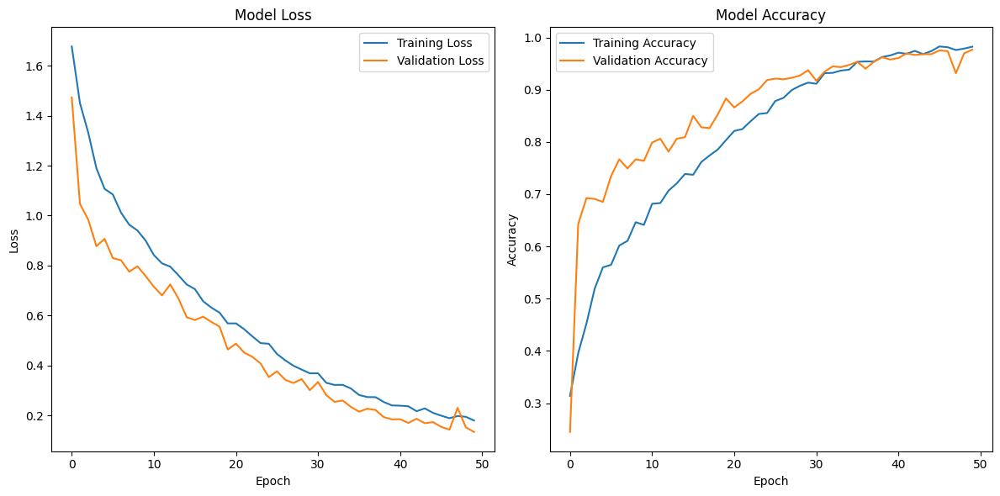

In [ ]:
# Plot training & validation loss values for the classifier
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training & validation accuracy values for the classifier
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.savefig('classifier_training_history.png')
plt.show()

In [ ]:
# Predicting classes of real images
# np.argmax is used to determine the class with highest probability
real_predictions = np.argmax(m.predict(X_test_real_rgb), axis=-1)

22/22 [==============================] - 1s 28ms/step


In [ ]:
# Evaluate classifier on real images
# m.evaluate runs the model on the test dataset to evaluate its performance.
real_loss, real_accuracy = m.evaluate(X_test_real_rgb, y_test_org)
print(f'Real Dataset - Loss: {real_loss}, Accuracy: {real_accuracy}')

22/22 [==============================] - 1s 29ms/step - loss: 0.1326 - accuracy: 0.9767
Real Dataset - Loss: 0.13261651992797852, Accuracy: 0.976710319519043


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Confusion matrix for real images
real_cm = confusion_matrix(y_test_org, real_predictions)
print('Confusion Matrix for Real Images:')
print(real_cm)

# Classification report for real images
real_cr = classification_report(y_test_org, real_predictions)
print('Classification Report for Real Images:')
print(real_cr)

Confusion Matrix for Real Images:
[[167   1   0   1]
 [  0 156   7   0]
 [  1   3 178   1]
 [  0   1   1 170]]
Classification Report for Real Images:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       169
           1       0.97      0.96      0.96       163
           2       0.96      0.97      0.96       183
           3       0.99      0.99      0.99       172

    accuracy                           0.98       687
   macro avg       0.98      0.98      0.98       687
weighted avg       0.98      0.98      0.98       687



In [ ]:
# Loading the saved weights
m.load_weights('classifier_weights.h5')

In [ ]:
# This code was adapted from a response generated by ChatGPT, provided by OpenAI.

from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Defining the number of splits for k-fold cross-validation
k = 5
kf = KFold(n_splits=k, shuffle=True, random_state=42)

# Initializing lists to store evaluation metrics
accuracy_scores = []
confusion_matrices = []
classification_reports = []

# Performing k-fold cross-validation
for train_index, test_index in kf.split(X_synthetic_rgb):
    # Spliting the data into training and test sets
    X_train, X_test = X_synthetic_rgb[train_index], X_synthetic_rgb[test_index]
    y_train, y_test = labels_syn[train_index], labels_syn[test_index]

    # Loading the weights before each fold evaluation
    m.load_weights('classifier_weights.h5')

    # Evaluating the classifier on the test set
    test_loss, test_accuracy = m.evaluate(X_test, y_test, verbose=0)
    accuracy_scores.append(test_accuracy)

    # Predicting classes of the test set
    test_predictions = np.argmax(m.predict(X_test), axis=-1)

    # Computes confusion matrix and classification report
    test_cm = confusion_matrix(y_test, test_predictions)
    test_cr = classification_report(y_test, test_predictions, output_dict=True)

    confusion_matrices.append(test_cm)
    classification_reports.append(test_cr)

# Calculates average accuracy across all folds
average_accuracy = np.mean(accuracy_scores)
print(f'Average Accuracy over {k} folds: {average_accuracy}')

# Aggregates confusion matrices
aggregate_cm = np.sum(confusion_matrices, axis=0)
print('Aggregated Confusion Matrix:')
print(aggregate_cm)

# Aggregates classification report metrics for class-specific metrics
class_labels = [label for label in classification_reports[0].keys() if label not in ('accuracy', 'macro avg', 'weighted avg')]
aggregate_cr = {label: {} for label in class_labels + ['accuracy', 'macro avg', 'weighted avg']}

for label in class_labels:
    for metric in classification_reports[0][label]:
        aggregate_cr[label][metric] = np.mean([fold[label][metric] for fold in classification_reports])

# Handles the overall metrics separately
for metric in ['macro avg', 'weighted avg']:
    for sub_metric in classification_reports[0][metric]:
        aggregate_cr[metric][sub_metric] = np.mean([fold[metric][sub_metric] for fold in classification_reports])

# Handles accuracy separately as it is a single float
aggregate_cr['accuracy'] = np.mean([fold['accuracy'] for fold in classification_reports])

# Prints the aggregated classification report in the desired format
print('Aggregated Classification Report:')
print(f"{' ':<20} {'precision':<10} {'recall':<10} {'f1-score':<10} {'support':<10}")
for label in class_labels:
    print(f"{label:<20} {aggregate_cr[label]['precision']:<10.2f} {aggregate_cr[label]['recall']:<10.2f} {aggregate_cr[label]['f1-score']:<10.2f} {aggregate_cr[label]['support']:<10.0f}")

for metric in ['macro avg', 'weighted avg']:
    print(f"{metric:<20} {aggregate_cr[metric]['precision']:<10.2f} {aggregate_cr[metric]['recall']:<10.2f} {aggregate_cr[metric]['f1-score']:<10.2f} {aggregate_cr[metric]['support']:<10.0f}")

print(f"{'accuracy':<20} {aggregate_cr['accuracy']:<10.2f}")


60/60 [==============================] - 2s 28ms/step
Average Accuracy over 5 folds: 0.8350895524024964
Aggregated Confusion Matrix:
[[1706   16  332  172]
 [ 204 1897  164   72]
 [ 141   38 2366    4]
 [ 284   49   89 1956]]
Aggregated Classification Report:
                     precision  recall     f1-score   support   
0                    0.73       0.77       0.75       445       
1                    0.95       0.81       0.87       467       
2                    0.80       0.93       0.86       510       
3                    0.89       0.82       0.85       476       
macro avg            0.84       0.83       0.83       1898      
weighted avg         0.84       0.84       0.84       1898      
accuracy             0.84      
